# Top Berkshire Hathaway's (Warren Buffet's) Stock Portfolio

**Analized by:** Maria Emilia Palacios & Rafaella Peraro de Andrade

- Warren Buffett is one of the most famous and influential investors of all time due to the outstanding performance of Berkshire Hathaway, a holding company with businesses in insurance, rail transportation, energy generation and distribution, manufacturing, and retailing. He is the chairman and CEO of the company, which has achieved compounded annualized gains of 19.8% since 1965—8.6 percentage points above the S&P 500's performance. He is also renowned for his fortune, worth more than $80 billion, and his influential philanthropic activities.

- He has always been transparent with his investment model, which is straightforward and based on consistency, focusing on investing in large blue-chip companies. Therefore, due to the consistency and proven efficacy of his investment model, his portfolio is worth analyzing. Beyond that, it not only impacts the companies he invests in but also the sectors they belong to, with his actions influencing several market movements.

In [1]:
!pip install --upgrade yfinance
!apt install -y -qq glpk-utils
!pip install pyomo
!pip install glpk
!pip install pmdarima
!pip install plotly

The following additional packages will be installed:
  libamd2 libcolamd2 libglpk40 libsuitesparseconfig5
Suggested packages:
  libiodbc2-dev
The following NEW packages will be installed:
  glpk-utils libamd2 libcolamd2 libglpk40 libsuitesparseconfig5
0 upgraded, 5 newly installed, 0 to remove and 29 not upgraded.
Need to get 625 kB of archives.
After this operation, 2,158 kB of additional disk space will be used.
Selecting previously unselected package libsuitesparseconfig5:amd64.
(Reading database ... 124947 files and directories currently installed.)
Preparing to unpack .../libsuitesparseconfig5_1%3a5.10.1+dfsg-4build1_amd64.deb ...
Unpacking libsuitesparseconfig5:amd64 (1:5.10.1+dfsg-4build1) ...
Selecting previously unselected package libamd2:amd64.
Preparing to unpack .../libamd2_1%3a5.10.1+dfsg-4build1_amd64.deb ...
Unpacking libamd2:amd64 (1:5.10.1+dfsg-4build1) ...
Selecting previously unselected package libcolamd2:amd64.
Preparing to unpack .../libcolamd2_1%3a5.10.1+dfsg-4bui

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
import yfinance as yf
import datetime
from datetime import date, timedelta
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_pacf
import statsmodels.api as sm
from statsmodels.tsa.filters.hp_filter import hpfilter
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.stattools import adfuller
from pylab import rcParams
from pmdarima import auto_arima
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse
import plotly.graph_objects as go
import plotly.express as px

##Bank of America

Bank of America (BAC) is a stock for a financial services company that offers banking and other services. BAC is one of the largest financial institutions in the United States

In [3]:
today = date.today()
end_date = today.strftime("2024-01-01")

d1 = date.today() - timedelta(days=1460)
start_date = d1.strftime("2019-01-01")

data = yf.download('BAC', start=start_date, end=end_date, progress=False)
data.reset_index(inplace=True)
df_BAC = data[["Date", "Open", "High", "Low", "Close", "Volume"]]

df_BAC.columns = df_BAC.columns.get_level_values(0)  # Removing the second level of my dataframe (Ticker BAC), since we are only analyzing one stock, there is no need for a MultiIndex
df_BAC.head()

YF.download() has changed argument auto_adjust default to True


Price,Date,Open,High,Low,Close,Volume
0,2019-01-02,20.791512,21.706753,20.731072,21.551334,71836300
1,2019-01-03,21.534065,21.620409,21.110983,21.205959,66599600
2,2019-01-04,21.672216,22.147104,21.611776,22.086664,83829100
3,2019-01-07,22.069393,22.259350,21.836267,22.069393,57016300
4,2019-01-08,22.207545,22.267986,21.663581,22.026224,67339400


In [4]:
df_BAC.describe()

Price,Date,Open,High,Low,Close,Volume
count,1258,1258.000000,1258.000000,1258.000000,1258.000000,1.258000e+03
mean,2021-06-30 18:48:38.918918912,29.951697,30.299750,29.601481,29.950576,5.312474e+07
min,2019-01-02 00:00:00,17.116612,17.480984,15.952398,16.067930,1.380540e+07
25%,2020-04-01 06:00:00,25.232645,25.539459,25.005074,25.270775,3.883972e+07
50%,2021-06-30 12:00:00,29.007110,29.335266,28.712479,29.083637,4.764715e+07
75%,2022-09-28 18:00:00,34.102347,34.456181,33.691725,34.056767,6.003378e+07
max,2023-12-29 00:00:00,46.127702,46.312550,45.314398,45.637871,2.184033e+08
std,NaN,6.255008,6.287371,6.204586,6.237900,2.312628e+07


In [5]:
df_BAC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1258 entries, 0 to 1257
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1258 non-null   datetime64[ns]
 1   Open    1258 non-null   float64       
 2   High    1258 non-null   float64       
 3   Low     1258 non-null   float64       
 4   Close   1258 non-null   float64       
 5   Volume  1258 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 59.1 KB


In [6]:
df_BAC.isnull().sum()

,0
Price,
Date,0
Open,0
High,0
Low,0
Close,0
Volume,0


###EDA

####Univariate

#####Histograms

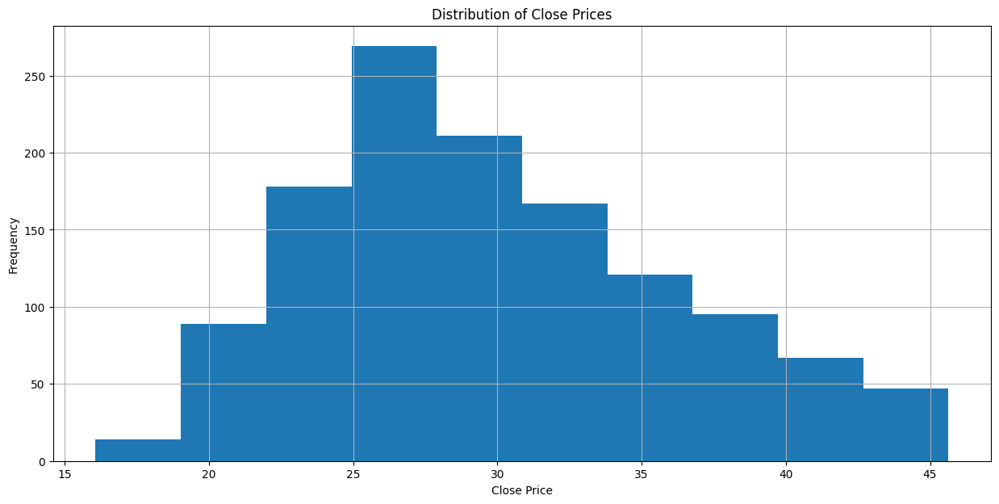

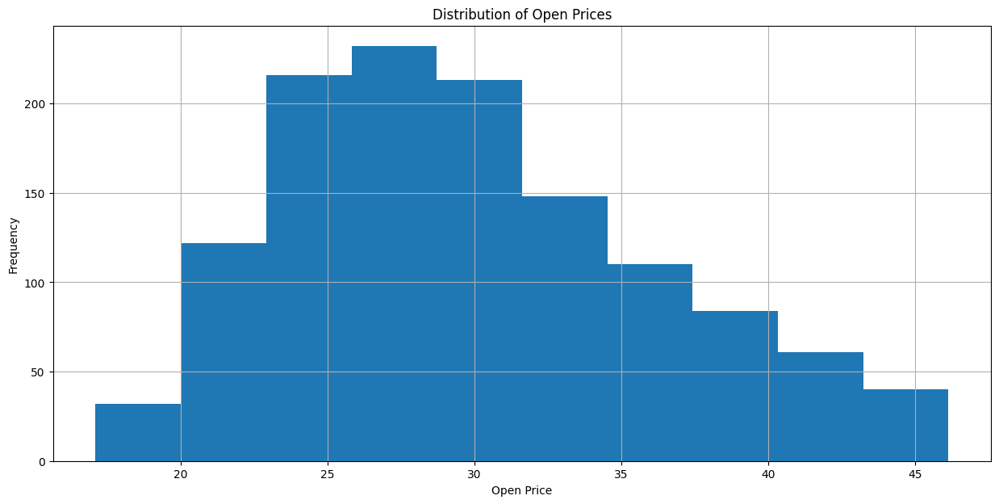

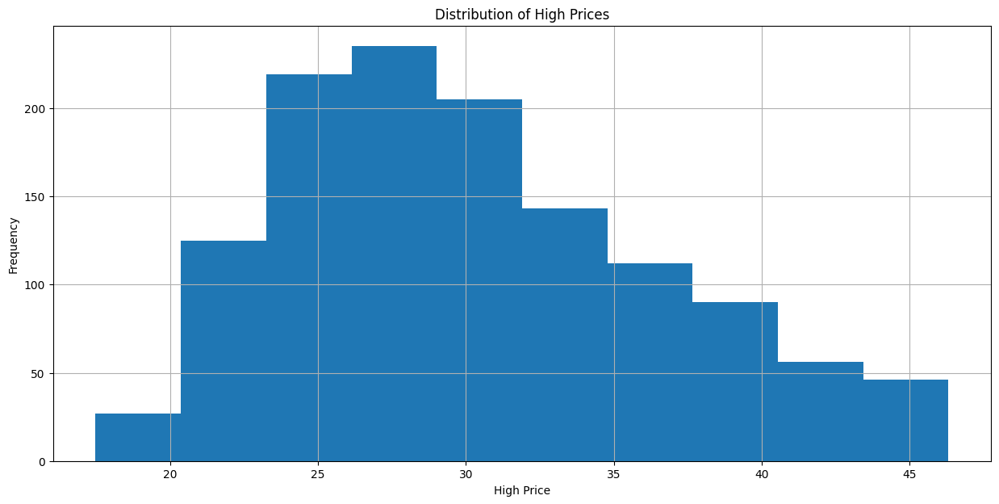

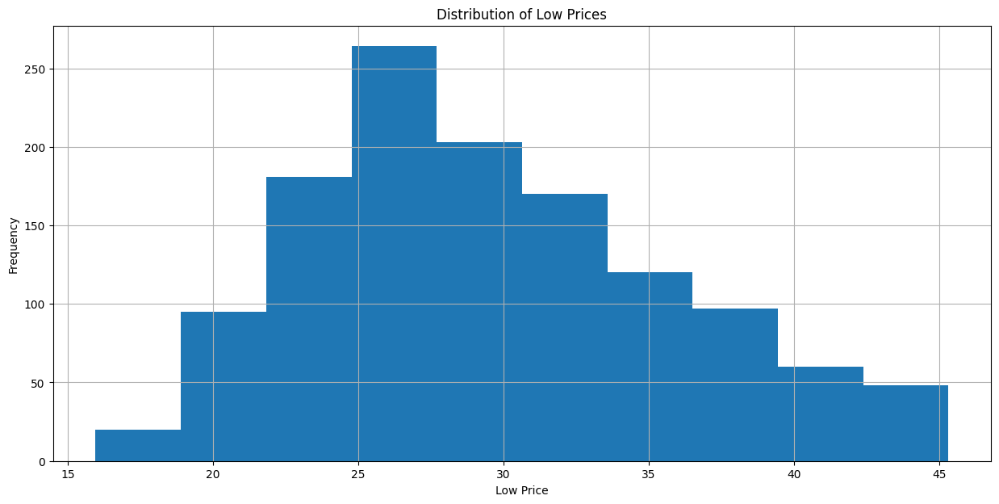

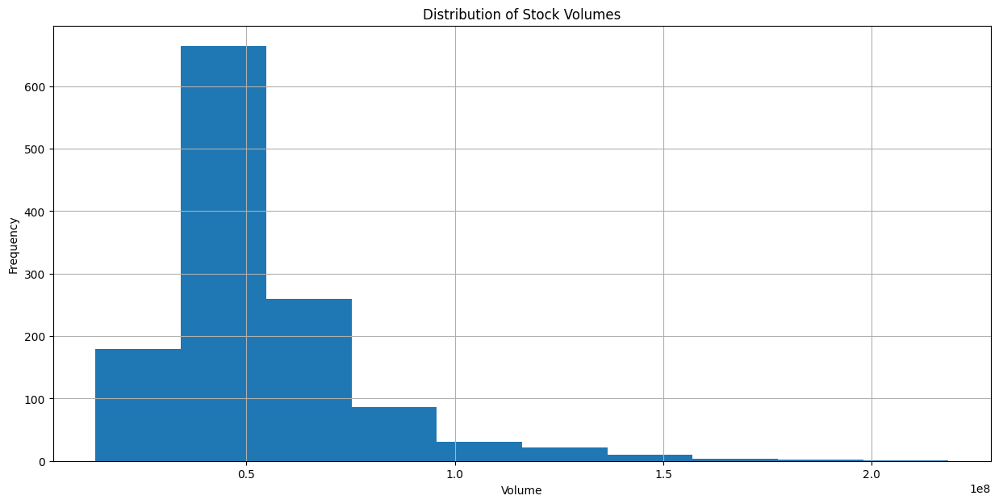

In [7]:
#Histograms

plt.subplots(figsize=(15,7))
plt.hist(df_BAC['Close'])
plt.grid(True)
plt.title('Distribution of Close Prices')
plt.xlabel('Close Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_BAC['Open'])
plt.grid(True)
plt.title('Distribution of Open Prices')
plt.xlabel('Open Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_BAC['High'])
plt.grid(True)
plt.title('Distribution of High Prices')
plt.xlabel('High Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_BAC['Low'])
plt.grid(True)
plt.title('Distribution of Low Prices')
plt.xlabel('Low Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_BAC['Volume'])
plt.grid(True)
plt.title('Distribution of Stock Volumes')
plt.xlabel('Volume')
plt.ylabel('Frequency')
plt.show()

**Analysis**

Closing Price

- The closing prices of BAC are normally distributed, with most values concentrated around $22 and $32

- We can notice a slight righ skew, that indicates that BAC has ahd some upward price movement, but largely spikes are not frequent

Opening price and high price

- They follow a similar distribution to closing price

- The range suggests that BAC'S daily highs rarely exceed $40, reinforcing that the stock trades within a predictable range.



#####Boxplots

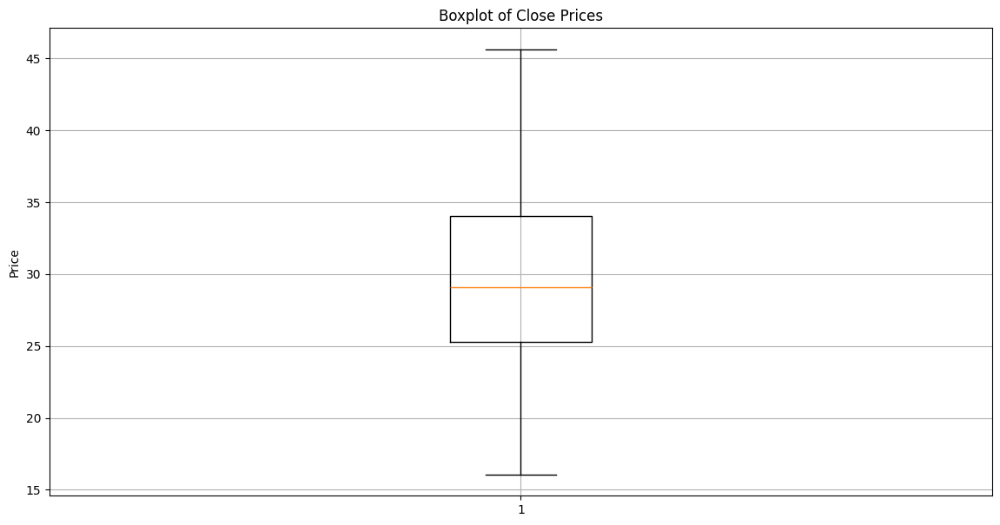

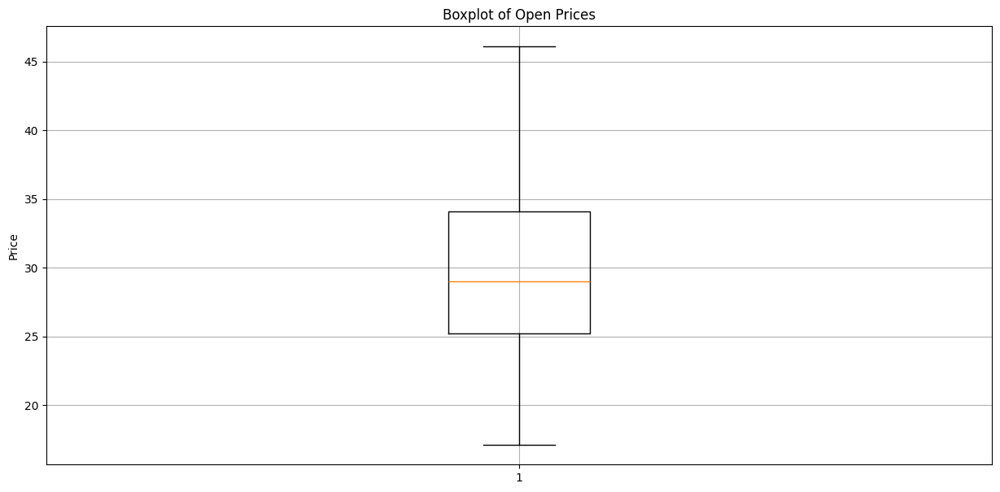

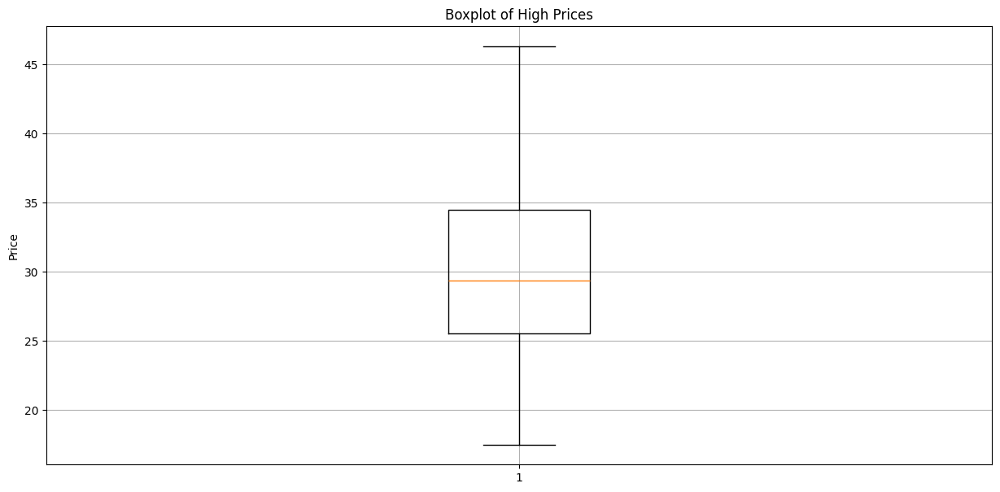

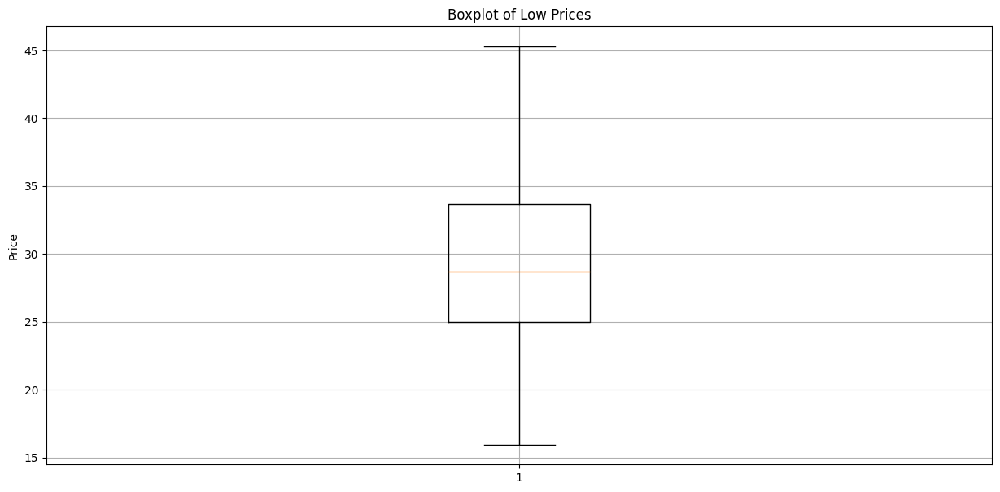

In [8]:
#Boxplots

plt.subplots(figsize=(14,7))
plt.boxplot(df_BAC['Close'])
plt.grid(True)
plt.title('Boxplot of Close Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(df_BAC['Open'])
plt.grid(True)
plt.title('Boxplot of Open Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(df_BAC['High'])
plt.grid(True)
plt.title('Boxplot of High Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(df_BAC['Low'])
plt.grid(True)
plt.title('Boxplot of Low Prices')
plt.ylabel('Price')
plt.show()

#####Linecharts

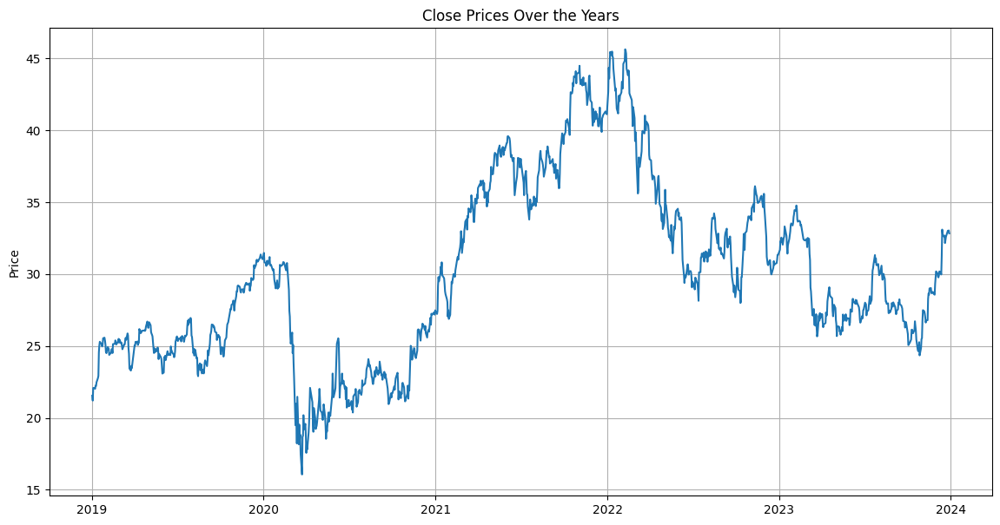

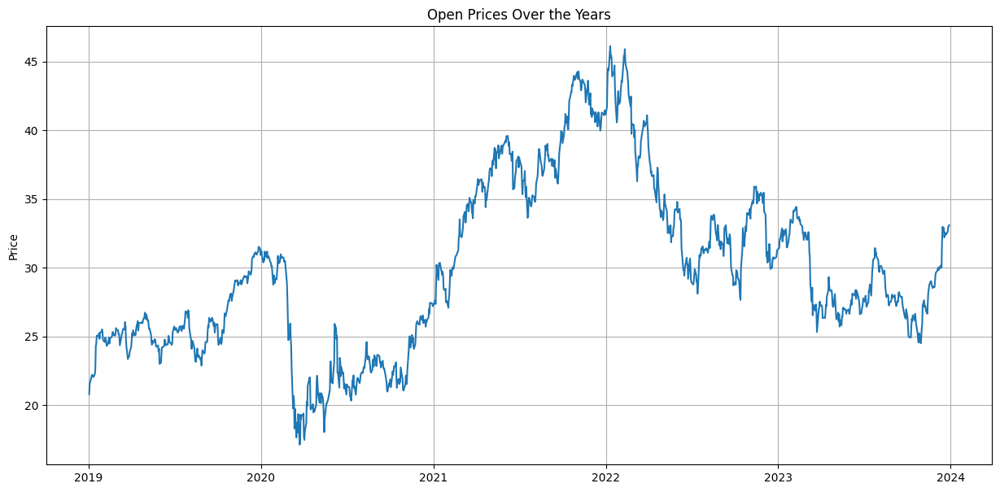

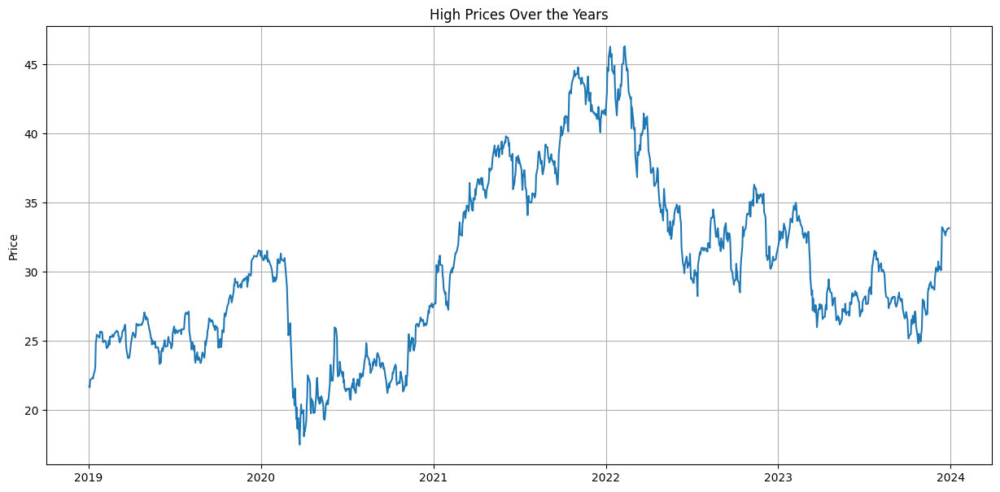

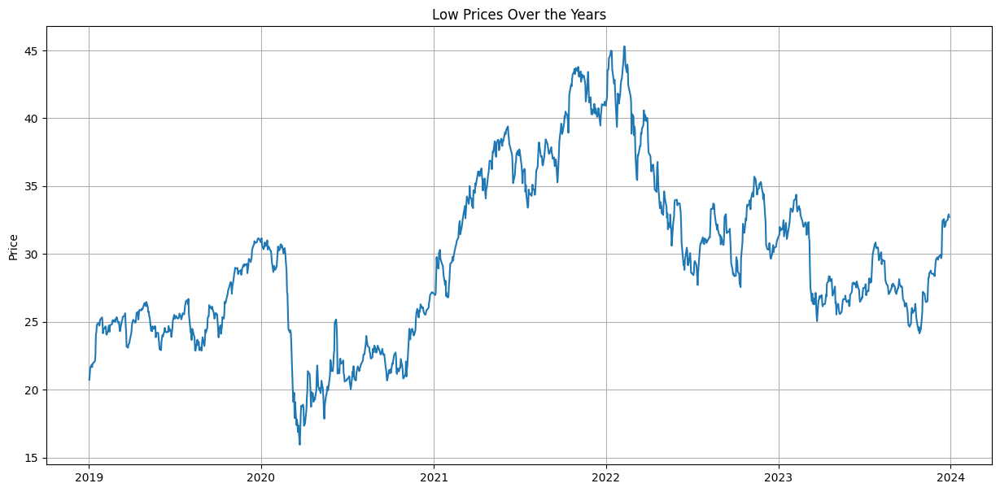

In [9]:
#Linecharts

plt.subplots(figsize=(14,7))
plt.plot(df_BAC['Date'], df_BAC['Close'])
plt.grid(True)
plt.title('Close Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(df_BAC['Date'], df_BAC['Open'])
plt.grid(True)
plt.title('Open Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(df_BAC['Date'], df_BAC['High'])
plt.grid(True)
plt.title('High Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(df_BAC['Date'], df_BAC['Low'])
plt.grid(True)
plt.title('Low Prices Over the Years')
plt.ylabel('Price')
plt.show()

**Analysis**

Closing Prices

- BAC shows a long-term upward trend, but we can see a significant drop in early 2020 which makes sense because of COVID-19 market crash, where the price fell below $20 before recovering

- BAC appear to be recovering after hitting a bottom in 2023

Opening and High Prices

- They follow the same trend as closing prices.

- Gaps betwee opening and closing prices are minimal, suggesting that BAC'A price movement are driven by intraday changes instead of after hours.


#####Time Series Components

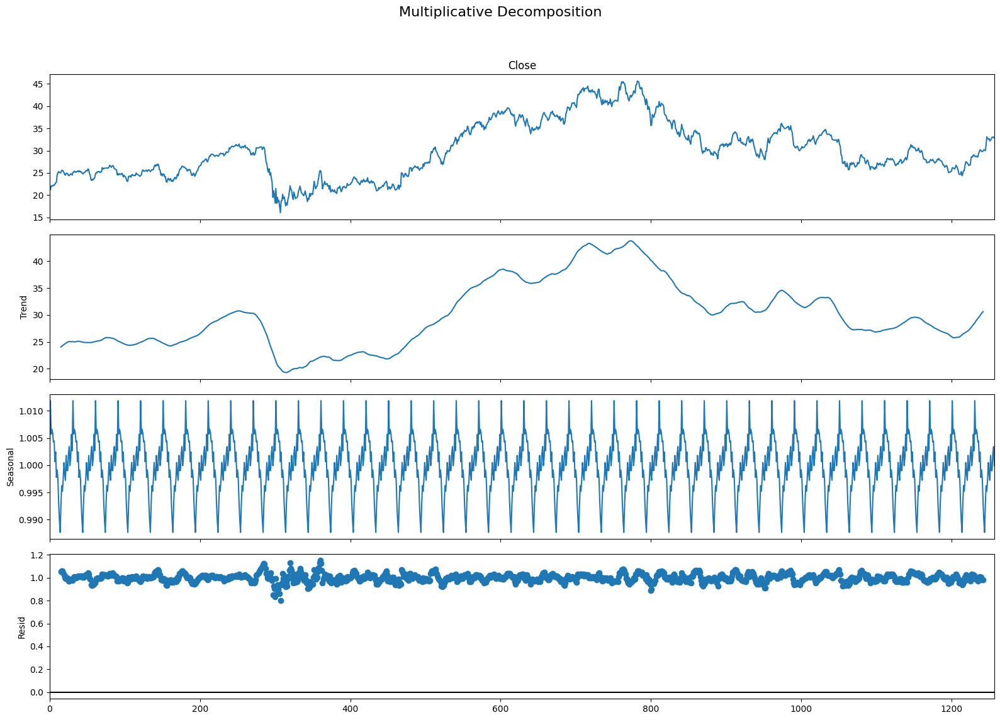

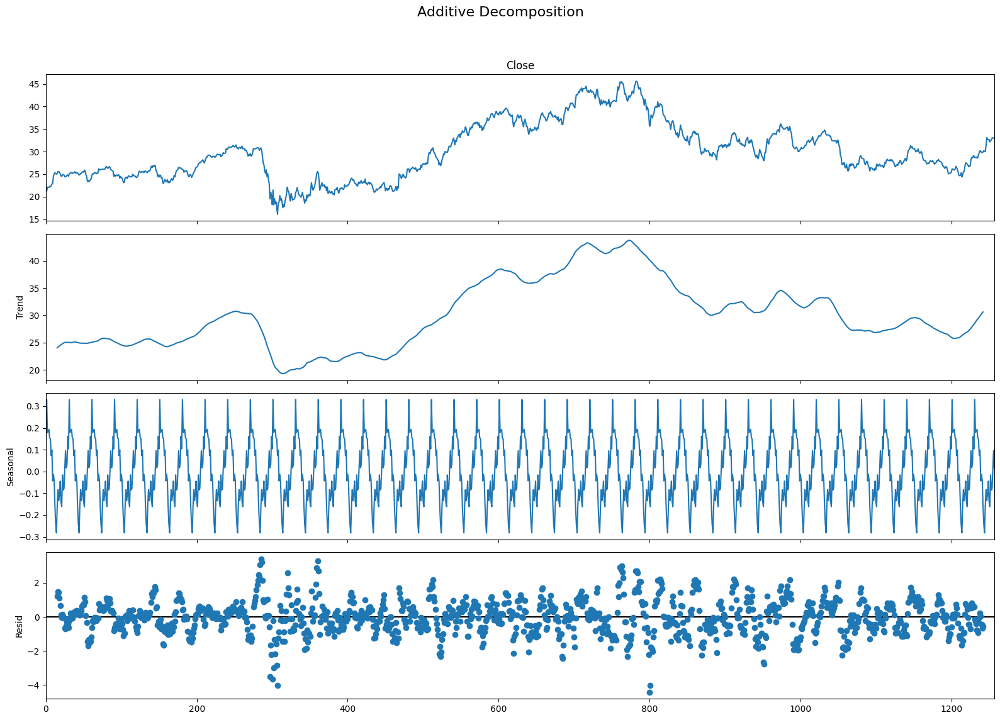

In [10]:
# Multiplicative Decomposition
multiplicative_decomposition = seasonal_decompose(df_BAC['Close'], model='multiplicative', period=30)

# Additive Decomposition
additive_decomposition = seasonal_decompose(df_BAC['Close'], model='additive', period=30)

# Plot
plt.rcParams.update({'figure.figsize': (16,12)})
multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

additive_decomposition.plot().suptitle('Additive Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

**Analysis**

1. Trend

- BAC shows a long-term growth trend reaching a peak above $45

- We can see a sharp decline in 2022, likely due to macroeconomic factors such as Federal reserve rate hikes impacting financial stocks.


2. Seasonality

- The seasonal component shows short-term fluctuations that repeat consistently over time.

- BAC shows high-frequency seasonal trends, indicating that the stock follows cyclycal patterns, that could be influenced by quarterly earning report and banking sector cycles

3. Residual Component

- The residual plot shows random fluctuatinons that are not explained by trend or seasonality

- The most recent residauals appear more stable, suggesting a period of normalization after the past volatility.

####Bivariate

<Axes: xlabel='Price', ylabel='Price'>

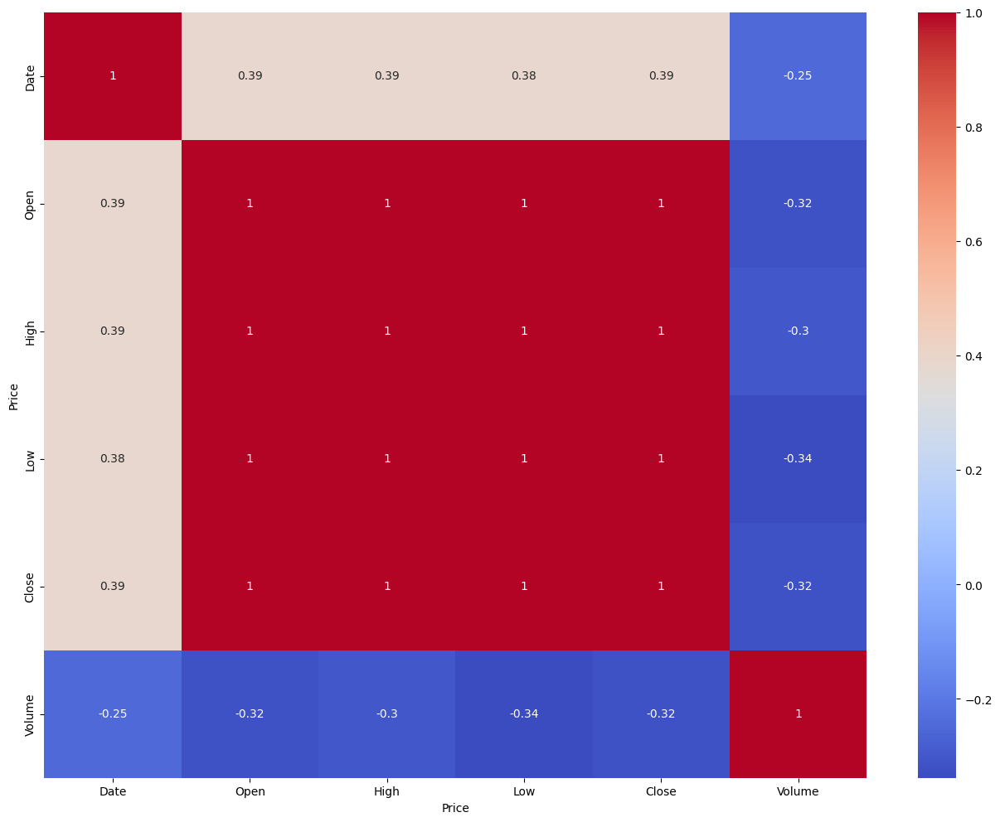

In [11]:
df_BAC.corr()
sns.heatmap(df_BAC.corr(), annot=True, cmap='coolwarm')

**Analysis**


1. Strong Correlations

- Open, high, low, and closing price are perfectly correlated (1.0)

- Date vs Prices (0.39): Suggests that over time, prices have shown an upward trend, but still the correlation is not extremely strong.

2. Negative Correlations

- Volume vs Prices (-0.3 to -0.34): when trading volume increases, stock prices tend to decrease.

####Multivariate

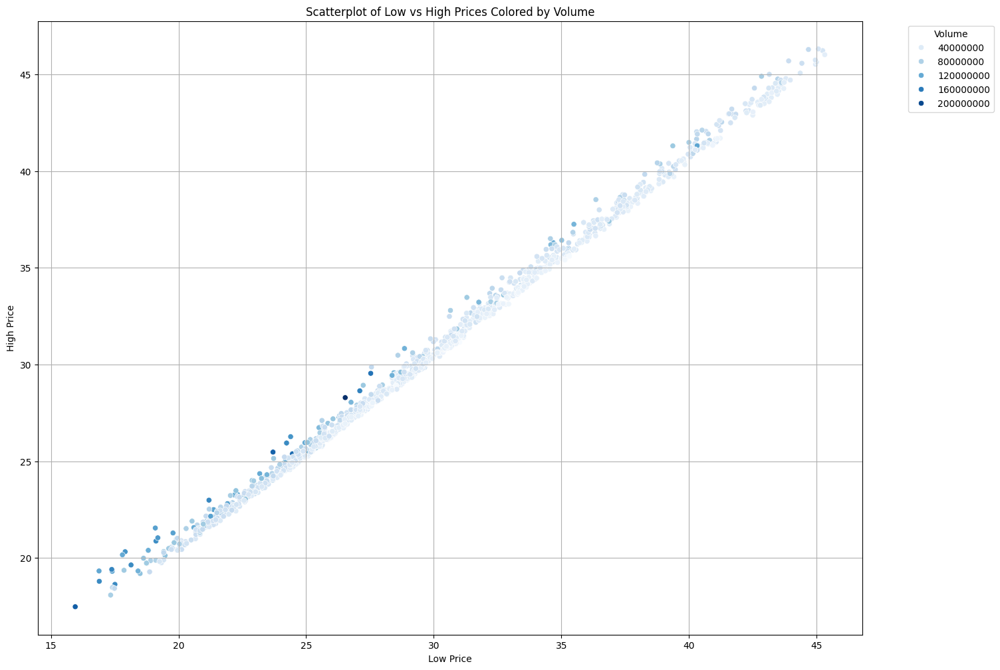

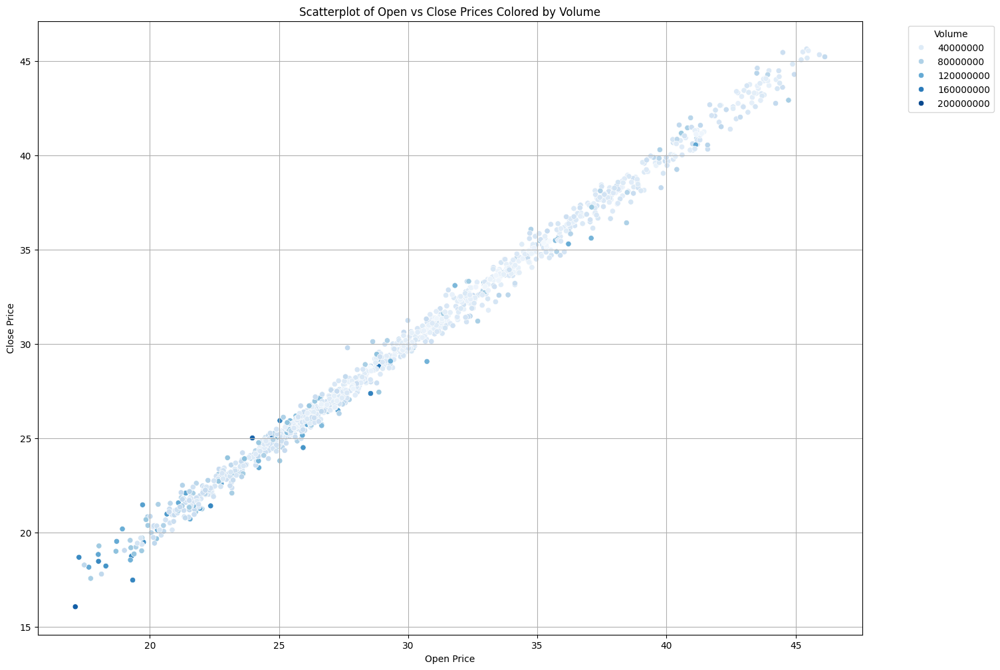

In [12]:
#Scater Plot Low VS High by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=df_BAC, x='Low', y='High', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Low vs High Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Low Price')
plt.ylabel('High Price')
plt.show()

#Scater Plot Open VS Close by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=df_BAC, x='Open', y='Close', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Open vs Close Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Open Price')
plt.ylabel('Close Price')
plt.show()

**Analysis**

1.  Low Price vs. High Price

- Perfectly linear relationship

- High volume suggests that large-volume trading days occur across all price levels

- This pattern confirms that BAC has a predictable trading range

##Coca-Cola

In [13]:
today = date.today()
end_date = today.strftime("2024-01-01")

d1 = date.today() - timedelta(days=1460)
start_date = d1.strftime("2019-01-01")

data = yf.download('KO', start=start_date, end=end_date, progress=False)
data.reset_index(inplace=True)
df_KO = data[["Date", "Open", "High", "Low", "Close", "Volume"]]

df_KO.columns = df_KO.columns.get_level_values(0)  # Removing the second level of my dataframe (Ticker KO), since we are only analyzing one stock, there is no need for a MultiIndex
df_KO.head()

Price,Date,Open,High,Low,Close,Volume
0,2019-01-02,38.965842,39.198278,38.650399,38.957542,11603700
1,2019-01-03,38.866234,39.322800,38.625498,38.716812,14714400
2,2019-01-04,38.808132,39.488831,38.716818,39.488831,13013700
3,2019-01-07,39.488814,39.638236,38.932635,38.974140,13135500
4,2019-01-08,39.223189,39.488827,39.048864,39.414116,15420700


In [14]:
df_KO.describe()

Price,Date,Open,High,Low,Close,Volume
count,1258,1258.000000,1258.000000,1258.000000,1258.000000,1.258000e+03
mean,2021-06-30 18:48:38.918918912,49.793457,50.153881,49.399985,49.777421,1.509419e+07
min,2019-01-02 00:00:00,33.486098,33.598410,31.334903,32.449379,3.265500e+06
25%,2020-04-01 06:00:00,44.129344,44.496632,43.807053,44.078586,1.094472e+07
50%,2021-06-30 12:00:00,49.311281,49.627771,49.039566,49.361143,1.366025e+07
75%,2022-09-28 18:00:00,56.439967,56.937029,56.081475,56.528478,1.717058e+07
max,2023-12-29 00:00:00,61.683466,61.867593,60.722537,60.956142,6.784570e+07
std,NaN,6.898028,6.907653,6.890212,6.910894,6.928657e+06


In [15]:
df_KO.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1258 entries, 0 to 1257
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1258 non-null   datetime64[ns]
 1   Open    1258 non-null   float64       
 2   High    1258 non-null   float64       
 3   Low     1258 non-null   float64       
 4   Close   1258 non-null   float64       
 5   Volume  1258 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 59.1 KB


In [16]:
df_KO.isnull().sum()

,0
Price,
Date,0
Open,0
High,0
Low,0
Close,0
Volume,0


###EDA

####Univariate

#####Histograms

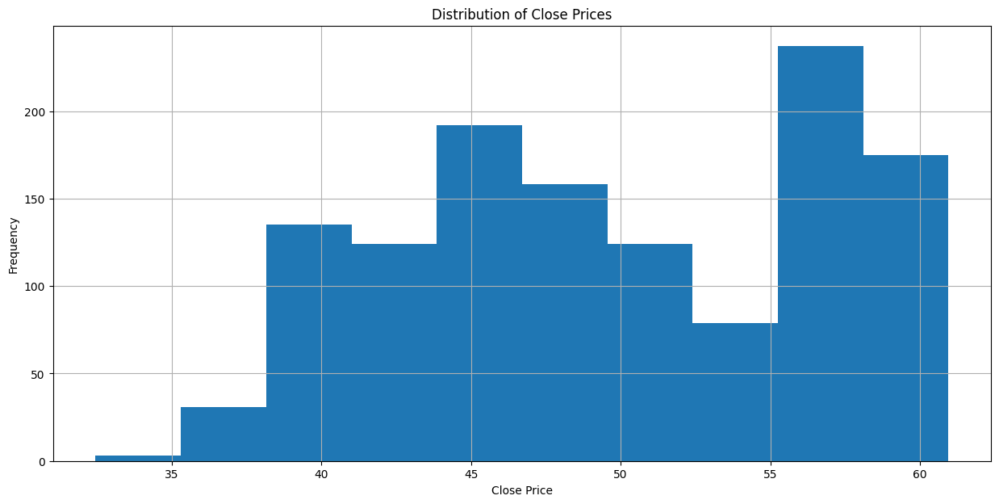

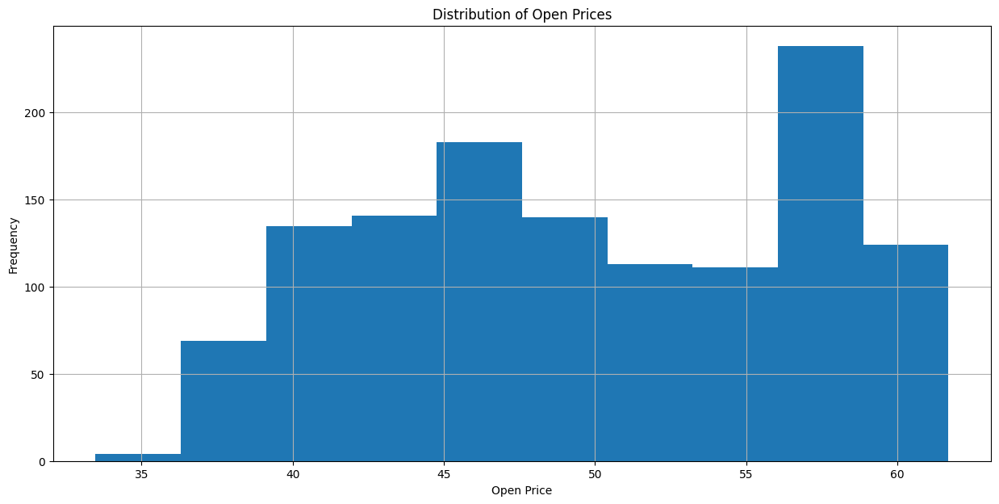

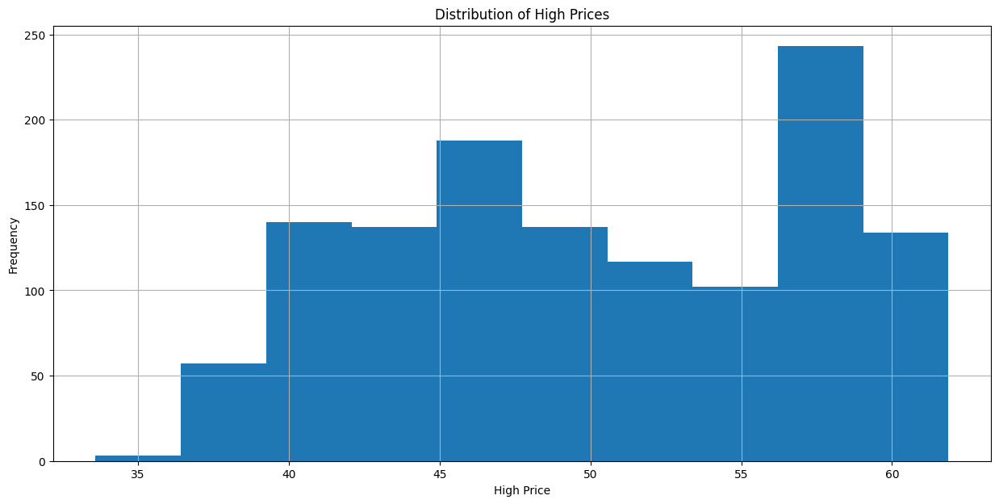

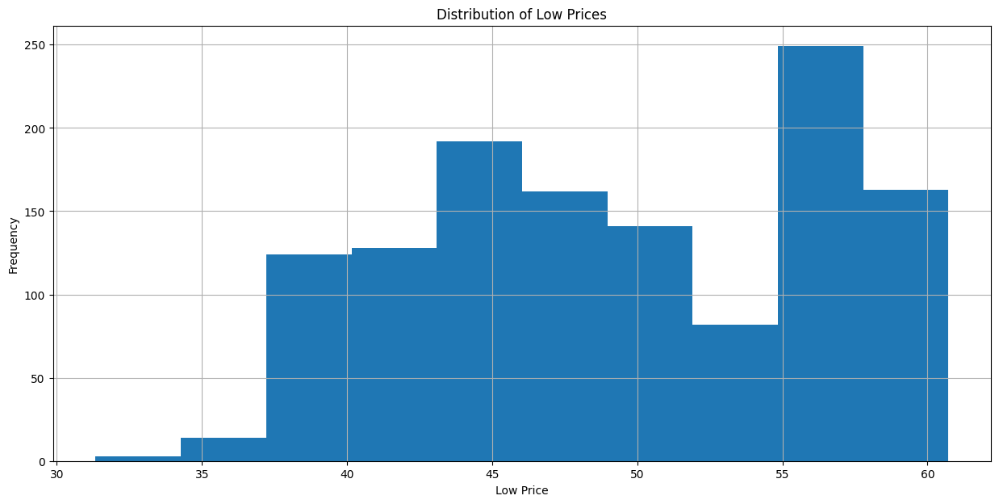

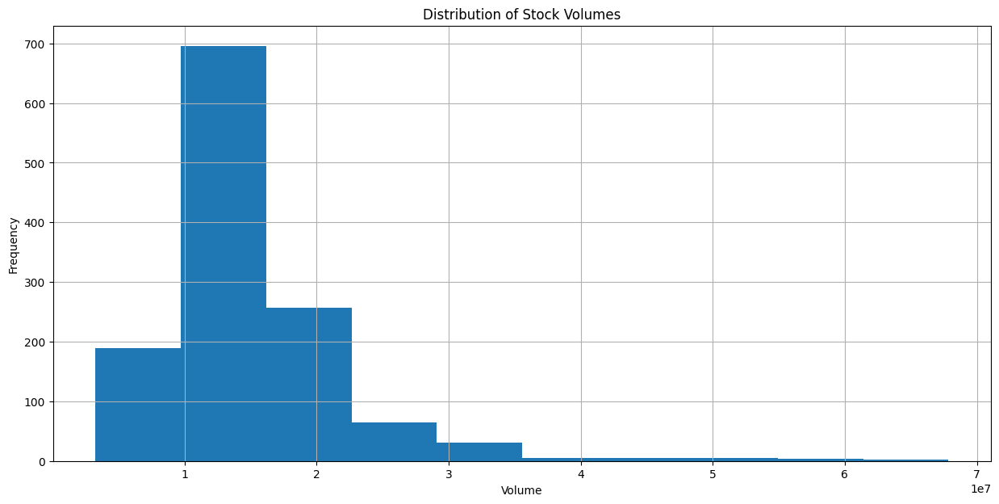

In [17]:
#Histograms

plt.subplots(figsize=(15,7))
plt.hist(df_KO['Close'])
plt.grid(True)
plt.title('Distribution of Close Prices')
plt.xlabel('Close Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_KO['Open'])
plt.grid(True)
plt.title('Distribution of Open Prices')
plt.xlabel('Open Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_KO['High'])
plt.grid(True)
plt.title('Distribution of High Prices')
plt.xlabel('High Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_KO['Low'])
plt.grid(True)
plt.title('Distribution of Low Prices')
plt.xlabel('Low Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_KO['Volume'])
plt.grid(True)
plt.title('Distribution of Stock Volumes')
plt.xlabel('Volume')
plt.ylabel('Frequency')
plt.show()

**Analysis**

- KO exhibits low volatility, making it a stable defensive investment.

- Price movements are predictable, trading in well-defined ranges.

- Low pre-market fluctuations suggest that KO’s price is driven by market hours rather than external overnight news.

- Volume spikes are rare, reinforcing KO’s reputation as a steady, long-term investment with institutional backing.

#####Boxplots

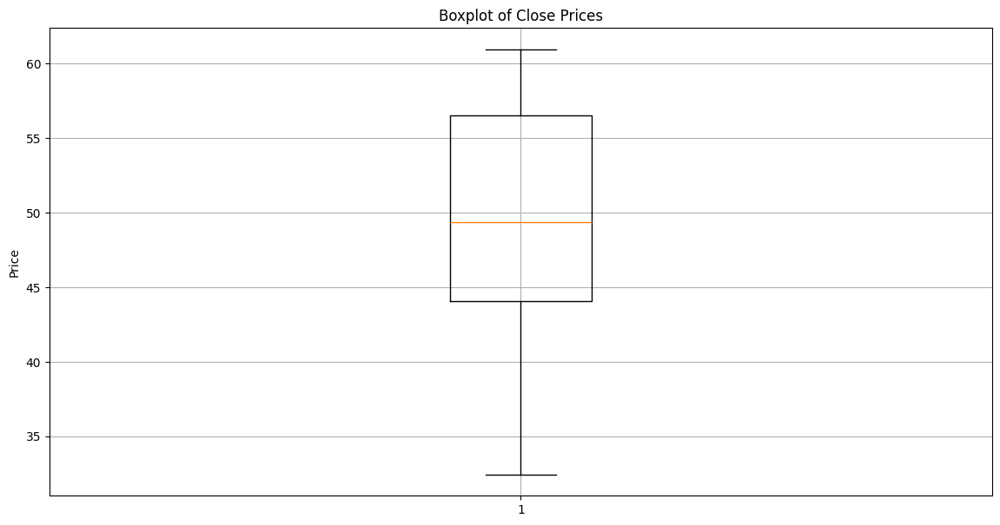

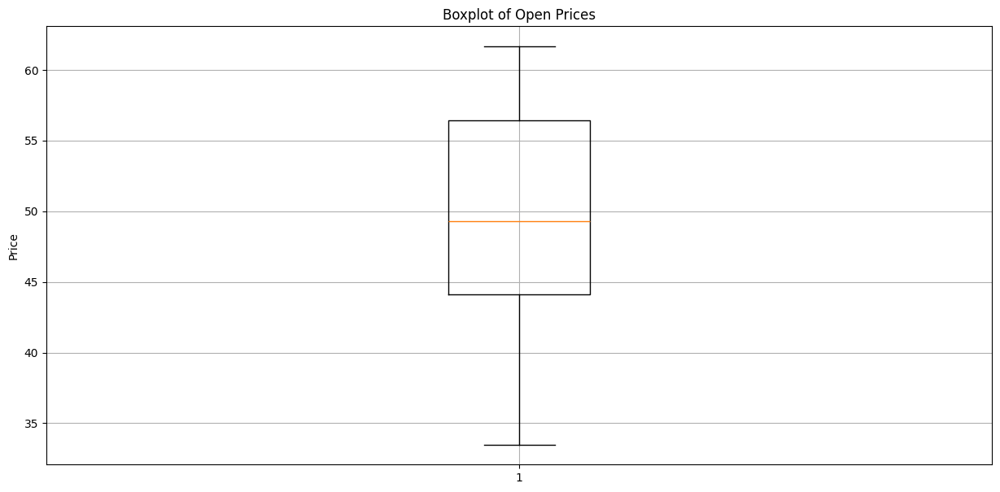

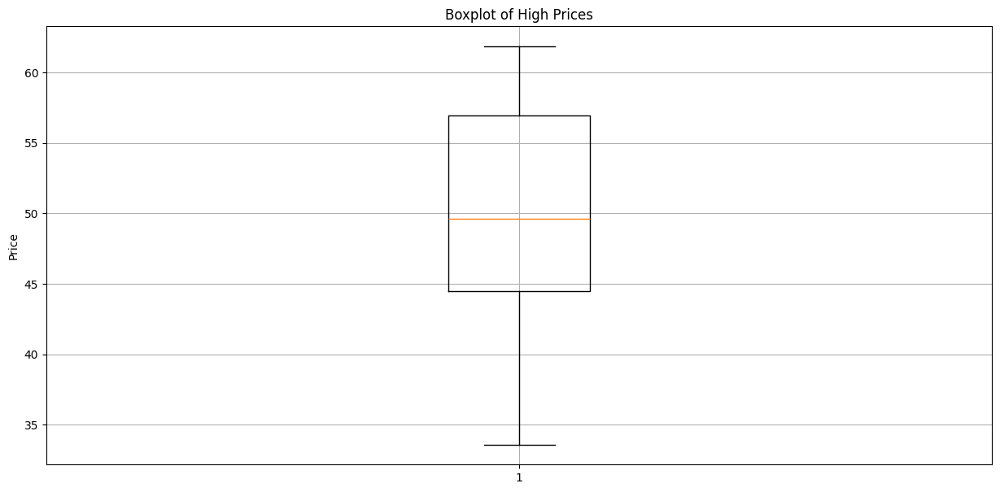

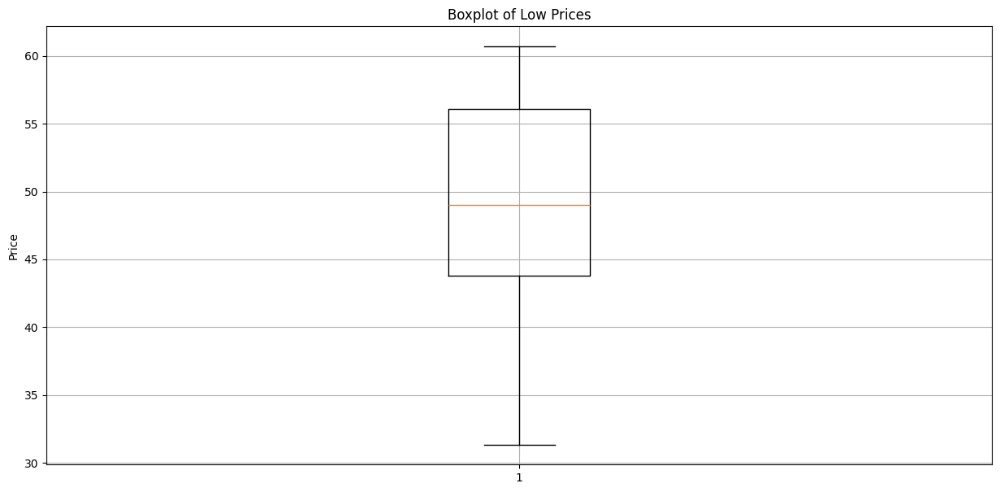

In [18]:
#Boxplots

plt.subplots(figsize=(14,7))
plt.boxplot(df_KO['Close'])
plt.grid(True)
plt.title('Boxplot of Close Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(df_KO['Open'])
plt.grid(True)
plt.title('Boxplot of Open Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(df_KO['High'])
plt.grid(True)
plt.title('Boxplot of High Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(df_KO['Low'])
plt.grid(True)
plt.title('Boxplot of Low Prices')
plt.ylabel('Price')
plt.show()

#####Linecharts

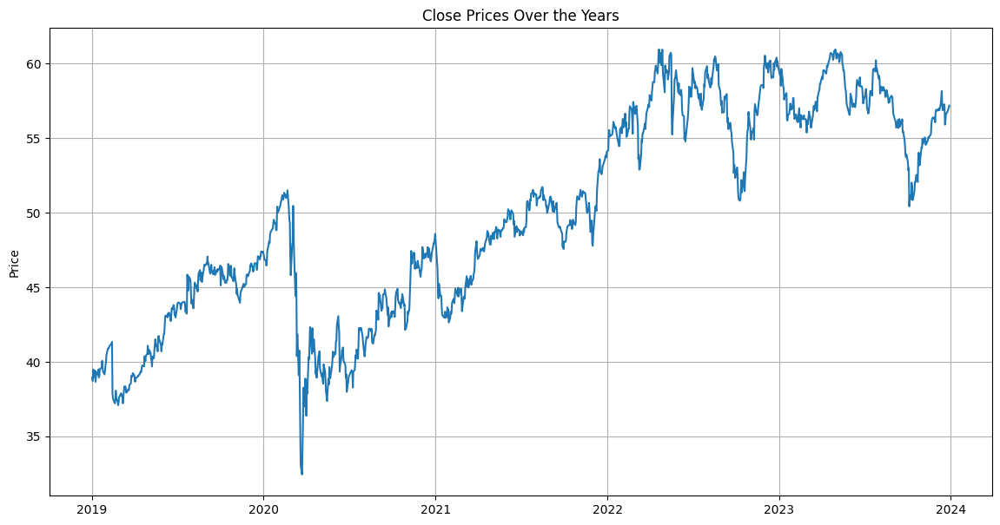

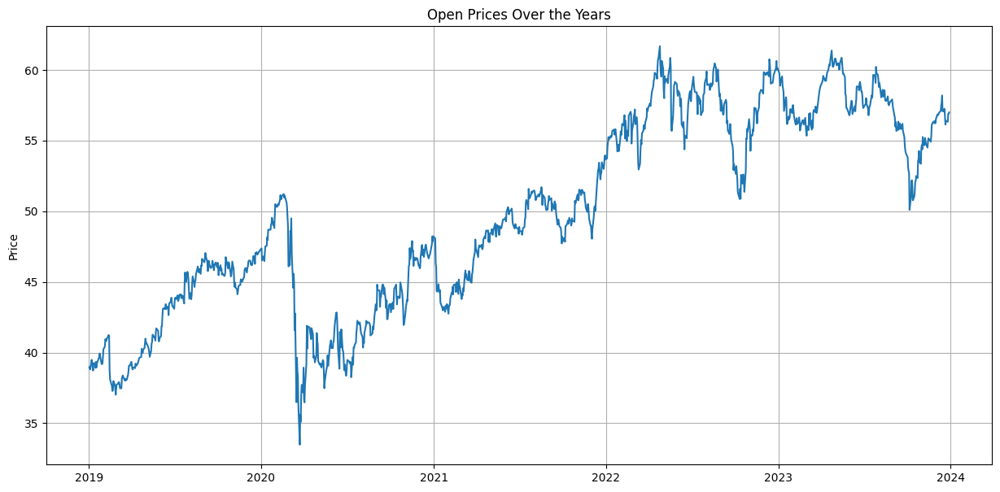

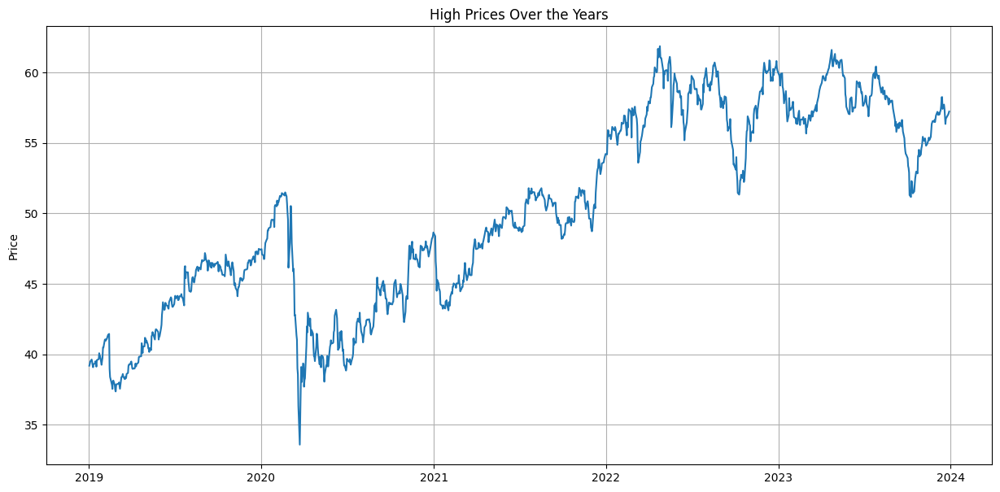

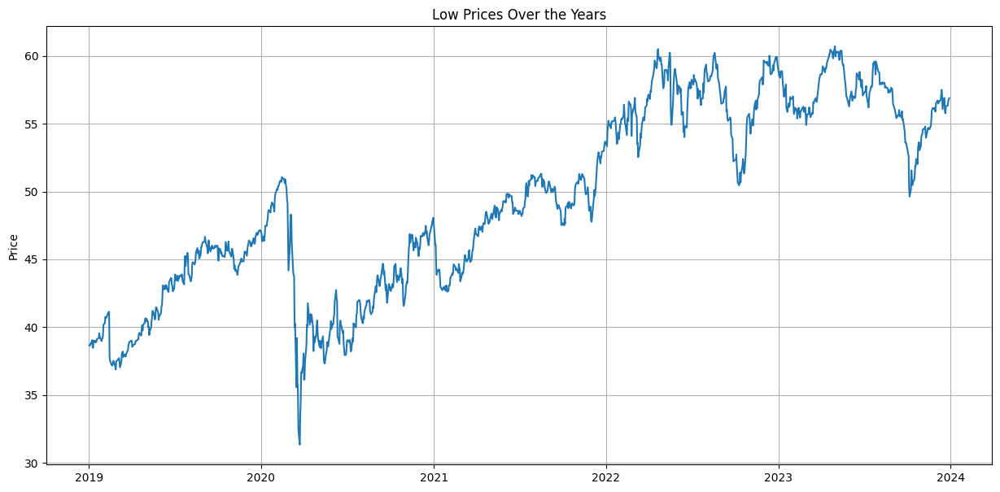

In [19]:
#Linecharts

plt.subplots(figsize=(14,7))
plt.plot(df_KO['Date'], df_KO['Close'])
plt.grid(True)
plt.title('Close Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(df_KO['Date'], df_KO['Open'])
plt.grid(True)
plt.title('Open Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(df_KO['Date'], df_KO['High'])
plt.grid(True)
plt.title('High Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(df_KO['Date'], df_KO['Low'])
plt.grid(True)
plt.title('Low Prices Over the Years')
plt.ylabel('Price')
plt.show()

**Analysis**

- Strong long-term upward trend, making KO a reliable defensive stock.

- Low overnight price fluctuations, reinforcing low volatility.

- Resilience to market downturns, as seen in the COVID-19 recovery.

- Minimal speculative price spikes

#####Time Series Components

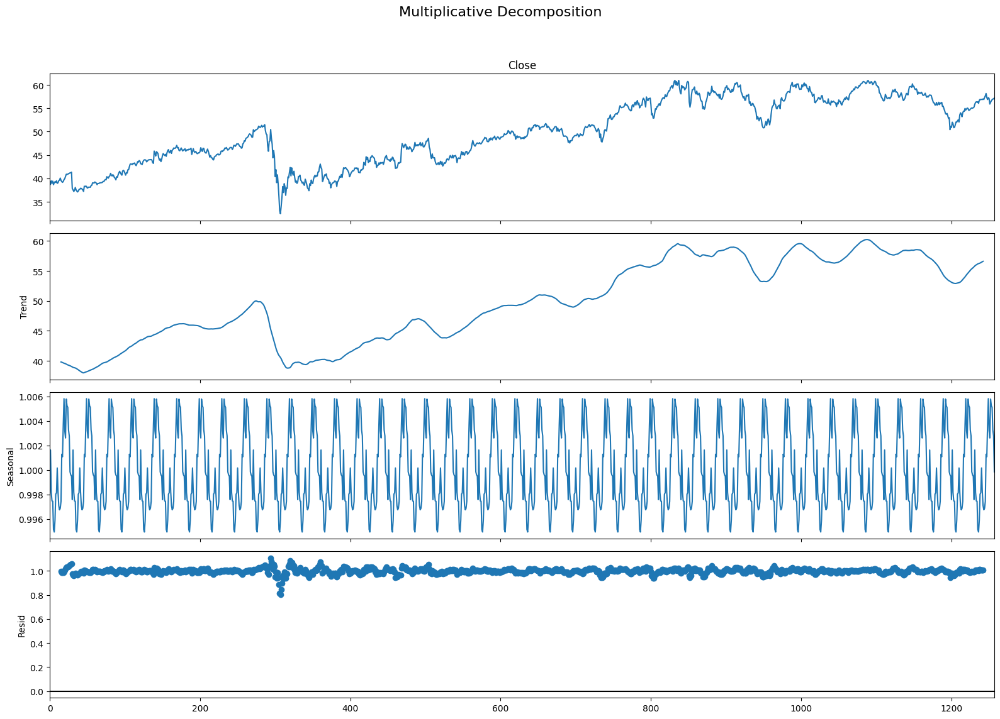

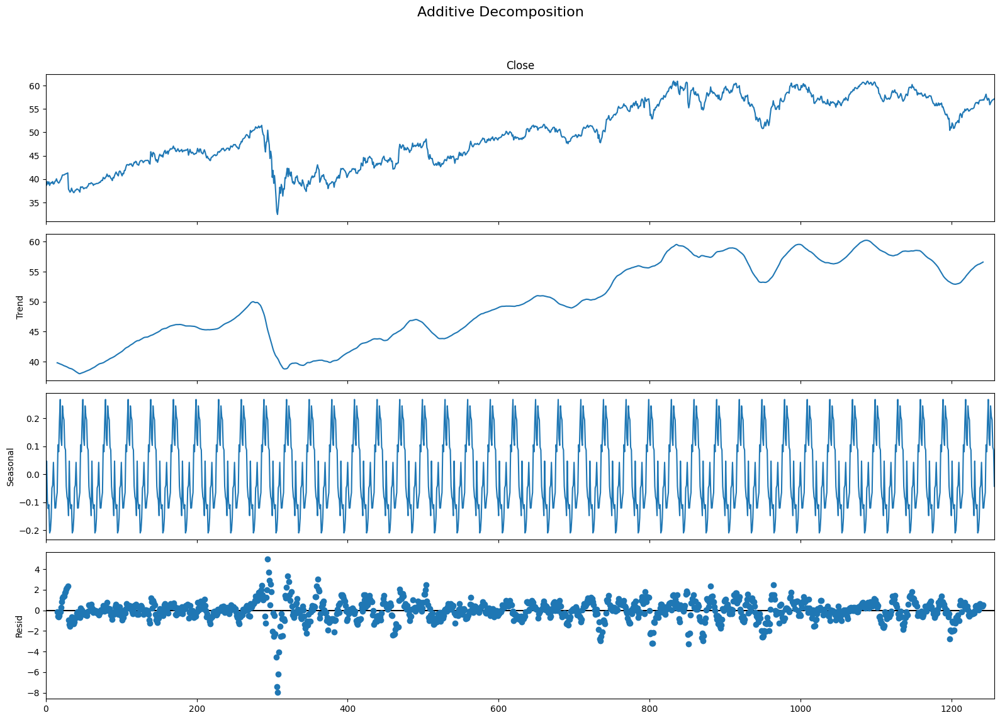

In [20]:
# Multiplicative Decomposition
multiplicative_decomposition = seasonal_decompose(df_KO['Close'], model='multiplicative', period=30)

# Additive Decomposition
additive_decomposition = seasonal_decompose(df_KO['Close'], model='additive', period=30)

# Plot
plt.rcParams.update({'figure.figsize': (16,12)})
multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

additive_decomposition.plot().suptitle('Additive Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

**Analysis**

- Strong long-term growth trend, reinforcing KO’s position as a defensive stock.

- Clear seasonal patterns, reflecting recurring demand cycles and quarterly earnings effects.

- Market shocks (like COVID-19) temporarily disrupt KO, but the stock recovers steadily.

####Bivariate

<Axes: xlabel='Price', ylabel='Price'>

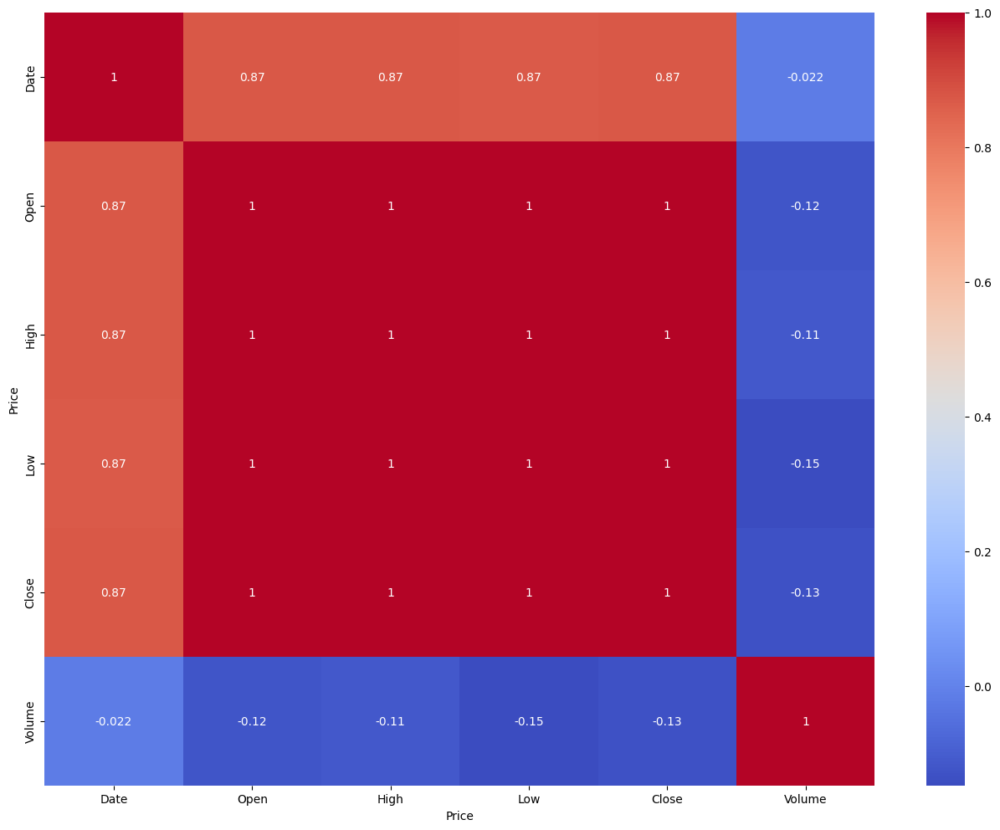

In [21]:
df_KO.corr()
sns.heatmap(df_KO.corr(), annot=True, cmap='coolwarm')

**Analysis**

- Strong intraday price stability, with minimal fluctuations between open, high, low, and close prices.

- Weak negative correlation between volume and price, meaning that KO is less affected by large trading volumes than BAC.

####Multivariate

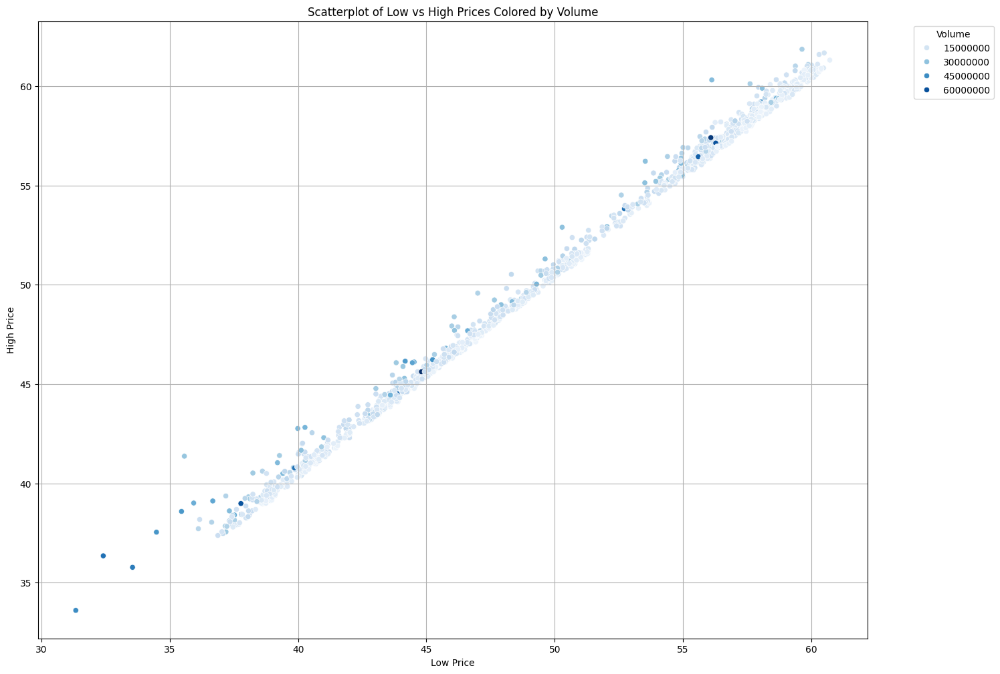

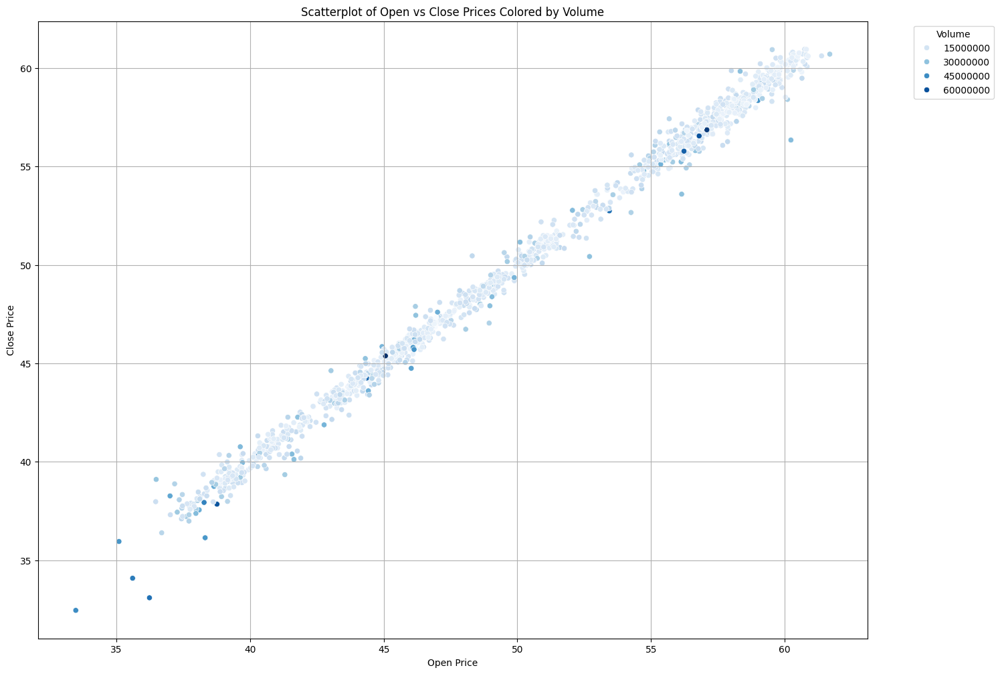

In [22]:
#Scater Plot Low VS High by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=df_KO, x='Low', y='High', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Low vs High Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Low Price')
plt.ylabel('High Price')
plt.show()

#Scater Plot Open VS Close by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=df_KO, x='Open', y='Close', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Open vs Close Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Open Price')
plt.ylabel('Close Price')
plt.show()

**Analysis**

- Coca-Cola's price movements are highly predictable, with minimal day-to-day price fluctuations.

- Volume spikes do not necessarily drive extreme price changes, unlike more volatile stocks.

- KO is a defensive stock with steady behavior, making it a good candidate for long-term investors seeking stability.

##Kraft Heinz

In [23]:
today = date.today()
end_date = today.strftime("2024-01-01")

d1 = date.today() - timedelta(days=1460)
start_date = d1.strftime("2019-01-01")

data = yf.download('KHC', start=start_date, end=end_date, progress=False)
data.reset_index(inplace=True)
df_KHC = data[["Date", "Open", "High", "Low", "Close", "Volume"]]

In [24]:
df_KHC.columns = df_KHC.columns.get_level_values(0)  # Removing the second level of my dataframe (Ticker KHC), since we are only analyzing one stock, there is no need for a MultiIndex
df_KHC.head()

Price,Date,Open,High,Low,Close,Volume
0,2019-01-02,32.257254,32.989174,31.906386,32.702442,6417800
1,2019-01-03,32.559062,33.109887,32.430786,32.679790,7613500
2,2019-01-04,33.260808,33.683357,32.823164,33.570175,6452600
3,2019-01-07,33.570176,34.490731,33.207986,34.204002,6711400
4,2019-01-08,34.415267,34.508833,33.985171,34.234173,8308100


In [25]:
df_KHC.describe()

Price,Date,Open,High,Low,Close,Volume
count,1258,1258.000000,1258.000000,1258.000000,1258.000000,1.258000e+03
mean,2021-06-30 18:48:38.918918912,30.209751,30.515191,29.890689,30.216788,7.508136e+06
min,2019-01-02 00:00:00,16.932441,17.880331,16.195192,16.251900,1.575900e+06
25%,2020-04-01 06:00:00,25.424112,25.648973,25.164400,25.387084,5.212675e+06
50%,2021-06-30 12:00:00,31.440301,31.721168,31.136384,31.453777,6.529500e+06
75%,2022-09-28 18:00:00,34.357940,34.689032,34.028649,34.361685,8.302050e+06
max,2023-12-29 00:00:00,39.279433,39.713117,38.938679,39.199783,1.352048e+08
std,NaN,5.050599,5.045572,5.047813,5.047962,5.448548e+06


In [26]:
df_KHC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1258 entries, 0 to 1257
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1258 non-null   datetime64[ns]
 1   Open    1258 non-null   float64       
 2   High    1258 non-null   float64       
 3   Low     1258 non-null   float64       
 4   Close   1258 non-null   float64       
 5   Volume  1258 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 59.1 KB


In [27]:
df_KHC.isnull().sum()

,0
Price,
Date,0
Open,0
High,0
Low,0
Close,0
Volume,0


###EDA

####Univariate

#####Histograms

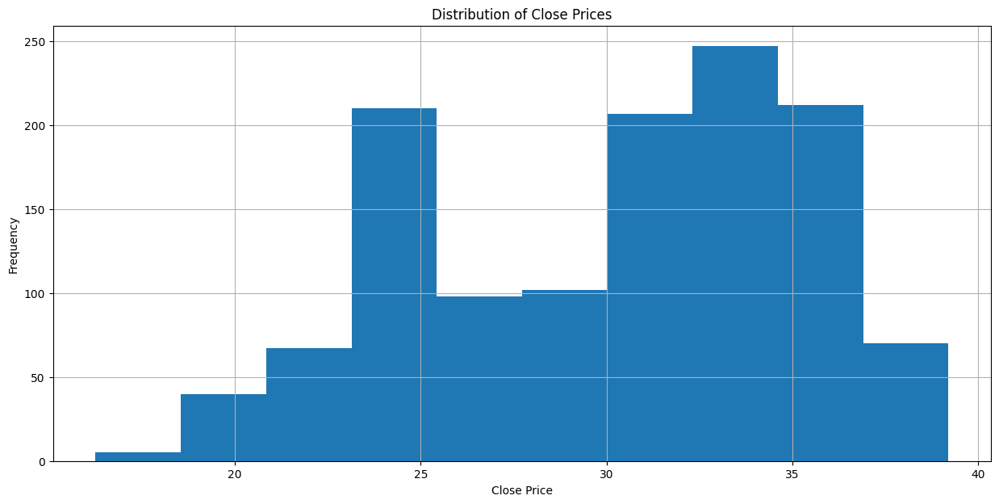

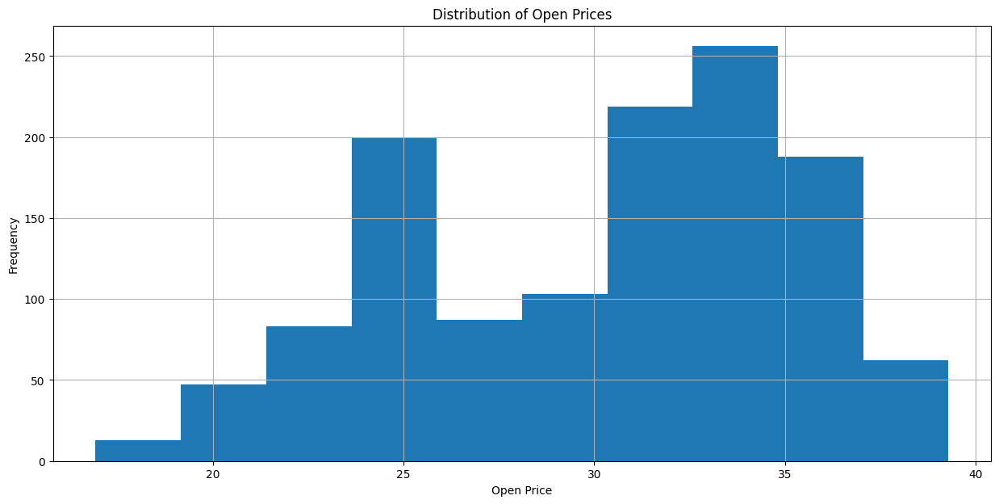

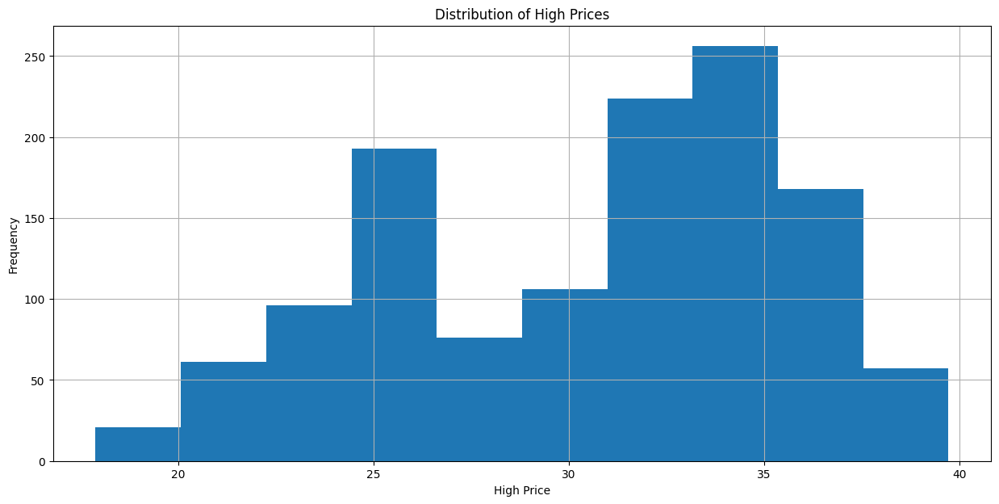

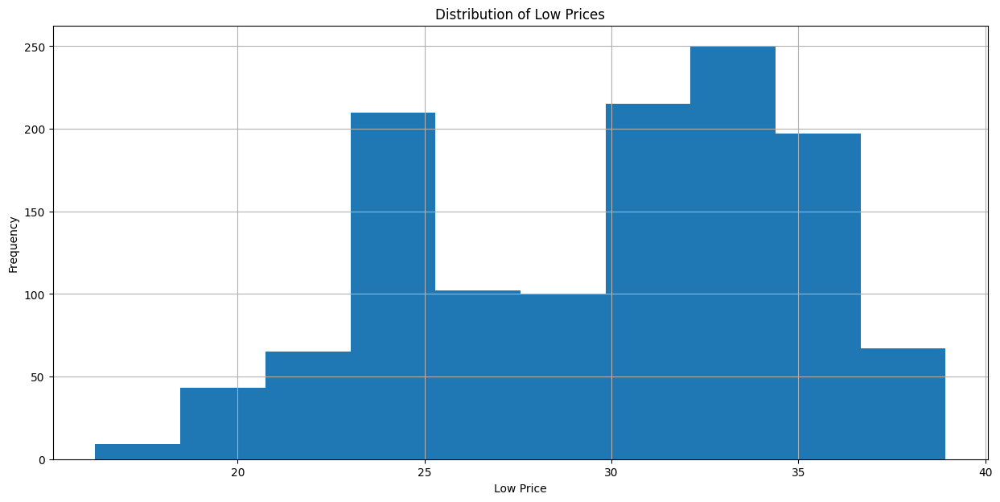

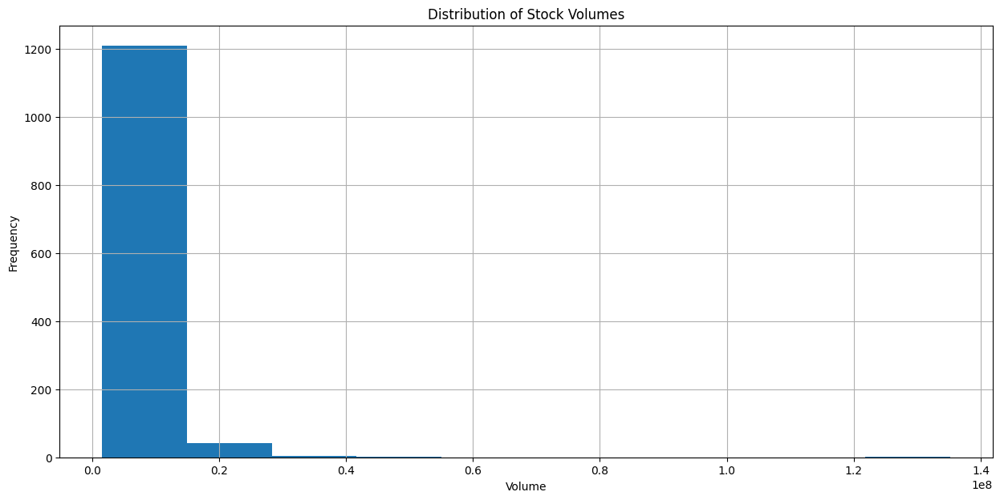

In [28]:
#Histograms

plt.subplots(figsize=(15,7))
plt.hist(df_KHC['Close'])
plt.grid(True)
plt.title('Distribution of Close Prices')
plt.xlabel('Close Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_KHC['Open'])
plt.grid(True)
plt.title('Distribution of Open Prices')
plt.xlabel('Open Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_KHC['High'])
plt.grid(True)
plt.title('Distribution of High Prices')
plt.xlabel('High Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_KHC['Low'])
plt.grid(True)
plt.title('Distribution of Low Prices')
plt.xlabel('Low Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_KHC['Volume'])
plt.grid(True)
plt.title('Distribution of Stock Volumes')
plt.xlabel('Volume')
plt.ylabel('Frequency')
plt.show()

**Analysis**

- Prices (open, high, low, close):

The histograms show a bimodal distribution, indicating two distinct price levels over the observed period.

This could be due to market events, earnings reports, or major institutional trading (e.g., Buffett’s holdings changes).

- Trading volume:

The distribution is highly skewed, with a few days of extremely high trading activity.

This suggests that specific events (e.g., earnings reports, large trades) triggered abnormal volume spikes.

- overall trend:

KHC stock appears to have two price clusters, meaning it experienced a shift in valuation during this period.

Further analysis is needed to determine if this was due to external market factors or internal company performance.

#####Boxplots

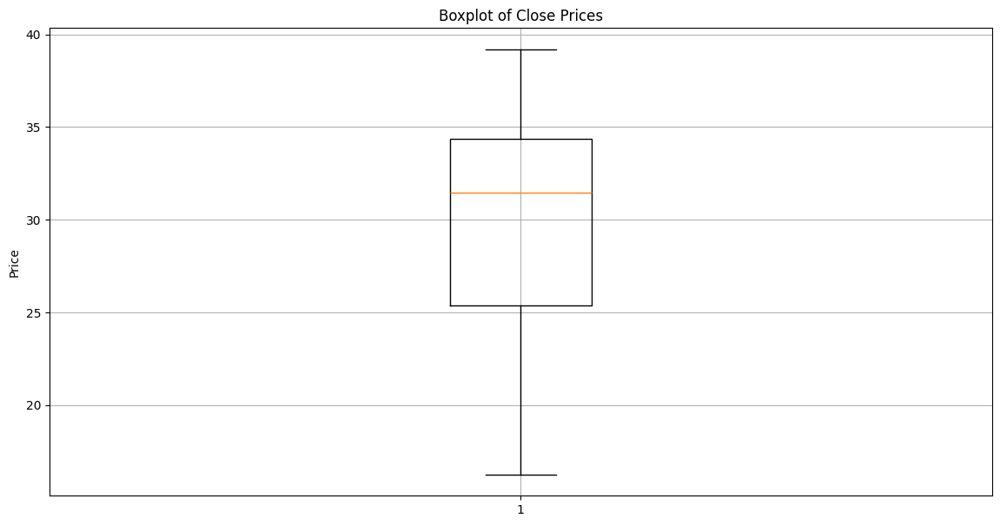

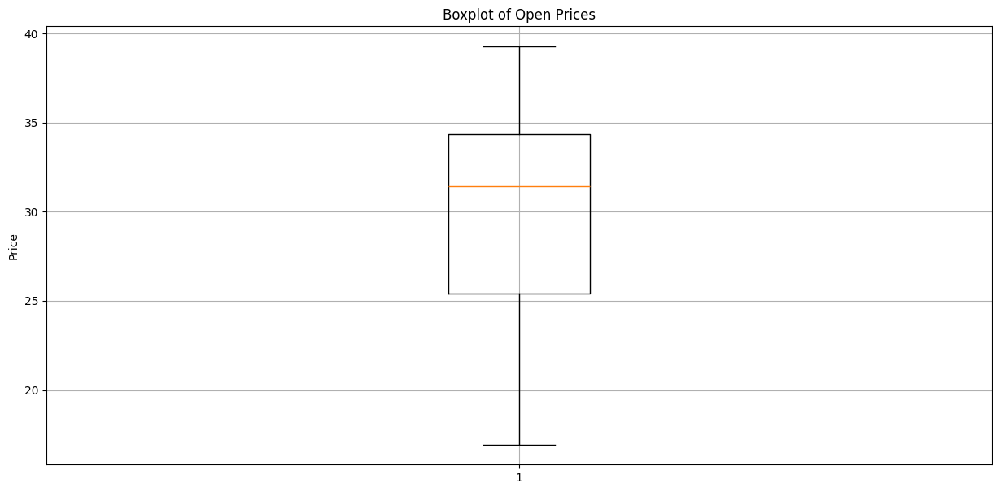

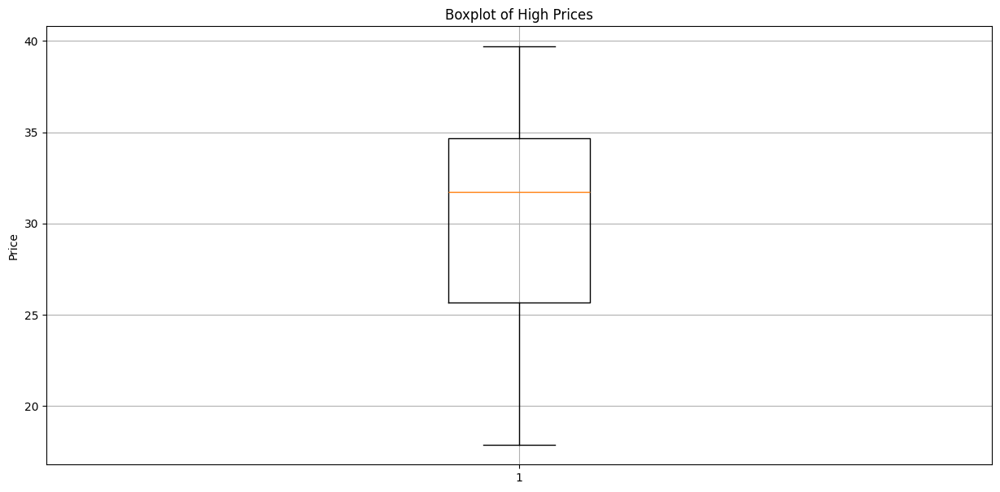

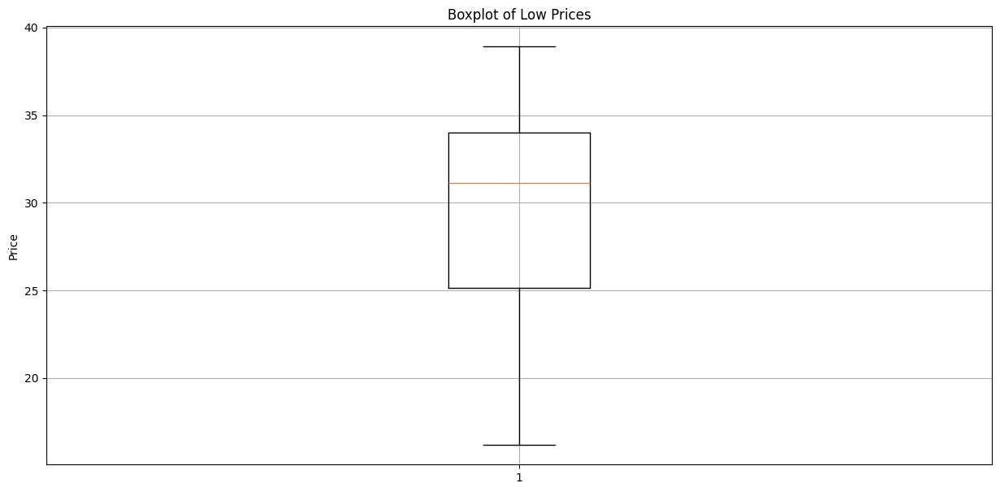

In [29]:
#Boxplots

plt.subplots(figsize=(14,7))
plt.boxplot(df_KHC['Close'])
plt.grid(True)
plt.title('Boxplot of Close Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(df_KHC['Open'])
plt.grid(True)
plt.title('Boxplot of Open Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(df_KHC['High'])
plt.grid(True)
plt.title('Boxplot of High Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(df_KHC['Low'])
plt.grid(True)
plt.title('Boxplot of Low Prices')
plt.ylabel('Price')
plt.show()

#####Linecharts

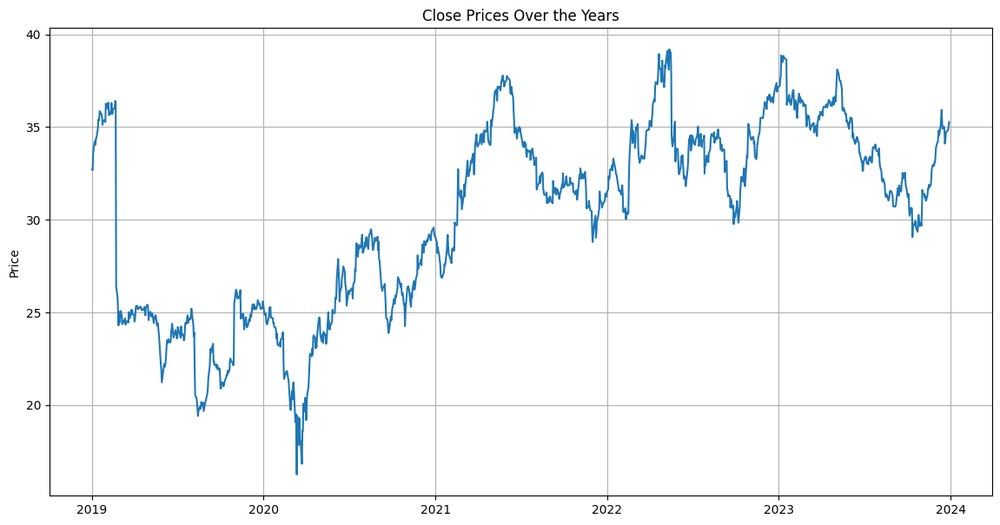

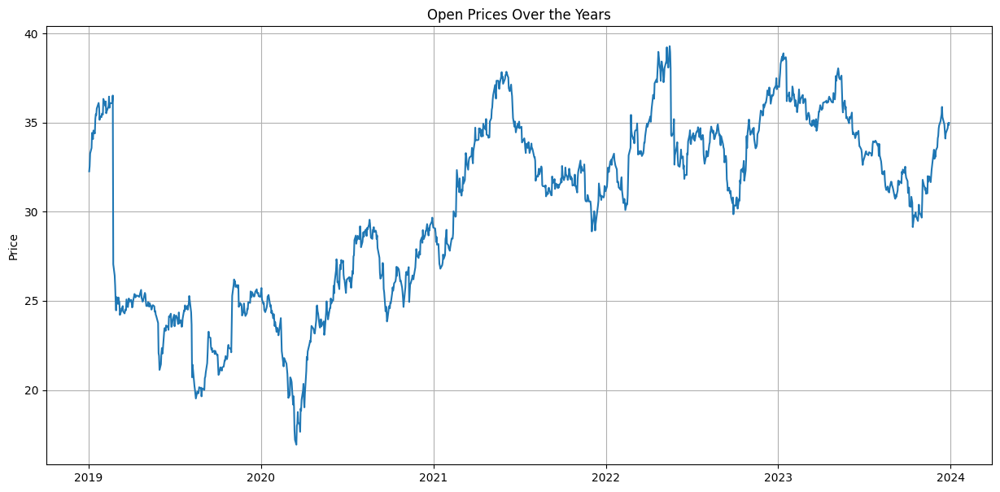

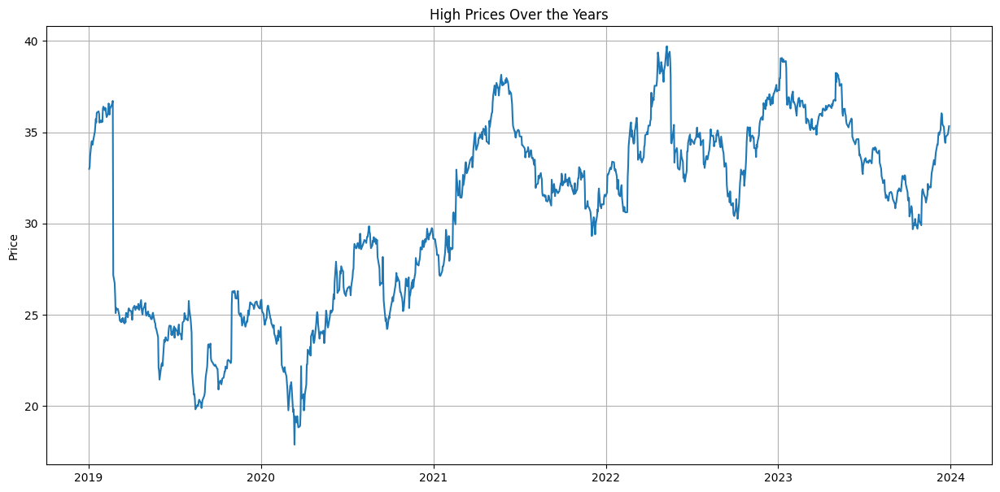

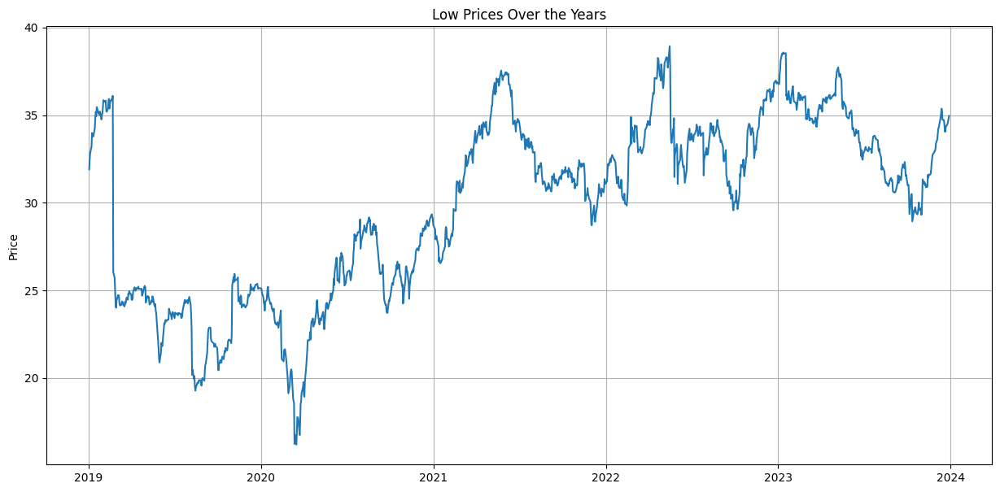

In [30]:
#Linecharts

plt.subplots(figsize=(14,7))
plt.plot(df_KHC['Date'], df_KHC['Close'])
plt.grid(True)
plt.title('Close Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(df_KHC['Date'], df_KHC['Open'])
plt.grid(True)
plt.title('Open Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(df_KHC['Date'], df_KHC['High'])
plt.grid(True)
plt.title('High Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(df_KHC['Date'], df_KHC['Low'])
plt.grid(True)
plt.title('Low Prices Over the Years')
plt.ylabel('Price')
plt.show()

**Analysis**

Overall Trend (2019-2024)

- KHC's stock price fluctuated significantly over the years, with clear periods of growth and decline.

- The stock experienced a sharp decline in early 2019, followed by a prolonged period of volatility.

Similar pattern in open, high, low and close price

- The close, open, high, and low prices follow the same trend, confirming that KHC exhibits stable intraday price movements without extreme fluctuations.

Potential Market Events Impacting Price

- Buffett’s holdings in KHC might have influenced price movements, especially if Berkshire Hathaway increased or decreased its position during these periods.

#####Time Series Components

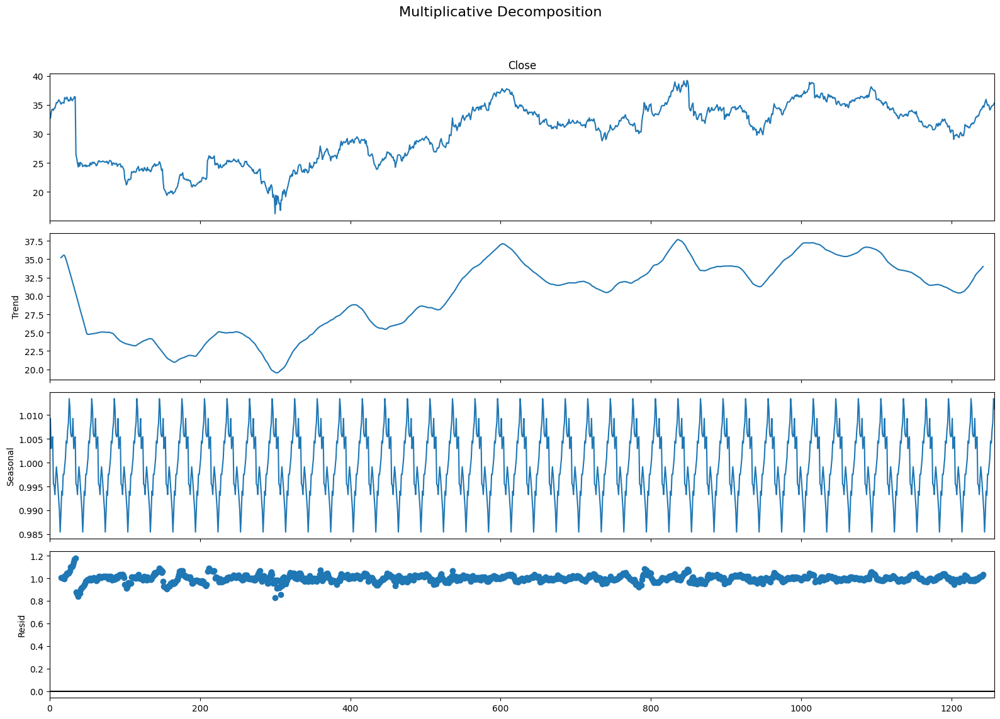

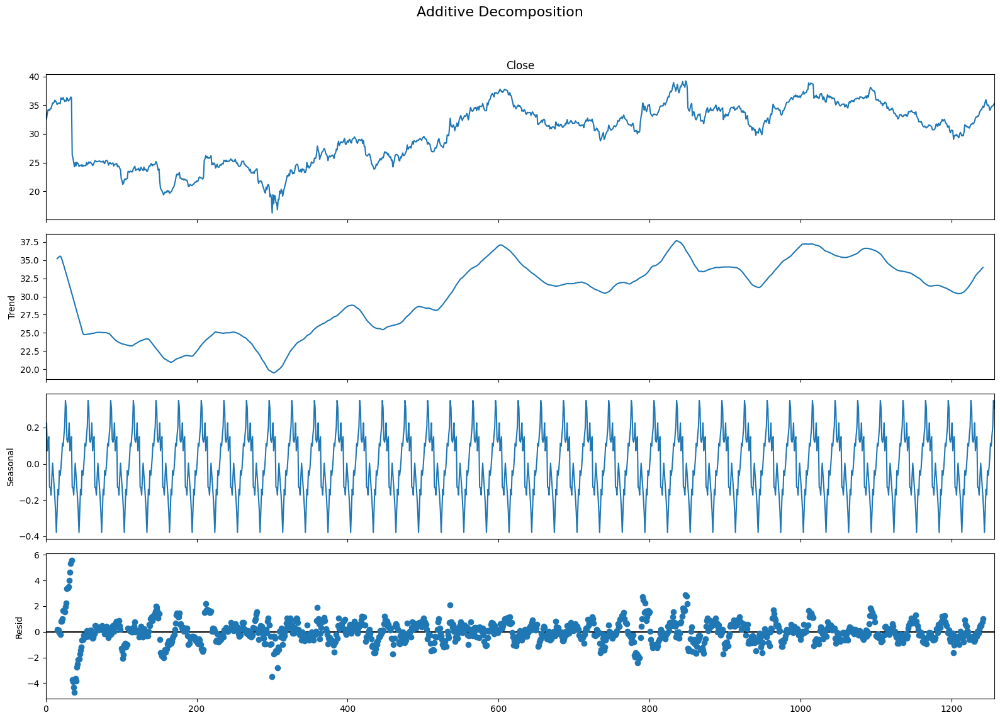

In [31]:
# Multiplicative Decomposition
multiplicative_decomposition = seasonal_decompose(df_KHC['Close'], model='multiplicative', period=30)

# Additive Decomposition
additive_decomposition = seasonal_decompose(df_KHC['Close'], model='additive', period=30)

# Plot
plt.rcParams.update({'figure.figsize': (16,12)})
multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

additive_decomposition.plot().suptitle('Additive Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

**Analysis**

**Trend**

The trend shows a clear decline from 2019 to mid-2020, followed by a steady upward movement.

KHC's long-term recovery is visible post-2020, aligning with broader market rebounds after economic slowdowns.


**Seasonal Component**

The stock exhibits strong, repetitive seasonal patterns in short intervals.

This suggests that KHC follows periodic price fluctuations, possibly linked to quarterly earnings reports or industry cycles.

**Residuals **

The residuals indicate higher volatility in early periods (2019-2020).


####Bivariate

<Axes: xlabel='Price', ylabel='Price'>

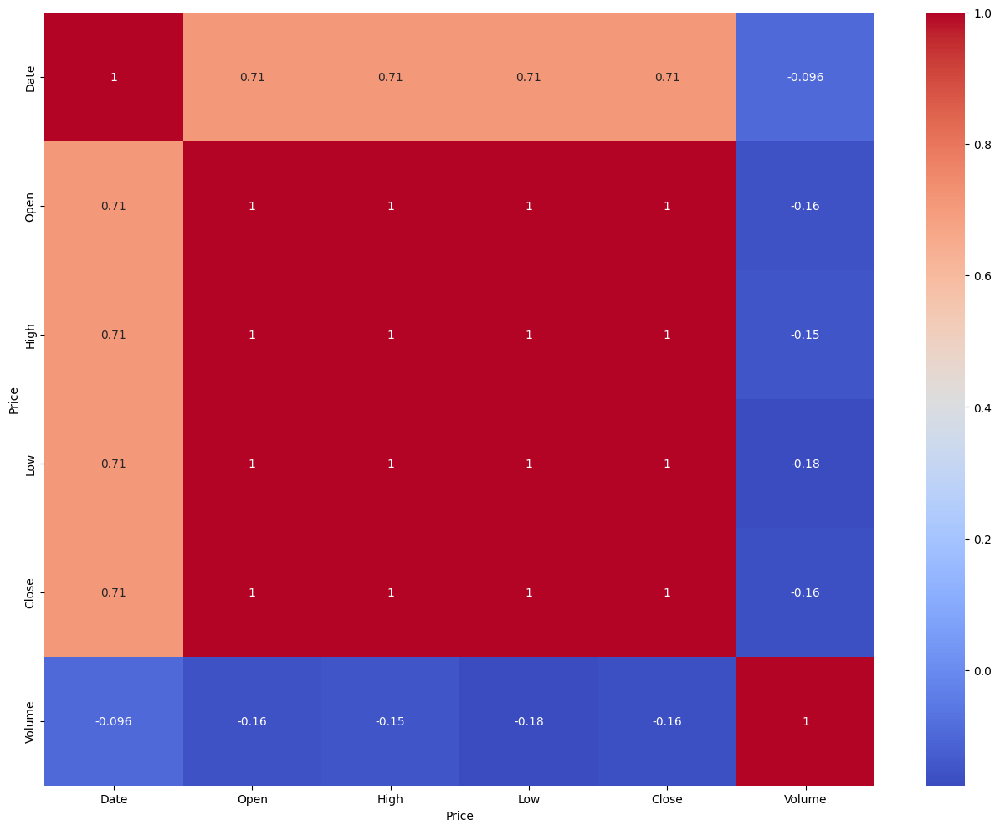

In [32]:
df_KHC.corr()
sns.heatmap(df_KHC.corr(), annot=True, cmap='coolwarm')

**Analysis**

**Strong Correlation among Stock Prices**

Open, High, Low, and Close prices all have a perfect correlation (1.00) with each other.

This is expected, as stock prices move together within a given trading session.

**Date vs. Prices (0.71 Correlation)**


A moderate positive correlation suggests a general upward trend in stock prices over time.

This aligns with the long-term recovery trend observed in the time series decomposition.

####Multivariate

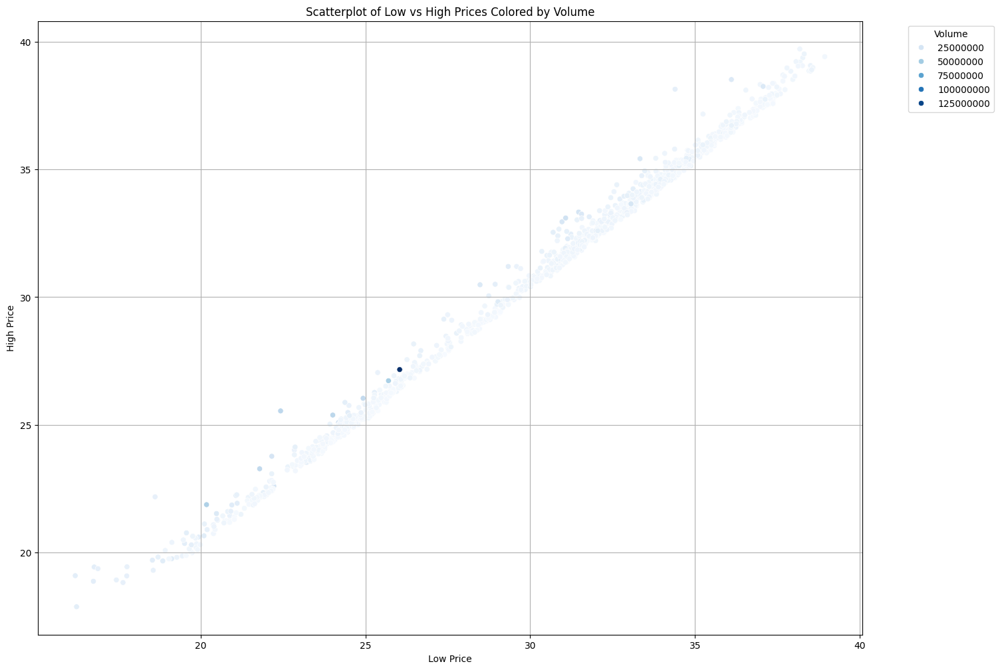

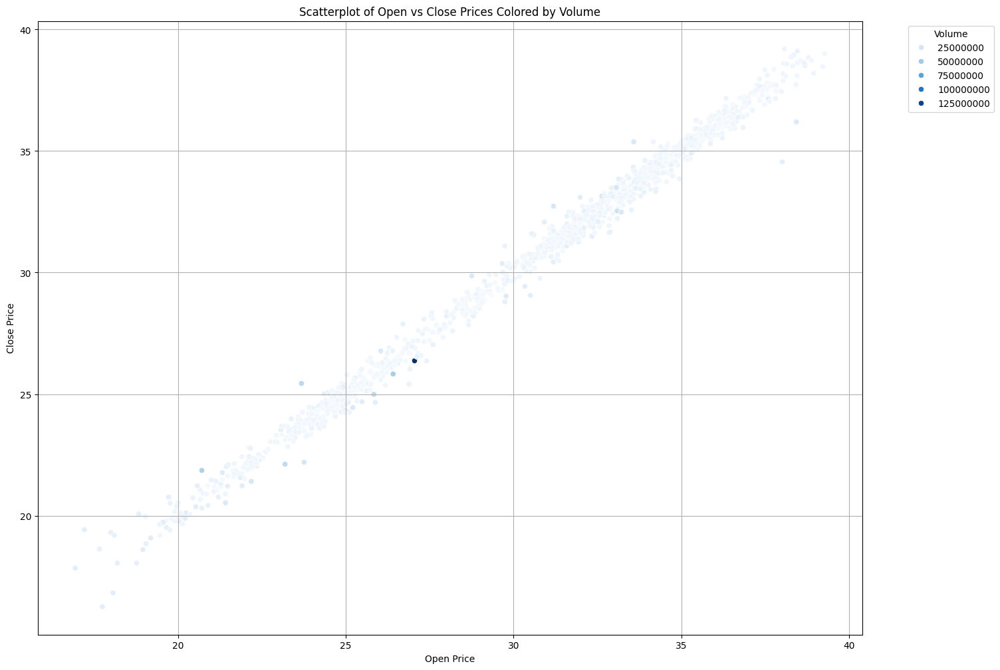

In [33]:
#Scater Plot Low VS High by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=df_KHC, x='Low', y='High', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Low vs High Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Low Price')
plt.ylabel('High Price')
plt.show()

#Scater Plot Open VS Close by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=df_KHC, x='Open', y='Close', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Open vs Close Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Open Price')
plt.ylabel('Close Price')
plt.show()

**Analysis**

- Strong positive correlation: Open, High, Low, and Close prices are highly correlated, meaning daily price movements are consistent.

- Volume: Larger volume (darker points) does not significantly shift prices, confirming weak volume-price correlation from the heatmap.

##Apple

In [34]:
today = date.today()
end_date = today.strftime("2024-01-01")

d1 = date.today() - timedelta(days=1460)
start_date = d1.strftime("2019-01-01")

data = yf.download('AAPL', start=start_date, end=end_date, progress=False)
data.reset_index(inplace=True)
df_AAPL = data[["Date", "Open", "High", "Low", "Close", "Volume"]]

df_AAPL.columns = df_AAPL.columns.get_level_values(0)  # Removing the second level of my dataframe (Ticker AAPL), since we are only analyzing one stock, there is no need for a MultiIndex
df_AAPL.head()

Price,Date,Open,High,Low,Close,Volume
0,2019-01-02,36.944462,37.889005,36.787037,37.667179,148158800
1,2019-01-03,34.342207,34.757234,33.869937,33.915257,365248800
2,2019-01-04,34.473390,35.432244,34.299271,35.363071,234428400
3,2019-01-07,35.468025,35.499034,34.800166,35.284363,219111200
4,2019-01-08,35.673157,36.212216,35.425097,35.956997,164101200


In [35]:
df_AAPL.describe()

Price,Date,Open,High,Low,Close,Volume
count,1258,1258.000000,1258.000000,1258.000000,1258.000000,1.258000e+03
mean,2021-06-30 18:48:38.918918912,120.720125,122.108680,119.438978,120.843221,1.015904e+08
min,2019-01-02 00:00:00,34.342207,34.757234,33.869937,33.915257,2.404830e+07
25%,2020-04-01 06:00:00,74.531080,75.564167,73.870773,74.941006,6.803012e+07
50%,2021-06-30 12:00:00,132.216043,133.304510,130.497935,131.866158,8.861740e+07
75%,2022-09-28 18:00:00,157.607783,159.890686,155.113918,157.268749,1.189786e+08
max,2023-12-29 00:00:00,196.838214,198.428656,195.824294,196.927673,4.265100e+08
std,NaN,46.522412,46.946106,46.103715,46.538921,5.261087e+07


In [36]:
df_AAPL.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1258 entries, 0 to 1257
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1258 non-null   datetime64[ns]
 1   Open    1258 non-null   float64       
 2   High    1258 non-null   float64       
 3   Low     1258 non-null   float64       
 4   Close   1258 non-null   float64       
 5   Volume  1258 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 59.1 KB


In [37]:
df_AAPL.isnull().sum()

,0
Price,
Date,0
Open,0
High,0
Low,0
Close,0
Volume,0


###EDA

####Univariate


#####Histograms

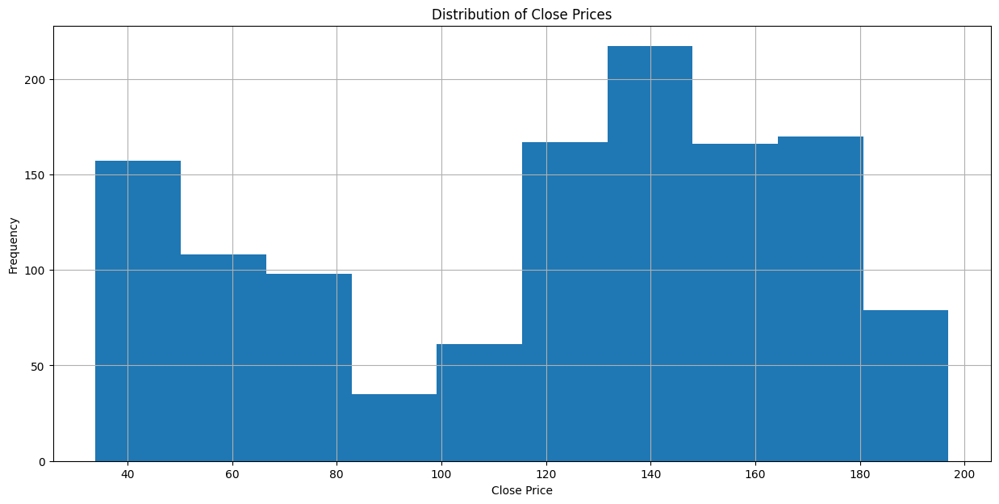

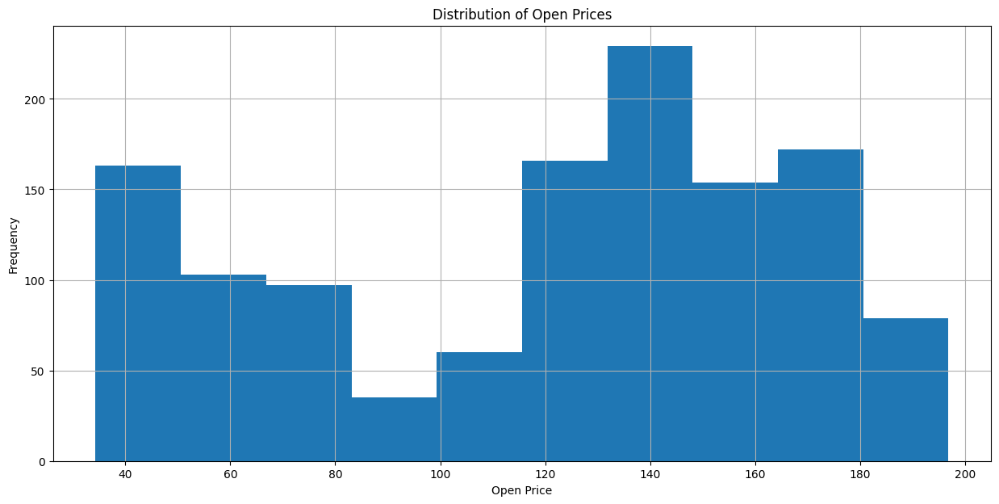

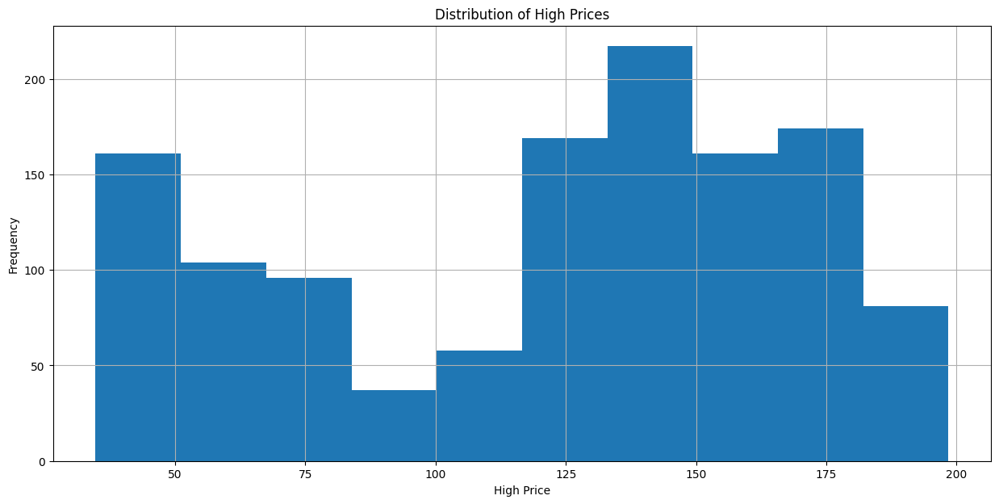

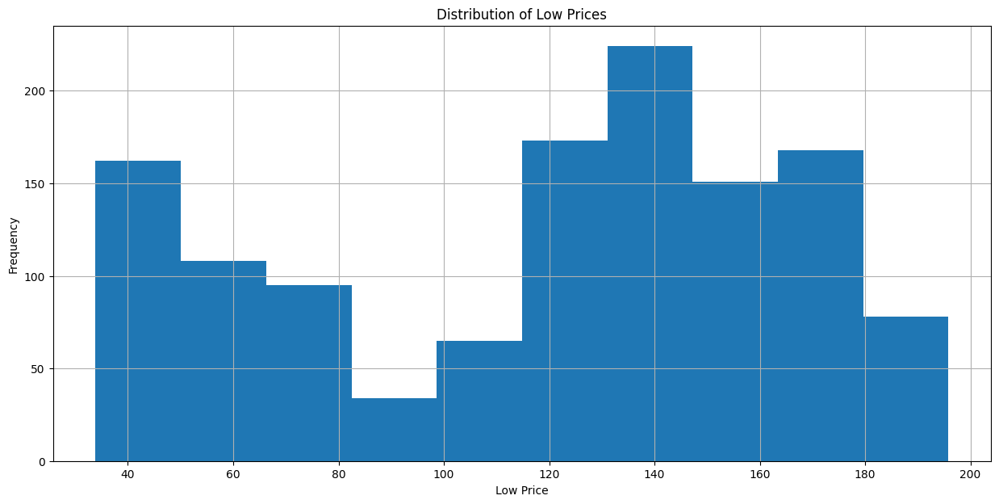

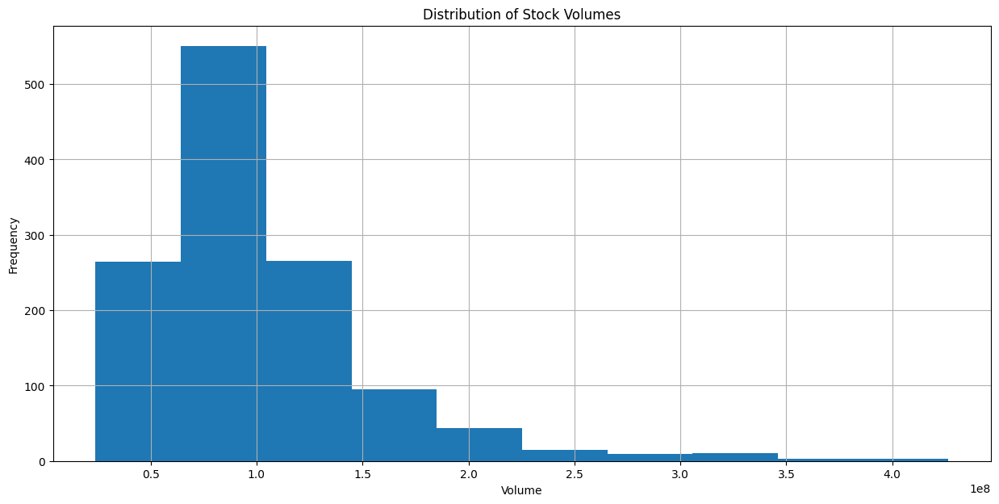

In [38]:
#Histograms

plt.subplots(figsize=(15,7))
plt.hist(df_AAPL['Close'])
plt.grid(True)
plt.title('Distribution of Close Prices')
plt.xlabel('Close Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_AAPL['Open'])
plt.grid(True)
plt.title('Distribution of Open Prices')
plt.xlabel('Open Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_AAPL['High'])
plt.grid(True)
plt.title('Distribution of High Prices')
plt.xlabel('High Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_AAPL['Low'])
plt.grid(True)
plt.title('Distribution of Low Prices')
plt.xlabel('Low Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_AAPL['Volume'])
plt.grid(True)
plt.title('Distribution of Stock Volumes')
plt.xlabel('Volume')
plt.ylabel('Frequency')
plt.show()

**Analysis**

- Close Prices: Distribution shows two major price clusters, indicating periods of relatively stable trading ranges.

- Open Prices: Similar distribution pattern to close prices, reinforcing consistency in daily opening and closing values.

- High & Low Prices: Data is clustered around key levels, with some periods of significant volatility.

- Volume: Right-skewed distribution, suggesting occasional high-trading days but mostly lower to moderate volume.

#####Boxplots

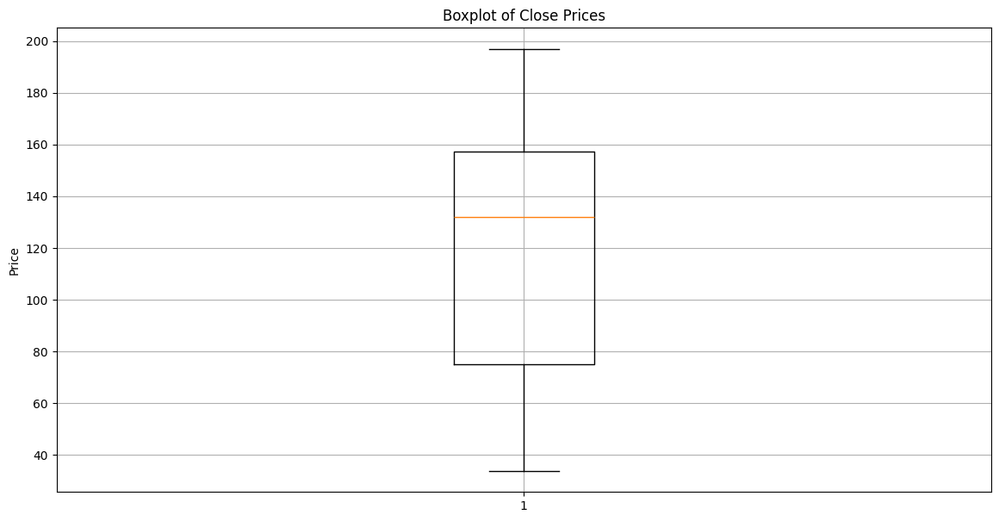

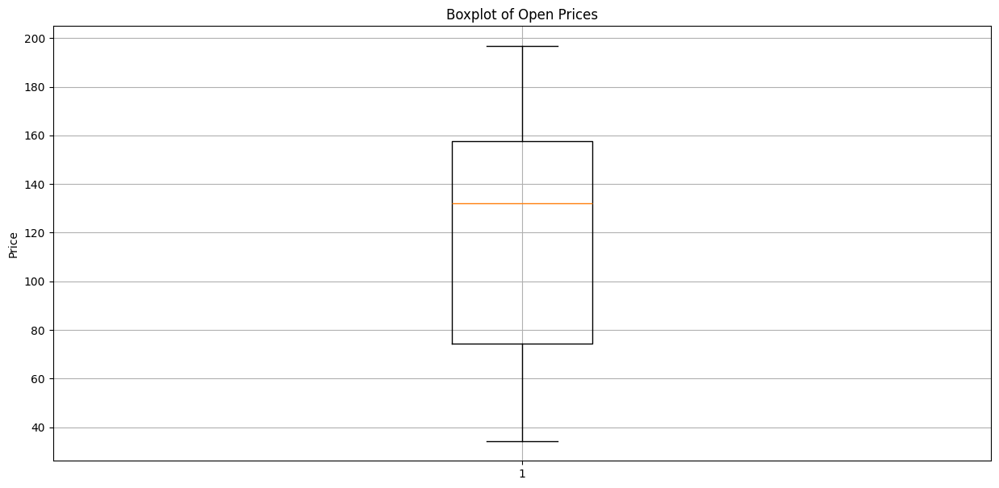

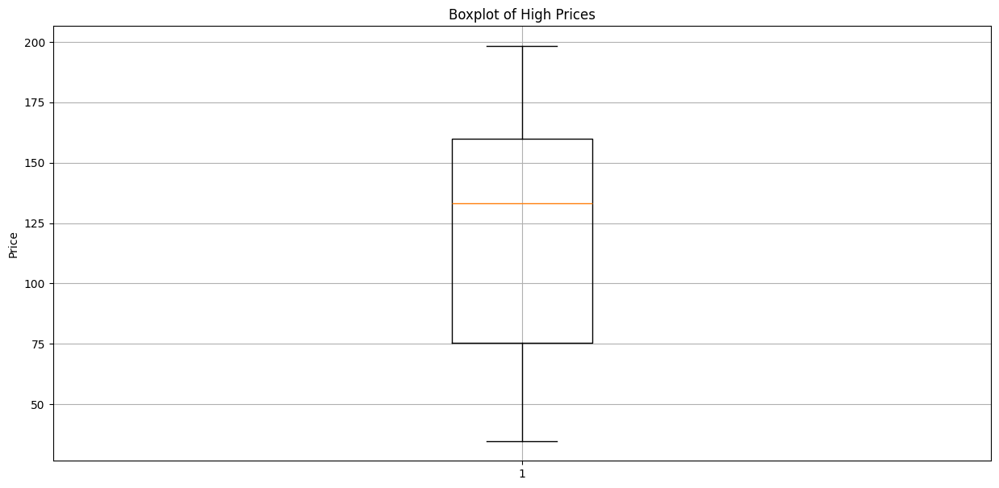

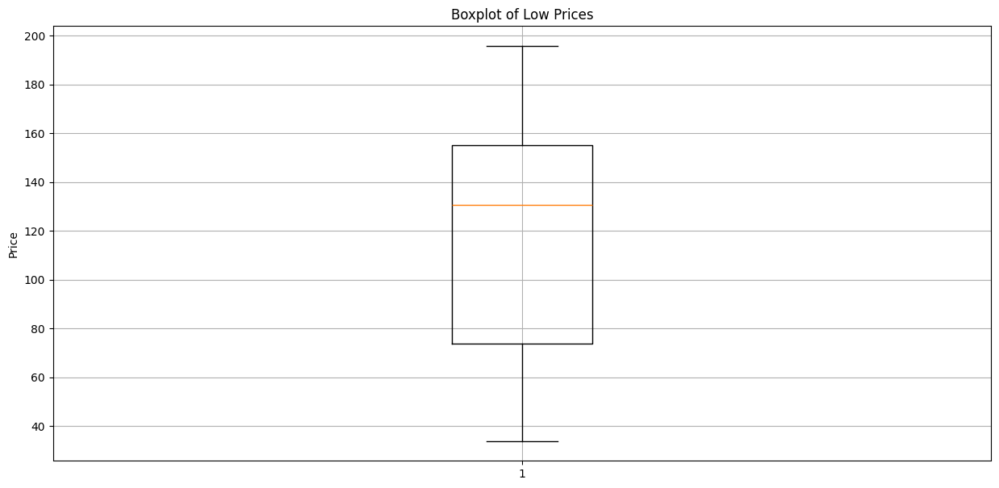

In [39]:
#Boxplots

plt.subplots(figsize=(14,7))
plt.boxplot(df_AAPL['Close'])
plt.grid(True)
plt.title('Boxplot of Close Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(df_AAPL['Open'])
plt.grid(True)
plt.title('Boxplot of Open Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(df_AAPL['High'])
plt.grid(True)
plt.title('Boxplot of High Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(df_AAPL['Low'])
plt.grid(True)
plt.title('Boxplot of Low Prices')
plt.ylabel('Price')
plt.show()

#####Linecharts

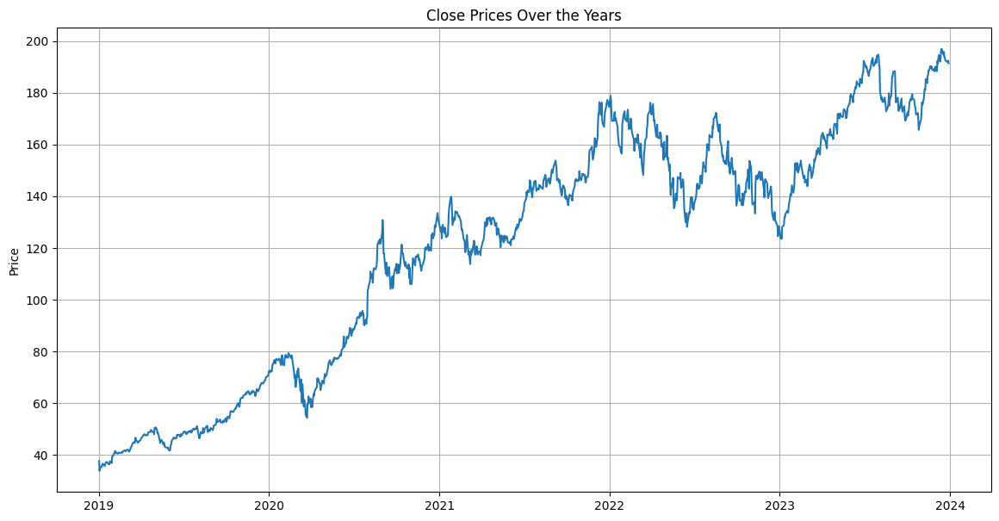

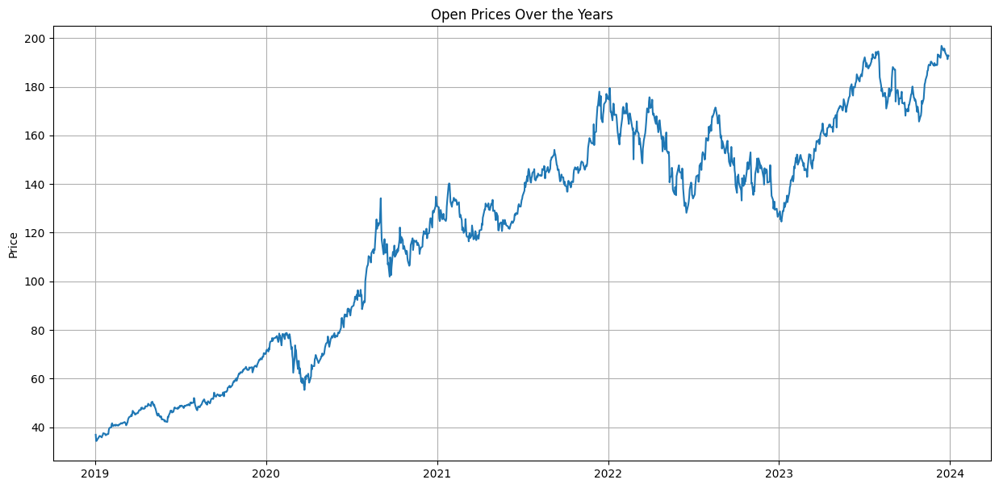

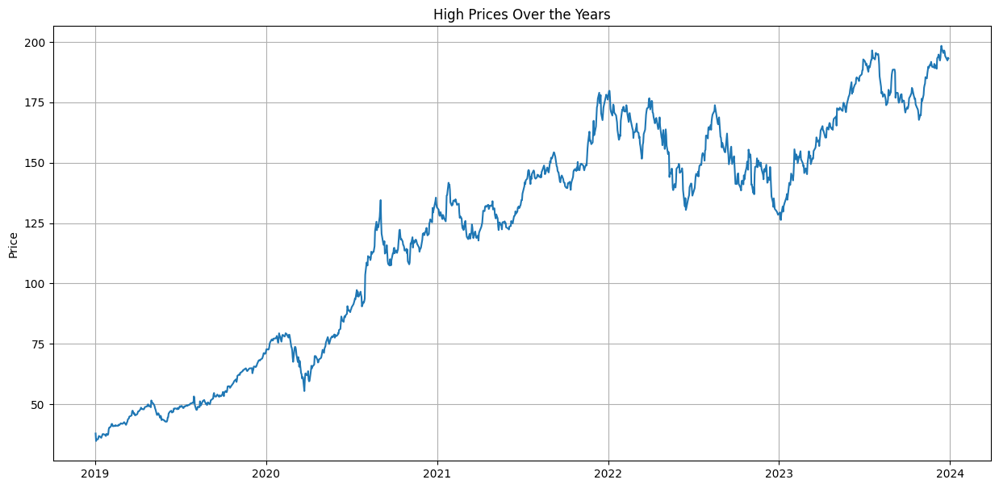

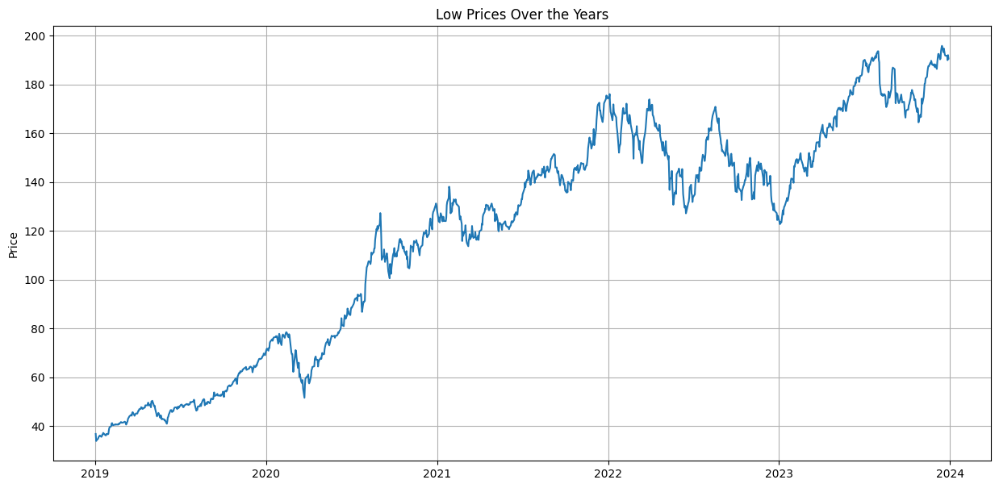

In [40]:
#Linecharts

plt.subplots(figsize=(14,7))
plt.plot(df_AAPL['Date'], df_AAPL['Close'])
plt.grid(True)
plt.title('Close Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(df_AAPL['Date'], df_AAPL['Open'])
plt.grid(True)
plt.title('Open Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(df_AAPL['Date'], df_AAPL['High'])
plt.grid(True)
plt.title('High Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(df_AAPL['Date'], df_AAPL['Low'])
plt.grid(True)
plt.title('Low Prices Over the Years')
plt.ylabel('Price')
plt.show()

**Analysis**

- Steady Growth: Apple's stock price has exhibited a strong upward trend since 2019.

- Volatility: Notable dips in early 2020 (pandemic crash) and 2022 but followed by recovery.

- Recent Performance: Prices are near historical highs, showing strong investor confidence.


#####Time Series Components


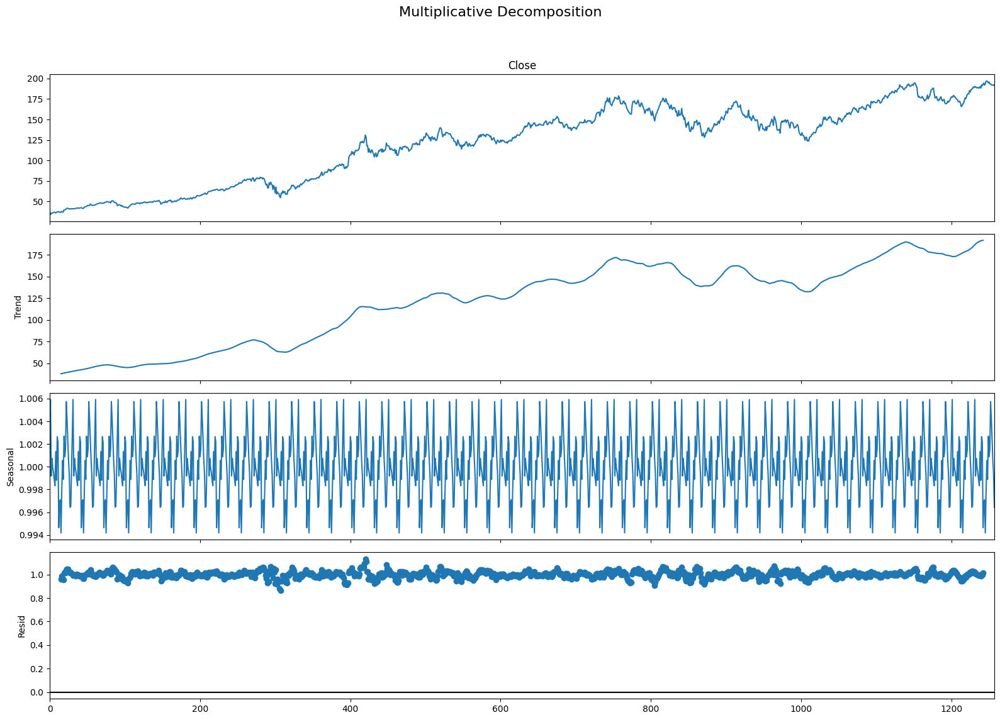

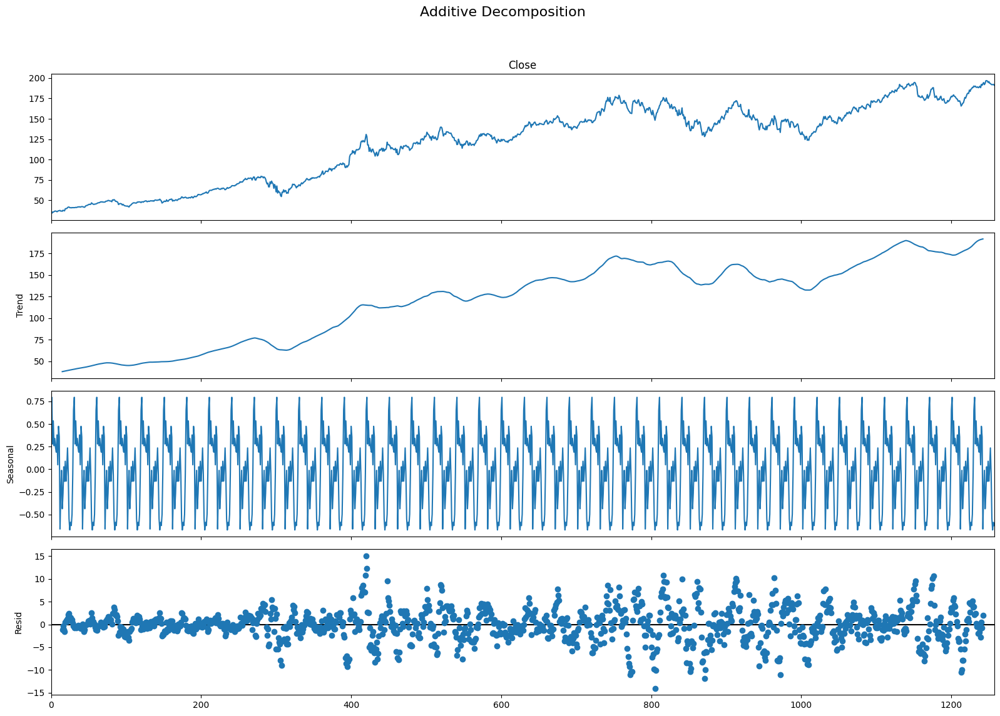

In [41]:
# Multiplicative Decomposition
multiplicative_decomposition = seasonal_decompose(df_AAPL['Close'], model='multiplicative', period=30)

# Additive Decomposition
additive_decomposition = seasonal_decompose(df_AAPL['Close'], model='additive', period=30)

# Plot
plt.rcParams.update({'figure.figsize': (16,12)})
multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

additive_decomposition.plot().suptitle('Additive Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

**Analysis**

- Strong Long-Term Growth: Prices have consistently trended upward, especially post-2020.

- Cyclical Corrections: Noticeable dips in mid-2022 and mid-2023, aligning with market downturns.

- Volatility Patterns: Periods of rapid price increases followed by short-term corrections.

- Seasonality: Recurring fluctuations suggest patterns related to earnings reports or market cycles.

- Stable Trend with Minor Shocks: Residuals indicate occasional market shocks but nothing drastic.


####Bivariate

<Axes: xlabel='Price', ylabel='Price'>

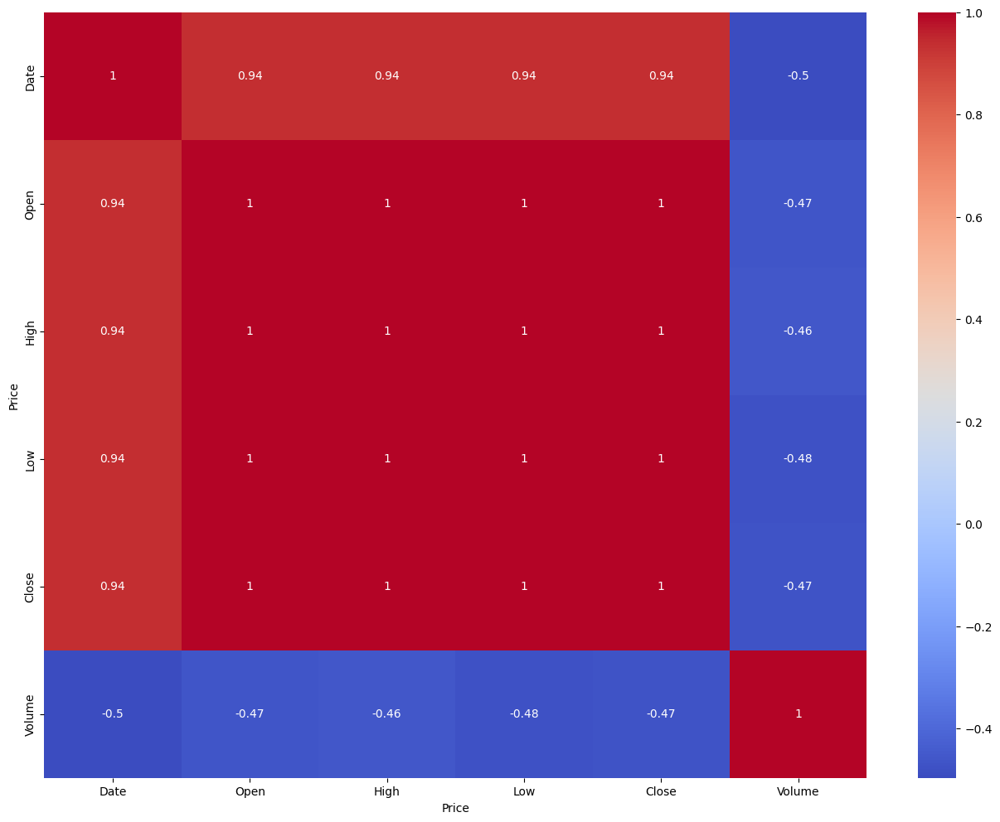

In [42]:
df_AAPL.corr()
sns.heatmap(df_AAPL.corr(), annot=True, cmap='coolwarm')

**Analysis**

- Strong Positive Correlation: Open, High, Low, and Close prices are nearly perfectly correlated (~1), indicating consistency in price movements.


- Negative Correlation with Volume: Trading volume has a moderate negative correlation (~-0.5) with prices, suggesting higher volume often occurs during price declines.

- Time Trend Impact: The strong correlation between Date and prices (~0.94) confirms a long-term upward trend.

####Multivariate

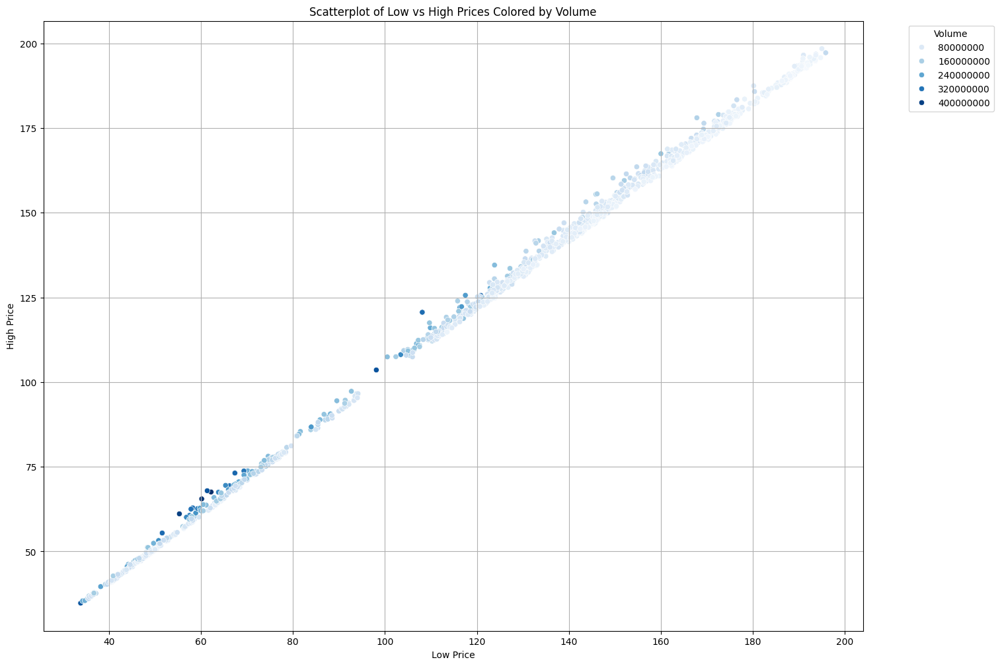

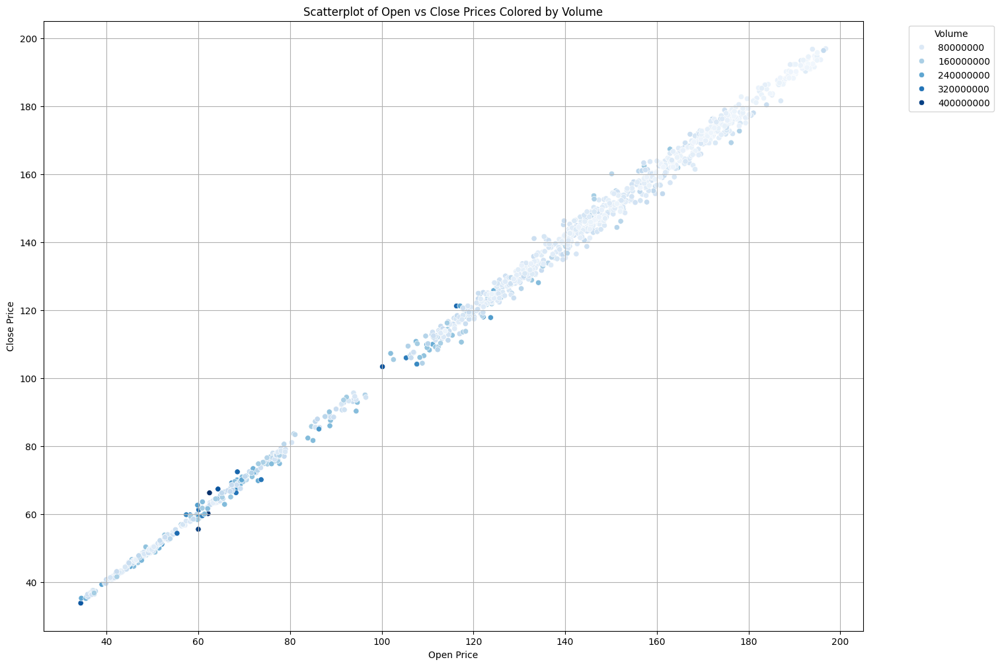

In [43]:
#Scater Plot Low VS High by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=df_AAPL, x='Low', y='High', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Low vs High Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Low Price')
plt.ylabel('High Price')
plt.show()

#Scater Plot Open VS Close by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=df_AAPL, x='Open', y='Close', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Open vs Close Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Open Price')
plt.ylabel('Close Price')
plt.show()

**Analysis**

**Low vs. High Prices (Colored by Volume**)

- Strong positive correlation between low and high prices.
- Higher volumes (darker points) tend to occur around specific price ranges, indicating increased trading activity during certain market conditions.
- Some outliers with significantly higher/lower daily price fluctuations suggest volatility.

**Open vs. Close Prices (Colored by Volume)**

- Highly linear relationship, confirming that open and close prices remain closely tied.
- Variability in volume is not uniform, with higher volumes clustering around specific price levels.
- The most volatile days show wider price differences between open and close prices.

##Occidental Petroleum

In [44]:
today = date.today()
end_date = today.strftime("2024-01-01")

d1 = date.today() - timedelta(days=1460)
start_date = d1.strftime("2019-01-01")

data = yf.download('OXY', start=start_date, end=end_date, progress=False)
data.reset_index(inplace=True)
df_OXY = data[["Date", "Open", "High", "Low", "Close", "Volume"]]

df_OXY.columns = df_OXY.columns.get_level_values(0)  # Removing the second level of my dataframe (Ticker OXY), since we are only analyzing one stock, there is no need for a MultiIndex
df_OXY.head()

Price,Date,Open,High,Low,Close,Volume
0,2019-01-02,52.849432,54.491153,52.150828,54.141850,5355300
1,2019-01-03,54.299031,54.491149,53.032810,53.478172,5465500
2,2019-01-04,54.386351,55.381862,54.168037,55.198479,6367400
3,2019-01-07,55.495387,57.049784,54.796783,56.307518,5771600
4,2019-01-08,57.023586,57.905569,56.674283,56.752872,5420100


In [45]:
df_OXY.describe()

Price,Date,Open,High,Low,Close,Volume
count,1258,1258.000000,1258.000000,1258.000000,1258.000000,1.258000e+03
mean,2021-06-30 18:48:38.918918912,41.751917,42.476383,41.019033,41.733307,1.866609e+07
min,2019-01-02 00:00:00,8.374247,8.817026,8.200987,8.547510,2.446300e+06
25%,2020-04-01 06:00:00,25.557709,26.112012,24.933705,25.615745,9.584000e+06
50%,2021-06-30 12:00:00,41.882343,42.331412,41.154661,41.806644,1.505200e+07
75%,2022-09-28 18:00:00,58.942485,59.642693,58.176669,58.984051,2.279930e+07
max,2023-12-29 00:00:00,73.514877,74.703546,71.835920,73.728394,1.346690e+08
std,NaN,18.494806,18.664092,18.326649,18.497052,1.451471e+07


In [46]:
df_OXY.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1258 entries, 0 to 1257
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1258 non-null   datetime64[ns]
 1   Open    1258 non-null   float64       
 2   High    1258 non-null   float64       
 3   Low     1258 non-null   float64       
 4   Close   1258 non-null   float64       
 5   Volume  1258 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 59.1 KB


In [47]:
df_OXY.isnull().sum()

,0
Price,
Date,0
Open,0
High,0
Low,0
Close,0
Volume,0


###EDA

####Univariate

#####Histograms

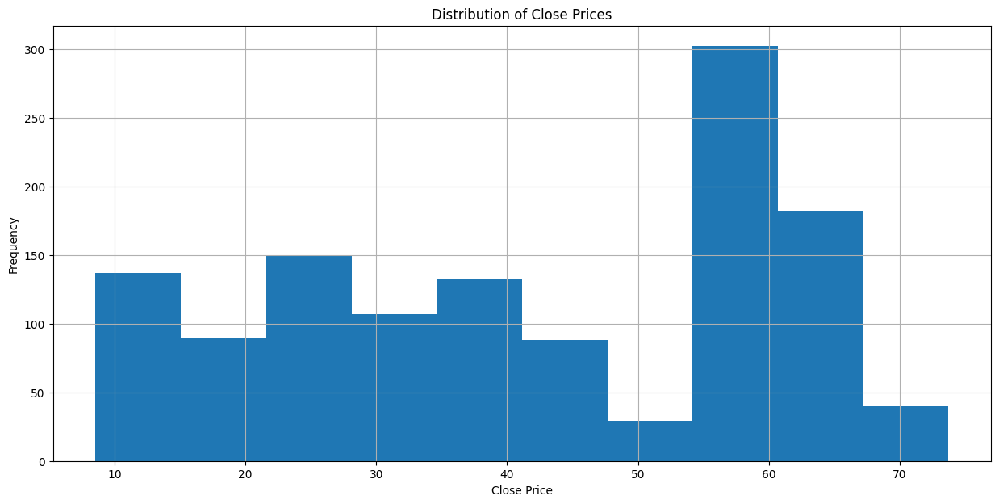

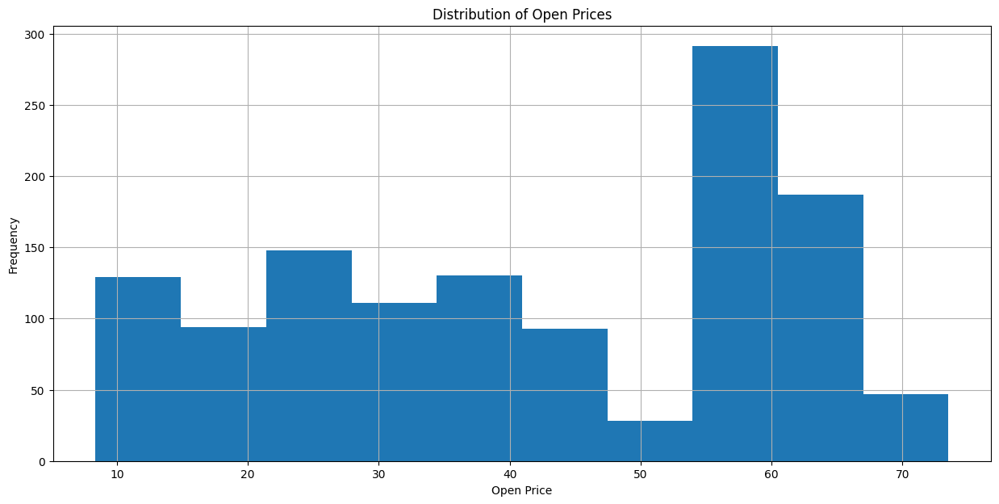

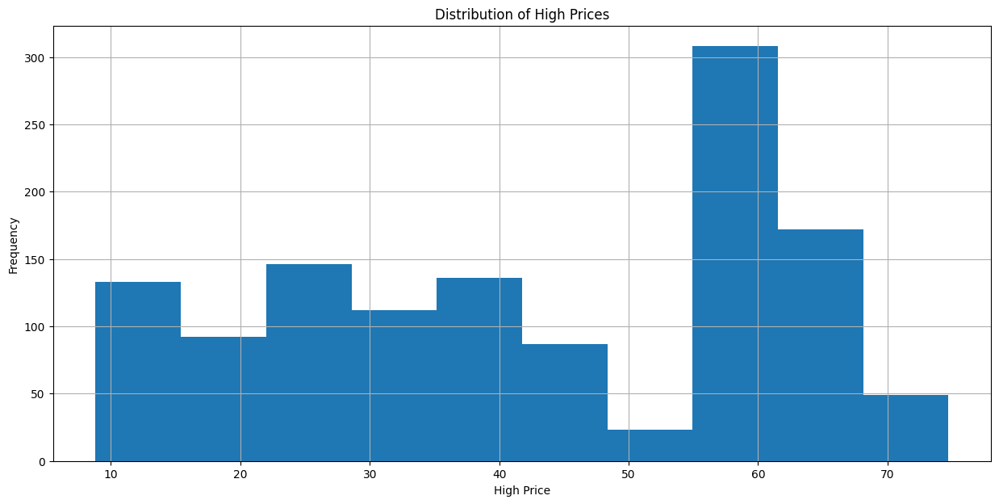

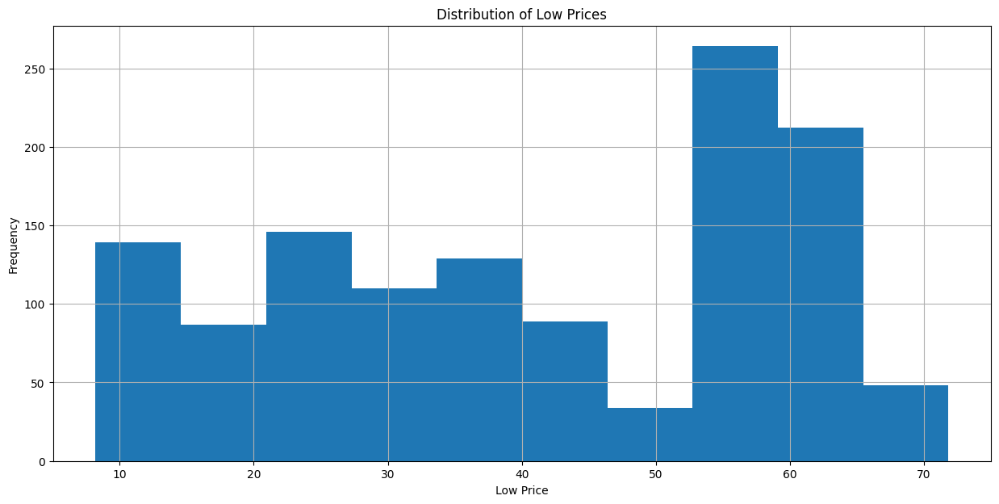

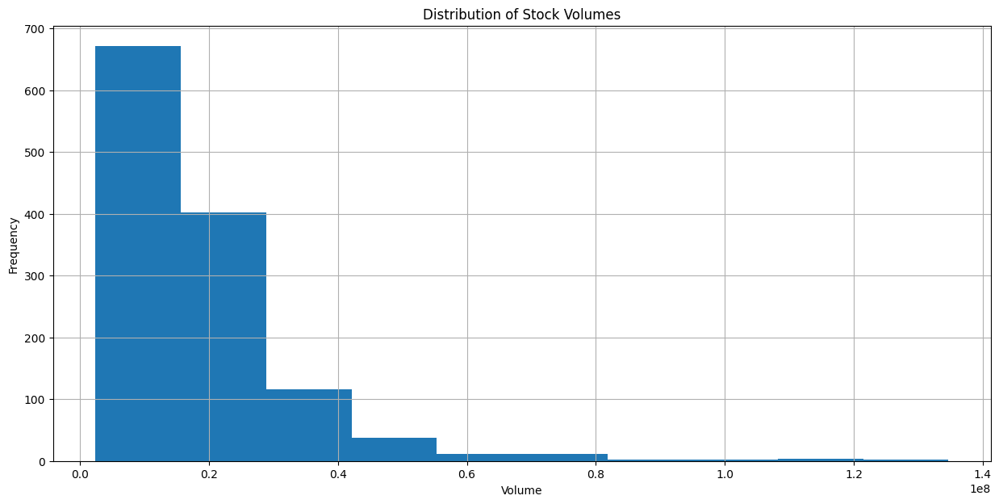

In [48]:
#Histograms

plt.subplots(figsize=(15,7))
plt.hist(df_OXY['Close'])
plt.grid(True)
plt.title('Distribution of Close Prices')
plt.xlabel('Close Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_OXY['Open'])
plt.grid(True)
plt.title('Distribution of Open Prices')
plt.xlabel('Open Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_OXY['High'])
plt.grid(True)
plt.title('Distribution of High Prices')
plt.xlabel('High Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_OXY['Low'])
plt.grid(True)
plt.title('Distribution of Low Prices')
plt.xlabel('Low Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(df_OXY['Volume'])
plt.grid(True)
plt.title('Distribution of Stock Volumes')
plt.xlabel('Volume')
plt.ylabel('Frequency')
plt.show()

**Analysis**

- OXY’s stock has experienced two distinct price ranges, indicating significant market shifts, likely due to oil price cycles or economic events.

- The distribution of low prices is skewed downward, suggesting sharp declines before recovery, a sign of high volatility in certain periods.


- Trading volume is right-skewed, meaning that while daily volumes are typically moderate, certain events cause massive surges in trading activity.

- The stock’s price distribution and volume trends suggest external factors, such as oil price fluctuations, earnings reports, or geopolitical events, strongly impact OXY’s valuation.

#####Boxplots

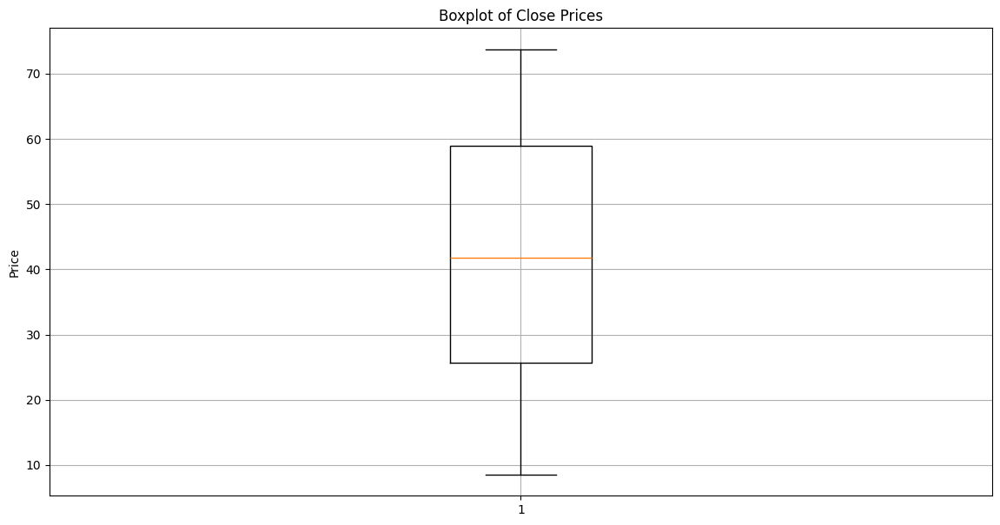

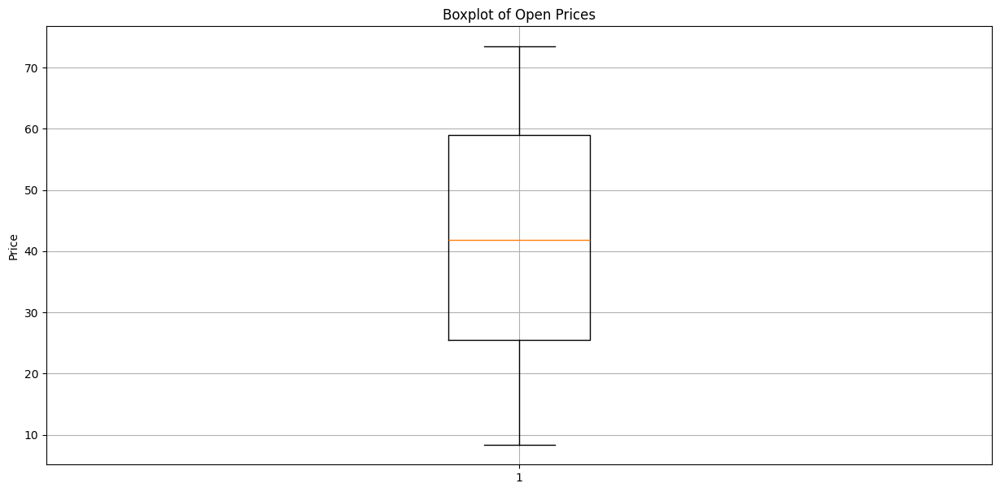

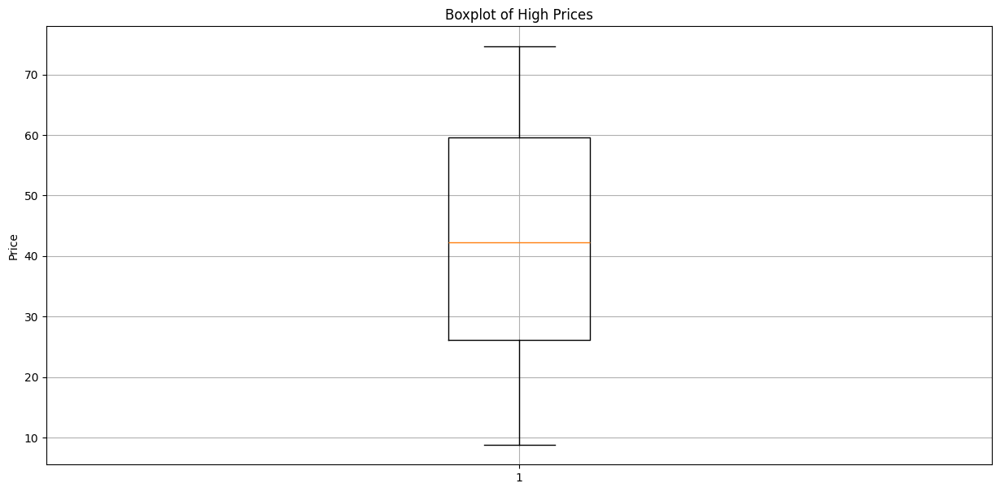

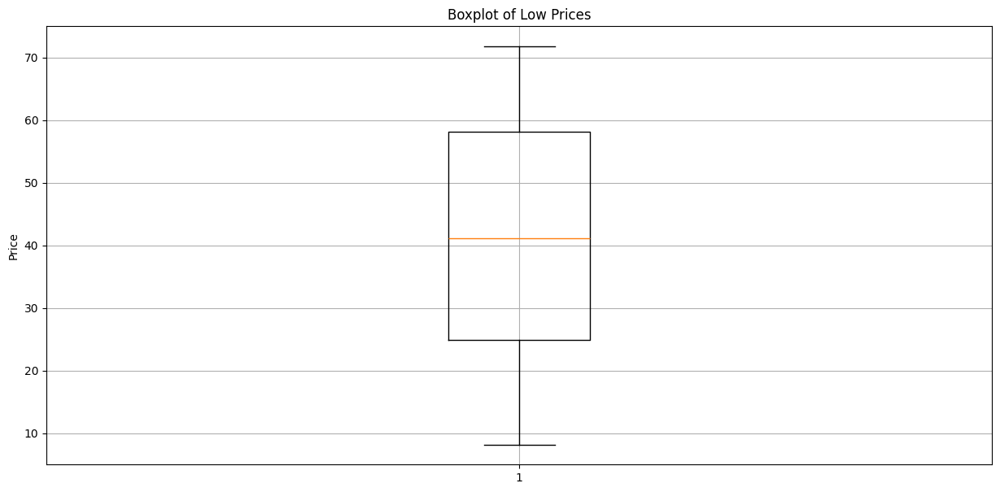

In [49]:
#Boxplots

plt.subplots(figsize=(14,7))
plt.boxplot(df_OXY['Close'])
plt.grid(True)
plt.title('Boxplot of Close Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(df_OXY['Open'])
plt.grid(True)
plt.title('Boxplot of Open Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(df_OXY['High'])
plt.grid(True)
plt.title('Boxplot of High Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(df_OXY['Low'])
plt.grid(True)
plt.title('Boxplot of Low Prices')
plt.ylabel('Price')
plt.show()

#####Linecharts

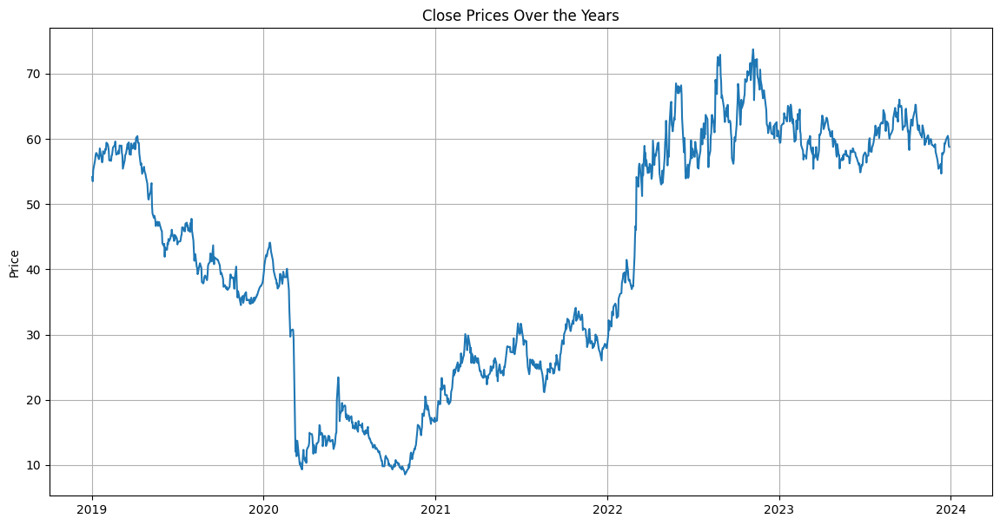

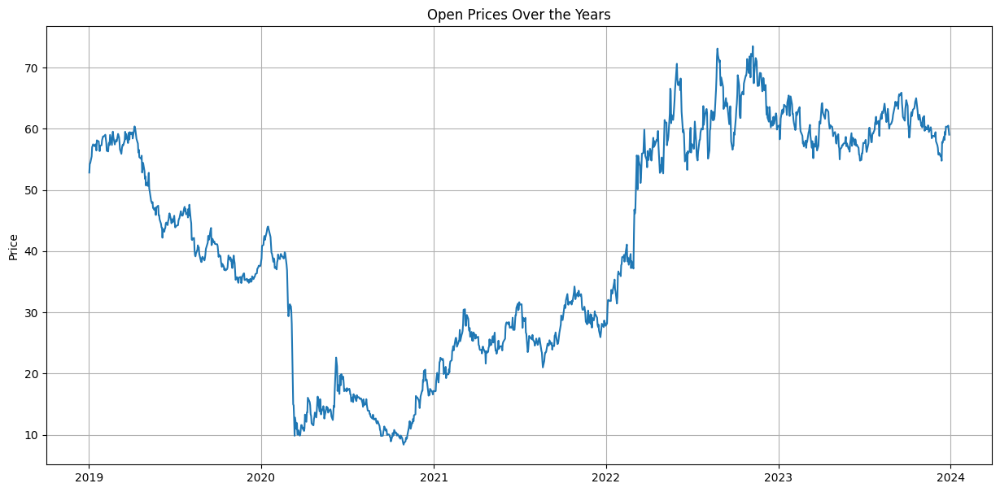

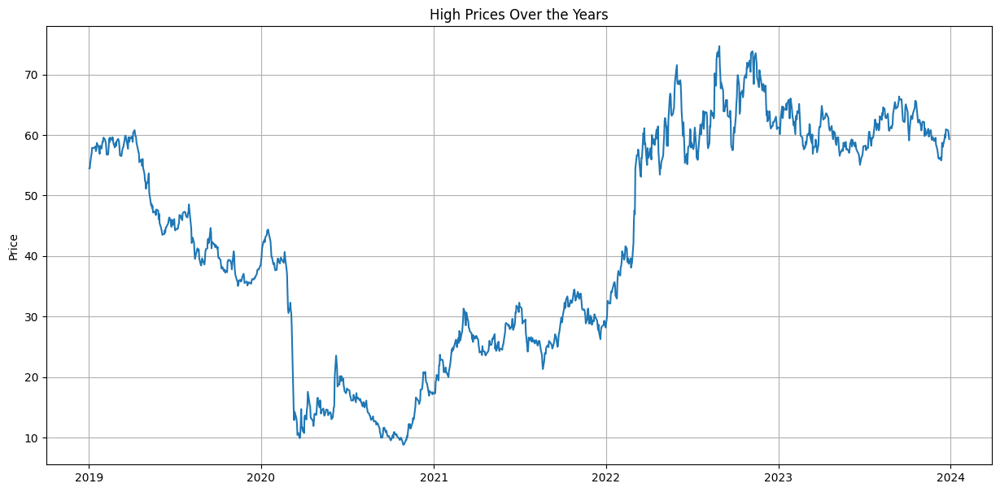

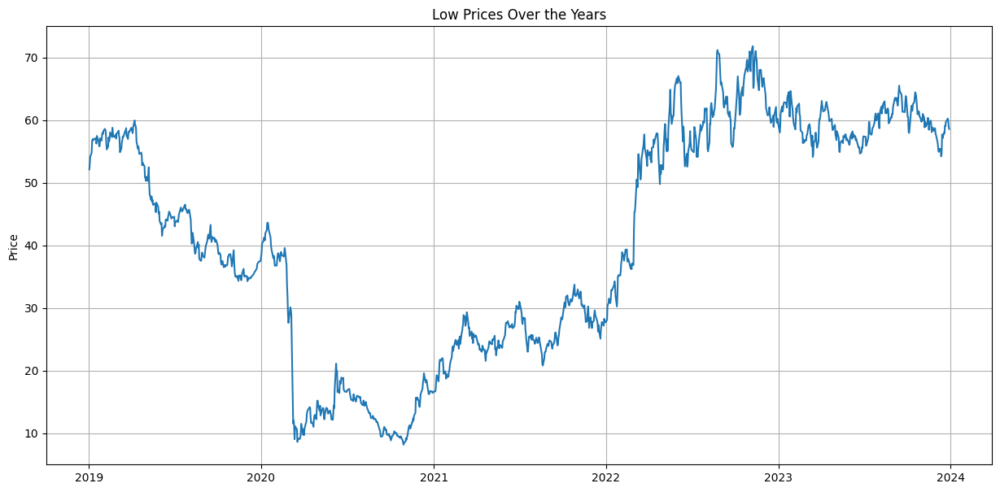

In [50]:
#Linecharts

plt.subplots(figsize=(14,7))
plt.plot(df_OXY['Date'], df_OXY['Close'])
plt.grid(True)
plt.title('Close Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(df_OXY['Date'], df_OXY['Open'])
plt.grid(True)
plt.title('Open Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(df_OXY['Date'], df_OXY['High'])
plt.grid(True)
plt.title('High Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(df_OXY['Date'], df_OXY['Low'])
plt.grid(True)
plt.title('Low Prices Over the Years')
plt.ylabel('Price')
plt.show()

**Analysis**

- High Volatility: Sharp decline in 2020, strong recovery in 2022, followed by stabilization in 2023.

- Market Sensitivity: Price reacts to oil market fluctuations, economic cycles, and external events.

- Trend Consistency: Open, High, Low, and Close prices follow the same trajectory.

- Support & Resistance: Price appears to be stabilizing, indicating key levels for future movements.


#####Time Series Components

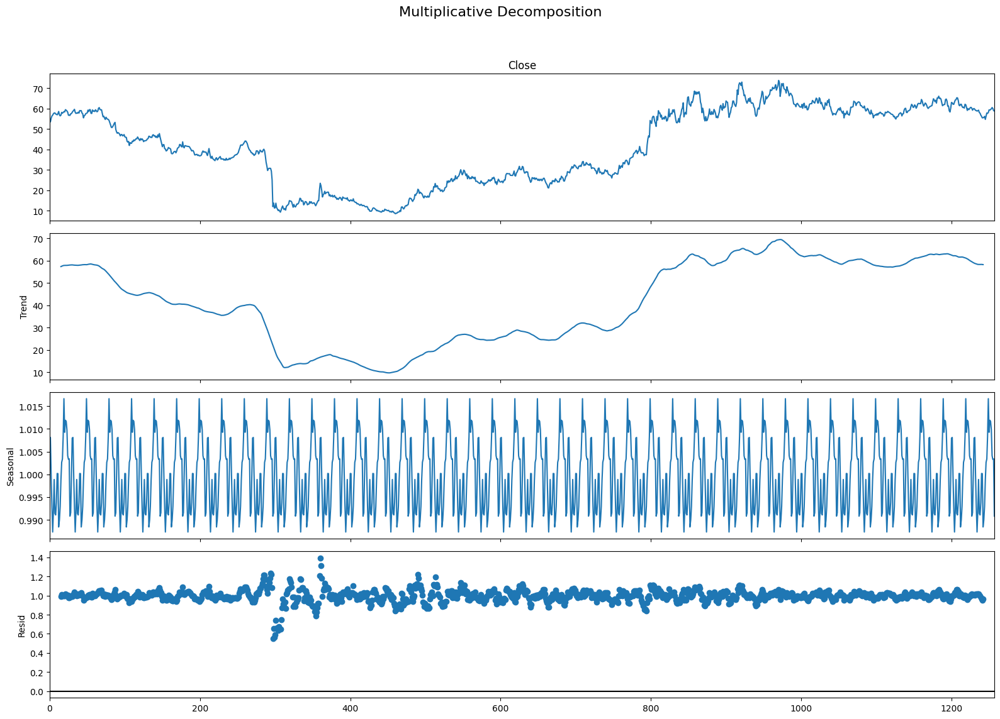

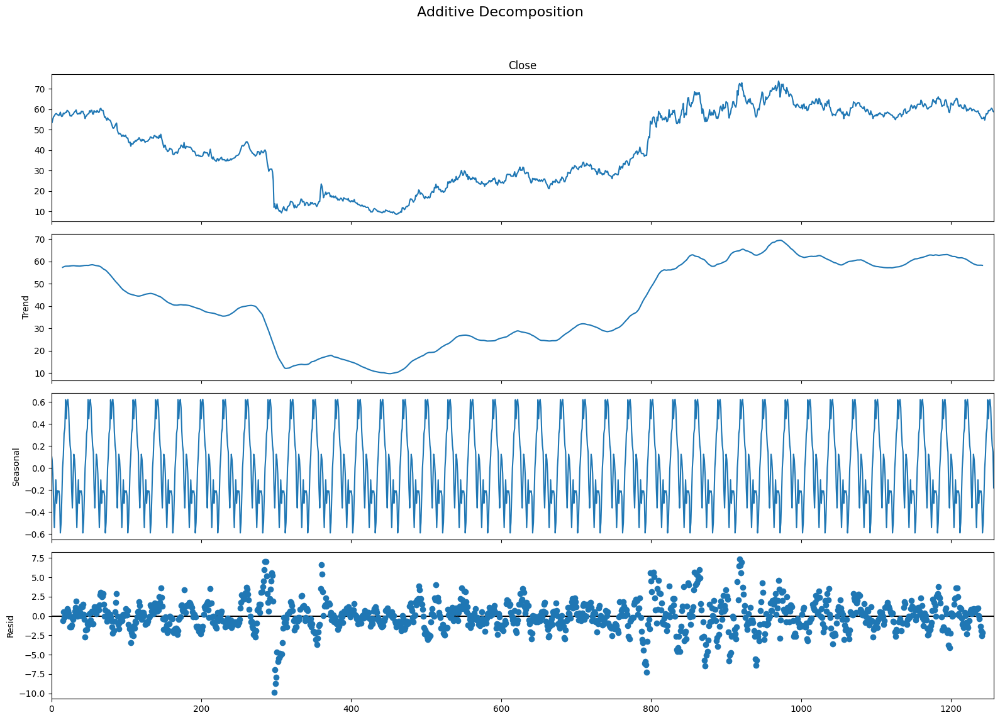

In [51]:
# Multiplicative Decomposition
multiplicative_decomposition = seasonal_decompose(df_OXY['Close'], model='multiplicative', period=30)

# Additive Decomposition
additive_decomposition = seasonal_decompose(df_OXY['Close'], model='additive', period=30)

# Plot
plt.rcParams.update({'figure.figsize': (16,12)})
multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

additive_decomposition.plot().suptitle('Additive Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

**Analysis**

- Trend: Significant decline from 2019 to 2020, followed by a strong recovery starting in 2021, peaking in 2023, and stabilizing afterward.

- Seasonality: Clear periodic fluctuations, indicating cyclical price patterns.

- Volatility: High fluctuations post-2021, suggesting increased market activity.
Residuals: Higher variance during major price shifts, reinforcing the impact of external events.


- Implications: OXY's stock price is heavily influenced by macroeconomic and industry trends, with clear cycles of downturn and recovery.







####Bivariate

<Axes: xlabel='Price', ylabel='Price'>

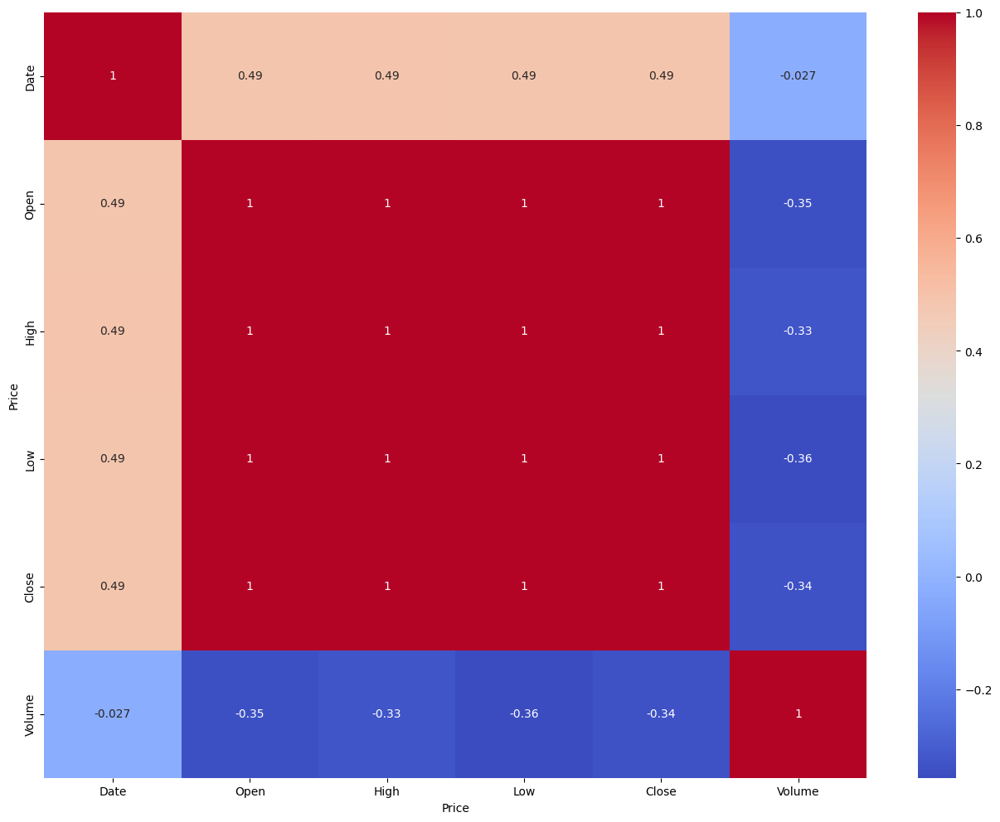

In [52]:
df_OXY.corr()
sns.heatmap(df_OXY.corr(), annot=True, cmap='coolwarm')

**Analysis**

- Strong Positive Correlation (1.00): Open, High, Low, and Close prices are nearly identical in movement, indicating that daily price fluctuations are highly synchronized.

- Moderate Positive Correlation (0.49) with Date: Suggests an upward trend in stock prices over time.

- Negative Correlation with Volume (-0.33 to -0.36): As trading volume increases, stock prices tend to decrease, indicating that higher selling pressure might drive prices down.

- Implications: OXY's stock price movements are highly interrelated, and volume trends may signal reversals or corrections.

####Multivariate

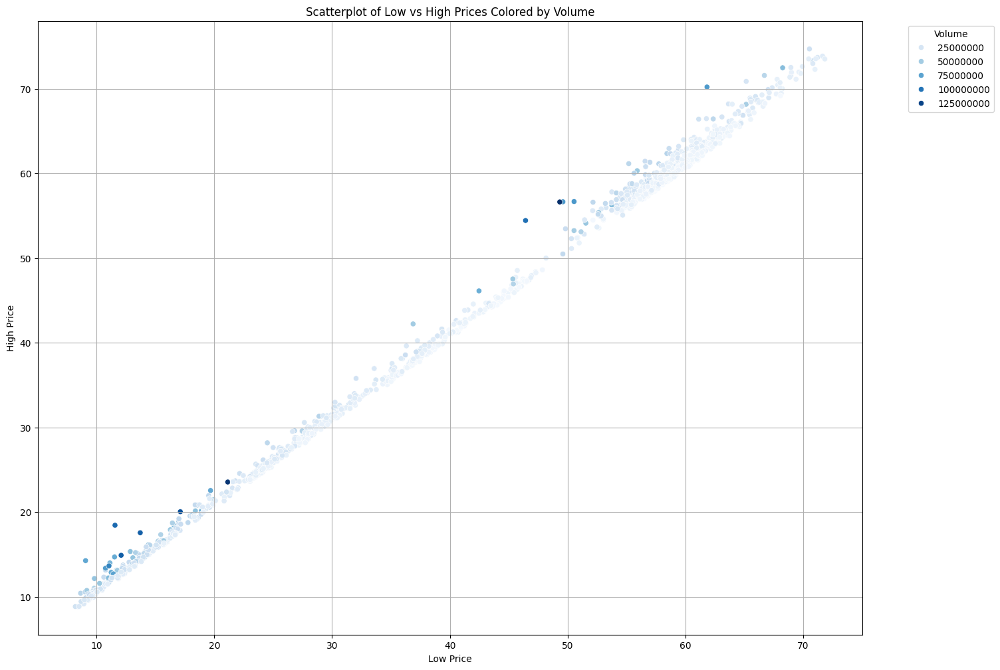

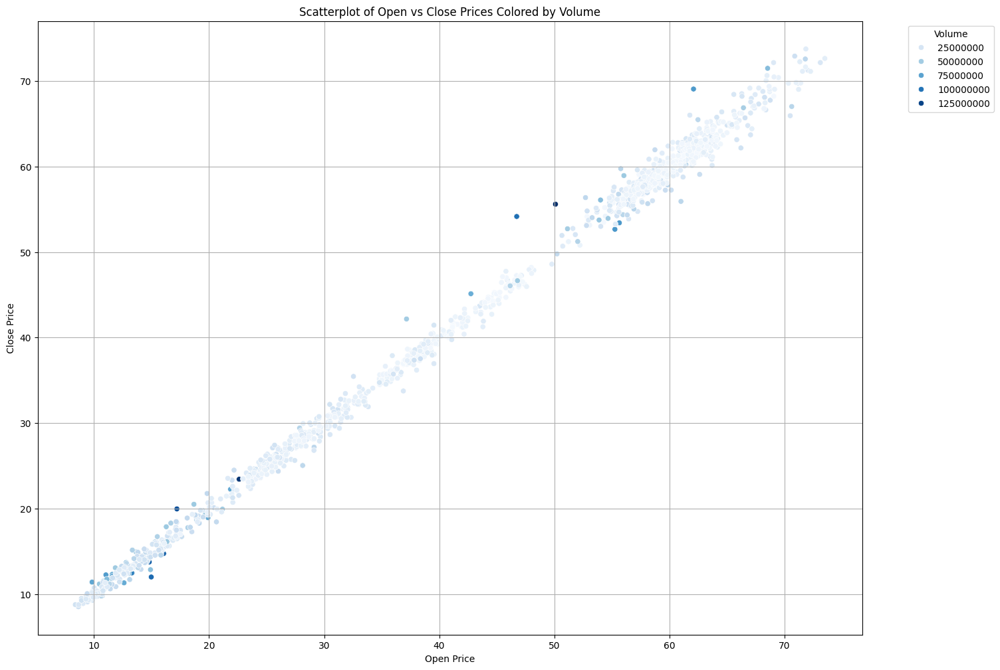

In [53]:
#Scater Plot Low VS High by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=df_OXY, x='Low', y='High', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Low vs High Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Low Price')
plt.ylabel('High Price')
plt.show()

#Scater Plot Open VS Close by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=df_OXY, x='Open', y='Close', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Open vs Close Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Open Price')
plt.ylabel('Close Price')
plt.show()

##American Express

American Express was founded in 1850 as a freight forwarding company and has evolved as a business since then. Now, it is a global financial company specializing in credit card and other payment products issuance.

In [54]:
today = date.today()
end_date = today.strftime("2024-01-01")

d1 = date.today() - timedelta(days=1460)
start_date = d1.strftime("2019-01-01")

data = yf.download('AXP', start=start_date, end=end_date, progress=False)
data.reset_index(inplace=True)
AXP_df = data[["Date", "Open", "High", "Low", "Close", "Volume"]]

AXP_df.columns = AXP_df.columns.get_level_values(0)  # Removing the second level of my dataframe (Ticker AXP), since we are only analyzing one stock, there is no need for a MultiIndex
AXP_df.head()

Price,Date,Open,High,Low,Close,Volume
0,2019-01-02,86.200401,88.366649,86.071888,87.825089,4175400
1,2019-01-03,87.364254,87.723701,85.926465,86.110794,4776600
2,2019-01-04,87.898830,90.645376,87.465648,89.990997,4637200
3,2019-01-07,90.110803,91.170715,89.419558,90.479469,3289000
4,2019-01-08,90.958750,91.723723,89.880401,90.921883,3227200


In [55]:
AXP_df.describe()

Price,Date,Open,High,Low,Close,Volume
count,1258,1258.000000,1258.000000,1258.000000,1258.000000,1.258000e+03
mean,2021-06-30 18:48:38.918918912,134.174129,135.673038,132.640442,134.175509,3.747538e+06
min,2019-01-02 00:00:00,67.795378,70.487010,62.617729,64.449539,6.658000e+05
25%,2020-04-01 06:00:00,109.795683,110.681732,108.846280,109.767860,2.584925e+06
50%,2021-06-30 12:00:00,141.321609,142.867701,139.359974,141.028885,3.210000e+06
75%,2022-09-28 18:00:00,158.239903,159.957161,156.858562,158.334496,4.203525e+06
max,2023-12-29 00:00:00,189.886372,191.857347,189.636400,190.732452,1.726170e+07
std,NaN,29.138308,29.360908,28.924929,29.140045,1.952430e+06


- Over the course of 5 years, American Express' stock price has averaged around the 130 dolars mark. The average minimum price has been around half of the average price, with the maximum being about 50 dolars above the average. All of them deviated from their average in the same way, with the lower prices deviating slightly less.

In [56]:
AXP_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1258 entries, 0 to 1257
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1258 non-null   datetime64[ns]
 1   Open    1258 non-null   float64       
 2   High    1258 non-null   float64       
 3   Low     1258 non-null   float64       
 4   Close   1258 non-null   float64       
 5   Volume  1258 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 59.1 KB


In [57]:
AXP_df.isnull().sum()

,0
Price,
Date,0
Open,0
High,0
Low,0
Close,0
Volume,0


###EDA

####Univariate

#####Histograms

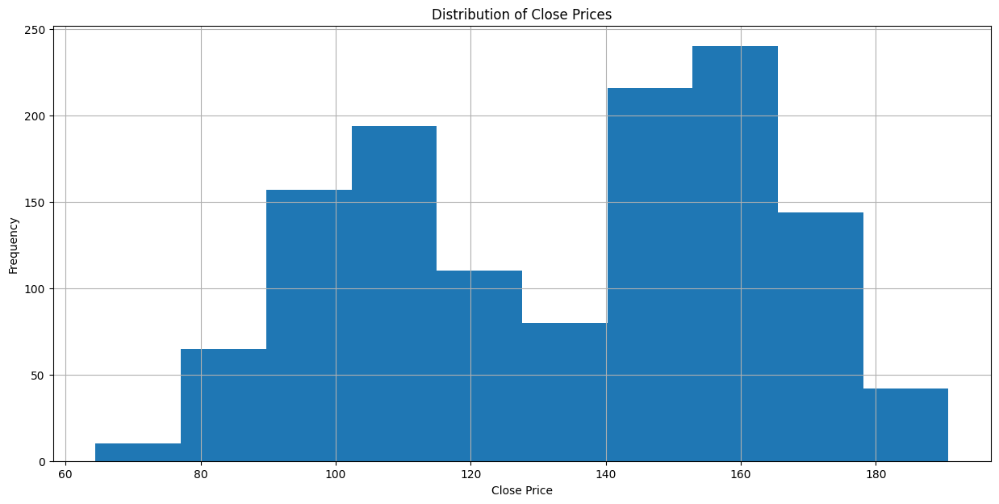

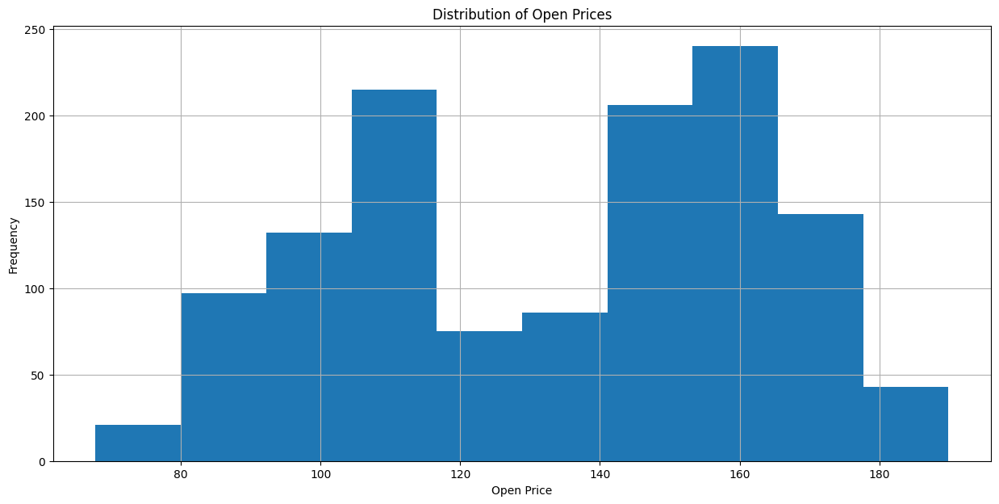

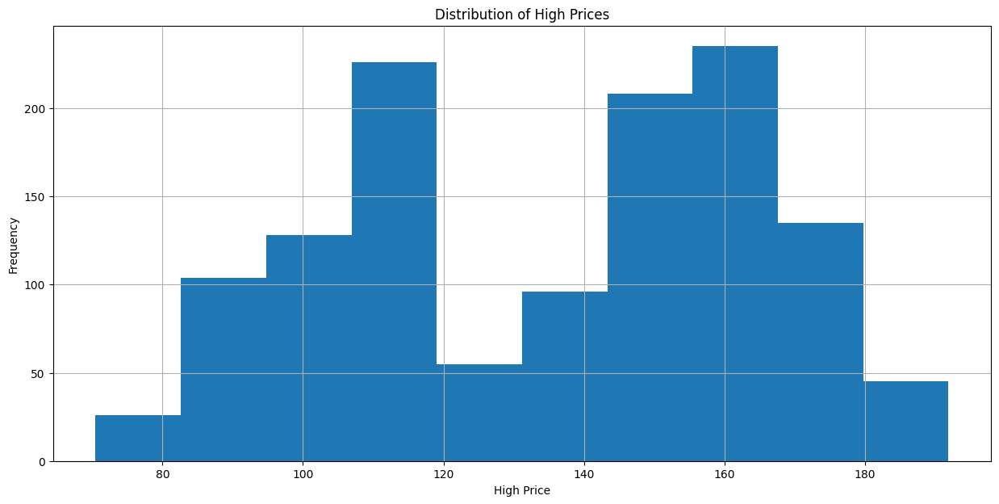

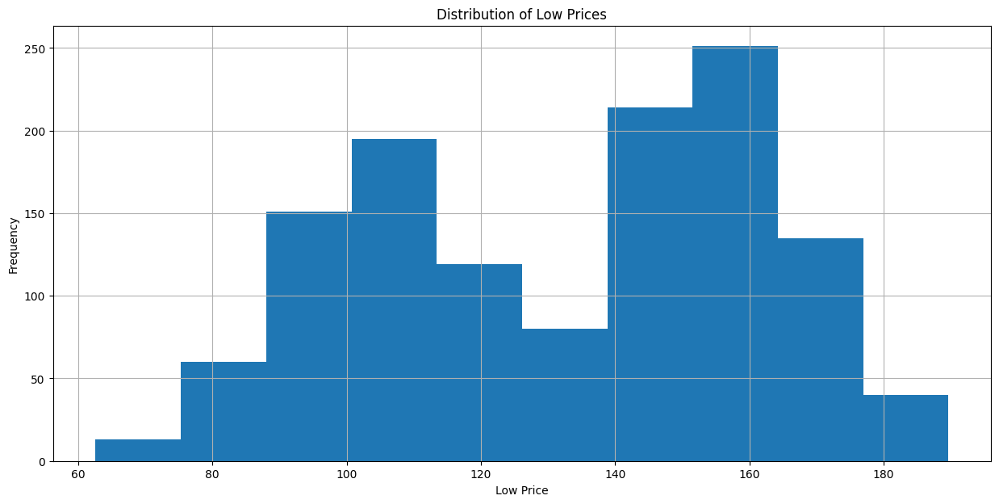

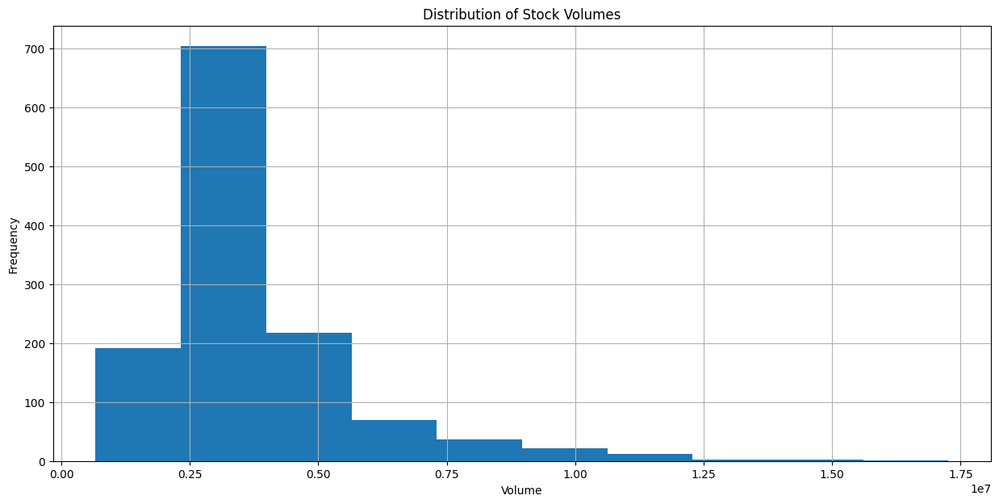

In [58]:
#Histograms


plt.subplots(figsize=(15,7))
plt.hist(AXP_df['Close'])
plt.grid(True)
plt.title('Distribution of Close Prices')
plt.xlabel('Close Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(AXP_df['Open'])
plt.grid(True)
plt.title('Distribution of Open Prices')
plt.xlabel('Open Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(AXP_df['High'])
plt.grid(True)
plt.title('Distribution of High Prices')
plt.xlabel('High Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(AXP_df['Low'])
plt.grid(True)
plt.title('Distribution of Low Prices')
plt.xlabel('Low Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(AXP_df['Volume'])
plt.grid(True)
plt.title('Distribution of Stock Volumes')
plt.xlabel('Volume')
plt.ylabel('Frequency')
plt.show()

- The distribution of prices for American Express is quite similar; all of them are left-skewed, while the volume of stocks is right-skewed.

#####Boxplots

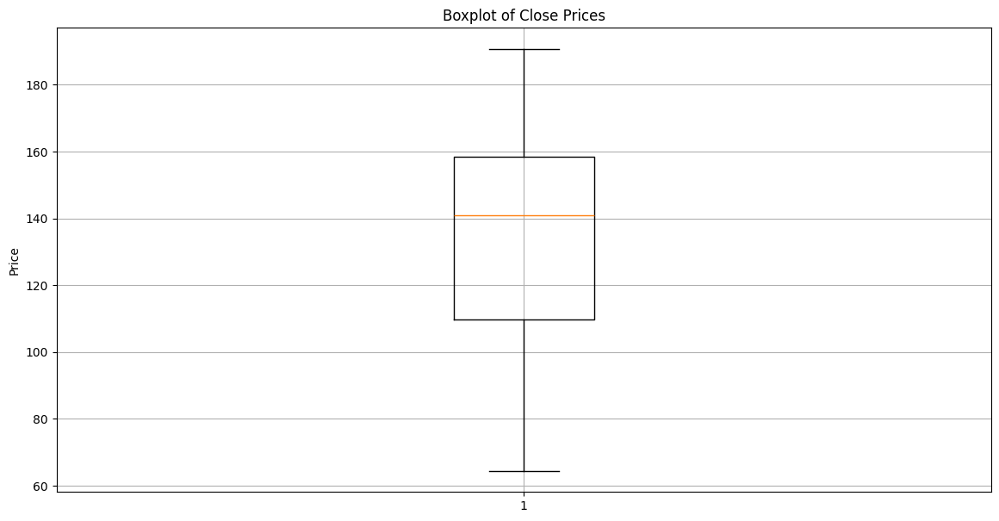

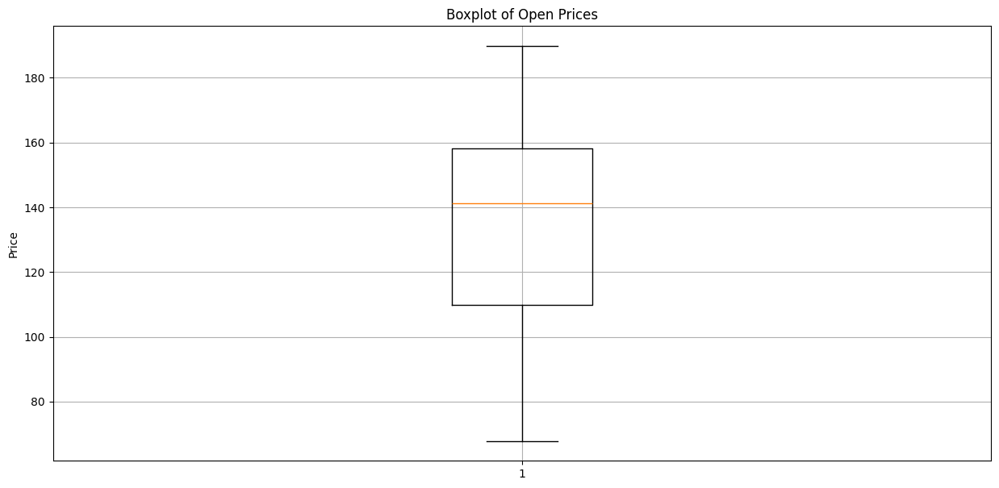

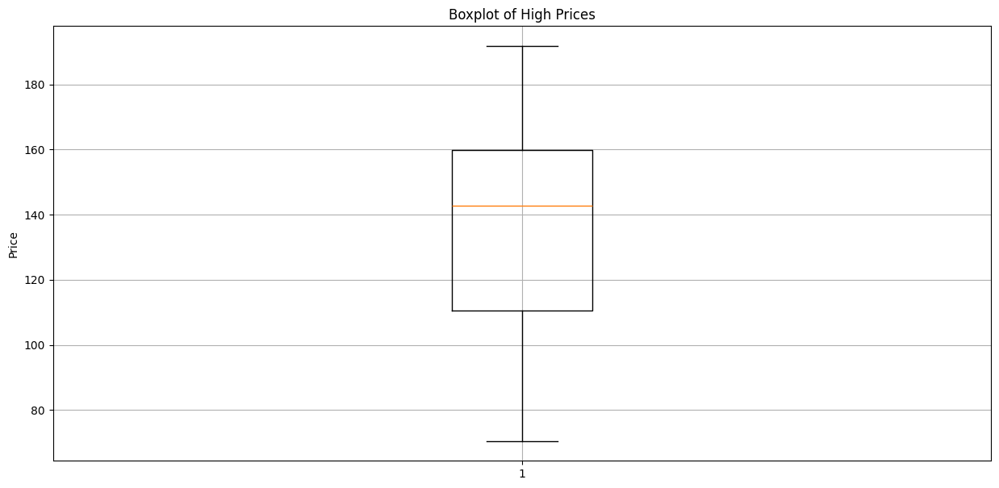

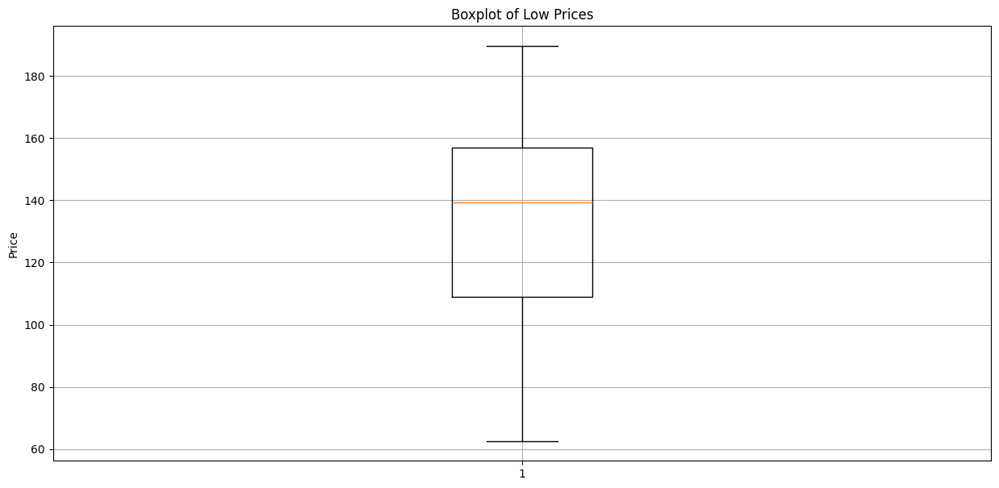

In [59]:
#Boxplots

plt.subplots(figsize=(14,7))
plt.boxplot(AXP_df['Close'])
plt.grid(True)
plt.title('Boxplot of Close Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(AXP_df['Open'])
plt.grid(True)
plt.title('Boxplot of Open Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(AXP_df['High'])
plt.grid(True)
plt.title('Boxplot of High Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(AXP_df['Low'])
plt.grid(True)
plt.title('Boxplot of Low Prices')
plt.ylabel('Price')
plt.show()

- There are no outliers. The median is around 140 dollars, while the minimum stays around 60 dollars and the maximum reaches around 185 dolars.


#####Linecharts

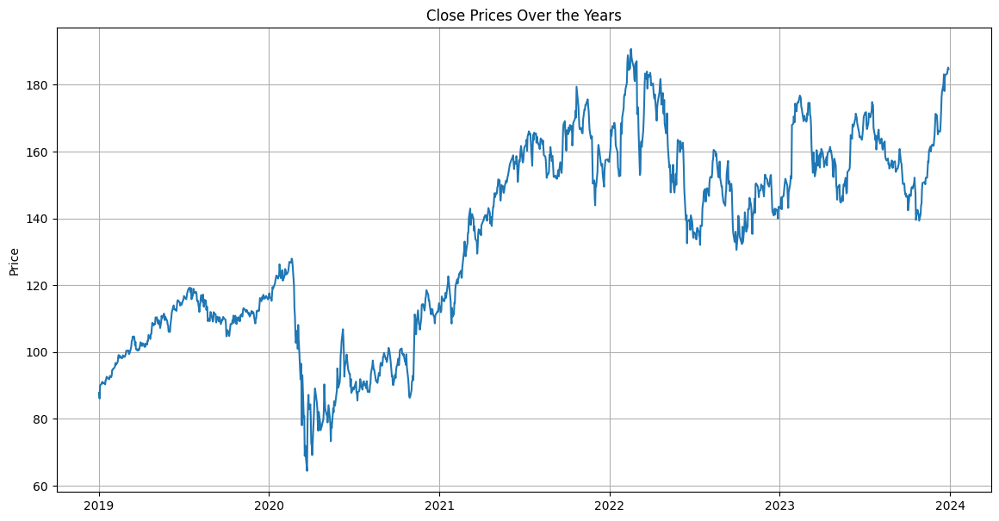

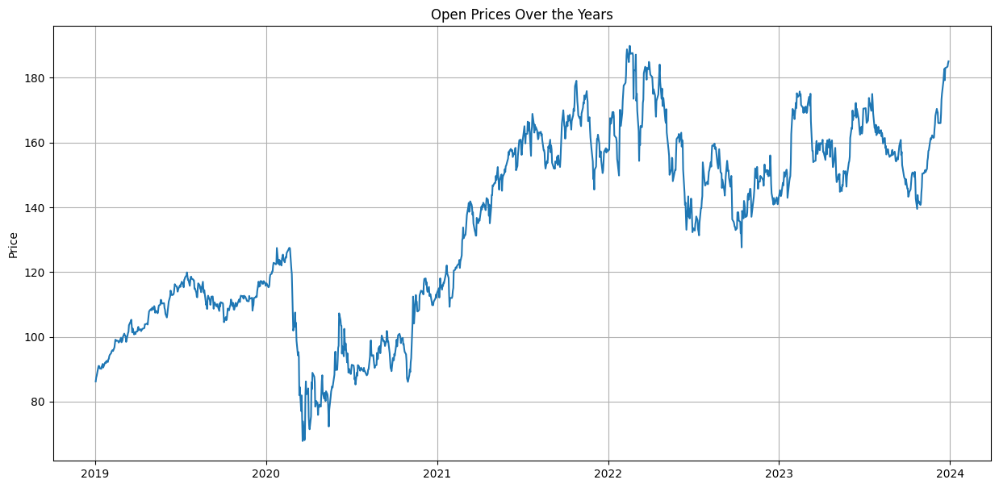

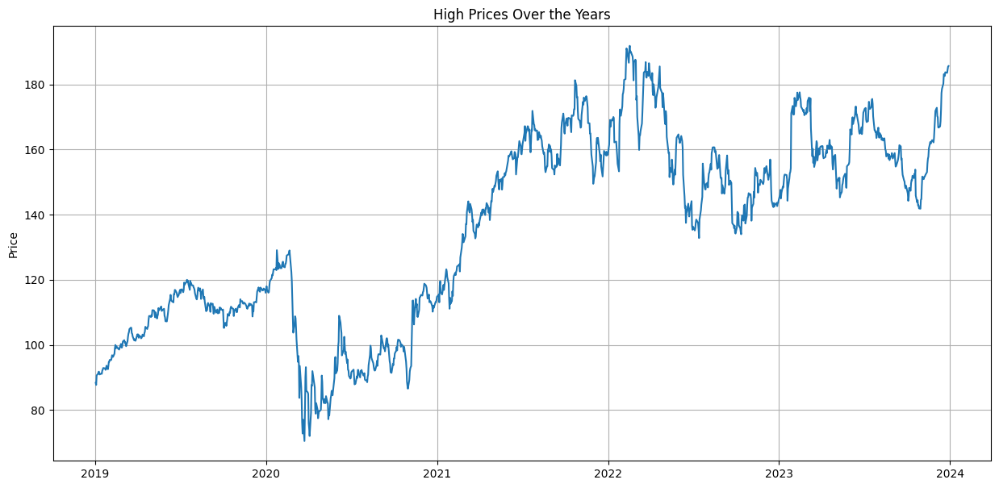

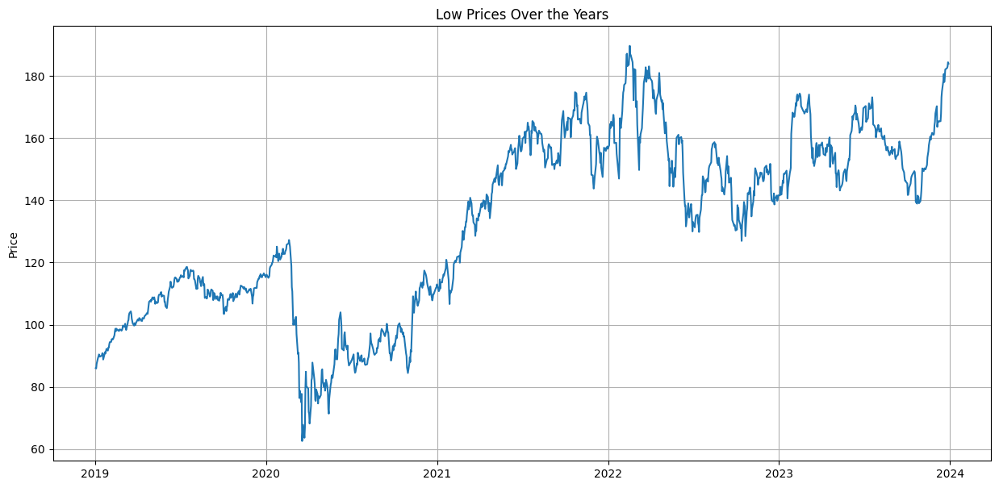

In [60]:
#Linecharts

plt.subplots(figsize=(14,7))
plt.plot(AXP_df['Date'], AXP_df['Close'])
plt.grid(True)
plt.title('Close Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(AXP_df['Date'], AXP_df['Open'])
plt.grid(True)
plt.title('Open Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(AXP_df['Date'], AXP_df['High'])
plt.grid(True)
plt.title('High Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(AXP_df['Date'], AXP_df['Low'])
plt.grid(True)
plt.title('Low Prices Over the Years')
plt.ylabel('Price')
plt.show()

- The stock price's behavior has been quite similar as well, with a major drop in 2020 due to the irregular event of the global COVID-19 pandemic, when it reached its minimum, but overall trending upwards.

#####Time Series Components

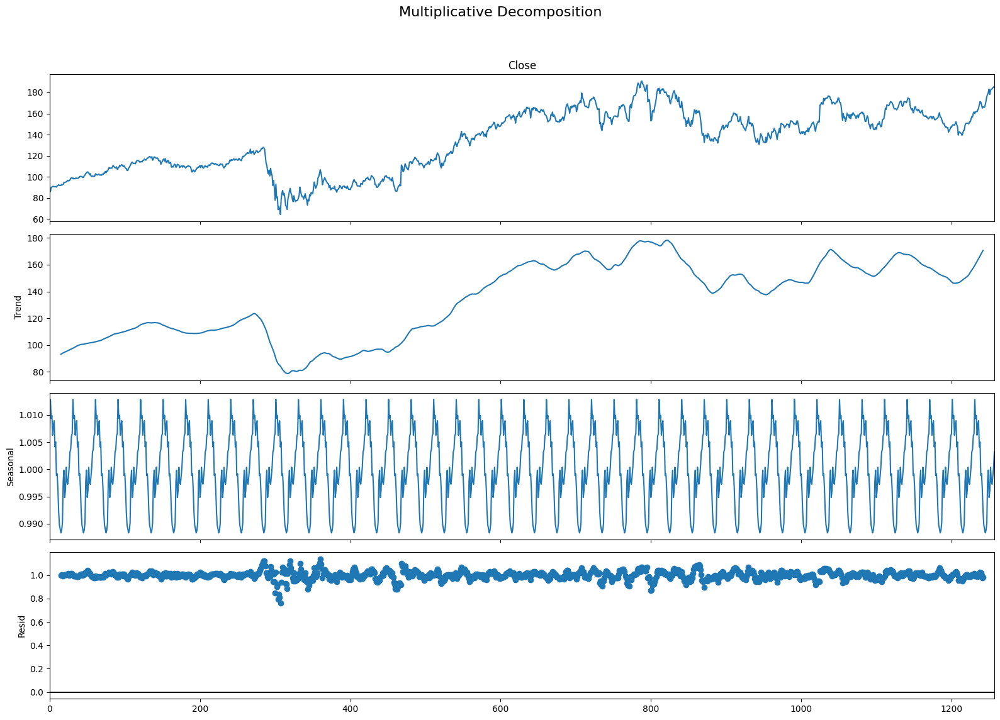

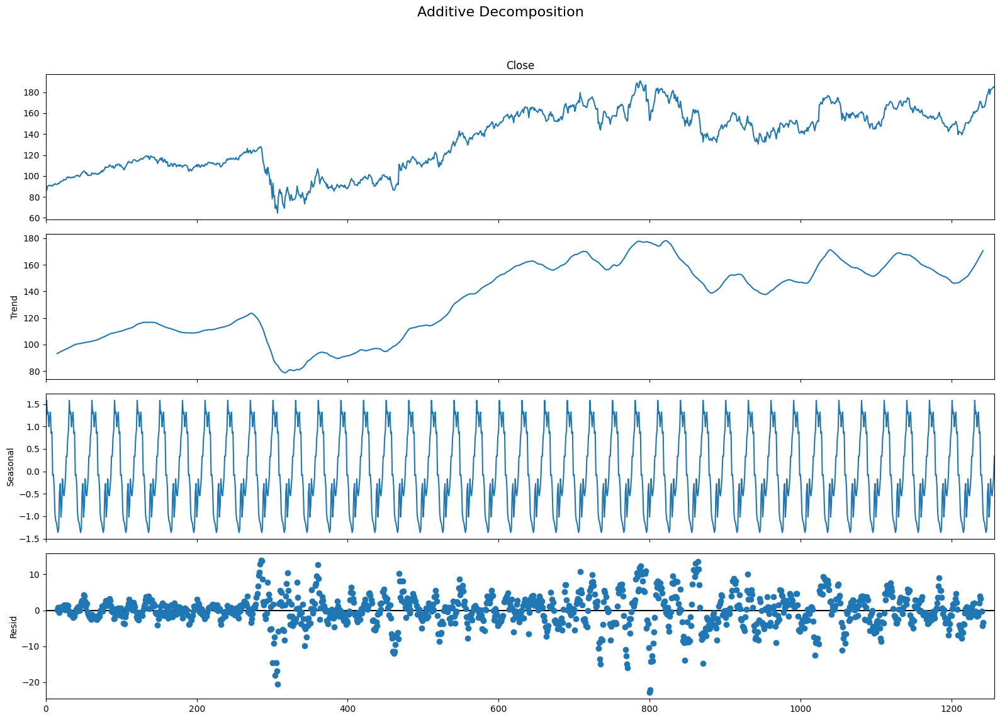

In [61]:
# Multiplicative Decomposition
multiplicative_decomposition = seasonal_decompose(AXP_df['Close'], model='multiplicative', period=30)

# Additive Decomposition
additive_decomposition = seasonal_decompose(AXP_df['Close'], model='additive', period=30)

# Plot
plt.rcParams.update({'figure.figsize': (16,12)})
multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

additive_decomposition.plot().suptitle('Additive Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

- American Express' prices have been trending upwards for the past 5 years. While the trend component is present, if we analyze it over a 30-day period, we can see that American Express tends to peak in the middle of the month and decline steeply toward the end of each month. Over the years, we observe repeated patterns, but not much cyclicality. The seasonal variation is not constant over time, which suggests that the best way to decompose our time series would be multiplicative. If we examine the residuals of the decomposition the noise left in the data by the disruption of the pandemic.


####Bivariate

<Axes: xlabel='Price', ylabel='Price'>

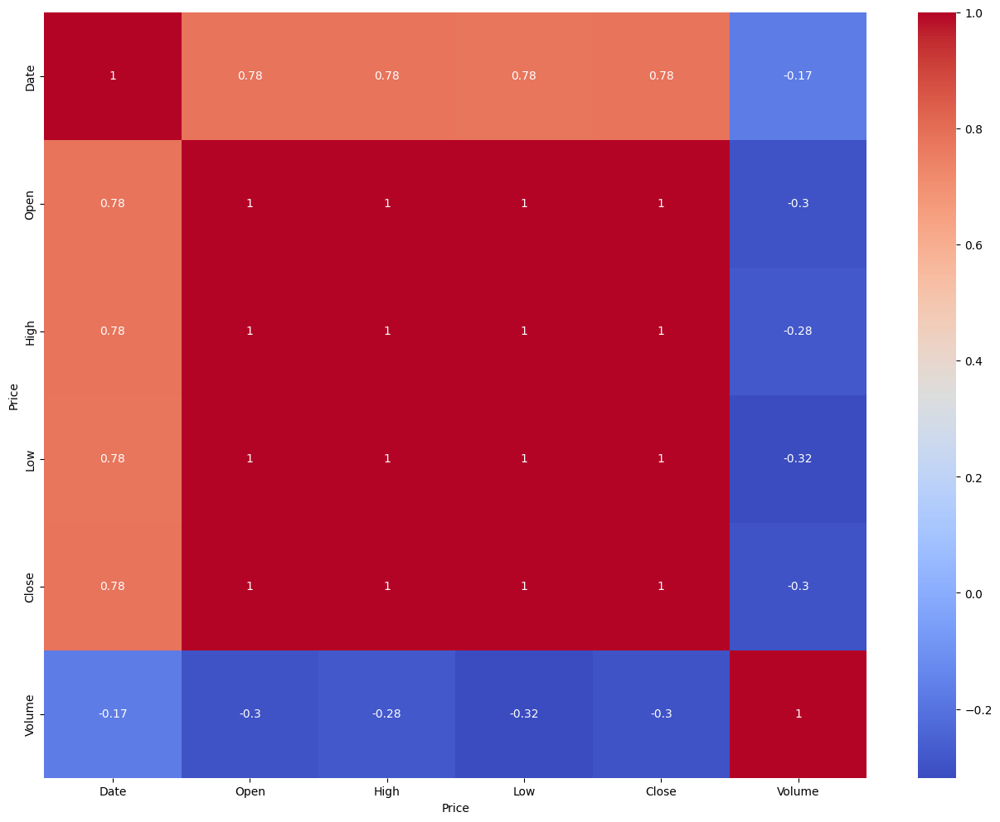

In [62]:
AXP_df.corr()
sns.heatmap(AXP_df.corr(), annot=True, cmap='coolwarm')

- There is a high correlation with date. As time passes, prices are increasing.
- There is a negative but weak correlation with volume, meaning that as more stocks enter the market, the stock valuation tends to decrease.


####Multivariate

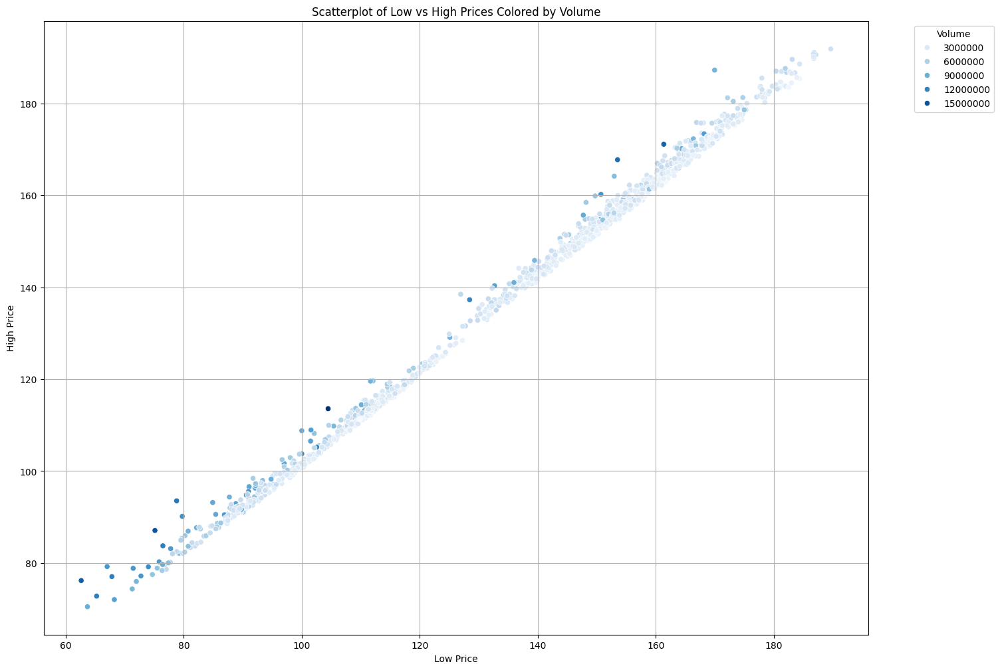

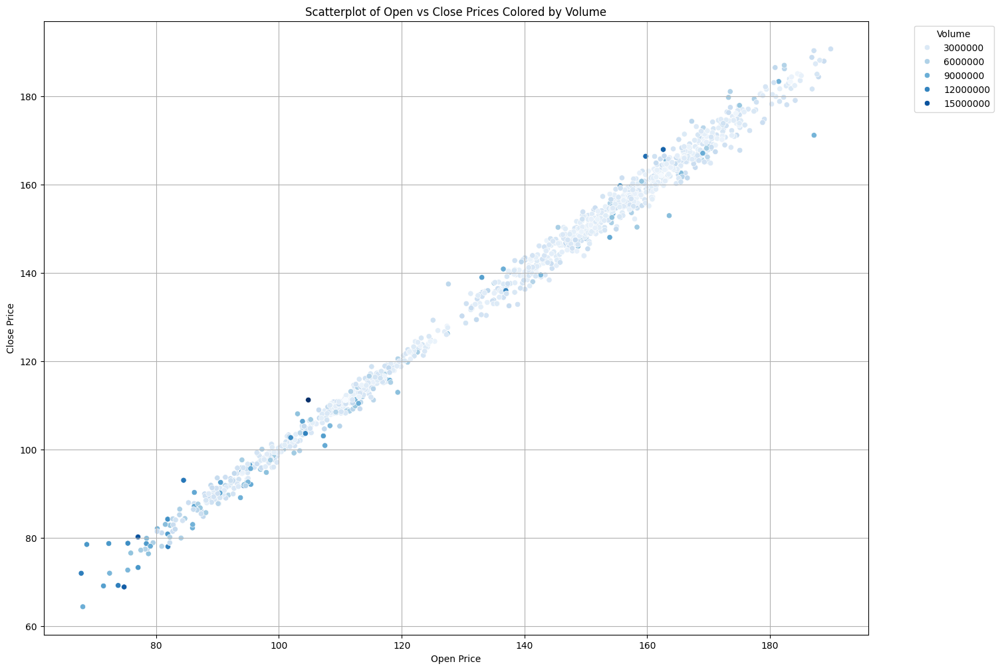

In [63]:
#Scater Plot Low VS High by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=AXP_df, x='Low', y='High', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Low vs High Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Low Price')
plt.ylabel('High Price')
plt.show()

#Scater Plot Open VS Close by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=AXP_df, x='Open', y='Close', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Open vs Close Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Open Price')
plt.ylabel('Close Price')
plt.show()

- The line between low and high prices is tighter than the one between open and close prices, meaning the latter deviates more. Additionally, we can observe that, overall, the lower the stock volume, the more valued the stock is.

**American Express** stock is moderately safe. It's a well-established brand with a wide and premium customer base. It has a strong earnings performance and has recovered quickly from the pandemic. From the analysis, we see that it's also trending upwards, although it can be quite volatile, which also gives it more potential to grow, aligning with Buffett's idea of investing in stocks with high growth potential.

##SiriusXM

SiriusXM is an American broadcasting company with 33 million subscribers and 160 million listeners. It was founded in 2008 through the merger of Sirius Satellite Radio and XM Satellite Radio, which originated in 1988. SirusXM is a holding not only composed by the broadcasting company, but also by the straming music platform Pandora Pandora.

In [64]:
today = date.today()
end_date = today.strftime("2024-01-01")

d1 = date.today() - timedelta(days=1460)
start_date = d1.strftime("2019-01-01")

data = yf.download('SIRI', start=start_date, end=end_date, progress=False)
data.reset_index(inplace=True)
SIRI_df = data[["Date", "Open", "High", "Low", "Close", "Volume"]]

SIRI_df.columns = SIRI_df.columns.get_level_values(0)  # Removing the second level of my dataframe (Ticker AXP), since we are only analyzing one stock, there is no need for a MultiIndex
SIRI_df.head()

Price,Date,Open,High,Low,Close,Volume
0,2019-01-02,52.640993,55.046380,52.640993,54.583805,2387150
1,2019-01-03,53.843678,55.508945,53.288586,54.953857,2228270
2,2019-01-04,55.879014,57.544282,55.508953,57.081707,2543780
3,2019-01-07,56.619121,58.191875,56.526604,57.544270,3169370
4,2019-01-08,57.914339,58.746975,57.544282,58.746975,2376130


In [65]:
SIRI_df.describe()

Price,Date,Open,High,Low,Close,Volume
count,1258,1258.000000,1258.000000,1258.000000,1258.000000,1.258000e+03
mean,2021-06-30 18:48:38.918918912,54.722889,55.472962,54.004950,54.711397,2.114395e+06
min,2019-01-02 00:00:00,32.274253,33.229111,31.680718,32.656197,3.740400e+05
25%,2020-04-01 06:00:00,52.662696,53.328407,51.869702,52.591592,1.414185e+06
50%,2021-06-30 12:00:00,56.516533,57.160467,55.949450,56.572672,1.846390e+06
75%,2022-09-28 18:00:00,59.239687,59.954970,58.667090,59.295099,2.503018e+06
max,2023-12-29 00:00:00,68.128465,76.017681,67.384916,74.574524,1.473310e+07
std,NaN,7.507665,7.479253,7.598697,7.542228,1.154243e+06


- SiriusXM stock has a lower price than American Express, but it is also younger and in a different industry. In our dataset, SiriusXM's stock price has ranged around 54 dolars, with its lowest not far from that at 32 dolars and its highest at 72 dolars, about 20 dolars below and above the average. It has a lower standard deviation than American Express.

In [66]:
SIRI_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1258 entries, 0 to 1257
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1258 non-null   datetime64[ns]
 1   Open    1258 non-null   float64       
 2   High    1258 non-null   float64       
 3   Low     1258 non-null   float64       
 4   Close   1258 non-null   float64       
 5   Volume  1258 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 59.1 KB


In [67]:
SIRI_df.isnull().sum()

,0
Price,
Date,0
Open,0
High,0
Low,0
Close,0
Volume,0


###EDA

####Univariate

#####Histograms

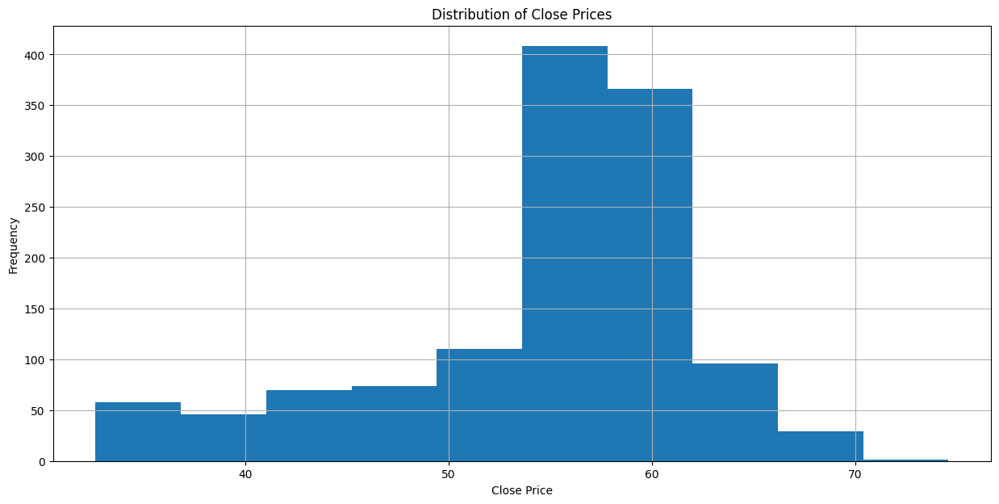

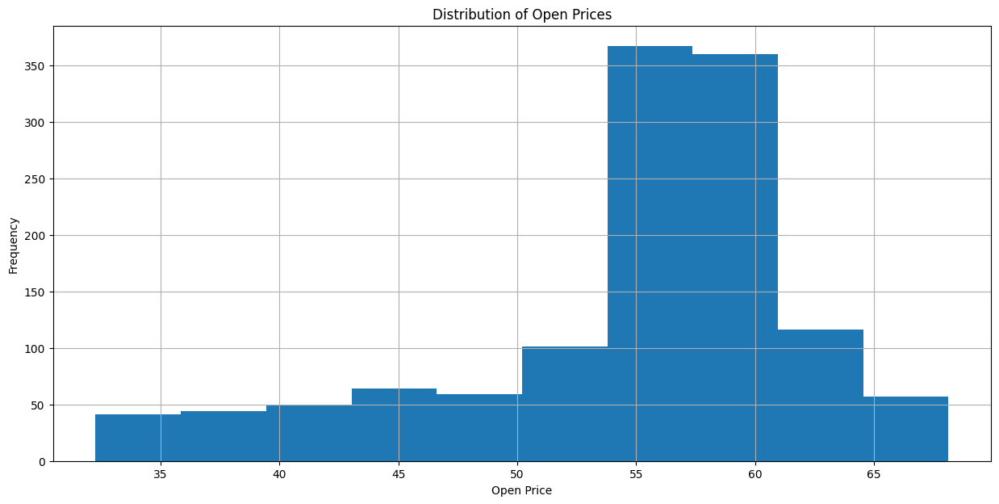

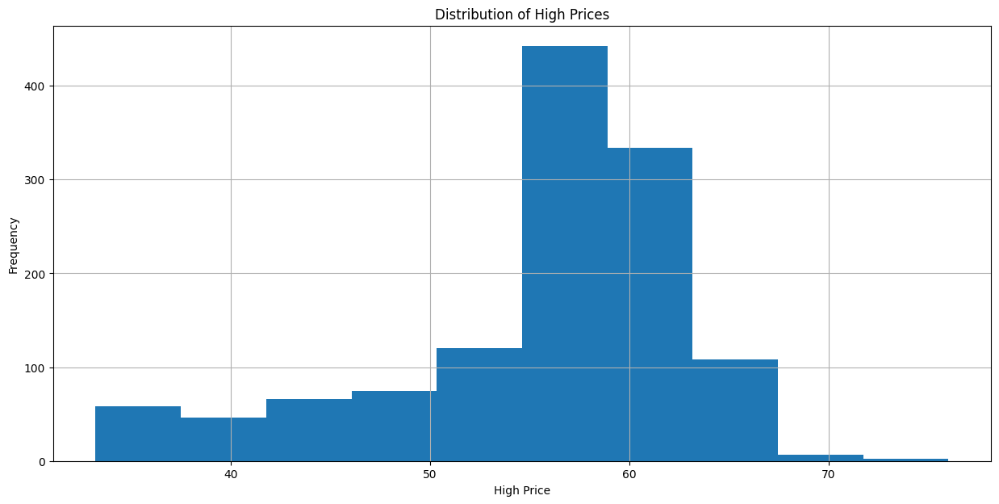

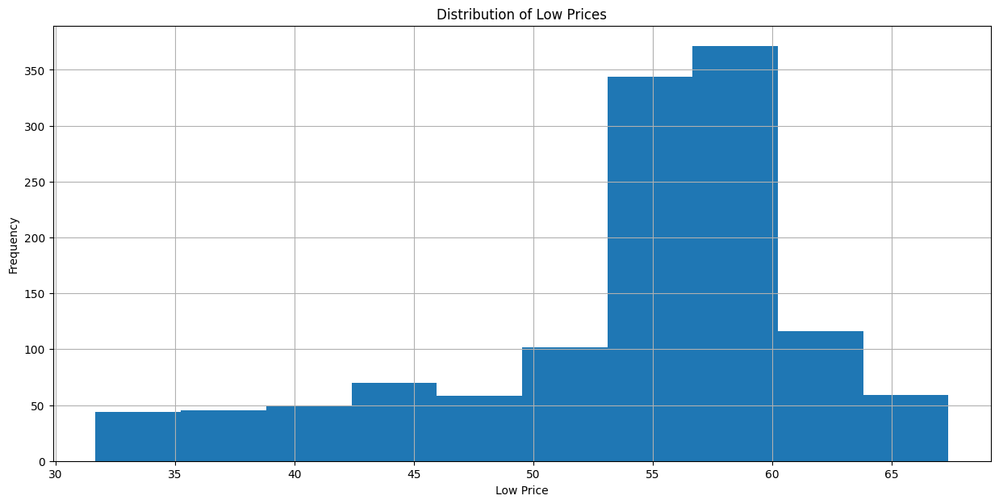

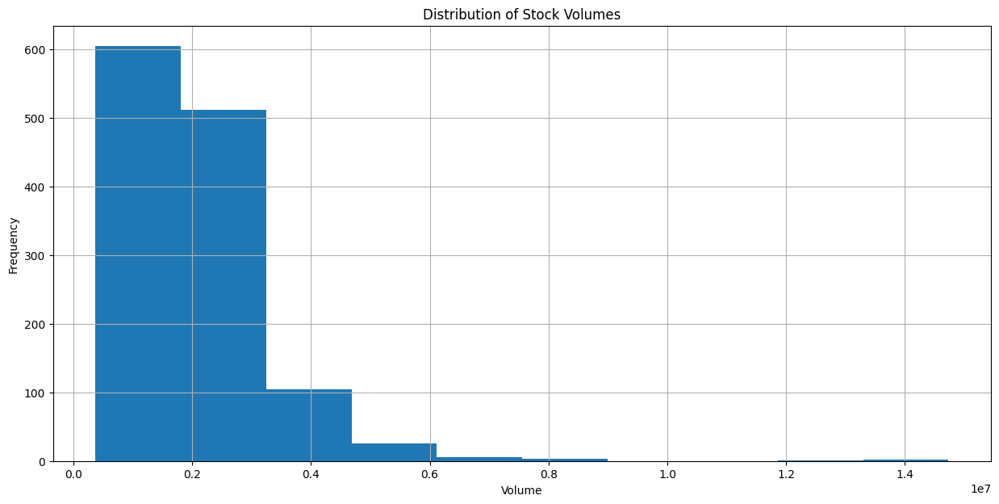

In [68]:
#Histograms

plt.subplots(figsize=(15,7))
plt.hist(SIRI_df['Close'])
plt.grid(True)
plt.title('Distribution of Close Prices')
plt.xlabel('Close Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(SIRI_df['Open'])
plt.grid(True)
plt.title('Distribution of Open Prices')
plt.xlabel('Open Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(SIRI_df['High'])
plt.grid(True)
plt.title('Distribution of High Prices')
plt.xlabel('High Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(SIRI_df['Low'])
plt.grid(True)
plt.title('Distribution of Low Prices')
plt.xlabel('Low Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(SIRI_df['Volume'])
plt.grid(True)
plt.title('Distribution of Stock Volumes')
plt.xlabel('Volume')
plt.ylabel('Frequency')
plt.show()

- All prices exhibit similar behavior with a left-skewed distribution, while their volume presents a right-skewed distribution.

#####Boxplots

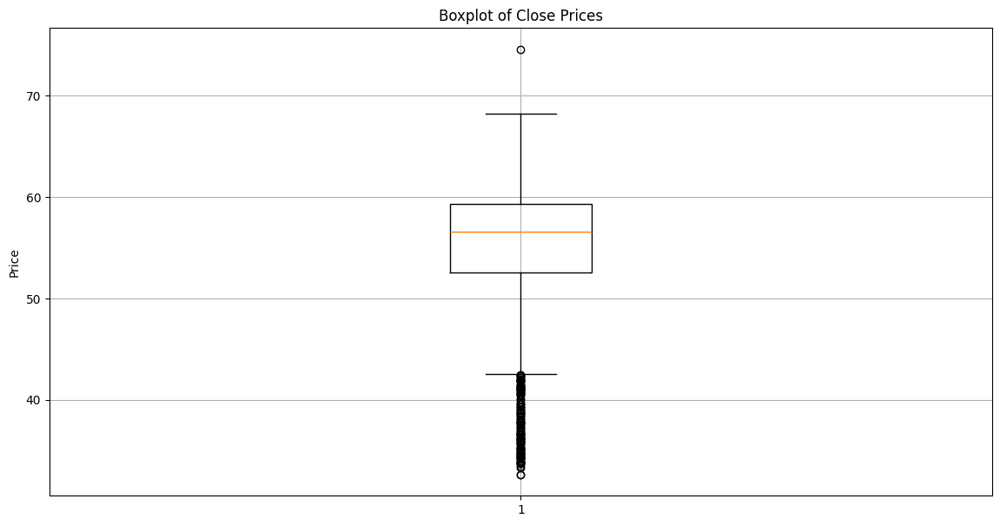

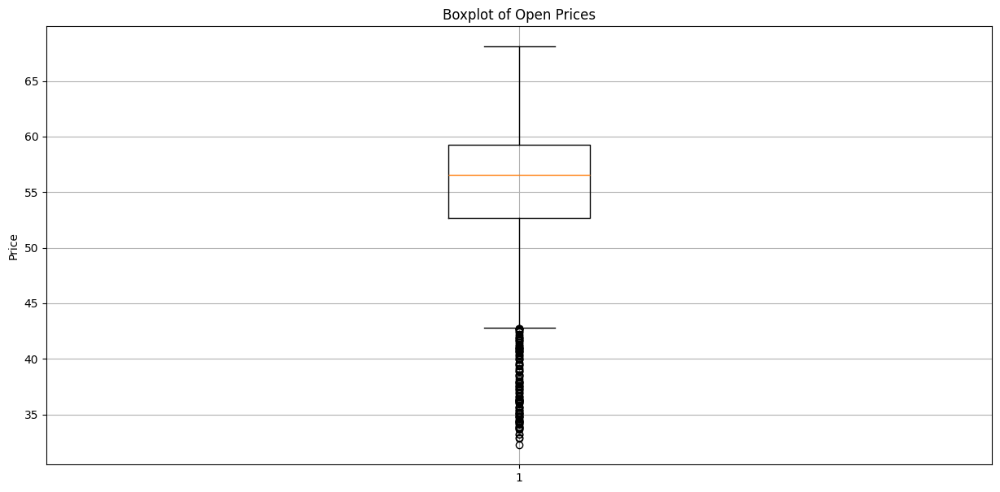

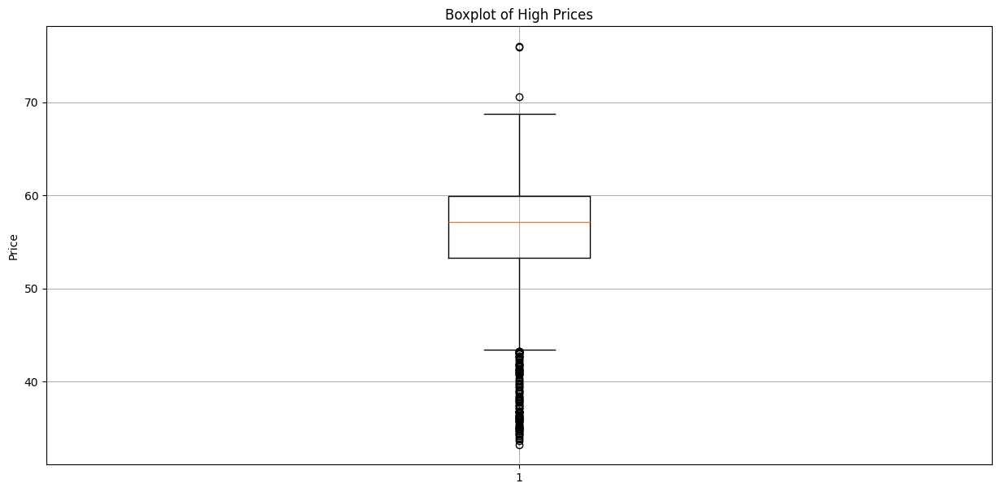

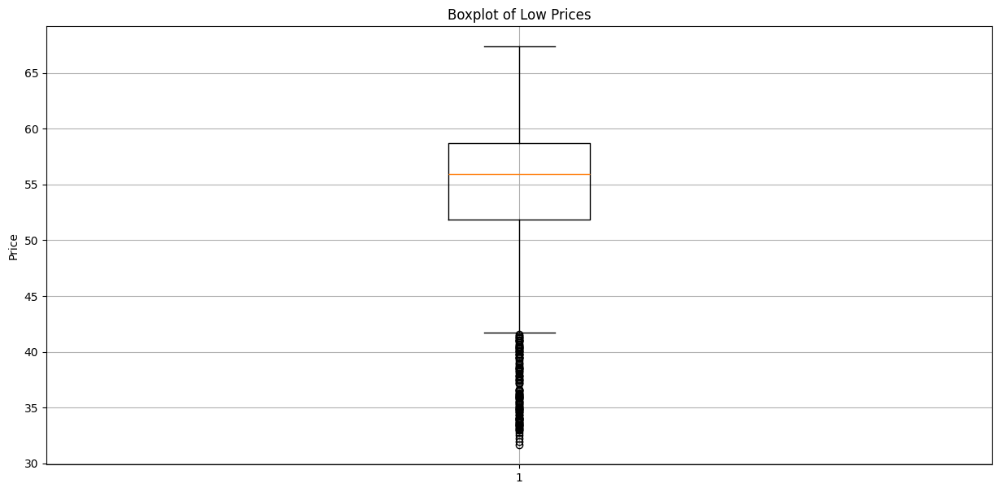

In [69]:
#Boxplots

plt.subplots(figsize=(14,7))
plt.boxplot(SIRI_df['Close'])
plt.grid(True)
plt.title('Boxplot of Close Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(SIRI_df['Open'])
plt.grid(True)
plt.title('Boxplot of Open Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(SIRI_df['High'])
plt.grid(True)
plt.title('Boxplot of High Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(SIRI_df['Low'])
plt.grid(True)
plt.title('Boxplot of Low Prices')
plt.ylabel('Price')
plt.show()

- SiriusXM has many outliers when it comes to prices below the minimum average. The median is around 56 dollars, while the minimum stays around 42 dollars for all prices, and the maximum is around 67 dollars, disregarding outliers.


#####Linecharts

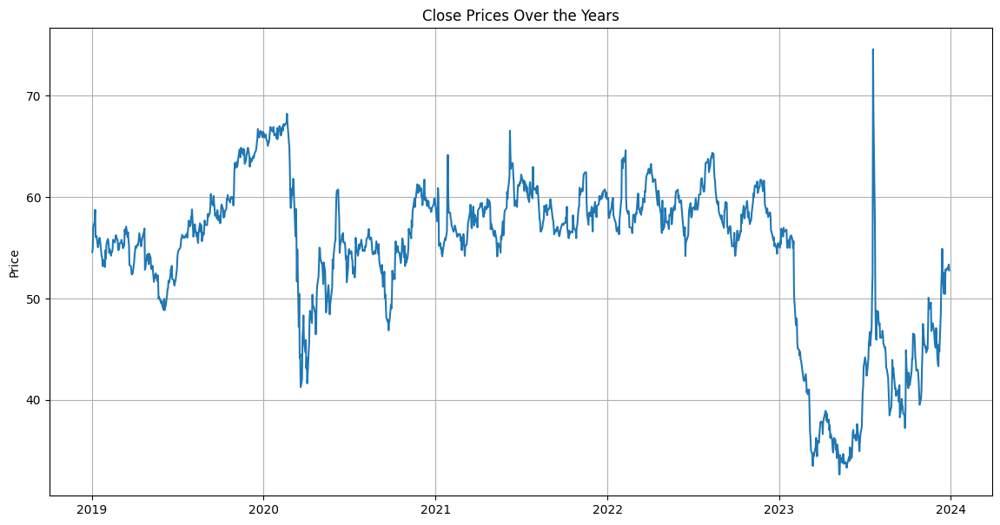

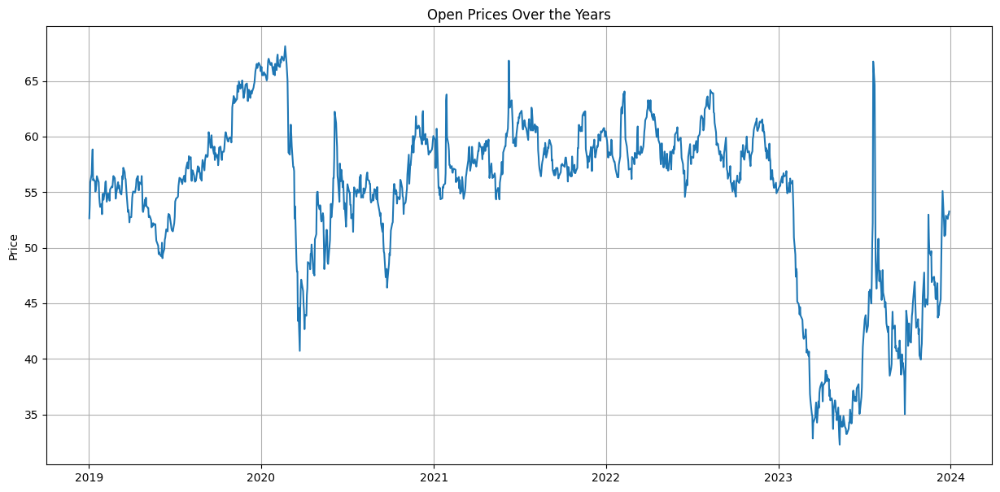

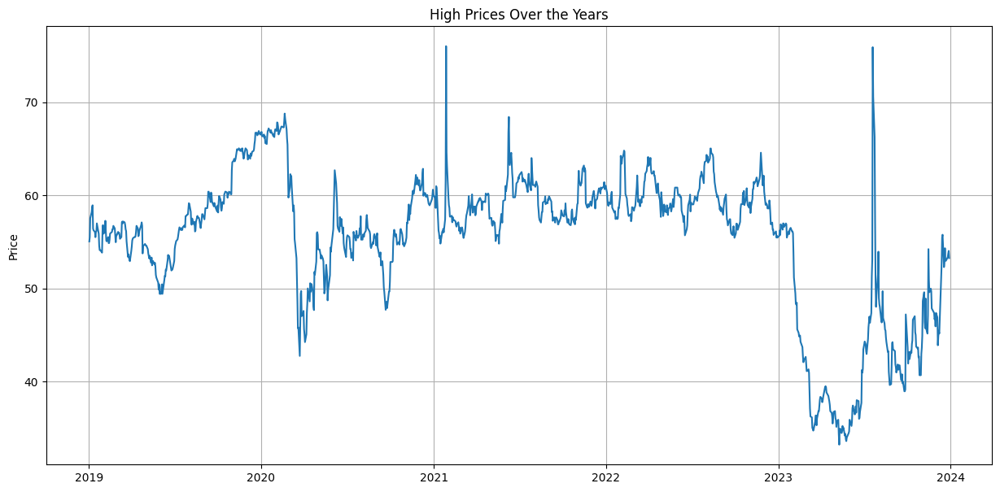

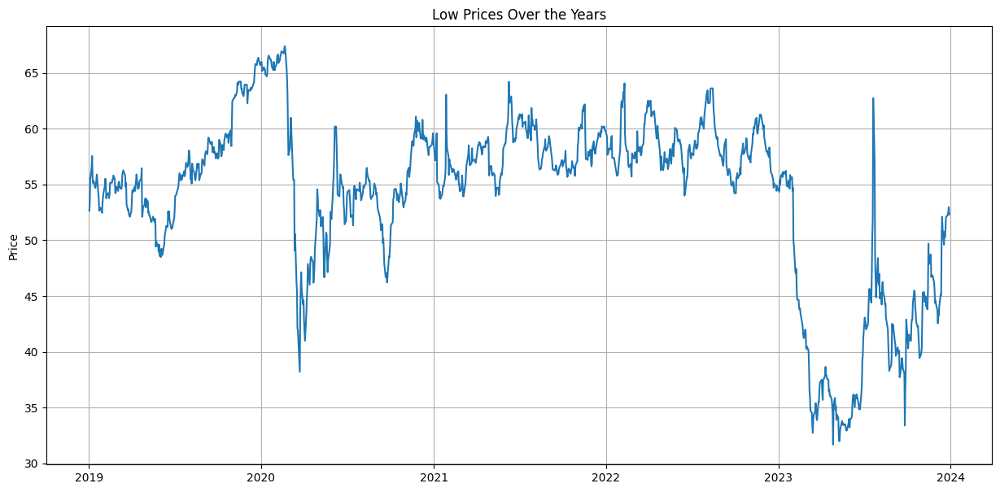

In [70]:
#Linecharts

plt.subplots(figsize=(14,7))
plt.plot(SIRI_df['Date'], SIRI_df['Close'])
plt.grid(True)
plt.title('Close Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(SIRI_df['Date'], SIRI_df['Open'])
plt.grid(True)
plt.title('Open Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(SIRI_df['Date'], SIRI_df['High'])
plt.grid(True)
plt.title('High Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(SIRI_df['Date'], SIRI_df['Low'])
plt.grid(True)
plt.title('Low Prices Over the Years')
plt.ylabel('Price')
plt.show()

- All of the prices also exhibit similar behavior overall. SiriusXM was also affected by the pandemic, with a visible drop in its price, but not as much, since in the last year of the dataset, the price was even lower.

- We can see two significant spikes in high prices, with one occurring in 2023, and one of them being significant not only in high prices but in all prices. In 2021, SiriusXM stock experienced a surge in late January due to a short squeeze (a situation where a trader bets that the stock will fall by selling borrowed shares, and closing the trade requires buying back shares). A similar event occurred around July 2023, when a short squeeze significantly affected the stock price.

#####Time Series Components

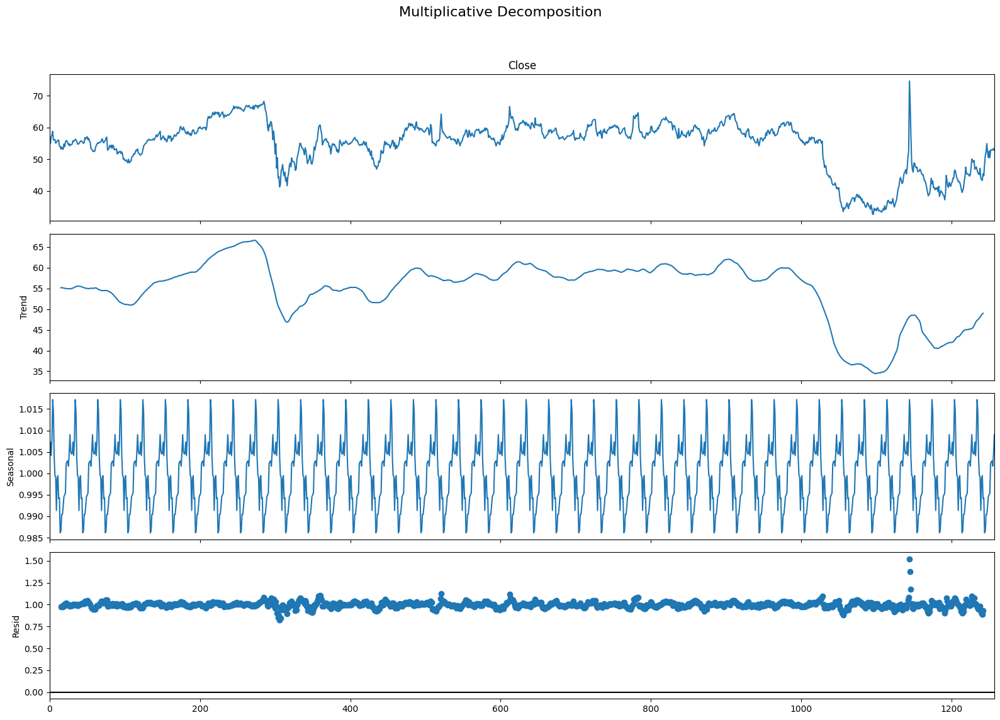

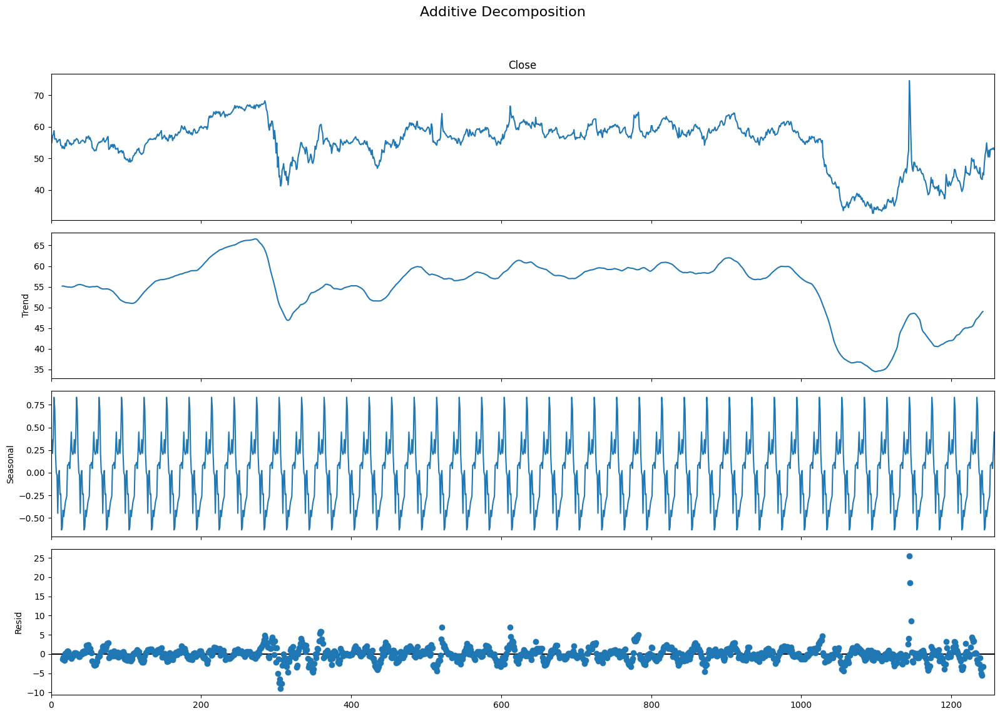

In [71]:
# Multiplicative Decomposition
multiplicative_decomposition = seasonal_decompose(SIRI_df['Close'], model='multiplicative', period=30)

# Additive Decomposition
additive_decomposition = seasonal_decompose(SIRI_df['Close'], model='additive', period=30)

# Plot
plt.rcParams.update({'figure.figsize': (16,12)})
multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

additive_decomposition.plot().suptitle('Additive Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

- The trend is not very clear here, but at least from 2023 onward, we can see that stock prices have been trending downwards. The company had a revenue decline of 0.6%, while subscriber revenue, advertising revenue, operating profit, and pre-tax income were also declining. Additionally, the company's free cash flow was 23% lower than in 2022.

- In terms of the seasonal components, if we consider it monthly, we can see that the stock price has two main increases: one around the middle of the month and a greater one toward the end of the month, before falling steeply again. In the residuals, we can see that the moments with the most noise in the data were around the time of the pandemic and the large spike generated in 2023, mentioned earlier.

####Bivariate

<Axes: xlabel='Price', ylabel='Price'>

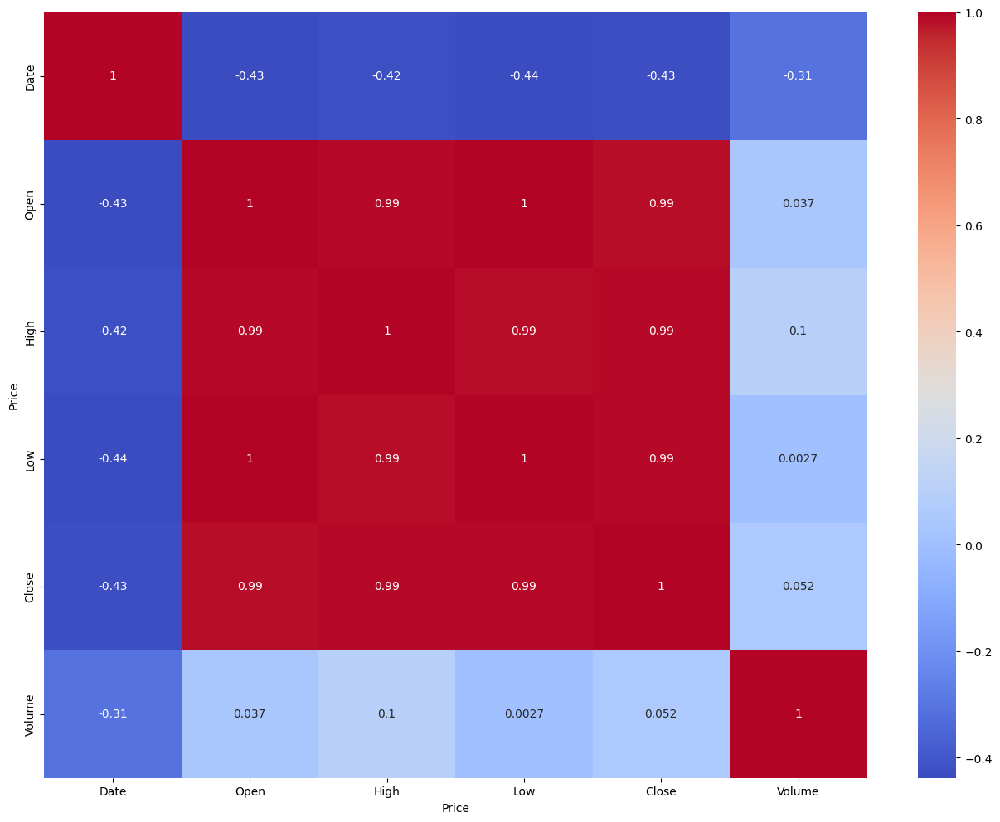

In [72]:
SIRI_df.corr()
sns.heatmap(SIRI_df.corr(), annot=True, cmap='coolwarm')

- Here, stock prices have a weak negative correlation with the date, which could be because, as time passes, the stock price is falling. However, prices (Low, High, Open, Down...) still have a strong positive correlation, which could mean that in general they follow a similar behavior.

####Multivariate

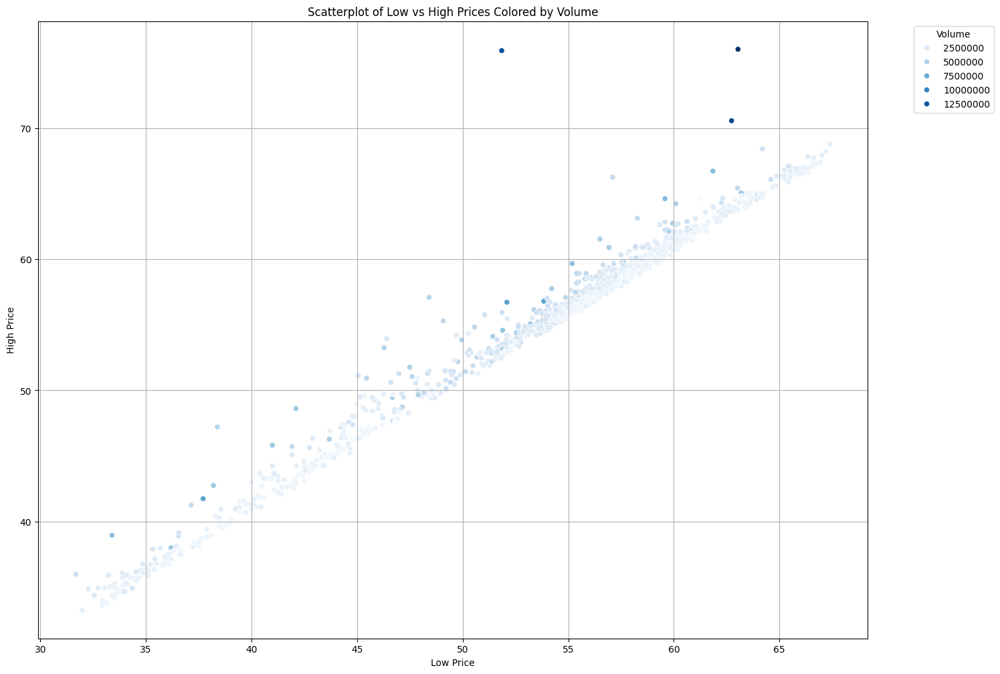

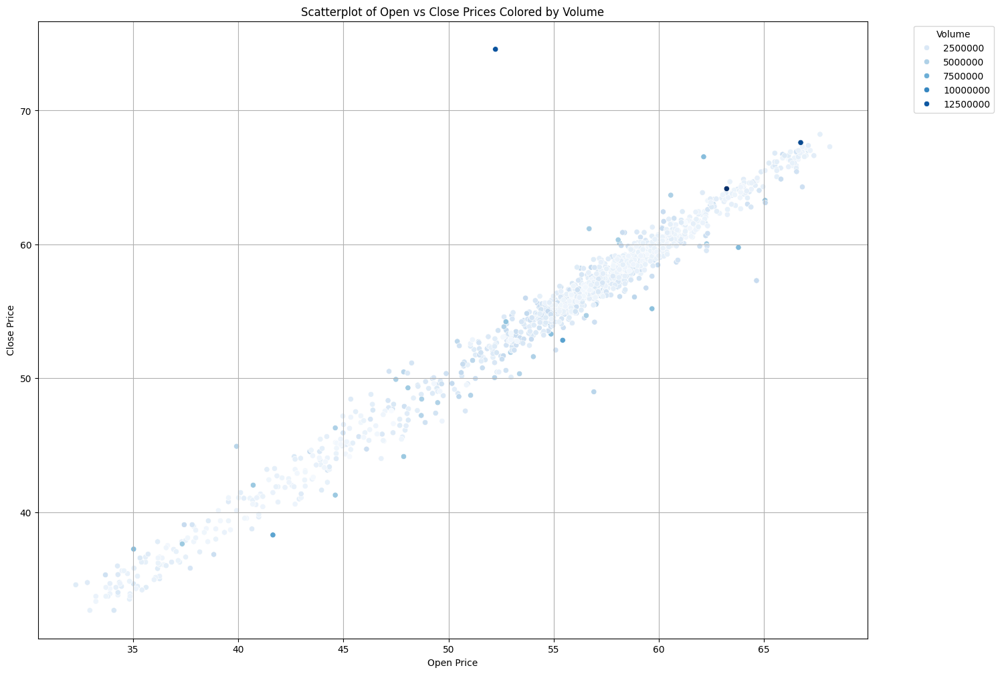

In [73]:
#Scater Plot Low VS High by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=SIRI_df, x='Low', y='High', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Low vs High Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Low Price')
plt.ylabel('High Price')
plt.show()

#Scater Plot Open VS Close by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=SIRI_df, x='Open', y='Close', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Open vs Close Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Open Price')
plt.ylabel('Close Price')
plt.show()

- Again, as the prices grow, the volume is lower, but there are some random points where the volume is higher at high prices. We can also see that the distribution of prices between open and close is more spread out than the one for high and low prices; they vary more.


- Even though SiriusXM has been recently trending downwards, it offers a good competitive advantage over other companies in the industry due to its legal monopoly; it is the only company in the business licensed for satellite radio.


##Chevron

Chevron, a U.S. petroleum corporation founded in 1879, is one of the largest oil companies in the world.

In [74]:
today = date.today()
end_date = today.strftime("2024-01-01")

d1 = date.today() - timedelta(days=1460)
start_date = d1.strftime("2019-01-01")

data = yf.download('CVX', start=start_date, end=end_date, progress=False)
data.reset_index(inplace=True)
CVX_df = data[["Date", "Open", "High", "Low", "Close", "Volume"]]

CVX_df.columns = CVX_df.columns.get_level_values(0)  # Removing the second level of my dataframe (Ticker AXP), since we are only analyzing one stock, there is no need for a MultiIndex
CVX_df.head()

Price,Date,Open,High,Low,Close,Volume
0,2019-01-02,81.682327,84.984932,81.499696,84.231575,6384800
1,2019-01-03,84.513149,84.688175,82.237855,82.618340,6496200
2,2019-01-04,83.919597,84.459884,83.303214,84.330521,7952500
3,2019-01-07,84.513157,85.936170,83.645654,85.426323,5712700
4,2019-01-08,86.293818,86.590596,84.977341,85.053436,5674900


In [75]:
CVX_df.describe()

Price,Date,Open,High,Low,Close,Volume
count,1258,1258.000000,1258.000000,1258.000000,1258.000000,1.258000e+03
mean,2021-06-30 18:48:38.918918912,109.030994,110.190618,107.822183,109.024037,9.627229e+06
min,2019-01-02 00:00:00,44.271076,46.858766,41.338899,43.437897,1.640100e+06
25%,2020-04-01 06:00:00,86.260850,87.256335,85.572985,86.388422,6.609625e+06
50%,2021-06-30 12:00:00,95.158736,95.844684,94.371221,95.218349,8.596950e+06
75%,2022-09-28 18:00:00,143.511089,145.074303,141.741603,143.649265,1.093610e+07
max,2023-12-29 00:00:00,169.405654,171.723312,168.554651,171.327347,5.723100e+07
std,NaN,32.288576,32.538215,32.013869,32.298832,5.054860e+06


- For the past 5 years, its stock price has ranged around $109, with the minimum around $43 and the maximum around $170, with a standard deviation higher than SiriusXM and similar to American Express.


In [76]:
CVX_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1258 entries, 0 to 1257
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1258 non-null   datetime64[ns]
 1   Open    1258 non-null   float64       
 2   High    1258 non-null   float64       
 3   Low     1258 non-null   float64       
 4   Close   1258 non-null   float64       
 5   Volume  1258 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 59.1 KB


In [77]:
CVX_df.isnull().sum()

,0
Price,
Date,0
Open,0
High,0
Low,0
Close,0
Volume,0


###EDA

####Univariate

#####Histograms

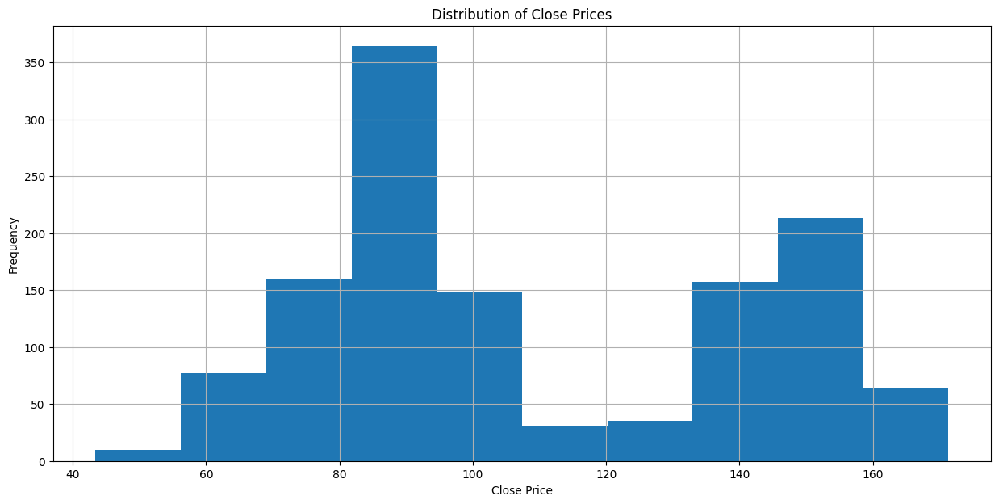

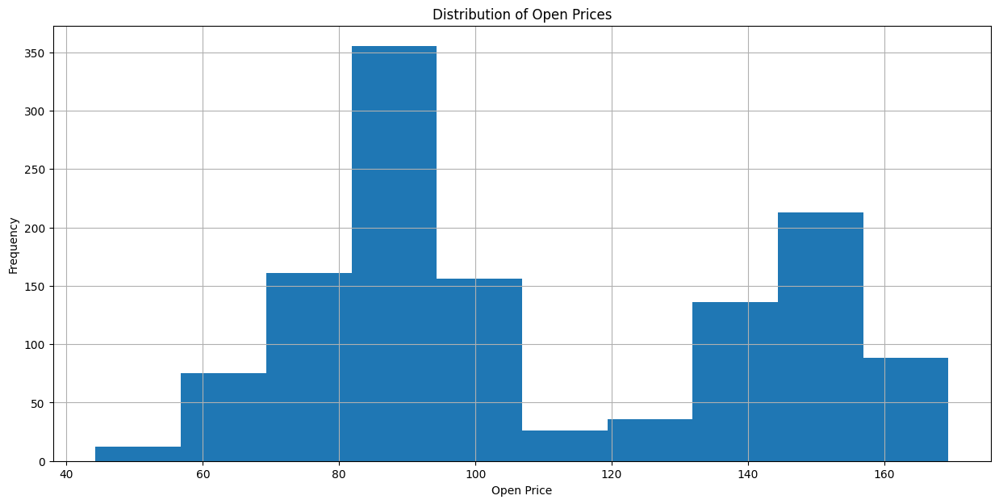

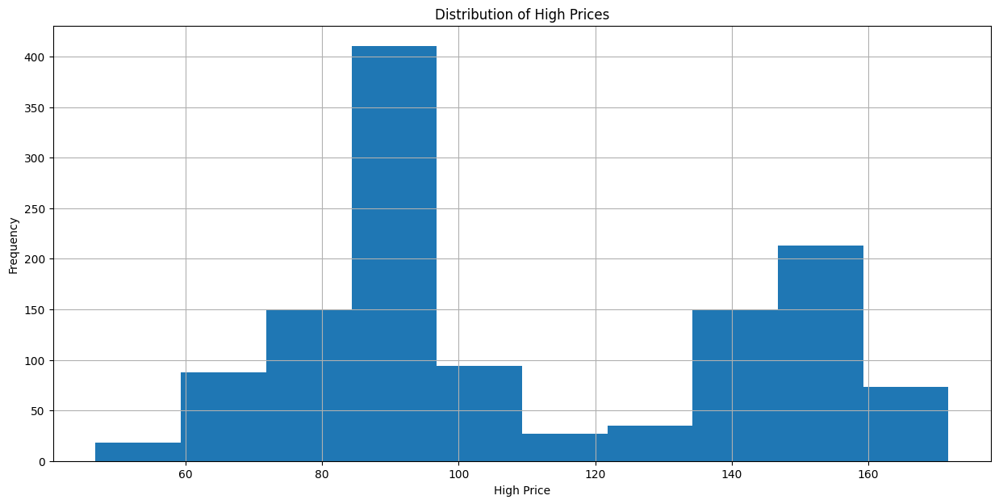

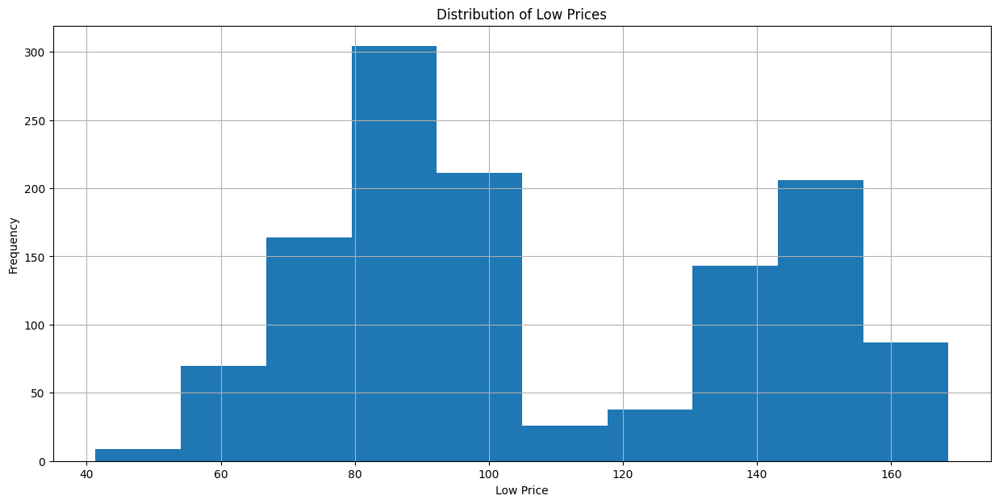

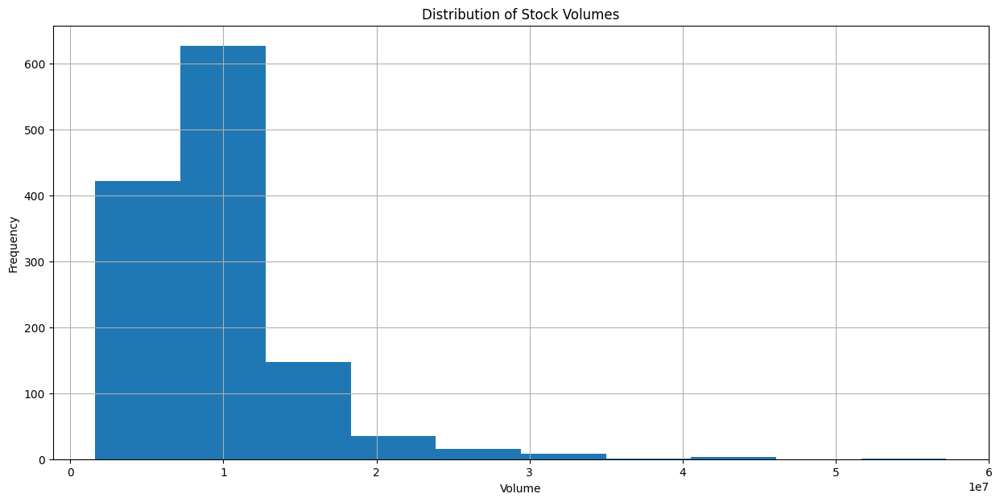

In [78]:
#Histograms

plt.subplots(figsize=(15,7))
plt.hist(CVX_df['Close'])
plt.grid(True)
plt.title('Distribution of Close Prices')
plt.xlabel('Close Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(CVX_df['Open'])
plt.grid(True)
plt.title('Distribution of Open Prices')
plt.xlabel('Open Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(CVX_df['High'])
plt.grid(True)
plt.title('Distribution of High Prices')
plt.xlabel('High Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(CVX_df['Low'])
plt.grid(True)
plt.title('Distribution of Low Prices')
plt.xlabel('Low Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(CVX_df['Volume'])
plt.grid(True)
plt.title('Distribution of Stock Volumes')
plt.xlabel('Volume')
plt.ylabel('Frequency')
plt.show()

- The distribution of prices also behaves pretty similarly and is right-skewed, as is the volume's distribution as well.


#####Boxplots

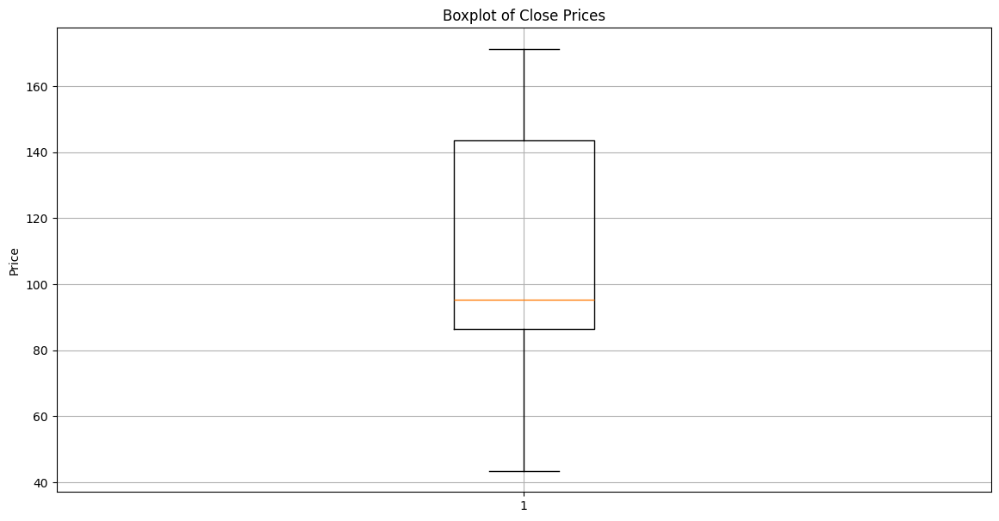

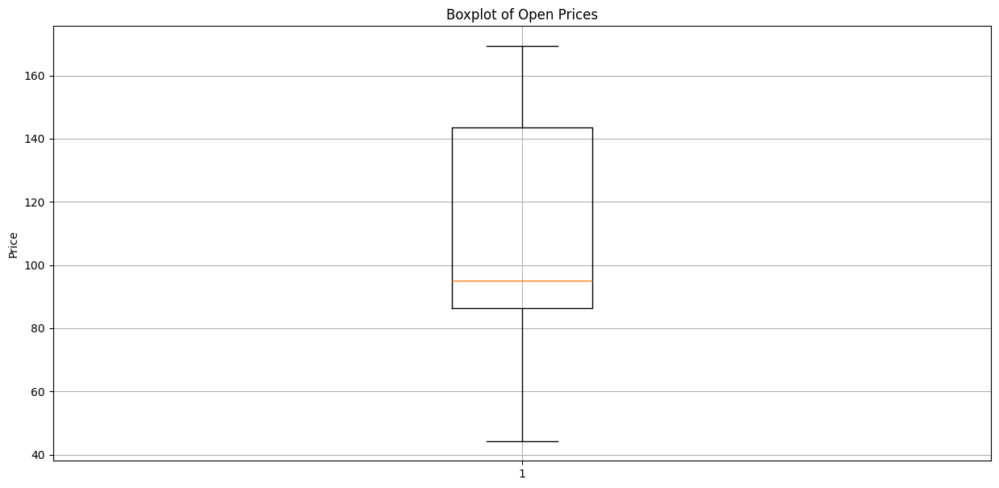

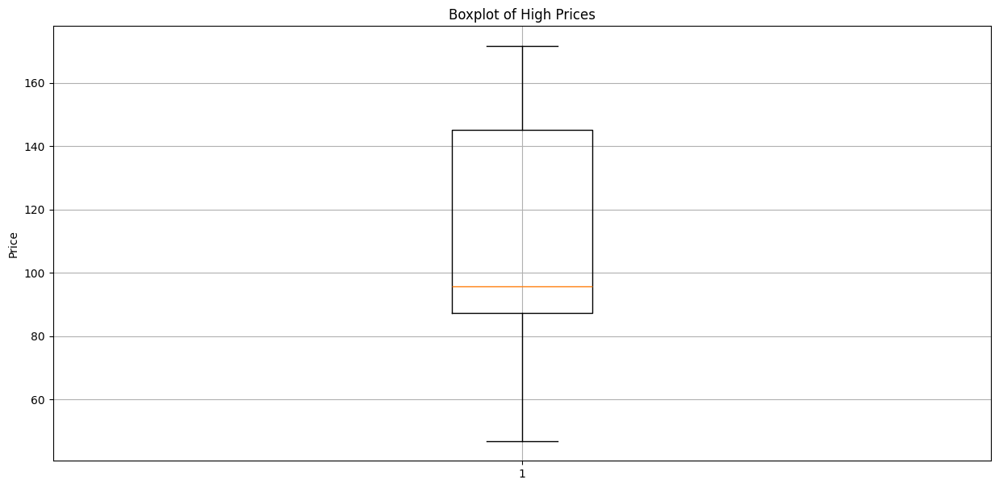

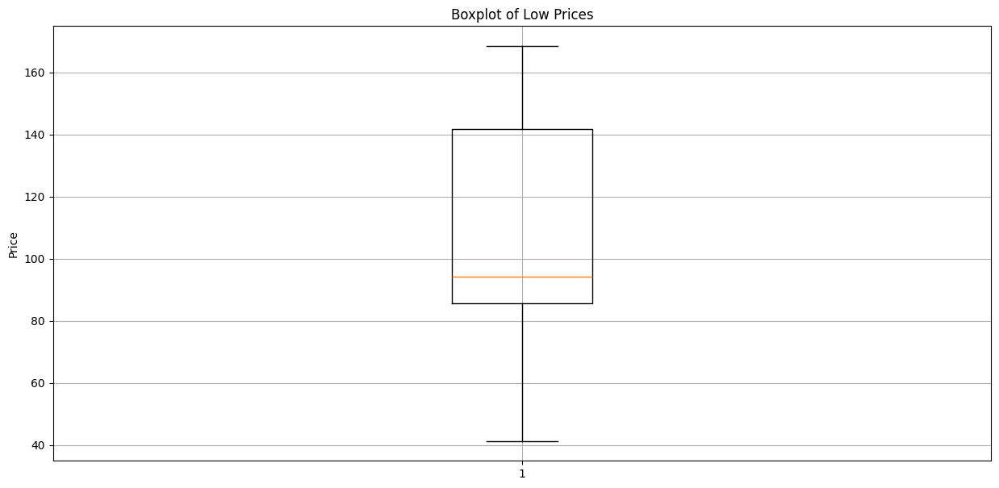

In [79]:
#Boxplots

plt.subplots(figsize=(14,7))
plt.boxplot(CVX_df['Close'])
plt.grid(True)
plt.title('Boxplot of Close Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(CVX_df['Open'])
plt.grid(True)
plt.title('Boxplot of Open Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(CVX_df['High'])
plt.grid(True)
plt.title('Boxplot of High Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(CVX_df['Low'])
plt.grid(True)
plt.title('Boxplot of Low Prices')
plt.ylabel('Price')
plt.show()

- No outliers. The median is around 97 dollars, while the minimum is around 40 dollars and the maximum is around 164 dollars.


#####Linecharts

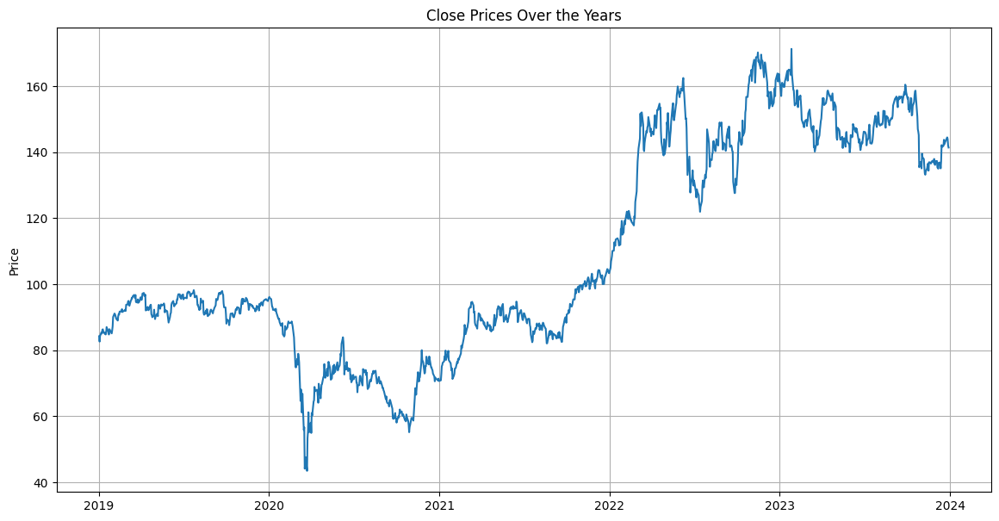

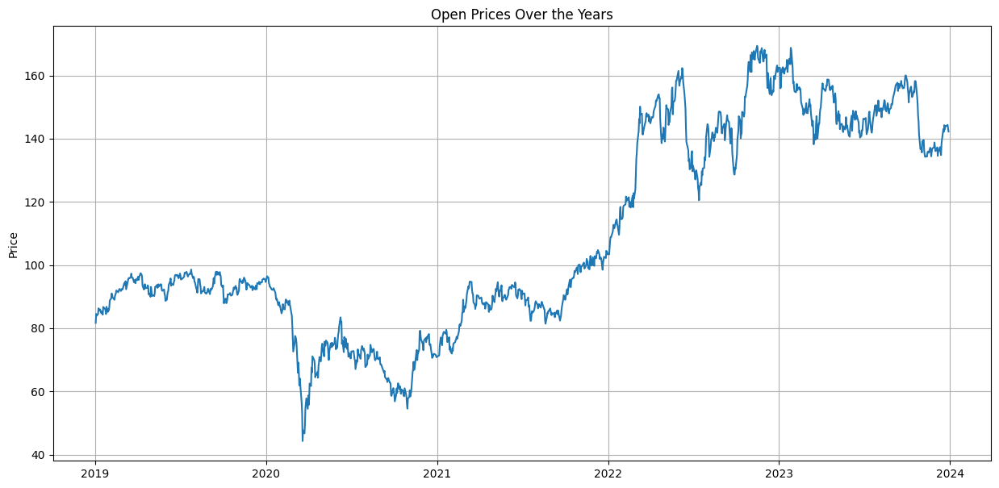

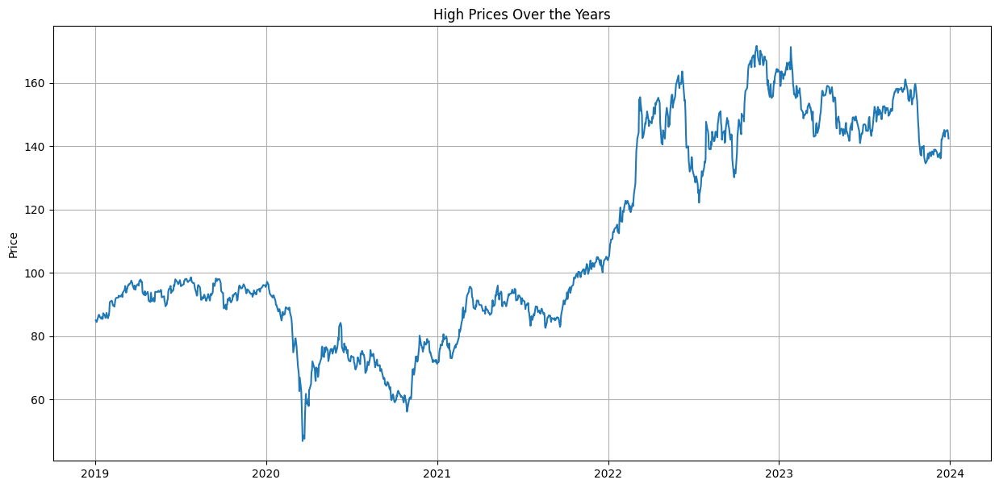

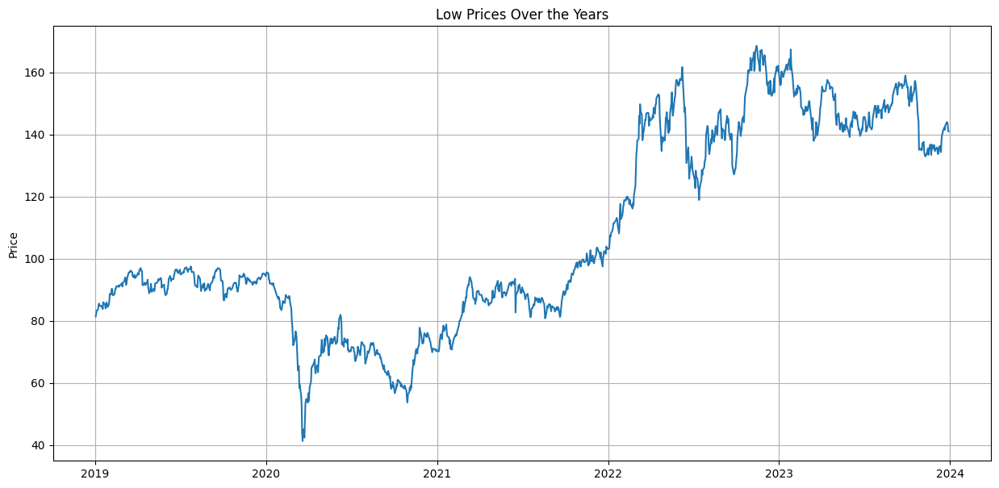

In [80]:
#Linecharts

plt.subplots(figsize=(14,7))
plt.plot(CVX_df['Date'], CVX_df['Close'])
plt.grid(True)
plt.title('Close Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(CVX_df['Date'], CVX_df['Open'])
plt.grid(True)
plt.title('Open Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(CVX_df['Date'], CVX_df['High'])
plt.grid(True)
plt.title('High Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(CVX_df['Date'], CVX_df['Low'])
plt.grid(True)
plt.title('Low Prices Over the Years')
plt.ylabel('Price')
plt.show()

- Chevron, like most companies, was also impacted by the pandemic, and that is visible in the graph. However, it recovered quickly, and its stock prices have been soaring since then. Even though Chevron is in the volatile oil industry, the high-priced dividends they pay, extended to 38 straight years of dividend growth, pay off.


#####Time Series Components

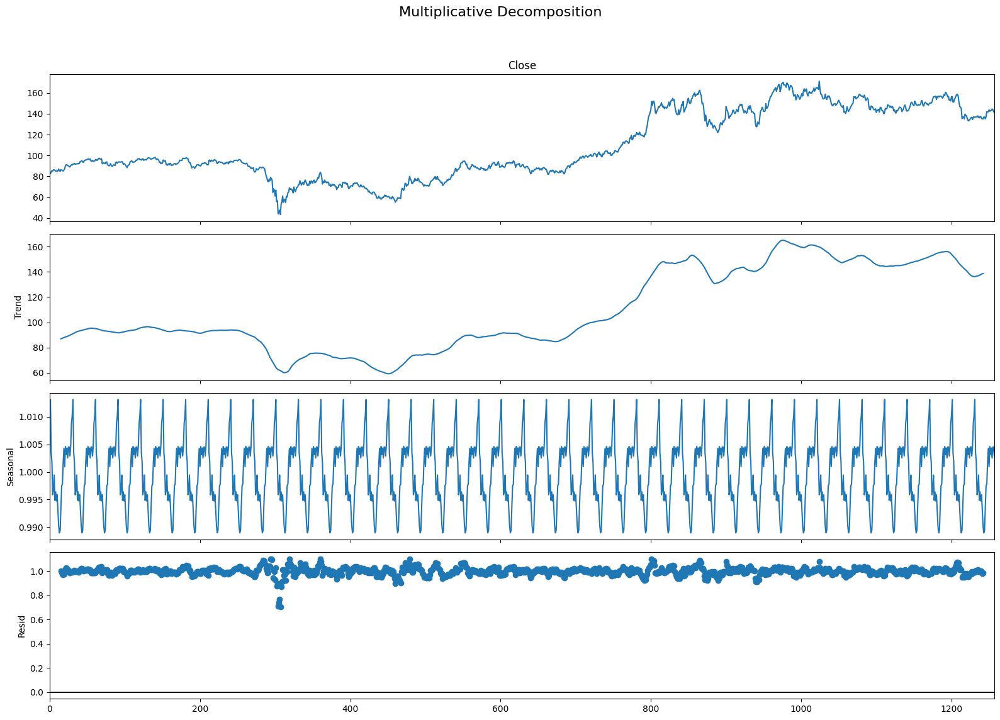

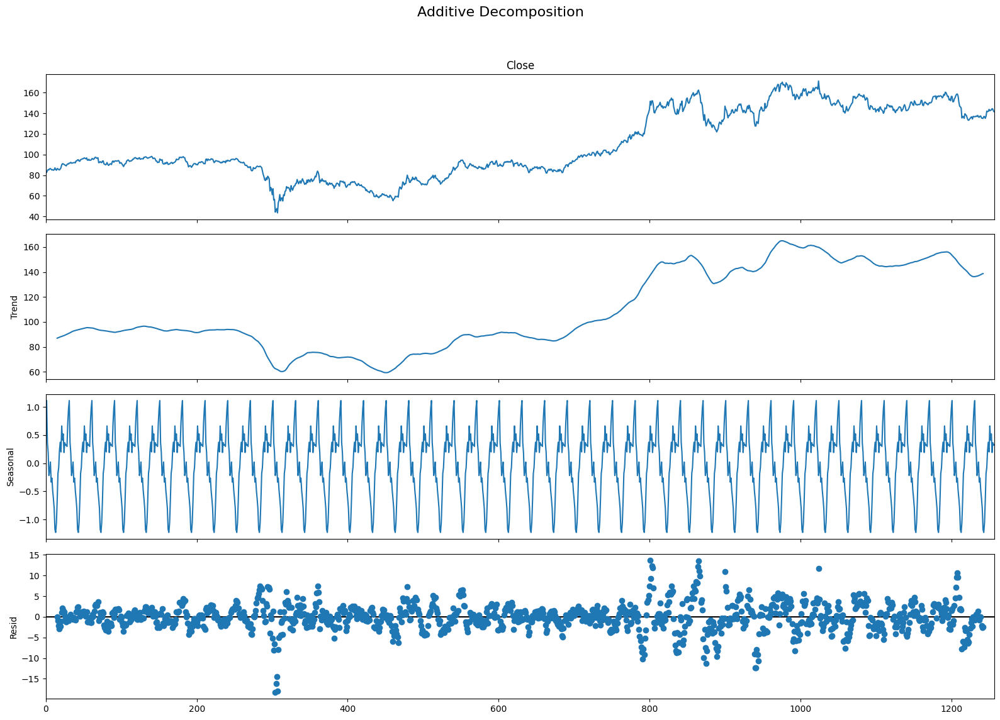

In [81]:
# Multiplicative Decomposition
multiplicative_decomposition = seasonal_decompose(CVX_df['Close'], model='multiplicative', period=30)

# Additive Decomposition
additive_decomposition = seasonal_decompose(CVX_df['Close'], model='additive', period=30)

# Plot
plt.rcParams.update({'figure.figsize': (16,12)})
multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

additive_decomposition.plot().suptitle('Additive Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

- We can see that since the pandemic, Chevron has been trending upwards. If we look into the seasonal components, monthly Chevron seems to peak around the middle of the month and decrease more gradually, dropping to a smaller peak and then finally declining. Additionally, if we look into the residuals, we can see that the most noise is coming from the pandemic as well.


####Bivariate

<Axes: xlabel='Price', ylabel='Price'>

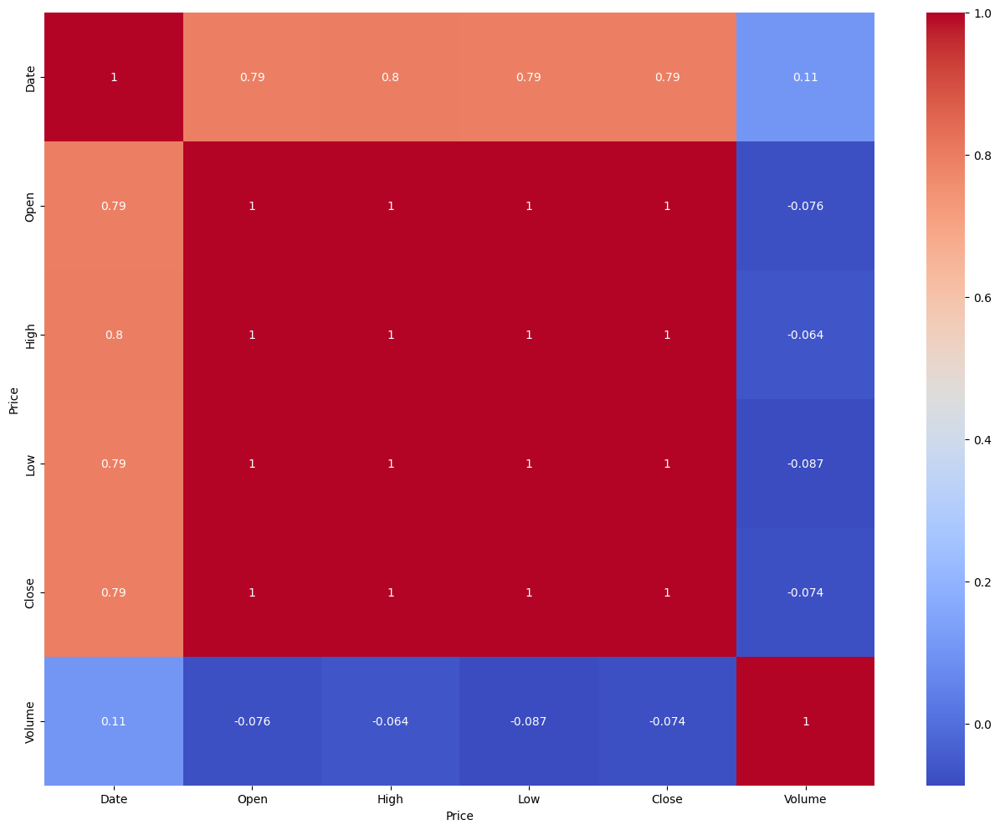

In [82]:
CVX_df.corr()
sns.heatmap(CVX_df.corr(), annot=True, cmap='coolwarm')

- Chevron's relationship between prices, date, and volume presents similar behavior to American Express. Prices behave tightly together, while date and prices have a strong positive correlation, meaning as time goes by, prices have been increasing, while volume has a negative but weak correlation with prices.


####Multivariate

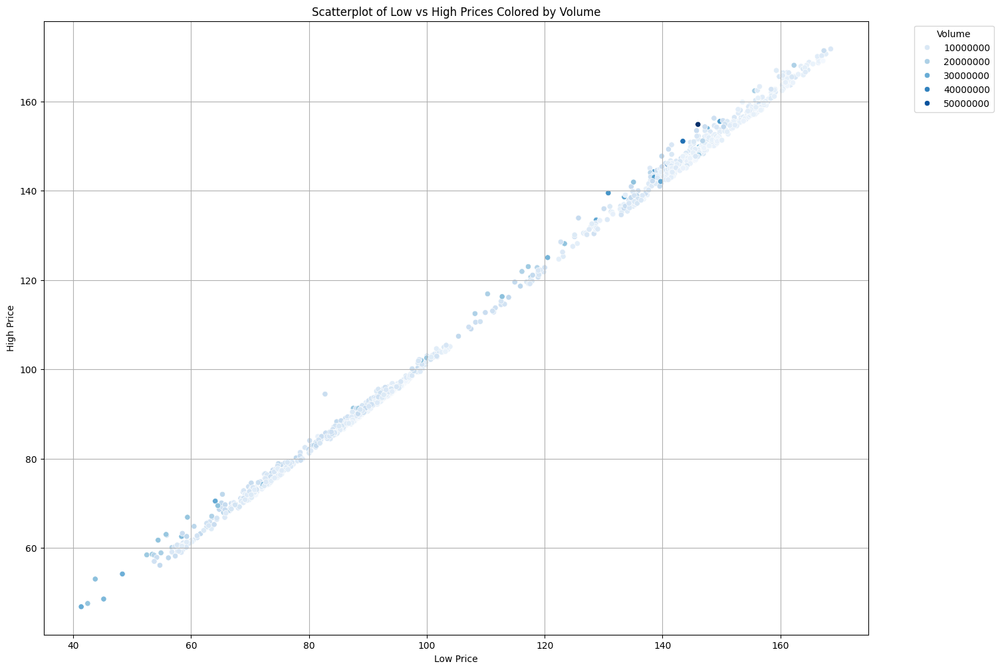

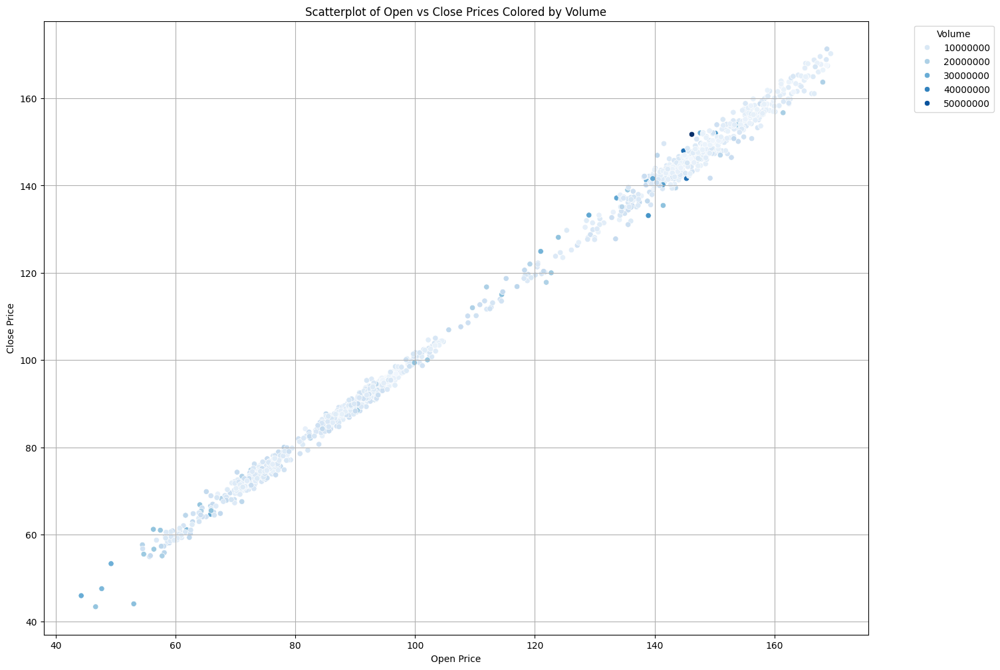

In [83]:
#Scater Plot Low VS High by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=CVX_df, x='Low', y='High', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Low vs High Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Low Price')
plt.ylabel('High Price')
plt.show()

#Scater Plot Open VS Close by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=CVX_df, x='Open', y='Close', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Open vs Close Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Open Price')
plt.ylabel('Close Price')
plt.show()

- A repetitive pattern between different prices for different stocks can be seen, while for the higher prices, volume is generally in lower amounts. Prices grow much more tightly for high and low than for open and close, which are more spread out.


- Chevron is also a very well-established company, and the good dividends paying mentioned before pay off, helping it thrive in a more volatile industry. The fact that it manages midstream energy infrastructure to transport, process, and store some of its production, as well as owning downstream chemicals and refining assets, allows it to maximize the value of its production and acts as an edge against commodity price fluctuations.


##Kroger

Kroger is a supermarket chain well established, given the fact that it was founded in 1833. It currently operates nearly 2,800 stores in 35 states. in the USA.


In [84]:
today = date.today()
end_date = today.strftime("2024-01-01")

d1 = date.today() - timedelta(days=1460)
start_date = d1.strftime("2019-01-01")

data = yf.download('KR', start=start_date, end=end_date, progress=False)
data.reset_index(inplace=True)
KR_df = data[["Date", "Open", "High", "Low", "Close", "Volume"]]

KR_df.columns = KR_df.columns.get_level_values(0)  # Removing the second level of my dataframe (Ticker AXP), since we are only analyzing one stock, there is no need for a MultiIndex
KR_df.head()

Price,Date,Open,High,Low,Close,Volume
0,2019-01-02,23.912968,24.035196,23.642321,23.834393,5512200
1,2019-01-03,23.685973,24.314573,23.685973,23.878046,8780700
2,2019-01-04,24.043927,24.628873,24.035197,24.148693,10299000
3,2019-01-07,24.139958,24.611408,23.790736,24.375683,8238600
4,2019-01-08,24.576489,24.873328,24.384418,24.847136,6063000


In [85]:
KR_df.describe()

Price,Date,Open,High,Low,Close,Volume
count,1258,1258.000000,1258.000000,1258.000000,1258.000000,1.258000e+03
mean,2021-06-30 18:48:38.918918912,35.564268,36.010195,35.160745,35.575069,7.758293e+06
min,2019-01-02 00:00:00,18.340107,18.525362,18.260715,18.366573,1.641100e+06
25%,2020-04-01 06:00:00,28.147208,28.585680,27.679531,28.177248,4.733600e+06
50%,2021-06-30 12:00:00,35.834475,36.249446,35.409173,35.792984,6.461850e+06
75%,2022-09-28 18:00:00,43.906221,44.289989,43.447721,43.863089,9.205100e+06
max,2023-12-29 00:00:00,58.003558,58.733279,57.180281,57.694828,4.542470e+07
std,NaN,9.464903,9.572504,9.358888,9.452035,4.763871e+06


- The average price stays around the 35 dollars mark, while the minimum is around 18 dollars and the maximum around 58, with a lower standard deviation, close to SiriusXM's one.


In [86]:
KR_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1258 entries, 0 to 1257
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1258 non-null   datetime64[ns]
 1   Open    1258 non-null   float64       
 2   High    1258 non-null   float64       
 3   Low     1258 non-null   float64       
 4   Close   1258 non-null   float64       
 5   Volume  1258 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 59.1 KB


In [87]:
KR_df.isnull().sum()

,0
Price,
Date,0
Open,0
High,0
Low,0
Close,0
Volume,0


###EDA

####Univariate



#####Histograms

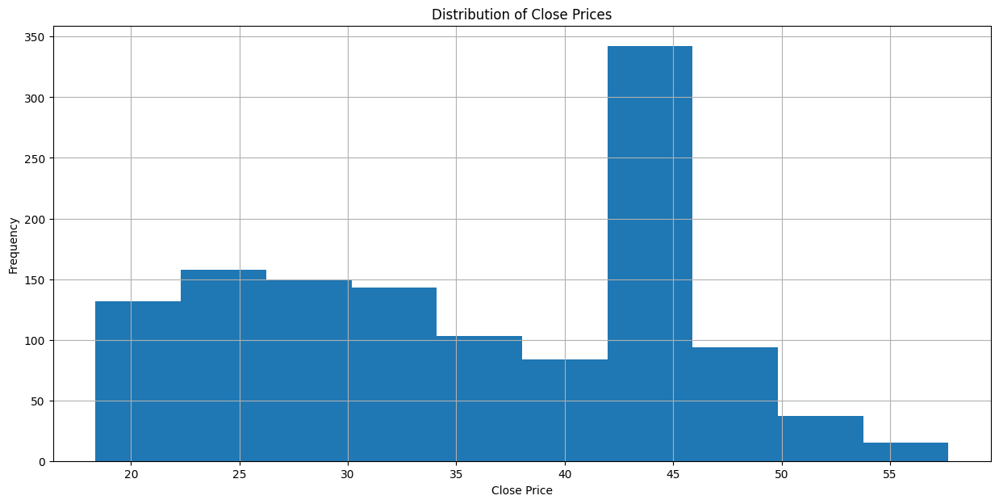

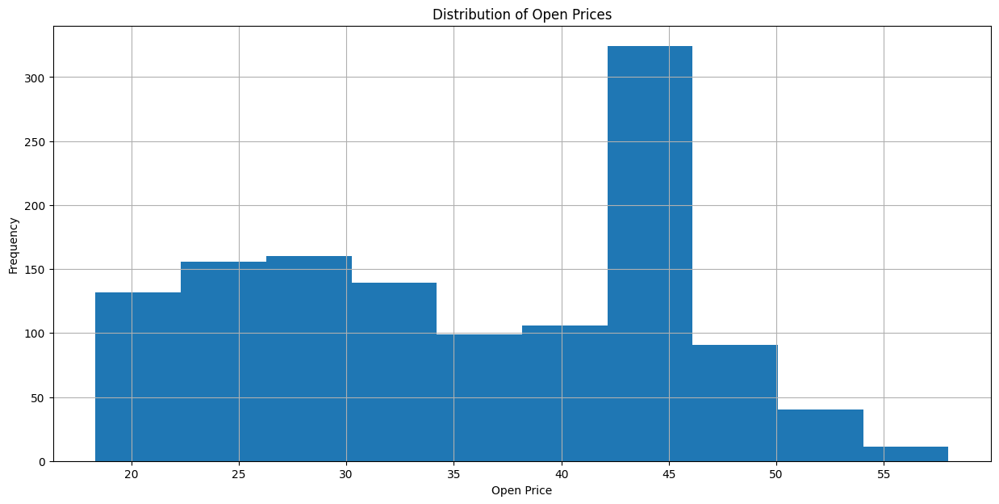

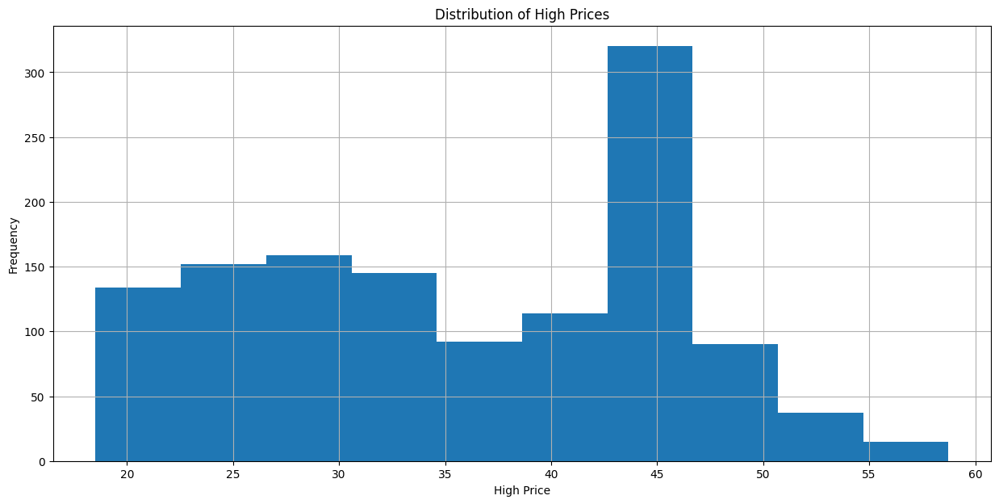

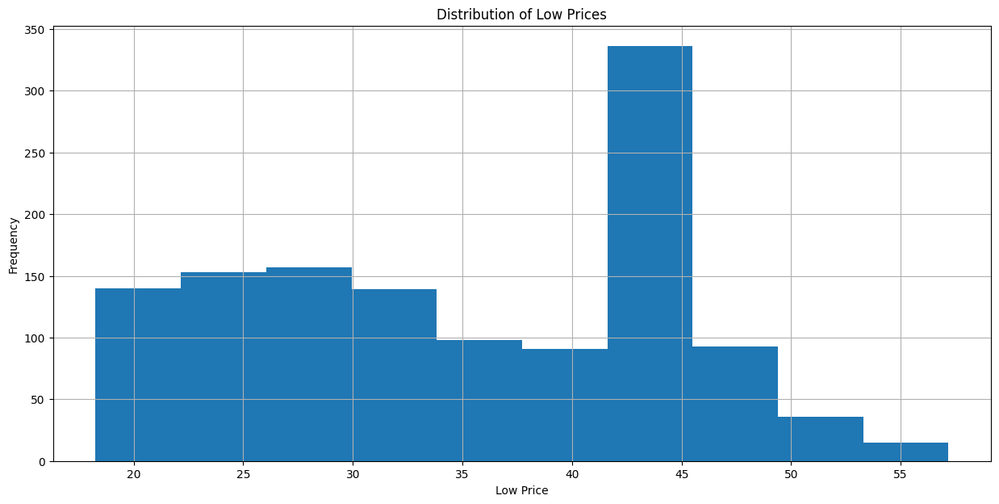

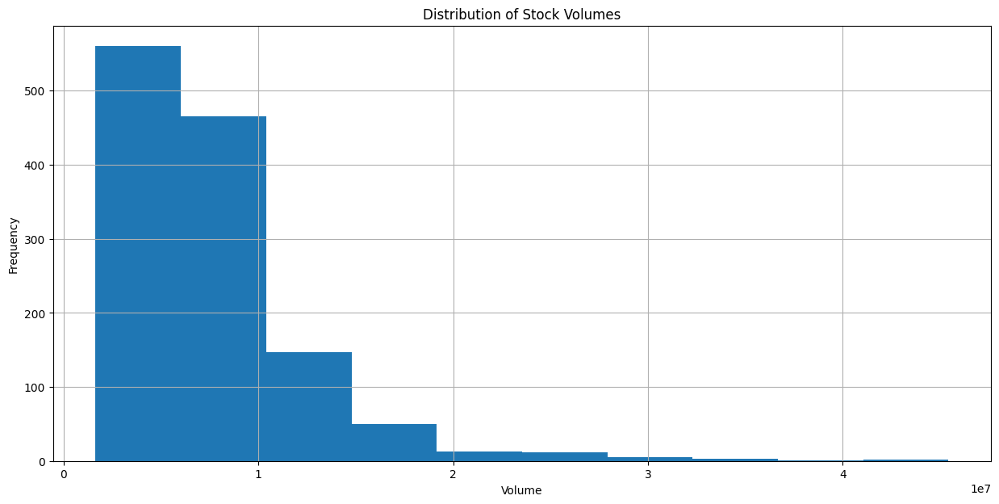

In [88]:
#Histograms

plt.subplots(figsize=(15,7))
plt.hist(KR_df['Close'])
plt.grid(True)
plt.title('Distribution of Close Prices')
plt.xlabel('Close Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(KR_df['Open'])
plt.grid(True)
plt.title('Distribution of Open Prices')
plt.xlabel('Open Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(KR_df['High'])
plt.grid(True)
plt.title('Distribution of High Prices')
plt.xlabel('High Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(KR_df['Low'])
plt.grid(True)
plt.title('Distribution of Low Prices')
plt.xlabel('Low Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(KR_df['Volume'])
plt.grid(True)
plt.title('Distribution of Stock Volumes')
plt.xlabel('Volume')
plt.ylabel('Frequency')
plt.show()

- A pretty similar distribution between prices as well, all left-skewed, while the volume is right-skewed.


#####Boxplots

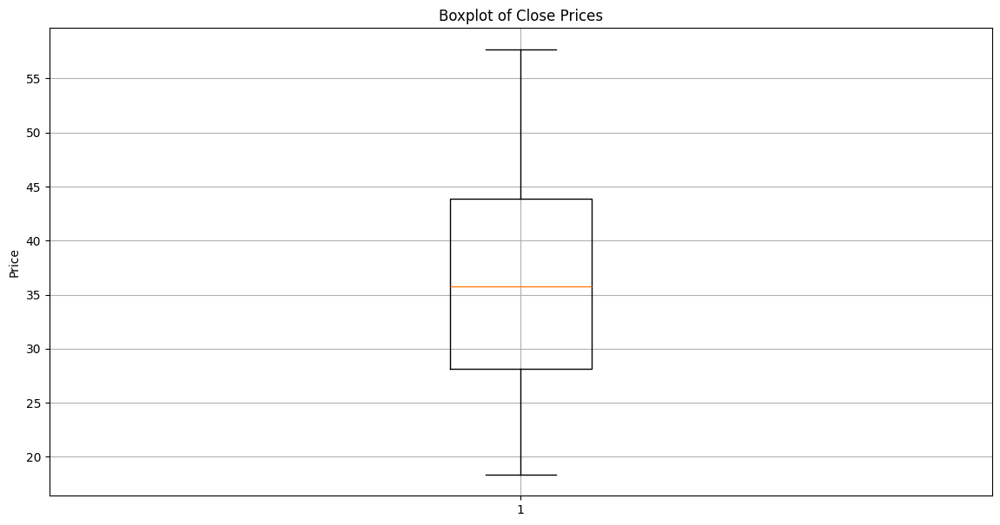

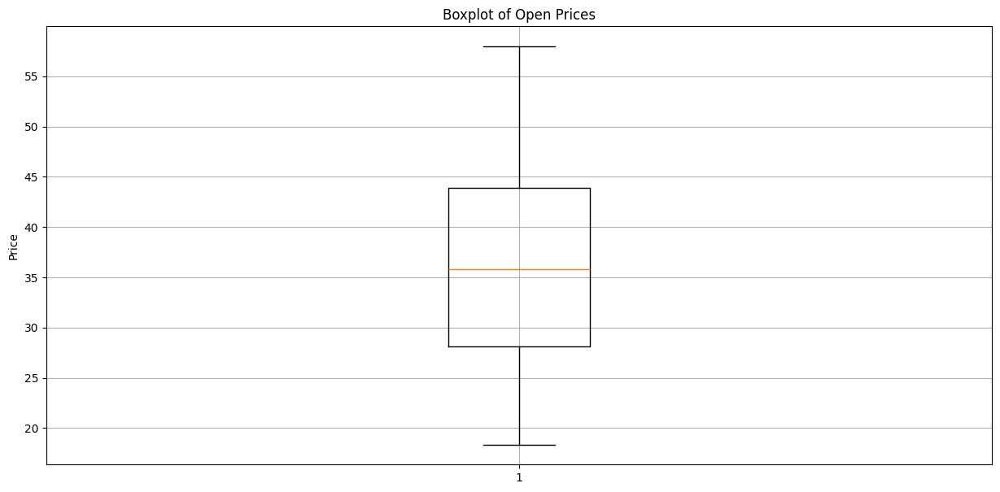

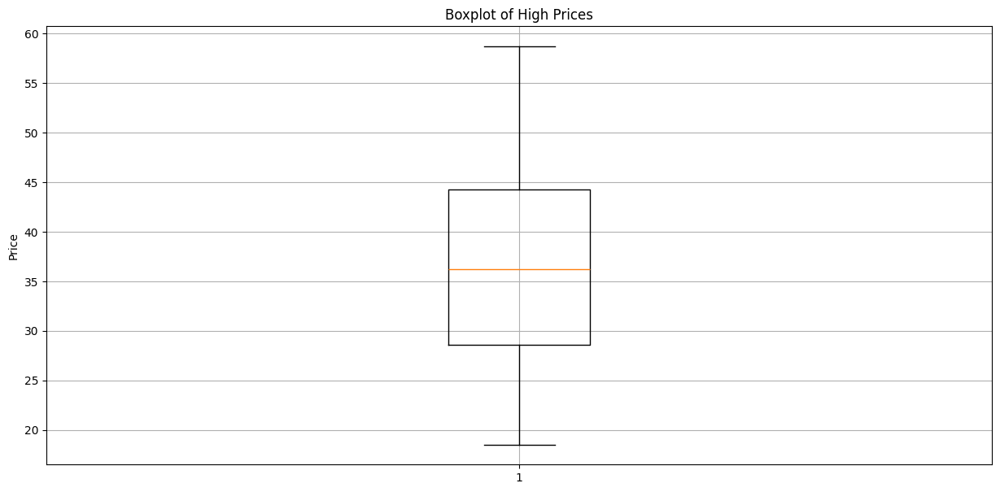

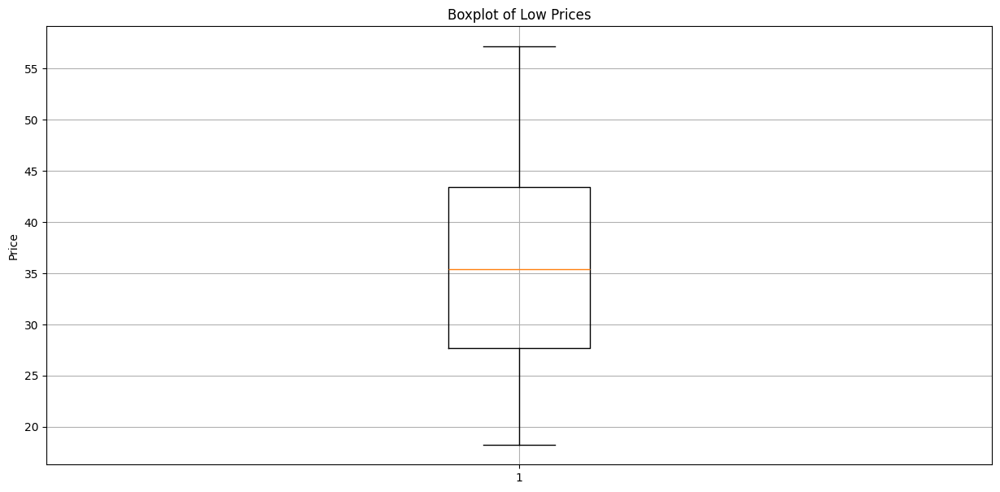

In [89]:
#Boxplots

plt.subplots(figsize=(14,7))
plt.boxplot(KR_df['Close'])
plt.grid(True)
plt.title('Boxplot of Close Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(KR_df['Open'])
plt.grid(True)
plt.title('Boxplot of Open Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(KR_df['High'])
plt.grid(True)
plt.title('Boxplot of High Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(KR_df['Low'])
plt.grid(True)
plt.title('Boxplot of Low Prices')
plt.ylabel('Price')
plt.show()

- No outliers, the median is around 36 dollars, while the maximum is approximately 57 dollars and the minimum a little lower than 20 dollars.


#####Linecharts

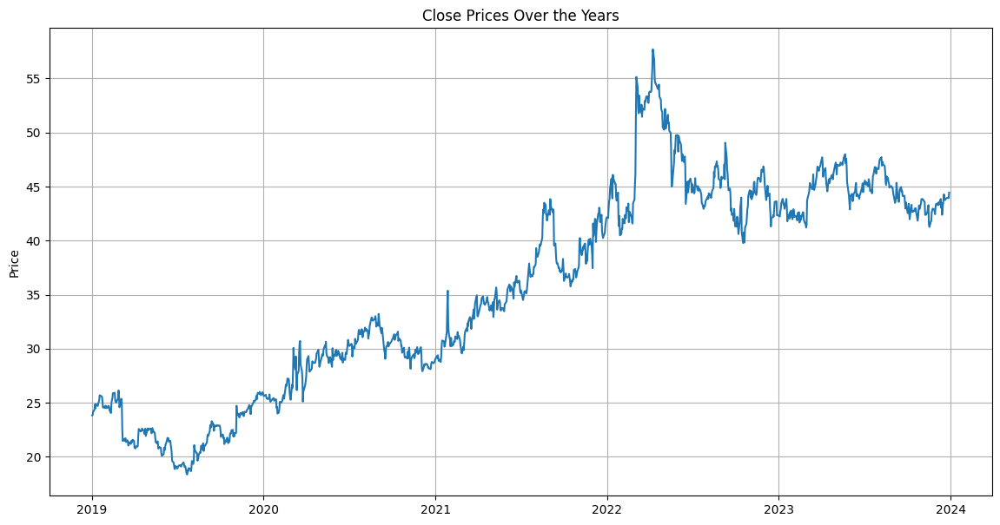

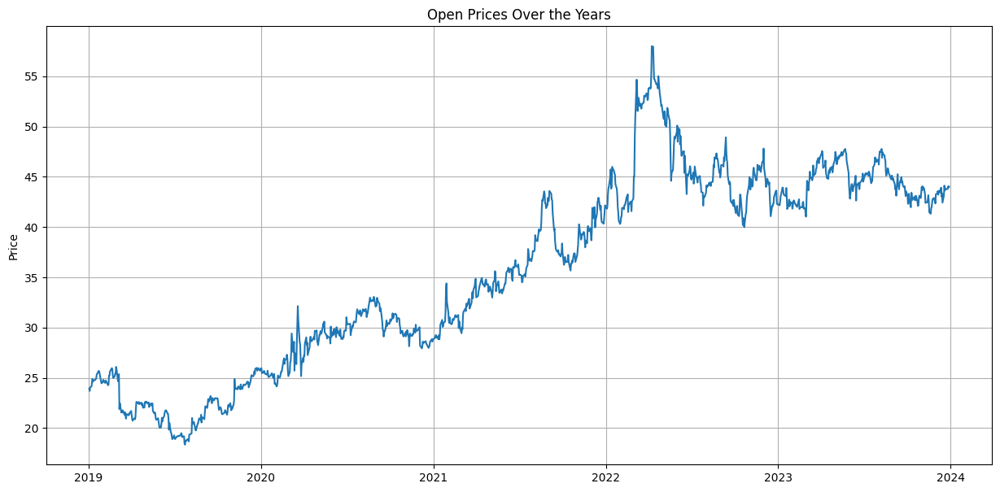

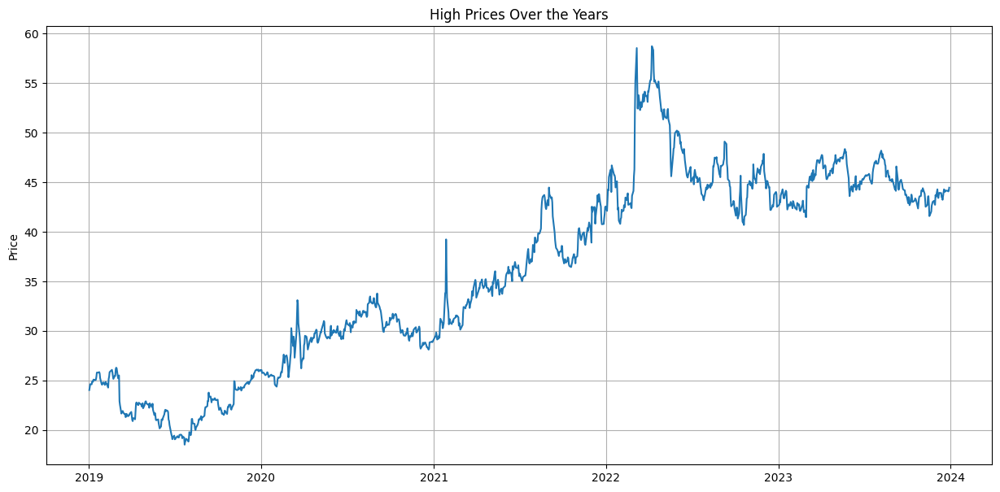

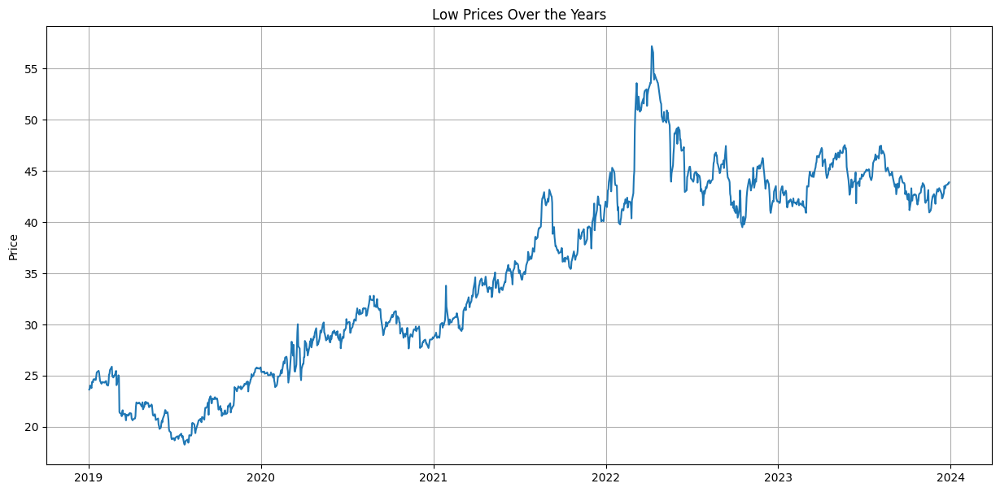

In [90]:
#Linecharts

plt.subplots(figsize=(14,7))
plt.plot(KR_df['Date'], KR_df['Close'])
plt.grid(True)
plt.title('Close Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(KR_df['Date'], KR_df['Open'])
plt.grid(True)
plt.title('Open Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(KR_df['Date'], KR_df['High'])
plt.grid(True)
plt.title('High Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(KR_df['Date'], KR_df['Low'])
plt.grid(True)
plt.title('Low Prices Over the Years')
plt.ylabel('Price')
plt.show()

- Kroger's stock prices have been trending upwards. The pandemic doesn't seem to have affected its trend in the graph because grocery retailers like Kroger were perceived as essential businesses, maintaining steady demand. It seems that in the first quarter of every year, there is a peak in the stock prices, which could be due to the release of their first earnings reports or something related.

- However, it also varies with time, and in 2021, there was a second major peak towards the end of the year, probably because of its robust financial results for Q3 2021, with net earnings attributable to the company reaching 1.013 billion dollars, up from 2.989 billion dollars in the same quarter of the previous year.

- We can also see a major peak at the start of 2022 due to optimism from Kroger's good performance in Q4 2021.


#####Time Series Components

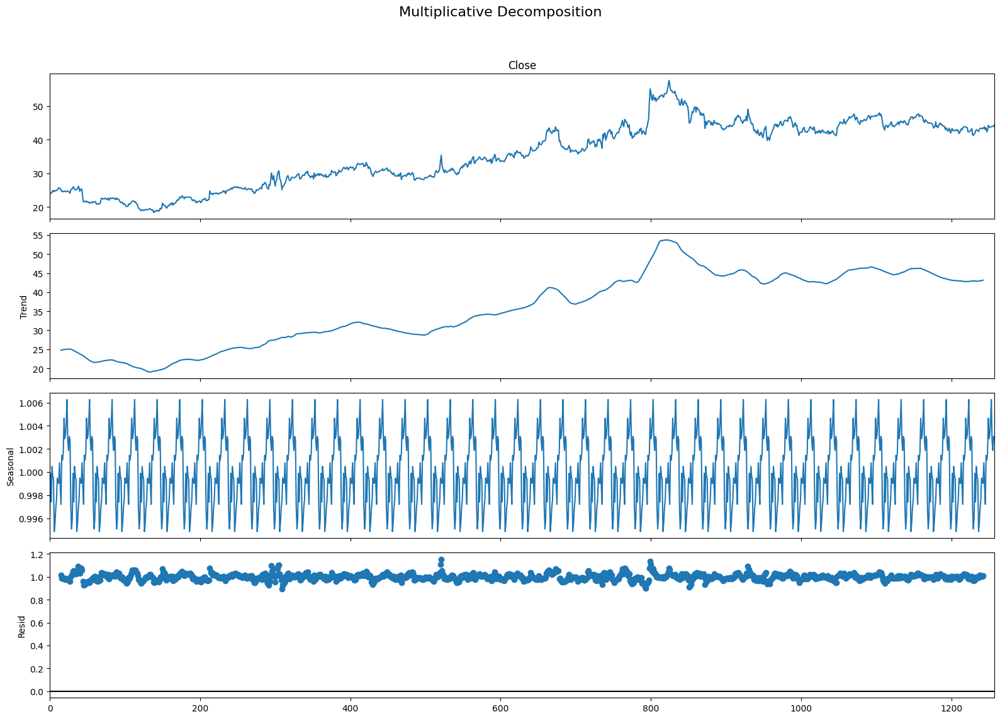

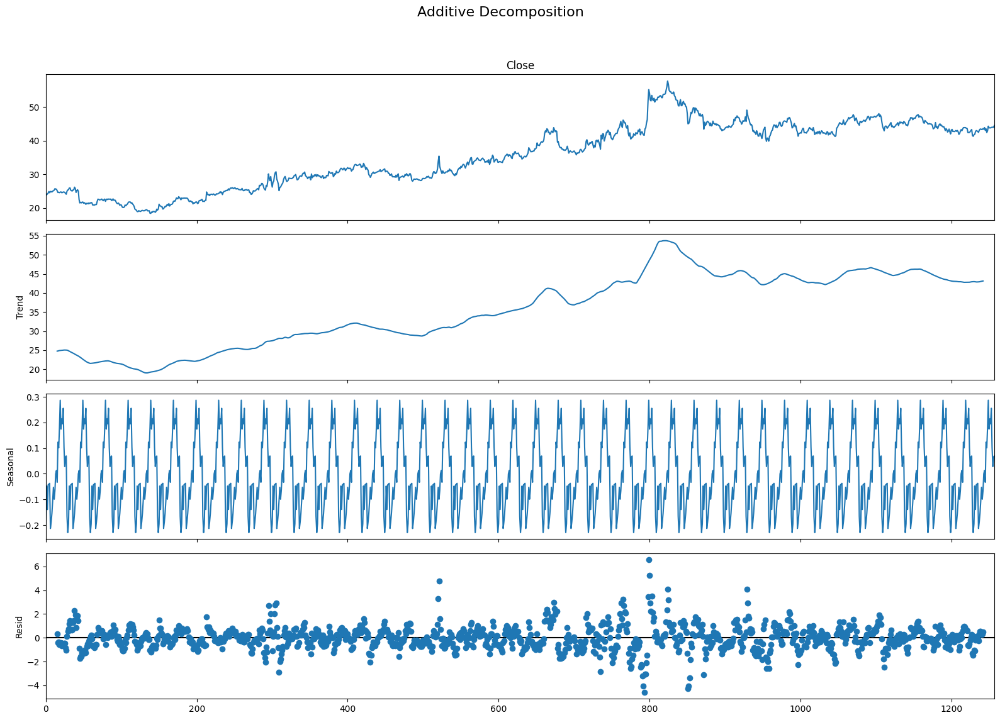

In [91]:
# Multiplicative Decomposition
multiplicative_decomposition = seasonal_decompose(KR_df['Close'], model='multiplicative', period=30)

# Additive Decomposition
additive_decomposition = seasonal_decompose(KR_df['Close'], model='additive', period=30)

# Plot
plt.rcParams.update({'figure.figsize': (16,12)})
multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

additive_decomposition.plot().suptitle('Additive Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

- As mentioned before, Kroger's stock prices have been trending upwards. In terms of seasonal components, we can see that Kroger seems to be much more volatile than the other stocks on a monthly basis, with a lot of ups and big downs in a month. Regarding the residuals, we can see that the most noise actually comes from the great start in 2021 and also in 2022, led by the optimism from Q4 2021.


####Bivariate

<Axes: xlabel='Price', ylabel='Price'>

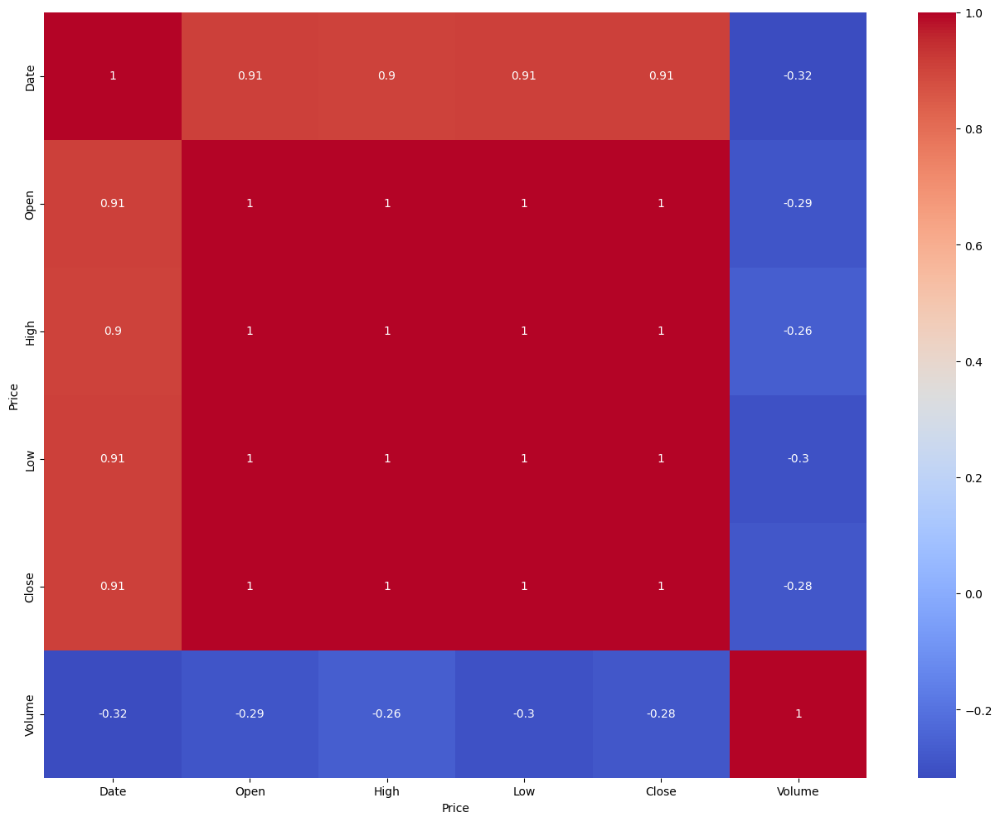

In [92]:
KR_df.corr()
sns.heatmap(KR_df.corr(), annot=True, cmap='coolwarm')

- Prices have a very high correlation with date, which makes sense given the steep upward trend over the years, and they have a negative correlation with volume, but again, not that strong.


####Multivariate

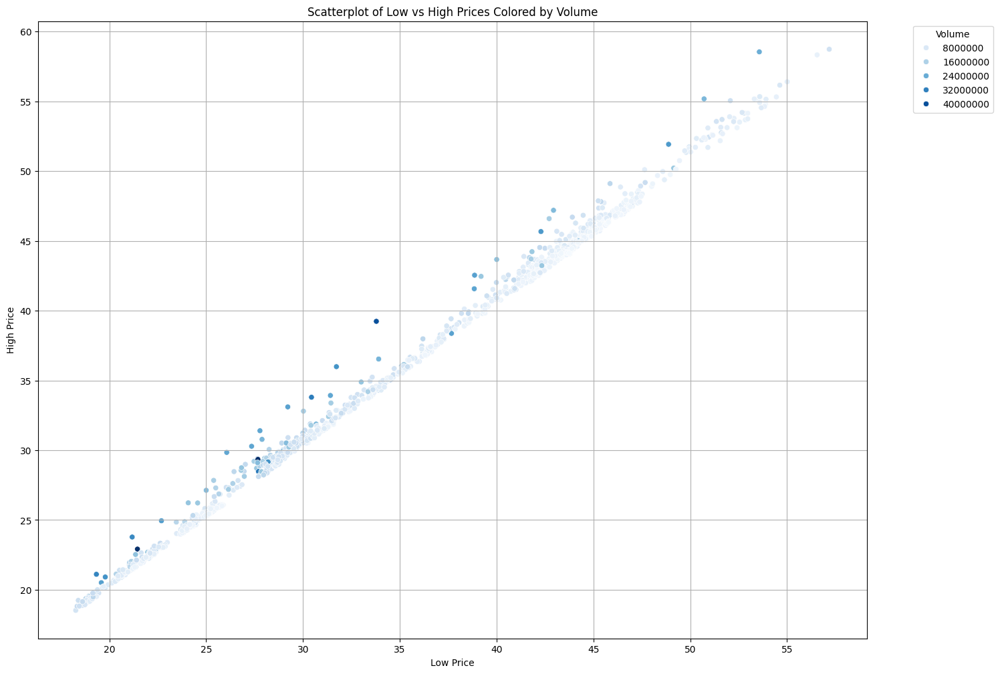

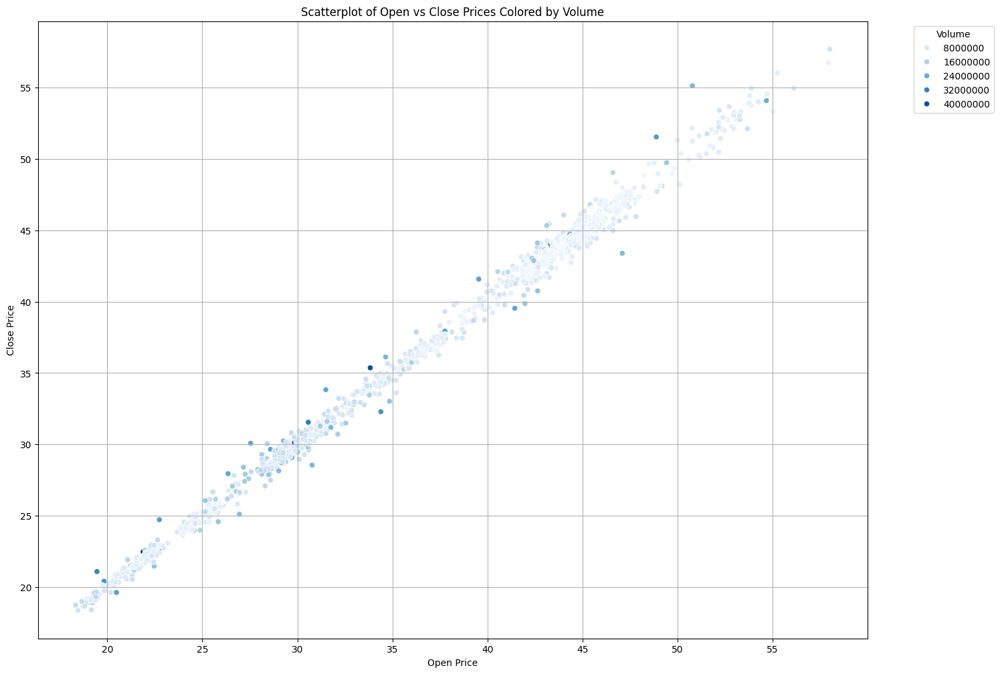

In [93]:
#Scater Plot Low VS High by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=KR_df, x='Low', y='High', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Low vs High Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Low Price')
plt.ylabel('High Price')
plt.show()

#Scater Plot Open VS Close by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=KR_df, x='Open', y='Close', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Open vs Close Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Open Price')
plt.ylabel('Close Price')
plt.show()

- As with all the other stocks, volume is lower at higher prices, but low and high prices grow much tighter together than open and close prices.


Kroger is a well-established brand that has gone through the pandemic well and continues to grow. Over the past few years, it has demonstrated consistent financial performance, with revenue increasing yearly, and its strong focus on community involvement, sustainability, and innovation has garnered attention and praise from consumers and investors.


##ALLY FINL INC

Ally is an American bank holding company that has been around since 1919. It is a leading digital financial services company, and according to its CFO, it is the largest national all-digital bank. Ally Bank, the company's direct banking subsidiary, offers an array of deposit and mortgage products and services.


In [94]:
today = date.today()
end_date = today.strftime("2024-01-01")

d1 = date.today() - timedelta(days=1460)
start_date = d1.strftime("2019-01-01")

data = yf.download('ALLY', start=start_date, end=end_date, progress=False)
data.reset_index(inplace=True)
ALLY_df = data[["Date", "Open", "High", "Low", "Close", "Volume"]]

ALLY_df.columns = ALLY_df.columns.get_level_values(0)  # Removing the second level of my dataframe (Ticker AXP), since we are only analyzing one stock, there is no need for a MultiIndex
ALLY_df.head()

Price,Date,Open,High,Low,Close,Volume
0,2019-01-02,18.441907,19.095231,18.259970,18.921562,3298700
1,2019-01-03,18.830595,19.169662,18.690007,18.739626,3976200
2,2019-01-04,19.128309,19.554211,19.103500,19.368137,3149400
3,2019-01-07,19.392953,19.814717,19.314388,19.740290,3601300
4,2019-01-08,19.980113,20.244750,19.798176,19.922224,3110200


In [95]:
ALLY_df.describe()

Price,Date,Open,High,Low,Close,Volume
count,1258,1258.000000,1258.000000,1258.000000,1258.000000,1.258000e+03
mean,2021-06-30 18:48:38.918918912,29.596212,30.053167,29.151524,29.593334,4.458574e+06
min,2019-01-02 00:00:00,9.878720,10.499863,8.695996,9.955298,8.281000e+05
25%,2020-04-01 06:00:00,24.037909,24.360648,23.641771,24.042912,2.977875e+06
50%,2021-06-30 12:00:00,26.657735,27.025459,26.387385,26.674521,3.789150e+06
75%,2022-09-28 18:00:00,36.821180,37.476653,36.132078,36.657863,5.205250e+06
max,2023-12-29 00:00:00,49.713503,49.907457,48.642359,49.501923,4.311580e+07
std,NaN,9.109762,9.198528,9.028070,9.108482,2.690875e+06


- The stock prices ranged around 29 dollars between 2019 and 2024, with a minimum of around 9 dollars and a maximum of around 49 dollars. It has a lower standard deviation, similar to Kroger and SiriusXM.


In [96]:
ALLY_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1258 entries, 0 to 1257
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1258 non-null   datetime64[ns]
 1   Open    1258 non-null   float64       
 2   High    1258 non-null   float64       
 3   Low     1258 non-null   float64       
 4   Close   1258 non-null   float64       
 5   Volume  1258 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 59.1 KB


In [97]:
ALLY_df.isnull().sum()

,0
Price,
Date,0
Open,0
High,0
Low,0
Close,0
Volume,0


###EDA

####Univariate


#####Histograms

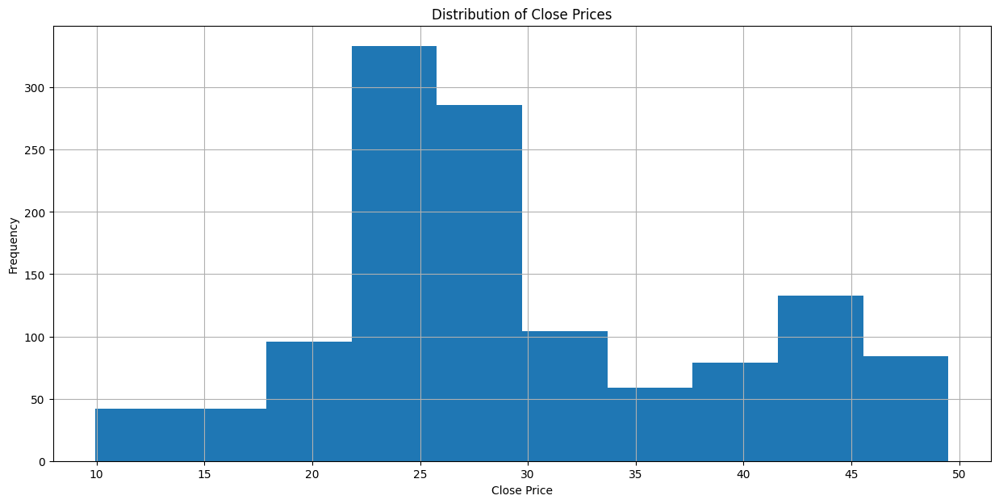

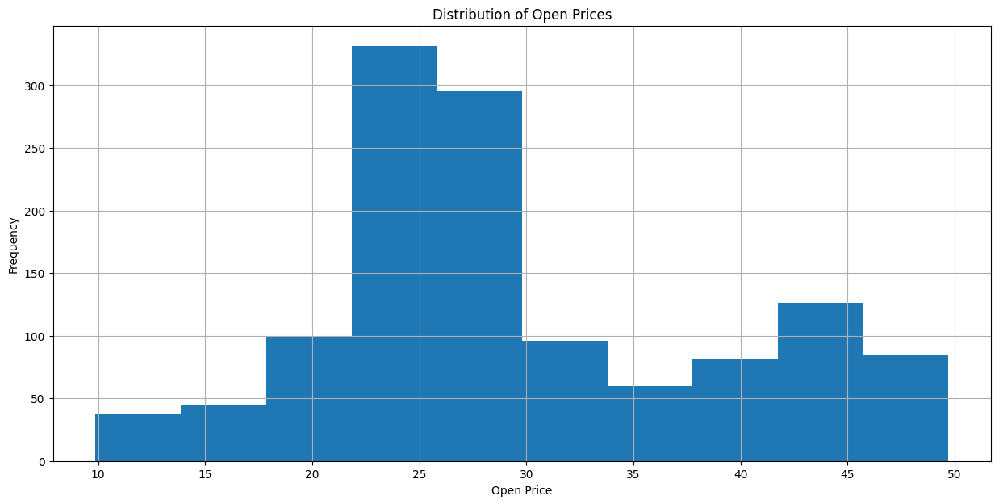

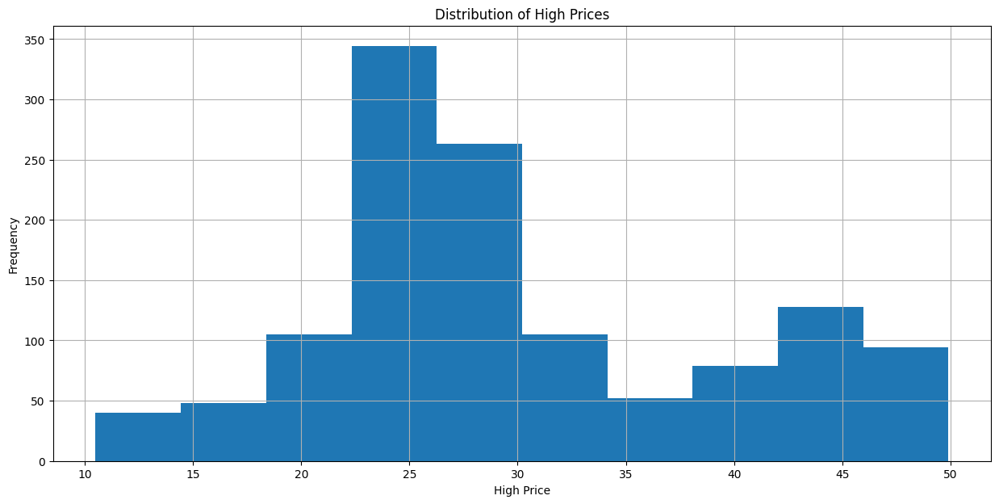

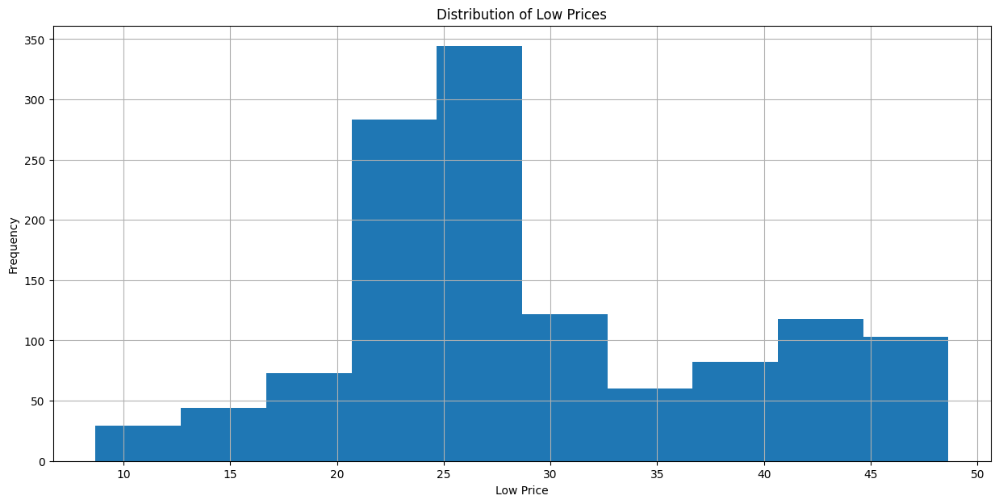

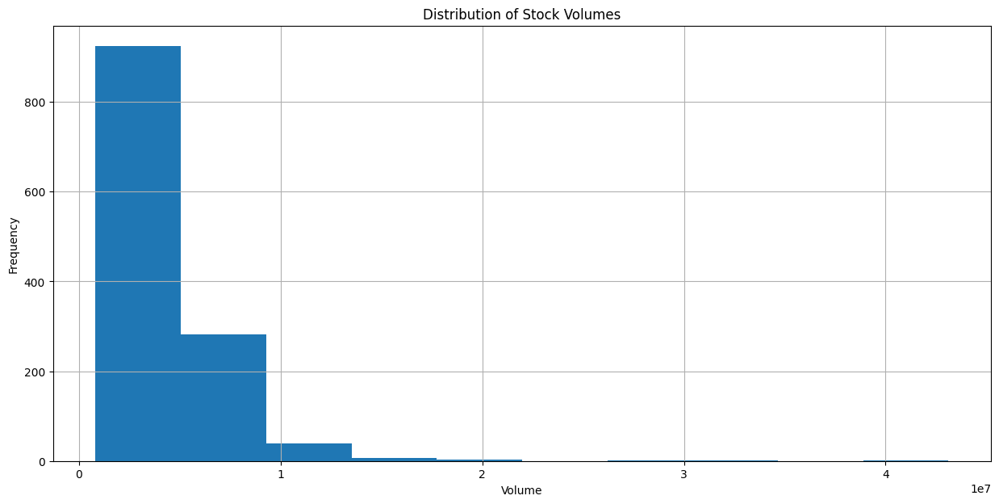

In [98]:
#Histograms

plt.subplots(figsize=(15,7))
plt.hist(ALLY_df['Close'])
plt.grid(True)
plt.title('Distribution of Close Prices')
plt.xlabel('Close Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(ALLY_df['Open'])
plt.grid(True)
plt.title('Distribution of Open Prices')
plt.xlabel('Open Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(ALLY_df['High'])
plt.grid(True)
plt.title('Distribution of High Prices')
plt.xlabel('High Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(ALLY_df['Low'])
plt.grid(True)
plt.title('Distribution of Low Prices')
plt.xlabel('Low Price')
plt.ylabel('Frequency')
plt.show()

plt.subplots(figsize=(15,7))
plt.hist(ALLY_df['Volume'])
plt.grid(True)
plt.title('Distribution of Stock Volumes')
plt.xlabel('Volume')
plt.ylabel('Frequency')
plt.show()

Similar distribution across prices, all right-skewed, as is the volume's distribution..


#####Boxplots

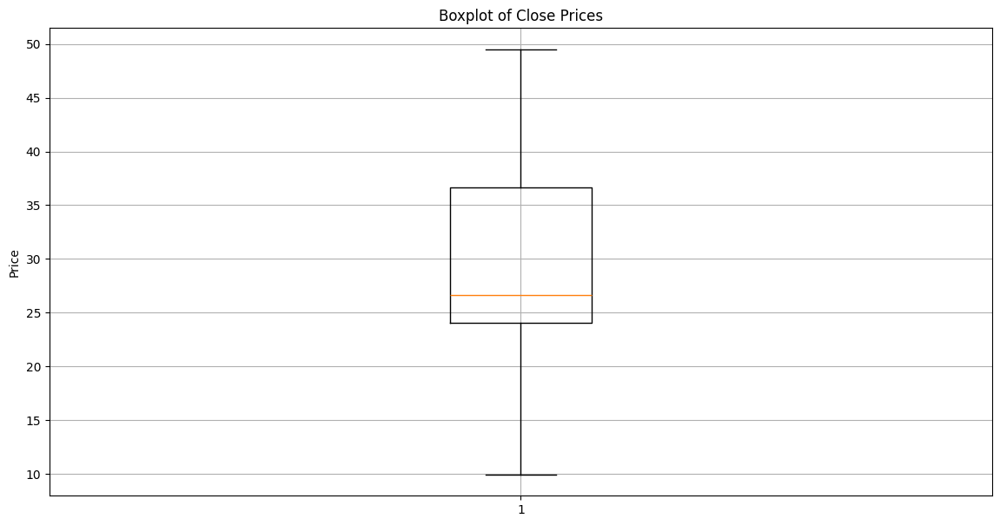

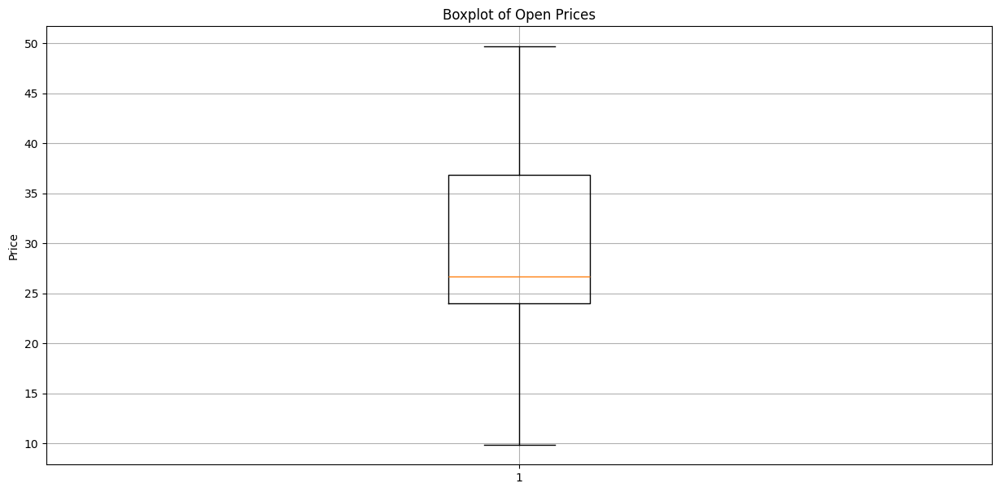

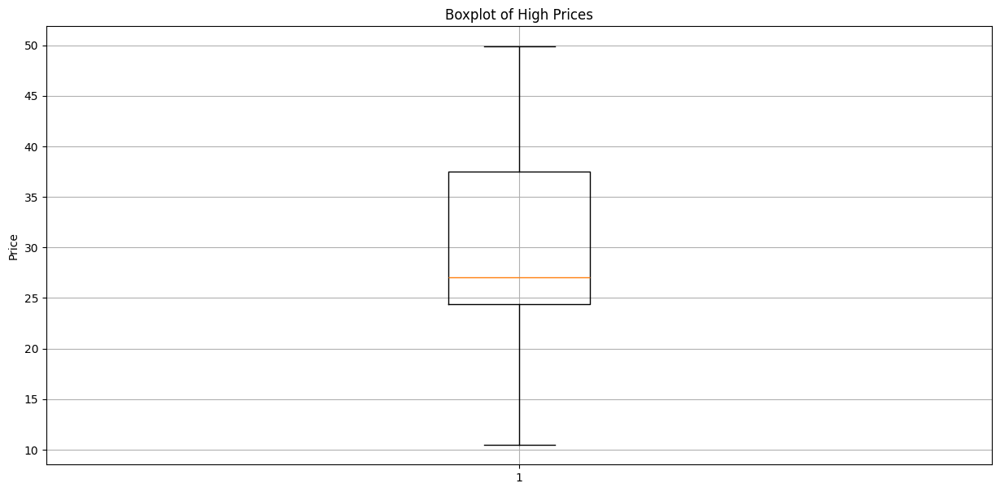

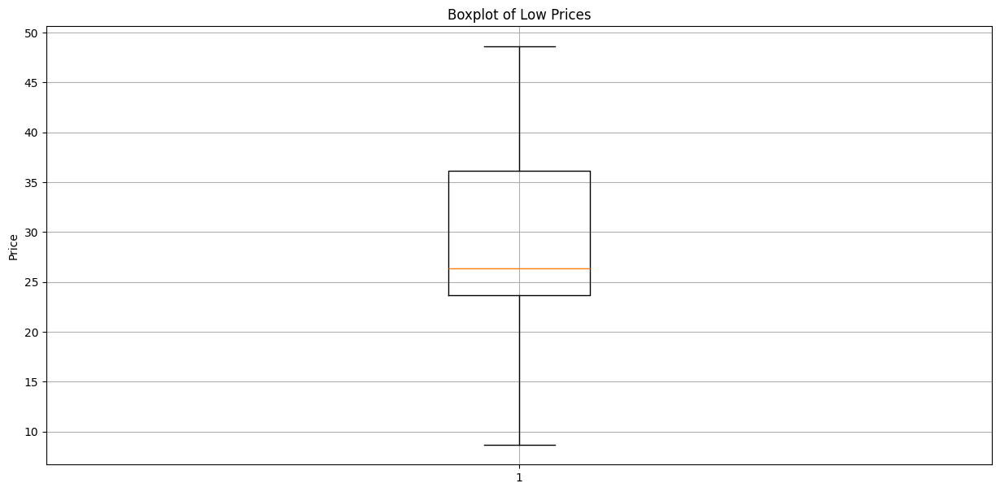

In [99]:
#Boxplots

plt.subplots(figsize=(14,7))
plt.boxplot(ALLY_df['Close'])
plt.grid(True)
plt.title('Boxplot of Close Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(ALLY_df['Open'])
plt.grid(True)
plt.title('Boxplot of Open Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(ALLY_df['High'])
plt.grid(True)
plt.title('Boxplot of High Prices')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.boxplot(ALLY_df['Low'])
plt.grid(True)
plt.title('Boxplot of Low Prices')
plt.ylabel('Price')
plt.show()

- No outliers. The median of prices is around 27 dollars, while the minimum is around 10 dollars and the maximum around 50 dollars.


#####Linecharts

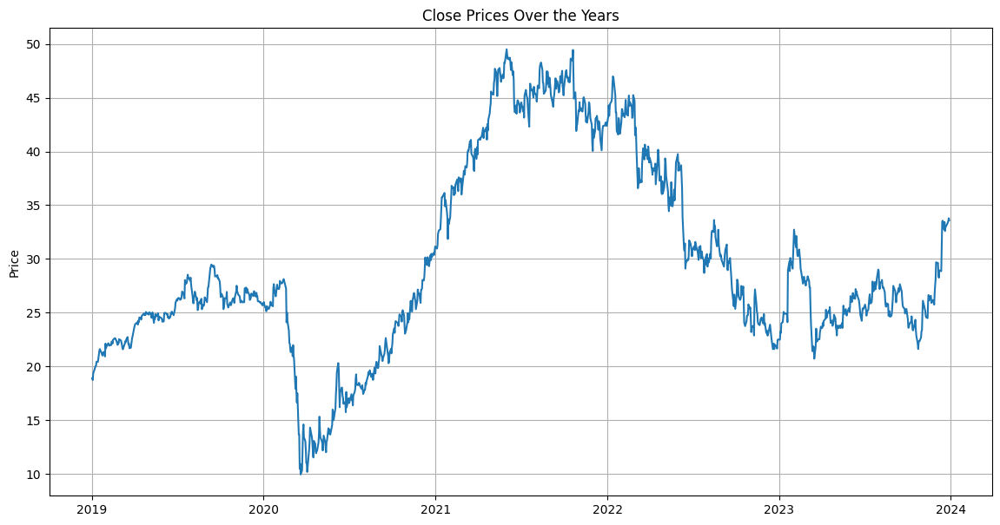

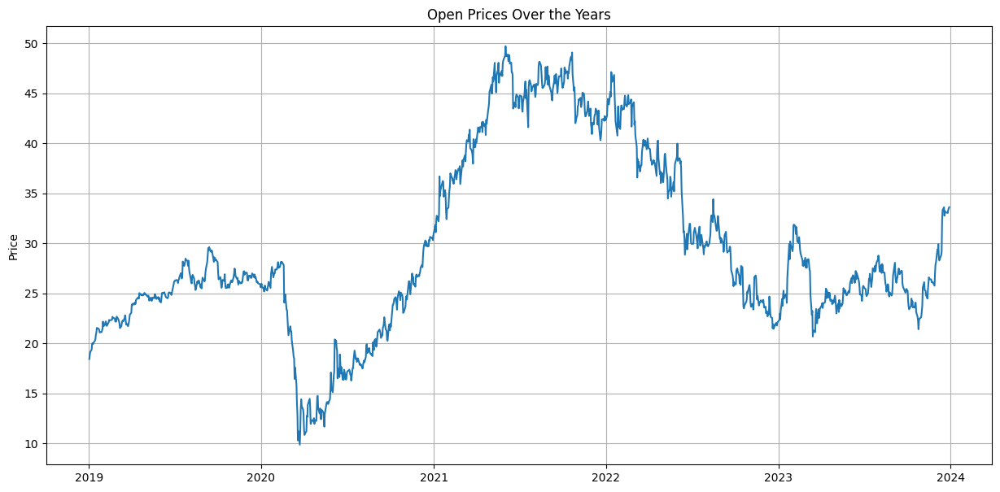

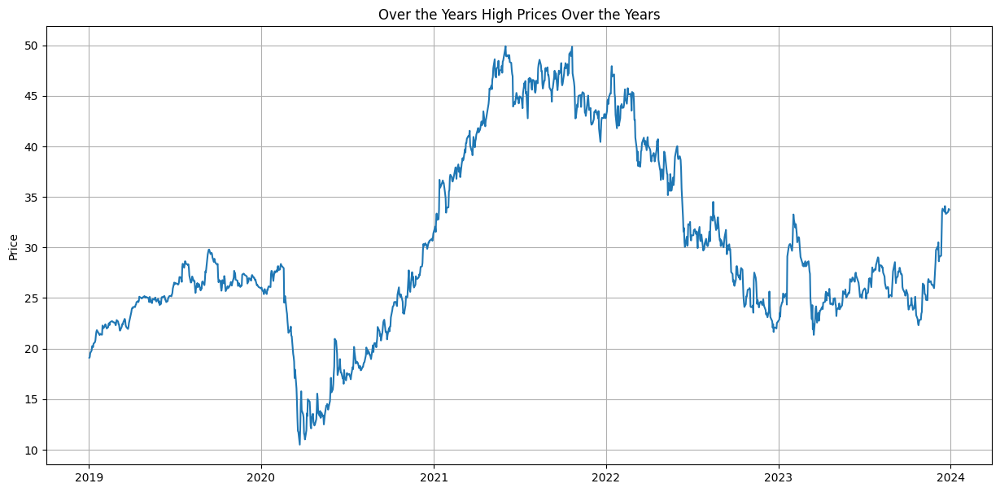

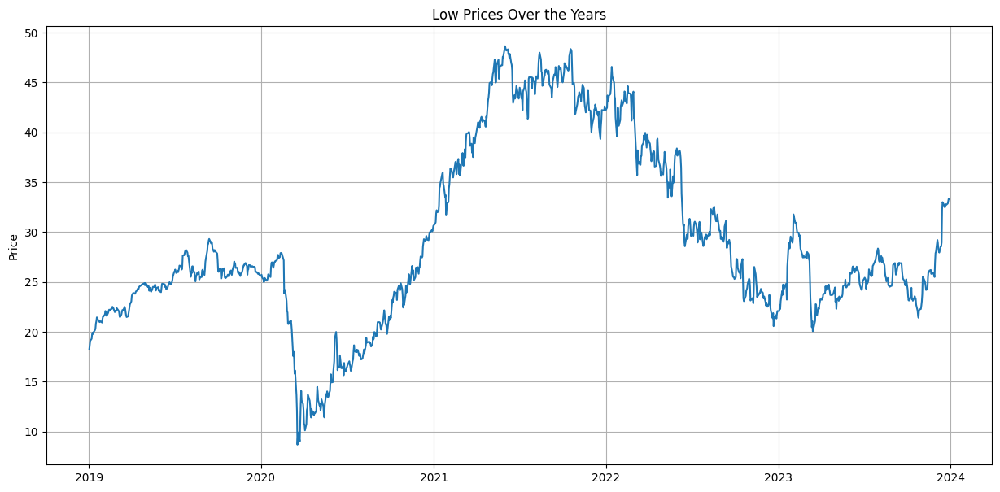

In [100]:
#Linecharts

plt.subplots(figsize=(14,7))
plt.plot(ALLY_df['Date'], ALLY_df['Close'])
plt.grid(True)
plt.title('Close Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(ALLY_df['Date'], ALLY_df['Open'])
plt.grid(True)
plt.title('Open Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(ALLY_df['Date'], ALLY_df['High'])
plt.grid(True)
plt.title('Over the Years High Prices Over the Years')
plt.ylabel('Price')
plt.show()

plt.subplots(figsize=(15,7))
plt.plot(ALLY_df['Date'], ALLY_df['Low'])
plt.grid(True)
plt.title('Low Prices Over the Years')
plt.ylabel('Price')
plt.show()

- Ally had its lowest prices during the pandemic, showing it was affected by the irregular event, but after that, the prices soared until 2022, when they started trending downwards again.

- Its digital bank-only model gave the financial services company an advantage during the pandemic, while, as a leading auto lender, it benefited from a surge in auto sales post-pandemic, leading to increased loan volumes and profitability.


#####Time Series Components

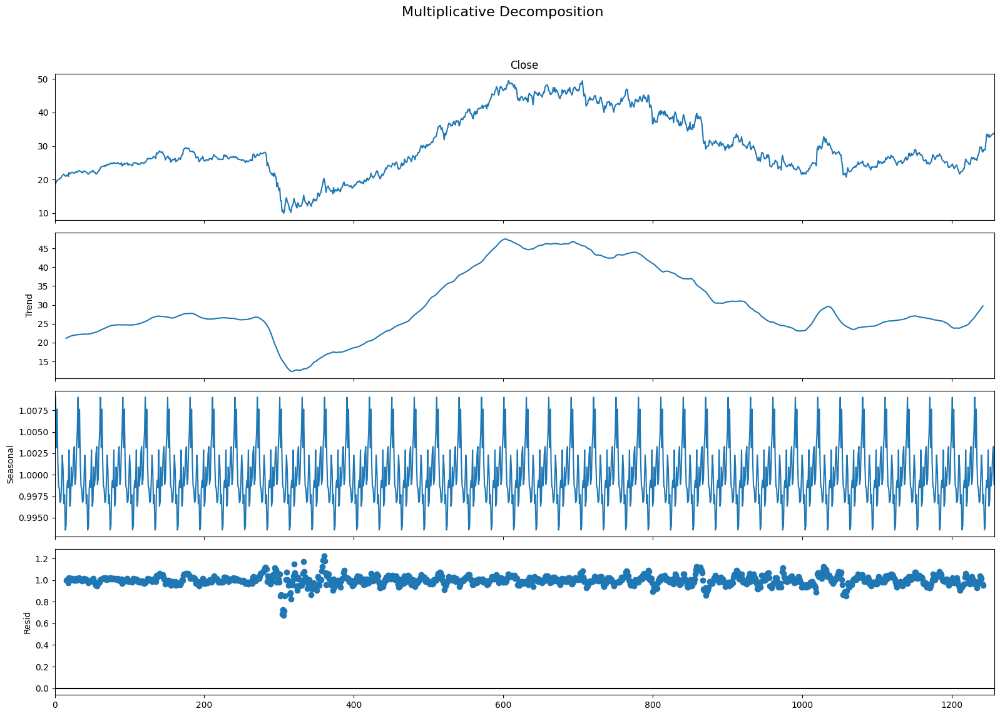

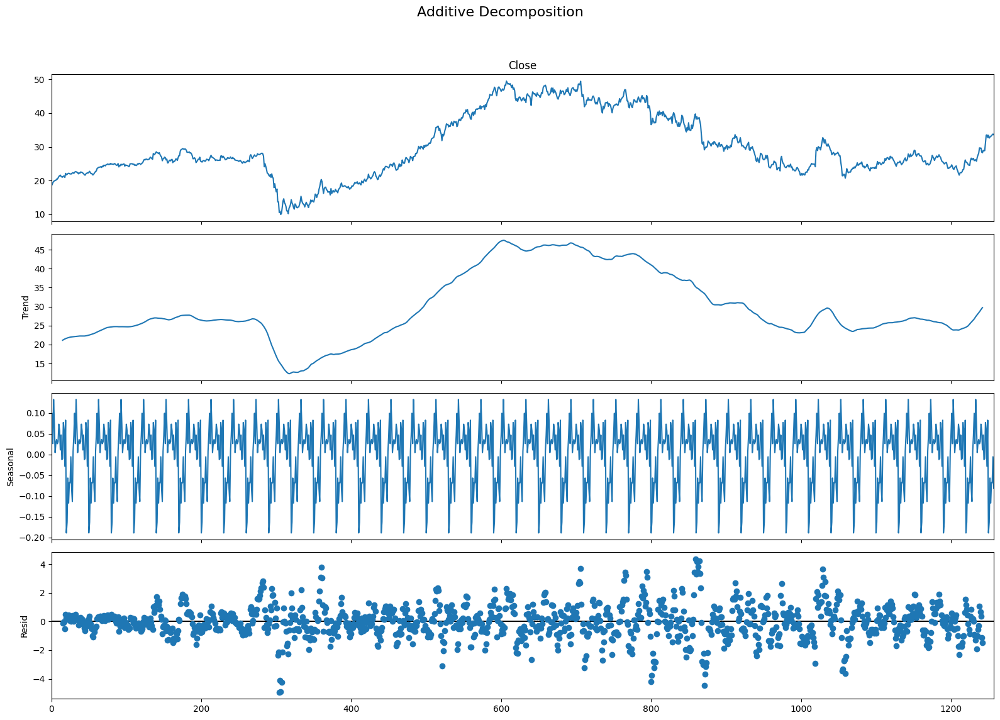

In [101]:
# Multiplicative Decomposition
multiplicative_decomposition = seasonal_decompose(ALLY_df['Close'], model='multiplicative', period=30)

# Additive Decomposition
additive_decomposition = seasonal_decompose(ALLY_df['Close'], model='additive', period=30)

# Plot
plt.rcParams.update({'figure.figsize': (16,12)})
multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

additive_decomposition.plot().suptitle('Additive Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

- Ally trended upwards from 2020 to 2022, presenting strong performance because of its advantages during the pandemic, but from 2022 to 2023, it started trending downwards in a smoother way.

- If we observe the seasonal components, it also seems like a very volatile stock monthly, with a big rise at the beginning of the month, and it keeps varying around a similar range throughout the month before falling towards the end of the month and the beginning of another month. If we look at the residuals, we can see the noise that the pandemic disruption caused in the stock prices during that period.


####Bivariate

<Axes: xlabel='Price', ylabel='Price'>

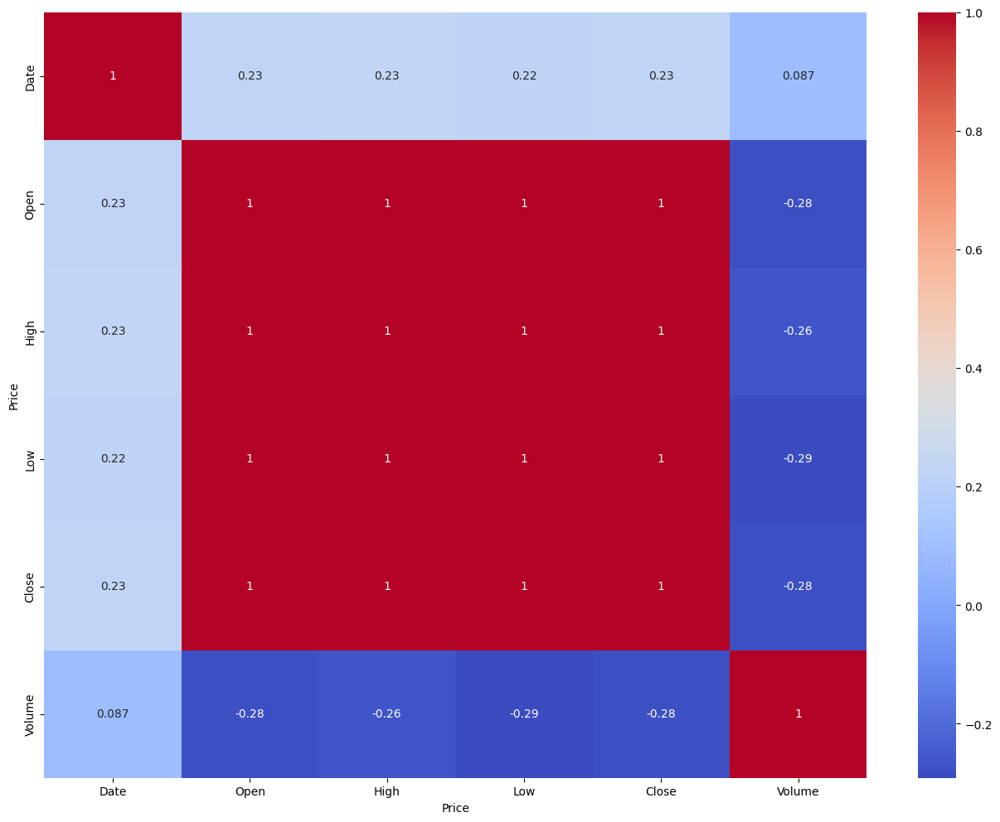

In [102]:
ALLY_df.corr()
sns.heatmap(ALLY_df.corr(), annot=True, cmap='coolwarm')

- Stock prices have a very weak positive correlation with the date and a weak positive correlation with volume. They have a strong positive correlation between themselves.


####Multivariate

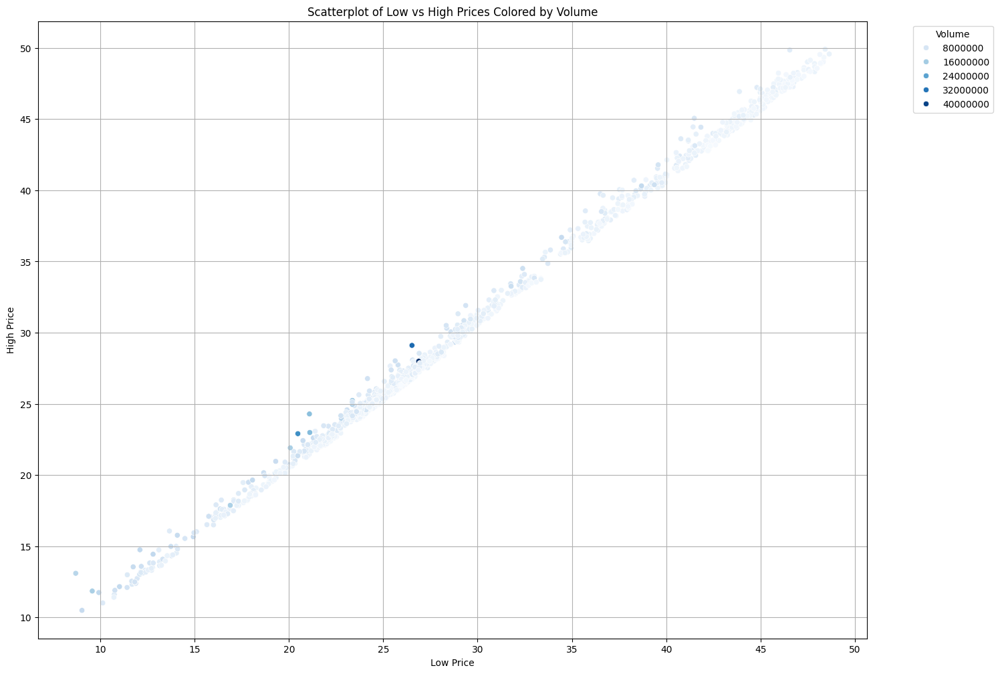

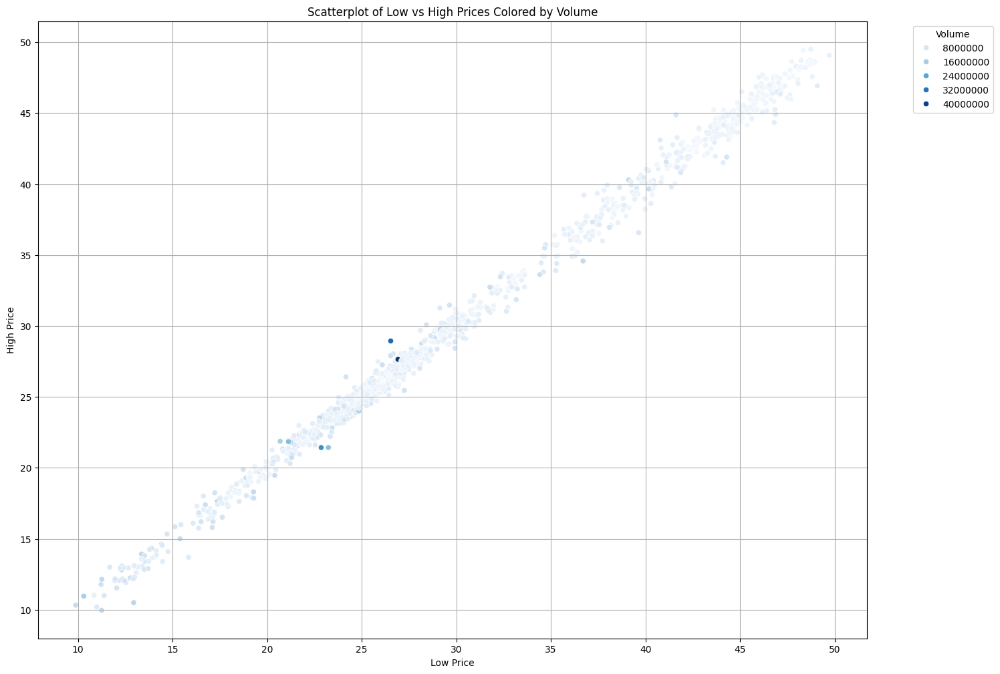

In [103]:
#Scater Plot Low VS High by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=ALLY_df, x='Low', y='High', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Low vs High Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Low Price')
plt.ylabel('High Price')
plt.show()

#Scater Plot Open VS Close by Volume

fig, ax = plt.subplots()
# Create the scatterplot
sns.scatterplot(data=ALLY_df, x='Open', y='Close', hue='Volume', ax=ax, palette='Blues')

plt.title('Scatterplot of Low vs High Prices Colored by Volume')
plt.grid(True)
ax.legend(title='Volume', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.xlabel('Low Price')
plt.ylabel('High Price')
plt.show()

- As shown in the other stocks, stocks tend to present higher prices when the volume is lower, but in Ally's case, we don't see any blue dots (higher volumes) at the highest prices. Again, high and low prices grow more tightly together than open and close prices, but open and close prices in this plot are not as spread out.


Ally Financial, has a long-standing presence in the financial services market as the former financial arm of General Motors. As one of the largest consumer auto lenders in the U.S., Ally has built a strong reputation, leveraging its diversified business model that includes auto loans, mortgages, personal loans, credit cards, and online banking services.

##Portfolio Analysis

We picked a diversified range of stocks to represent Buffett's portfolio in our analysis and tried to uncover any patterns between these companies, which are in totally different industries, and also see how these companies align with the famous investment strategy of Value Investing that Buffett is known for following. This strategy basically involves investing in undervalued companies with high potential for growth.


###New DF with Stocks Closing Prices



- Created a new DataFrame with only the stocks' closing prices for simplification of the analysis. Based on our previous analysis, we observed that different price categories in stocks have similar behaviors, so we thought that the closing price could be a good representation of the stock's overall performance.







In [104]:
BH_portifolio = pd.DataFrame()
BH_portifolio['Date'] = df_BAC['Date']
BH_portifolio['BAC'] = df_BAC['Close']
BH_portifolio['KO'] = df_KO['Close']
BH_portifolio['KHC'] = df_KHC['Close']
BH_portifolio['OXY'] = df_OXY['Close']
BH_portifolio['AAPL'] = df_AAPL['Close']
BH_portifolio['AXP'] = AXP_df['Close']
BH_portifolio['SIRI'] = SIRI_df['Close']
BH_portifolio['CVX'] = CVX_df['Close']
BH_portifolio['KR'] = KR_df['Close']
BH_portifolio['ALLY'] = ALLY_df['Close']

BH_portifolio.head()

,Date,BAC,KO,KHC,OXY,AAPL,AXP,SIRI,CVX,KR,ALLY
0,2019-01-02,21.551334,38.957542,32.702442,54.141850,37.667179,87.825089,54.583805,84.231575,23.834393,18.921562
1,2019-01-03,21.205959,38.716812,32.679790,53.478172,33.915257,86.110794,54.953857,82.618340,23.878046,18.739626
2,2019-01-04,22.086664,39.488831,33.570175,55.198479,35.363071,89.990997,57.081707,84.330521,24.148693,19.368137
3,2019-01-07,22.069393,38.974140,34.204002,56.307518,35.284363,90.479469,57.544270,85.426323,24.375683,19.740290
4,2019-01-08,22.026224,39.414116,34.234173,56.752872,35.956997,90.921883,58.746975,85.053436,24.847136,19.922224


####Stock Prices Over Time

In [105]:
# Plotting Closing Prices
fig = px.line(BH_portifolio,
              x=BH_portifolio['Date'],
              y=['KR', 'ALLY', 'AXP', 'SIRI', 'CVX', 'BAC', 'KO', 'KHC', 'AAPL', 'OXY'],
              title='Stock Prices Over Time')
fig.show()

- We noticed a common decline in all of the stocks, some more significant and others relatively small, during the beginning of the disruptive pandemic in 2020. Following that, stocks that were ranging below the 80/90 dollar mark either recovered or continued on the same path, while American Express and Chevron saw a significant increase in their prices. Apple had the most impressive performance, as it experienced a significant drop during the pandemic and then surged, finishing 2023 with the highest stock price in this portfolio.








In [106]:
for col in BH_portifolio.columns:
    if col != 'Date':  # Skip the 'Date' column
        fig = px.histogram(BH_portifolio, x=col, title=f'Distribution of {col} Closing Prices')
        fig.show()

The distribution of prices across the different stocks in the portfolio is quite varied, with some stocks being more volatile and ranging over a wider span of values. In terms of their skeweness:

- Right-skewed distributions: Stocks like Bank of America, Chevron, and Ally have a right-skewed distribution. This indicates that while most of the time the prices are lower, there are occasional spikes to higher values.

- Left-skewed distributions: The rest of the stocks in the portfolio, including Apple, Coca-Cola, Kraft Heinz, and American Express, follow a more left-skewed distribution. The stocks are generally priced higher with less frequent, sharp declines.

###Number of Shares Per Quarter

- A new DataFrame was created with the number of shares Berkshire Hathaway held for each company.

- For this, data on the number of shares per quarter that Berkshire Hathaway was holding for each company was collected from their 13F filings, a form filed with the Securities and Exchange Commission. This form requires institutional investment managers with over $100 million in assets under management to disclose their equity holdings.

- We aimed to observe any trends in terms of buying and selling shares based on the number of shares the company was holding per quarter throughout the years analyzed.

In [107]:
# Define the data

shares_data_BAC = {
    'Date': ['2019-01-01', '2019-04-01', '2019-07-01', '2019-10-01', '2020-01-01', '2020-04-01', '2020-07-01', '2020-10-01','2021-01-01', '2021-04-01', '2021-07-01', '2021-10-01', '2022-01-01', '2022-04-01', '2022-07-01', '2022-10-01', '2023-01-01', '2023-04-01', '2023-07-01', '2023-10-01'],
    'BAC': [896167600, 927248600, 927248600, 925008600, 925008600, 915208600, 1010100606, 1010100606, 1010100606, 1010100606, 1010100606, 1010100606, 1010100606, 1010100606, 1010100606, 1010100606, 1032852006, 1032852006, 1032852006, 1032852006]
}

shares_data_KO = {
    'Date': ['2019-01-01', '2019-04-01', '2019-07-01', '2019-10-01', '2020-01-01', '2020-04-01', '2020-07-01', '2020-10-01', '2021-01-01', '2021-04-01', '2021-07-01', '2021-10-01', '2022-01-01', '2022-04-01', '2022-07-01', '2022-10-01', '2023-01-01', '2023-04-01', '2023-07-01', '2023-10-01'],
    'KO': [400000000] * 20
}

shares_data_KHC = {
    'Date': ['2019-01-01', '2019-04-01', '2019-07-01', '2019-10-01', '2020-01-01', '2020-04-01', '2020-07-01', '2020-10-01', '2021-01-01', '2021-04-01', '2021-07-01', '2021-10-01', '2022-01-01', '2022-04-01', '2022-07-01', '2022-10-01', '2023-01-01', '2023-04-01', '2023-07-01', '2023-10-01'],
    'KHC': [325634818] * 20
}

shares_data_AAPL = {
    'Date': ['2019-01-01', '2019-04-01', '2019-07-01', '2019-10-01', '2020-01-01', '2020-04-01', '2020-07-01', '2020-10-01', '2021-01-01', '2021-04-01', '2021-07-01', '2021-10-01', '2022-01-01', '2022-04-01', '2022-07-01', '2022-10-01', '2023-01-01', '2023-04-01', '2023-07-01', '2023-10-01'],
    'AAPL': [249589329, 249589329, 248894679, 245155566, 245155566, 245155566, 944295554, 887135554, 887135554, 887135554, 887135554, 887135554, 890923410, 894802319, 894802319, 895136175, 915526382, 915526382, 915526382, 905559000]
}

shares_data_OXY = {
    'Date': ['2019-01-01', '2019-04-01', '2019-07-01', '2019-10-01', '2020-01-01', '2020-04-01', '2020-07-01', '2020-10-01', '2021-01-01', '2021-04-01', '2021-07-01', '2021-10-01', '2022-01-01', '2022-04-01', '2022-07-01', '2022-10-01', '2023-01-01', '2023-04-01', '2023-07-01', '2023-10-01'],
    'OXY': [0, 0, 7467508, 18933054, 18933054, 18933054, 18933054, 18933054, 18933054, 18933054, 18933054, 18933054, 136373000, 158549729, 158549729, 158549729, 158549729, 224129192, 224129192, 243715804]
}

shares_data_AXP = {
    'Date': ['2019-01-01', '2019-04-01', '2019-07-01', '2019-10-01', '2020-01-01', '2020-04-01', '2020-07-01', '2020-10-01', '2021-01-01', '2021-04-01', '2021-07-01', '2021-10-01', '2022-01-01', '2022-04-01', '2022-07-01', '2022-10-01', '2023-01-01', '2023-04-01', '2023-07-01', '2023-10-01'],
    'AXP': [151610700] * 20
}

shares_data_SIRI = {
    'Date': ['2019-01-01', '2019-04-01', '2019-07-01', '2019-10-01', '2020-01-01', '2020-04-01', '2020-07-01', '2020-10-01', '2021-01-01', '2021-04-01', '2021-07-01', '2021-10-01', '2022-01-01', '2022-04-01', '2022-07-01', '2022-10-01', '2023-01-01', '2023-04-01', '2023-07-01', '2023-10-01'],
    'SIRI': [137915729, 137915729, 136275729, 136275729, 132418729, 50000000, 50000000, 50000000, 43658800, 43658800, 43658800, 43658800, 43658800, 43658800, 43658800, 43658800, 43658800, 43658800, 9683224, 40243058]
}

shares_data_CVX = {
    'Date': ['2019-01-01', '2019-04-01', '2019-07-01', '2019-10-01', '2020-01-01', '2020-04-01', '2020-07-01', '2020-10-01', '2021-01-01', '2021-04-01', '2021-07-01', '2021-10-01', '2022-01-01', '2022-04-01', '2022-07-01', '2022-10-01', '2023-01-01', '2023-04-01', '2023-07-01', '2023-10-01'],
    'CVX': [0, 0, 0, 0, 0, 0, 44272770, 48498965, 23672271, 23123920, 28703519, 38245036, 159178117, 161440149, 165359318, 162975771, 132407595, 123120120, 110248289, 126093326]
}

shares_data_KR = {
    'Date': ['2019-01-01', '2019-04-01', '2019-07-01', '2019-10-01', '2020-01-01', '2020-04-01', '2020-07-01', '2020-10-01', '2021-01-01', '2021-04-01', '2021-07-01', '2021-10-01', '2022-01-01', '2022-04-01', '2022-07-01', '2022-10-01', '2023-01-01', '2023-04-01', '2023-07-01', '2023-10-01'],
    'KR': [0, 0, 0, 18940079, 18940079, 21940079, 24879439, 33534017, 51060296, 61878910, 61878910, 61412910, 57985263, 52437295, 50268260, 50000000, 50000000, 50000000, 50000000, 50000000]
}

shares_data_ALLY = {
    'Date': ['2019-01-01', '2019-04-01', '2019-07-01', '2019-10-01', '2020-01-01', '2020-04-01', '2020-07-01', '2020-10-01', '2021-01-01', '2021-04-01', '2021-07-01', '2021-10-01', '2022-01-01', '2022-04-01', '2022-07-01', '2022-10-01', '2023-01-01', '2023-04-01', '2023-07-01', '2023-10-01'],
    'ALLY': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8969420, 30000000, 30000000, 30000000, 29000000, 29000000, 29000000, 29000000]
}

# Convert each dictionary into a DataFrame
df_BAC = pd.DataFrame(shares_data_BAC)
df_KO = pd.DataFrame(shares_data_KO)
df_KHC = pd.DataFrame(shares_data_KHC)
df_AAPL = pd.DataFrame(shares_data_AAPL)
df_OXY = pd.DataFrame(shares_data_OXY)
df_AXP = pd.DataFrame(shares_data_AXP)
df_SIRI = pd.DataFrame(shares_data_SIRI)
df_CVX = pd.DataFrame(shares_data_CVX)
df_KR = pd.DataFrame(shares_data_KR)
df_ALLY = pd.DataFrame(shares_data_ALLY)

# Merge all dataframes on Date using merge() instead of concat()
merged_df = df_BAC.merge(df_KO, on='Date', how='outer') \
                  .merge(df_KHC, on='Date', how='outer') \
                  .merge(df_AAPL, on='Date', how='outer') \
                  .merge(df_OXY, on='Date', how='outer') \
                  .merge(df_AXP, on='Date', how='outer') \
                  .merge(df_SIRI, on='Date', how='outer') \
                  .merge(df_CVX, on='Date', how='outer') \
                  .merge(df_KR, on='Date', how='outer') \
                  .merge(df_ALLY, on='Date', how='outer')

# Convert Date column to datetime and sort by Date
merged_df['Date'] = pd.to_datetime(merged_df['Date'])
merged_df = merged_df.sort_values(by='Date')

# Display the final DataFrame
print(merged_df)

         Date         BAC         KO        KHC       AAPL        OXY  \
0  2019-01-01   896167600  400000000  325634818  249589329          0   
1  2019-04-01   927248600  400000000  325634818  249589329          0   
2  2019-07-01   927248600  400000000  325634818  248894679    7467508   
3  2019-10-01   925008600  400000000  325634818  245155566   18933054   
4  2020-01-01   925008600  400000000  325634818  245155566   18933054   
5  2020-04-01   915208600  400000000  325634818  245155566   18933054   
6  2020-07-01  1010100606  400000000  325634818  944295554   18933054   
7  2020-10-01  1010100606  400000000  325634818  887135554   18933054   
8  2021-01-01  1010100606  400000000  325634818  887135554   18933054   
9  2021-04-01  1010100606  400000000  325634818  887135554   18933054   
10 2021-07-01  1010100606  400000000  325634818  887135554   18933054   
11 2021-10-01  1010100606  400000000  325634818  887135554   18933054   
12 2022-01-01  1010100606  400000000  325634818  89

- Companies with zero shares until a certain point were not part of Berkshire Hathaway's portfolio, as they were not included in the 13F filings until that point in time. Therefore, they were considered as not part of the portfolio until they appeared in the filings.

- For companies with repeated share quantities, no change in the number of shares was observed between the 13F filings across quarters. This indicates that no transactions (buying or selling) occurred during that time.

- Some companies, such as American Express, have not seen any buying or selling activity by Berkshire Hathaway since 2012 or earlier. As a result, the number of shares for these companies has remained the same across all quarters.

####Portfolio Allocation

In [108]:
# Merge BH_portifolio with merged_df based on 'Date'
BH_portifolio['Date'] = pd.to_datetime(BH_portifolio['Date'])
merged_df['Date'] = pd.to_datetime(merged_df['Date'])
BH_portifolio2 = pd.merge(BH_portifolio, merged_df, on='Date', how='inner')

# Display the updated DataFrame
BH_portifolio2

,Date,BAC_x,KO_x,KHC_x,OXY_x,AAPL_x,AXP_x,SIRI_x,CVX_x,KR_x,...,BAC_y,KO_y,KHC_y,AAPL_y,OXY_y,AXP_y,SIRI_y,CVX_y,KR_y,ALLY_y
0,2019-04-01,24.768244,39.121780,24.825247,59.369728,45.810322,102.949539,53.577065,96.031136,21.476204,...,927248600,400000000,325634818,249589329,0,151610700,137915729,0,0,0
1,2019-07-01,25.669903,43.545437,23.596077,44.703663,48.465942,115.541489,52.947464,96.898323,19.054657,...,927248600,400000000,325634818,248894679,7467508,151610700,136275729,0,0,0
2,2019-10-01,24.978380,46.456539,21.513863,40.001678,54.211483,108.276146,57.418442,90.970291,22.732269,...,925008600,400000000,325634818,245155566,18933054,151610700,136275729,0,18940079,0
3,2020-04-01,17.569853,36.388924,19.184694,10.321819,58.463799,72.748711,43.126343,54.926250,27.407953,...,915208600,400000000,325634818,245155566,18933054,151610700,50000000,0,21940079,0
4,2020-07-01,20.815630,39.073330,25.992979,16.741724,88.601051,88.787773,54.870457,71.226547,30.308935,...,1010100606,400000000,325634818,944295554,18933054,151610700,50000000,44272770,24879439,0
5,2020-10-01,21.717588,43.221363,25.211615,9.317555,113.881783,95.660439,52.750668,58.069889,30.875792,...,1010100606,400000000,325634818,887135554,18933054,151610700,50000000,48498965,33534017,0
6,2021-04-01,35.985874,46.896847,33.972404,26.377462,120.323593,137.945129,58.699455,89.737747,32.988148,...,1010100606,400000000,325634818,887135554,18933054,151610700,43658800,23123920,61878910,0
7,2021-07-01,38.013309,48.554989,34.676758,31.667658,134.511200,159.705643,61.661423,91.231316,35.161320,...,1010100606,400000000,325634818,887135554,18933054,151610700,43658800,28703519,61878910,0
8,2021-10-01,39.624577,48.069214,31.765539,30.031765,139.992508,166.402283,57.451450,90.824684,36.269806,...,1010100606,400000000,325634818,887135554,18933054,151610700,43658800,38245036,61412910,0
9,2022-04-01,37.985329,57.881176,35.340874,56.175903,171.530609,179.954590,62.321098,146.132660,53.774918,...,1010100606,400000000,325634818,894802319,158549729,151610700,43658800,161440149,52437295,30000000


- A new df that combines both stock prices and the number of shares held for each company has been created.



In [109]:
# Get the last row of the dataframe
last_row = BH_portifolio2.iloc[-1]

# Extract the share amounts for the specified columns
shares = {
    'BAC': last_row['BAC_y'],
    'KO': last_row['KO_y'],
    'KHC': last_row['KHC_y'],
    'AAPL': last_row['AAPL_y'],
    'OXY': last_row['OXY_y'],
    'AXP': last_row['AXP_y'],
    'SIRI': last_row['SIRI_y'],
    'CVX': last_row['CVX_y'],
    'KR': last_row['KR_y'],
    'ALLY': last_row['ALLY_y'],
}

# Convert shares.keys() to a list
labels = list(shares.keys())

fig = go.Figure(data=[go.Pie(values=list(shares.values()), labels=labels, hole=.3, pull=[0, 0, 0, 0, 0.1])])

fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(height=700, title="Portfolio Allocation")  # Set the title
fig.show()

The stocks representing the most significant investments within the portfolio based on the number of shares Berkshire Hathaway holds are:

1. Bank of America
2. Apple
3. Coca-Cola
4. Kraft Heinz
5. Chevron
6. Occidental Petroleum
7. American Express

In [110]:
# Convert the relevant columns to numeric, handling potential errors
for col in merged_df.columns:
    if col != 'Date':
        merged_df[col] = pd.to_numeric(merged_df[col], errors='coerce')

# Reshape the data using melt
melted_df = merged_df.melt(id_vars=['Date'], var_name='Stock', value_name='Shares')

# Create a Plotly figure using px.bar
fig = px.bar(melted_df, x='Date', y='Shares', color='Stock',
             barmode='group',  # Use 'group' for side-by-side bars
             labels={'Shares': 'N of Shares', 'Stock': 'Stocks'},
             title='Portfolio Allocation Over Time',
             width=1400, height=700)  # Set the plot size

# Update the layout for grid and legend
fig.update_xaxes(showgrid=True)  # Show grid lines on the x-axis
fig.update_yaxes(showgrid=True, tickformat=".2s")  # Show grid lines on the y-axis and format ticks

fig.show()

- We can observe that the portfolio allocation for Berkshire Hathaway remains relatively stable over time, which aligns with Warren Buffett's well-known investment strategy of buying stocks with high growth potential and holding them for the long term.

- Bank of America has been the most prominent holding in the portfolio, maintaining a strong position over the years.
- Apple saw an increased stake from June 2020 onwards, likely due to its impressive growth during that period.
- Coca-Cola has remained consistent in its position within the portfolio.
- Kraft Heinz and American Express also maintained steady allocations over time.

In [111]:
# Select only numeric columns for the box plot
numeric_cols = BH_portifolio.select_dtypes(include=np.number).columns.tolist()

# Remove the 'Date' column if it's in the list
if 'Date' in numeric_cols:
    numeric_cols.remove('Date')

# Create the box plot with the numeric columns
fig = px.box(BH_portifolio, y=numeric_cols, title='Box Plots of Closing Prices')
fig.show()

- Apple, followed by Chevron and American Express, have the widest range of values. This means that these stocks experience significant price fluctuations, with both low and high extremes over time.

- SiriusXM shows some outliers in its stock price, indicating that while its prices generally stay within a certain range, there are occasional spikes or drops.

- Bank of America and Kraft Heinz, on the other hand, have the smallest distribution of prices, meaning their prices tend to stay within a more narrow band. These stocks appear to be more stable and less volatile compared to others in the portfolio.

In [112]:
# Get the last row of the dataframe
last_row = BH_portifolio2.iloc[-1]

# Calculate the total value for each company
stock_values = {}
for company in ['BAC', 'KO', 'KHC', 'AAPL', 'OXY', 'AXP', 'SIRI', 'CVX', 'KR', 'ALLY']:
    stock_values[company] = last_row[company + '_x'] * last_row[company + '_y']

# Create a new DataFrame for the bar chart
bar_chart_data = pd.DataFrame({
    'Company': list(stock_values.keys()),
    'Value': list(stock_values.values())
})

# Sort the DataFrame by Value in descending order
bar_chart_data = bar_chart_data.sort_values(by=['Value'], ascending=False)


# Create the bar chart using Plotly Express
fig = px.bar(bar_chart_data, x='Company', y='Value',
             labels={'Value': 'Total Stock Value', 'Company': 'Stocks'},
             title='Total Value of Stocks as of 2023-10-01',
             color='Company',
             width=1400, height=700)

# Update the y-axis to use a logarithmic scale
fig.update_yaxes(type="log")

# Update the y-axis labels to prevent overlapping
fig.update_yaxes(tickfont=dict(size=10), tickangle=0, tickmode='linear')

# Update the x-axis category order to match the sorted DataFrame
fig.update_layout(xaxis={'categoryorder':'array', 'categoryarray':bar_chart_data['Company']})


fig.show()

- By multiplying the stock prices and the number of shares held at the latest point in time, around December 2023, we calculated the latest (in our dataset) portfolio value for each stock in the portfolio.

- Apple is the most valuable, both because of its high prices and also because Berkshire Hathway holds a great amount of Apple's shares. While it’s not as big a part of the portfolio as is Bank of America, it's a more expensive stock.

- Apple is followed by Bank of America, Coca-Cola, Chevron, American Express, and so on.



###Stock Volatility

In [113]:
# Calculate the daily standard deviation of the 'Close' prices for each stock
daily_std_dev = BH_portifolio[['KR', 'ALLY', 'AXP', 'SIRI', 'CVX', 'BAC', 'KO', 'KHC', 'AAPL', 'OXY']].std()

# Create a DataFrame for plotting
df_std_dev = pd.DataFrame({'Stock': daily_std_dev.index, 'Daily_Std_Dev': daily_std_dev.values})

# Create the bar chart using Plotly Express
fig = px.bar(df_std_dev, x='Stock', y='Daily_Std_Dev',
             labels={'x': 'Stock', 'y': 'Daily Standard Deviation'},
             color='Stock',
             title='Daily Volatility of Stock Prices')
# Update the layout to specify category order
fig.update_layout(xaxis={'categoryorder':'array', 'categoryarray':df_std_dev['Stock']})

fig.show()

- If we calculate the daily standard deviation for stocks, we can see that Apple is the most volatile, with prices fluctuating significantly throughout the day. It's followed by American Express, Chevron, and Occidental Petroleum.


In [114]:
# Filter data for 2023
BH_portifolio_2023 = BH_portifolio[BH_portifolio['Date'].dt.year == 2023]

# Calculate daily standard deviation for each stock in 2023
daily_std_dev_2023 = BH_portifolio_2023[['KR', 'ALLY', 'AXP', 'SIRI', 'CVX', 'BAC', 'KO', 'KHC', 'AAPL', 'OXY']].std()

# Create a DataFrame for plotting
df_std_dev_2023 = pd.DataFrame({'Stock': daily_std_dev_2023.index, 'Daily_Std_Dev': daily_std_dev_2023.values})

# Create the bar chart using plotly.express
fig = px.bar(df_std_dev_2023,  # Pass the DataFrame here
             x='Stock',
             y='Daily_Std_Dev',
             labels={'x': 'Stock', 'y': 'Daily Standard Deviation'},
             color='Stock',  # Now 'color' refers to a column in the DataFrame
             title='Daily Volatility of Stocks in 2023')

# Update the layout to specify category order based on sorted DataFrame
fig.update_layout(xaxis={'categoryorder':'array', 'categoryarray':df_std_dev_2023['Stock']})


fig.show()

- However, if we closely examine the last year available in our dataset, Apple remains the most volatile stock, followed by American Express and Chevron. SiriusXM also became more volatile in 2023, while Occidental Petroleum's volatility actually decreased.


###Returns

In [115]:
# Calculate daily returns
daily_returns = BH_portifolio[['KR', 'ALLY', 'AXP', 'SIRI', 'CVX', 'BAC', 'KO', 'KHC', 'AAPL', 'OXY']].pct_change()

# Display the daily returns
daily_returns

,KR,ALLY,AXP,SIRI,CVX,BAC,KO,KHC,AAPL,OXY
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.001832,-0.009615,-0.019519,0.006780,-0.019152,-0.016026,-0.006179,-0.000693,-0.099607,-0.012258
2,0.011335,0.033539,0.045061,0.038721,0.020724,0.041531,0.019940,0.027246,0.042689,0.032168
3,0.009400,0.019215,0.005428,0.008104,0.012994,-0.000782,-0.013034,0.018881,-0.002226,0.020092
4,0.019341,0.009216,0.004890,0.020901,-0.004365,-0.001956,0.011289,0.000882,0.019063,0.007909
...,...,...,...,...,...,...,...,...,...,...
1253,0.002665,0.001459,0.004221,-0.001825,0.002256,0.006928,0.005691,0.011124,-0.005547,0.006122
1254,0.001772,0.010781,0.002102,0.005484,0.009004,0.012863,0.004115,0.003850,-0.002841,0.010360
1255,-0.000221,0.004900,0.005915,-0.003636,-0.003281,-0.000591,0.002561,0.000548,0.000518,-0.006510
1256,-0.000885,0.007458,0.003956,0.009124,-0.014087,0.001182,0.000681,0.006024,0.002226,-0.017529


In [116]:
# Calculate quarterly returns
BH_portifolio['quarter'] = pd.to_datetime(BH_portifolio['Date']).dt.to_period('Q')
quarterly_returns = BH_portifolio.groupby('quarter')[['KR', 'ALLY', 'AXP', 'SIRI', 'CVX', 'BAC', 'KO', 'KHC', 'AAPL', 'OXY']].last().pct_change()

# Display the quarterly returns
quarterly_returns

,KR,ALLY,AXP,SIRI,CVX,BAC,KO,KHC,AAPL,OXY
quarter,,,,,,,,,,
2019Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019Q2,-0.112587,0.133748,0.133367,-0.013811,0.020169,0.056785,0.095124,-0.035864,0.045971,-0.228208
2019Q3,0.195772,0.075437,-0.038805,0.124071,-0.037133,0.012492,0.076944,-0.085809,0.135918,-0.099911
2019Q4,0.131204,-0.073360,0.056528,0.142392,0.026117,0.213997,0.024311,0.164154,0.315050,-0.054153
2020Q1,0.044806,-0.525016,-0.309931,-0.308966,-0.391694,-0.393371,-0.193531,-0.216762,-0.131982,-0.710485
2020Q2,0.129136,0.388864,0.118197,0.190995,0.249517,0.126502,0.018891,0.305839,0.438466,0.581219
2020Q3,0.007010,0.275663,0.057824,-0.084869,-0.181464,0.021382,0.113913,-0.050073,0.272136,-0.452470
2020Q4,-0.058120,0.432662,0.211122,0.188736,0.190175,0.266040,0.119506,0.171109,0.147733,0.730175
2021Q1,0.139288,0.274085,0.177426,-0.041584,0.258393,0.282817,-0.030840,0.165872,-0.078058,0.538356


In [117]:
# Assuming BH_portifolio and quarterly_returns are already calculated
BH_portifolio['quarter'] = pd.to_datetime(BH_portifolio['Date']).dt.to_period('Q')
quarterly_cumulative_returns = (1 + quarterly_returns).cumprod()

# Reshape data for plotting
quarterly_cumulative_returns = quarterly_cumulative_returns.reset_index()
# Convert 'quarter' column to string before melting
quarterly_cumulative_returns['quarter'] = quarterly_cumulative_returns['quarter'].astype(str)  # Convert to string
quarterly_cumulative_returns = quarterly_cumulative_returns.melt(id_vars=['quarter'], var_name='Stock', value_name='Cumulative Return')

# Create the bar chart
figure = px.bar(quarterly_cumulative_returns, x='quarter', y='Cumulative Return', color='Stock',
                title='Quarterly Cumulative Returns of Berkshire Hathaway Portfolio',
                labels={'Cumulative Return': 'Cumulative Return', 'quarter': 'Quarter'})

figure.update_layout(showlegend=True)  # Show legend for stocks
figure.show()

- If we examine the last value of each stock's closing price per quarter and the percentage change between quarters, we can see that Apple delivers the highest returns, followed by Ally until 2022. After 2022, Kroger takes the second spot for the highest returns.


In [118]:
# Calculate cumulative returns for each stock
cumulative_returns = (1 + daily_returns).cumprod()

# Display the cumulative returns
print(cumulative_returns)

# Plotting cumulative returns with date on x-axis
fig = px.line(cumulative_returns, x=BH_portifolio['Date'], y=cumulative_returns.columns, # Changed this line to pass cumulative_returns as the data_frame
              title='Cumulative Returns of Berkshire Hathaway Portfolio',
              labels={'value': 'Cumulative Return', 'variable': 'Stock'})
fig.show()

            KR      ALLY       AXP      SIRI       CVX       BAC        KO  \
0          NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1     1.001832  0.990385  0.980481  1.006780  0.980848  0.983974  0.993821   
2     1.013187  1.023601  1.024662  1.045763  1.001175  1.024840  1.013638   
3     1.022710  1.043270  1.030223  1.054237  1.014184  1.024038  1.000426   
4     1.042491  1.052885  1.035261  1.076271  1.009757  1.022035  1.011720   
...        ...       ...       ...       ...       ...       ...       ...   
1253  1.841496  1.745217  2.083052  0.966945  1.700346  1.512686  1.452648   
1254  1.844759  1.764032  2.087429  0.972248  1.715655  1.532144  1.458626   
1255  1.844351  1.772676  2.099777  0.968713  1.710026  1.531238  1.462362   
1256  1.842719  1.785897  2.108084  0.977551  1.685937  1.533049  1.463359   
1257  1.864749  1.775727  2.102920  0.966945  1.679070  1.523546  1.467842   

           KHC      AAPL       OXY  
0          NaN       NaN  


- As the most volatile stock, Apple stands out with the highest daily returns for Berkshire Hathaway. Ally had strong returns for a long time until July 2022, when its stock prices began trending downward. In Q4 of 2023, American Express and Kroger followed Apple with the highest returns.

- When examining daily returns, we observe a similar pattern to the quarterly returns, but in this case, American Express closes Q4 of 2023 with higher returns than Kroger.


###Correlation Between Different Stocks

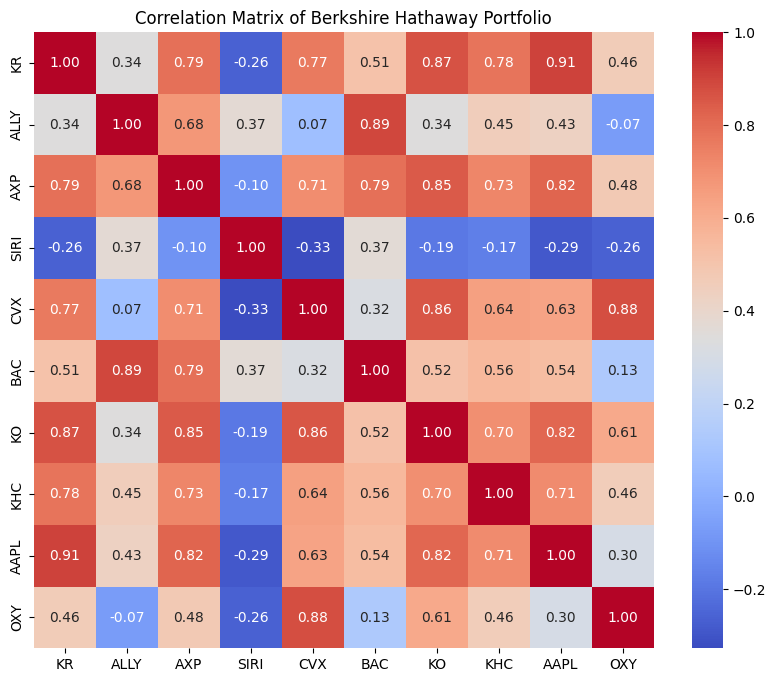

In [119]:
# Assuming BH_portifolio is your DataFrame
correlation_matrix = BH_portifolio[['KR', 'ALLY', 'AXP', 'SIRI', 'CVX', 'BAC', 'KO', 'KHC', 'AAPL', 'OXY']].corr()

# Create the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Berkshire Hathaway Portfolio')
plt.show()


- The correlation matrix reveals that stocks within similar industries, such as American Express and Ally in financial services, Chevron and Occidental Petroleum in the energy/oil sector, and Kroger and Coca-Cola in the food and beverage industry, tend to have higher correlations, indicating that their prices likely move together.

- However, we also observe some interestingly strong correlations between stocks from different industries, such as Kroger and Apple, or American Express and Coca-Cola. These correlations could be driven by factors such as macroeconomic trends, consumer behavior, or market sentiment, even though the companies are in different sectors. But it’s important to remember that correlation doesn’t imply causation.


###Dividends

- We decided to also import dividends data from yahoo finance, not only to focus on companies that provide high returns to Berkshire Hathaway through price fluctuations but also to consider those that offer more standardized returns, the dividends paid by these companies.


In [120]:
# Create a new column 'Quarter' to store the quarter labels and later match them with the df with closing prices
merged_df['Quarter'] = merged_df['Date'].dt.to_period('Q').astype(str)

# Drop the 'Date' column from the DataFrame
merged_df = merged_df.drop('Date', axis=1) # Specify the column label 'Date' and axis=1 to indicate column dropping.

merged_df

,BAC,KO,KHC,AAPL,OXY,AXP,SIRI,CVX,KR,ALLY,Quarter
0,896167600,400000000,325634818,249589329,0,151610700,137915729,0,0,0,2019Q1
1,927248600,400000000,325634818,249589329,0,151610700,137915729,0,0,0,2019Q2
2,927248600,400000000,325634818,248894679,7467508,151610700,136275729,0,0,0,2019Q3
3,925008600,400000000,325634818,245155566,18933054,151610700,136275729,0,18940079,0,2019Q4
4,925008600,400000000,325634818,245155566,18933054,151610700,132418729,0,18940079,0,2020Q1
5,915208600,400000000,325634818,245155566,18933054,151610700,50000000,0,21940079,0,2020Q2
6,1010100606,400000000,325634818,944295554,18933054,151610700,50000000,44272770,24879439,0,2020Q3
7,1010100606,400000000,325634818,887135554,18933054,151610700,50000000,48498965,33534017,0,2020Q4
8,1010100606,400000000,325634818,887135554,18933054,151610700,43658800,23672271,51060296,0,2021Q1
9,1010100606,400000000,325634818,887135554,18933054,151610700,43658800,23123920,61878910,0,2021Q2


In [160]:
# Create an empty dictionary to store dividend data
dividends_data = {}

# Define the stocks in the portfolio
stocks = ['BAC', 'KO', 'KHC', 'OXY', 'AAPL', 'AXP', 'SIRI', 'CVX', 'KR', 'ALLY']

# Specify the date range
start_date = '2019-01-01'
end_date = '2023-12-31'

# Loop through each stock and fetch dividend data
for stock in stocks:
    try:
        ticker = yf.Ticker(stock)
        dividends = ticker.dividends[start_date:end_date]
        dividends_data[stock] = dividends
    except Exception as e:
        print(f"Error fetching data for {stock}: {e}")

# Create a DataFrame for dividends
dividends_df = pd.DataFrame(dividends_data)

# Resample to quarterly frequency and sum dividends
quarterly_dividends = dividends_df.resample('QE').sum()

# Relabel all quarters in the index
quarterly_dividends.index = quarterly_dividends.index.map(lambda x: str(x.year) + 'Q' + str(x.quarter))

# Display the quarterly dividends
quarterly_dividends

,BAC,KO,KHC,OXY,AAPL,AXP,SIRI,CVX,KR,ALLY
Date,,,,,,,,,,
2019-01-03 00:00:00-05:00,NaN,NaN,NaN,NaN,NaN,0.39,NaN,NaN,NaN,NaN
2019-01-31 00:00:00-05:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.17
2019-02-08 00:00:00-05:00,NaN,NaN,NaN,NaN,0.1825,NaN,0.012,NaN,NaN,NaN
2019-02-14 00:00:00-05:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.19,0.14,NaN
2019-02-28 00:00:00-05:00,0.15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


- The code "resamples" dividends quarterly for the purpose of relabeling the date column with the respective quarters for later use. However, most of the companies here actually pay dividends on a quarterly basis, so the available data will almost always be quarterly.


In [123]:
cols_to_plot = [col for col in quarterly_dividends.columns if col != 'Quarter']


fig = px.box(quarterly_dividends, y=cols_to_plot, title='Box Plots of Dividends')
fig.show()


- We can see that Occidental Petroleum is the one that varies the most in terms of the amount they pay in dividends per stock, while Apple, Coca-Cola, and Bank of America have the least variation, likely because they maintain consistent dividend payments to shareholders over the long term.


In [124]:
# Create the bar plot using Plotly Express
fig = px.bar(quarterly_dividends,
             x=quarterly_dividends.index,  # Use the date index for x-axis
             y=quarterly_dividends.columns,  # Use company names for y-axis
             labels={'value': 'Dividends Paid', 'variable': 'Company', 'x': 'Quarter'}, #Added labels for clarification
             title='Dividends Paid per Company Over Quarters',
             barmode='group',  # Group bars for each company
             width=1400, height=700)

fig.update_xaxes(tickangle=-45, title_text='Quarter') #rotate x-axis for better visualization
fig.show()


- When looking at the dividend value paid per share, Chevron pays the highest amount per share, followed by Occidental Petroleum initially. However, as seen in the boxplot showing the variation in dividend payments, the amount paid by Occidental Petroleum fluctuated significantly starting from Q2 2020(it was reduced). In recent years, American Express has become the second-highest payer of dividends(in this portifolio).


In [125]:
# Create a copy of merged_df to avoid altering the original
merged_df_dividends = merged_df.copy()

quarterly_dividends['Quarter'] = quarterly_dividends.index

# Convert the 'Quarter' column in merged_df_dividends to string type for matching
merged_df_dividends['Quarter'] = merged_df_dividends['Quarter'].astype(str)

# Iterate through the rows of the merged_df_dividends
for index, row in merged_df_dividends.iterrows():
    quarter = row['Quarter']
    # Iterate through the columns of merged_df_dividends, excluding the 'Quarter' column
    for column in merged_df_dividends.columns:
        if column != 'Quarter' and column in quarterly_dividends.columns:  # Check if the column exists in both dataframes
            if quarter in quarterly_dividends.index:
              # Multiply values based on column name and quarter
                merged_df_dividends.loc[index, column] = row[column] * quarterly_dividends.loc[quarter, column]
            else:
              print(f"Warning: Quarter '{quarter}' not found in quarterly_dividends for stock {column}")
              #Handle the missing quarter case as needed, e.g., set to zero
              merged_df_dividends.loc[index, column] = 0
        elif column != 'Quarter':
           print(f"Warning: Stock {column} not found in quarterly_dividends.")
           #Handle the missing stock case as needed, e.g., set to zero
           merged_df_dividends.loc[index, column] = 0

#Display the updated dataframe
merged_df_dividends

<ipython-input-125-71e0d0271316>:17: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '130253927.2' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

<ipython-input-125-71e0d0271316>:17: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '45550052.5425' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

<ipython-input-125-71e0d0271316>:17: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1654988.7480000001' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

<ipython-input-125-71e0d0271316>:17: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '5899331.32' has dtyp

,BAC,KO,KHC,AAPL,OXY,AXP,SIRI,CVX,KR,ALLY,Quarter
0,1.344251e+08,160000000,130253927.2,4.555005e+07,0.00,59128173,1.654989e+06,0.000000e+00,0.00,0,2019Q1
1,1.390873e+08,160000000,130253927.2,4.804595e+07,0.00,59128173,1.654989e+07,0.000000e+00,0.00,0,2019Q2
2,1.669047e+08,160000000,130253927.2,4.791223e+07,5899331.32,59128173,1.635309e+07,0.000000e+00,0.00,0,2019Q3
3,1.665015e+08,160000000,130253927.2,4.719245e+07,14957112.66,65192601,1.771584e+06,0.000000e+00,3030412.64,0,2019Q4
4,1.665015e+08,164000000,130253927.2,4.719245e+07,14957112.66,65192601,1.721443e+06,0.000000e+00,3030412.64,0,2020Q1
5,1.647375e+08,164000000,130253927.2,5.025689e+07,189330.54,65192601,6.500000e+06,0.000000e+00,3510412.64,0,2020Q2
6,1.818181e+08,164000000,130253927.2,1.935806e+08,189330.54,65192601,6.500000e+06,5.711187e+07,4478299.02,0,2020Q3
7,1.818181e+08,164000000,130253927.2,1.818628e+08,189330.54,65192601,7.500000e+05,6.256366e+07,6036123.06,0,2020Q4
8,1.818181e+08,168000000,130253927.2,1.818628e+08,189330.54,130385202,6.548820e+06,3.053723e+07,9190853.28,0,2021Q1
9,1.818181e+08,168000000,130253927.2,1.951698e+08,189330.54,0,6.548820e+06,3.098605e+07,11138203.80,0,2021Q2


- We created a new df by multiplying the number of shares held by Berkshire Hathaway in each company with the dividend paid per share over time. This allows us to see where Berkshire Hathaway was receiving the highest total amount of dividends, taking into account both the number of shares they held and the dividend payments for each stock.


In [126]:
fig = px.bar(merged_df_dividends, x='Quarter', y=merged_df_dividends.columns.drop('Quarter'),
             labels={'value': 'Value', 'variable': 'Stock', 'Quarter': 'Quarter'},
             title='Total Dividends Over Quarters',
             barmode='group',
             width=1400, height=700)

fig.update_xaxes(tickangle=-45)
fig.show()


- Even though Chevron was one of the highest dividend payers in 2022, Bank of America dominates as the most valuable stock in terms of dividend returns. This is likely due to an increase in the number of shares held, as we don't see significant changes in the dividend price paid during this period. Bank of America is followed by Apple, Chevron, and Coca-Cola, at least for the most recent quarter available (Q4 2023).

- Additionally, we don't observe a drastic change in the dividend paid per share for Apple and Coca-Cola, so the higher total dividends received can be attributed to the increased number of shares held in these companies.


##Modeling

In [127]:
from pyomo.environ import *

In [128]:
# Create an empty DataFrame
df_model1 = pd.DataFrame()

def fetch_stock_data(ticker, start_date, end_date):
    stock_data = yf.download(ticker, start=start_date, end=end_date)
    # Check if 'Adj Close' column exists, if not, try 'Close'
    if 'Adj Close' in stock_data.columns:
        return stock_data['Adj Close']  # Select 'Adj Close' if it exists
    else:
        return stock_data['Close']  # Otherwise, select 'Close'

def main():
    # List of stock tickers
    stocks = ['BAC', 'KO', 'KHC', 'AAPL', 'OXY', 'AXP', 'SIRI', 'CVX', 'KR', 'ALLY']

    # Date range
    start_date = '2019-01-01'
    end_date = '2024-01-01'

    # Fetch data for each stock and add to the DataFrame
    for stock in stocks:
        df_model1[stock] = fetch_stock_data(stock, start_date, end_date)

    # Display the DataFrame
    print(df_model1)

# Run the main function if this script is executed
if __name__ == "__main__":
    main()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

                  BAC         KO        KHC        AAPL        OXY  \
Date                                                                 
2019-01-02  21.551334  38.957542  32.702442   37.667179  54.141850   
2019-01-03  21.205959  38.716812  32.679790   33.915257  53.478172   
2019-01-04  22.086664  39.488831  33.570175   35.363071  55.198479   
2019-01-07  22.069393  38.974140  34.204002   35.284363  56.307518   
2019-01-08  22.026224  39.414116  34.234173   35.956997  56.752872   
...               ...        ...        ...         ...        ...   
2023-12-22  32.600403  56.591599  34.690617  192.444595  59.840942   
2023-12-26  33.019737  56.824490  34.824188  191.897858  60.460899   
2023-12-27  33.000233  56.970043  34.843273  191.997253  60.067272   
2023-12-28  33.039242  57.008858  35.053173  192.424698  59.014324   
2023-12-29  32.834446  57.183525  35.282146  191.380966  58.758469   

                   AXP       SIRI         CVX         KR       ALLY  
Date               

In [129]:
df_model1.head(10)

,BAC,KO,KHC,AAPL,OXY,AXP,SIRI,CVX,KR,ALLY
Date,,,,,,,,,,
2019-01-02,21.551334,38.957542,32.702442,37.667179,54.141850,87.825089,54.583805,84.231575,23.834393,18.921562
2019-01-03,21.205959,38.716812,32.679790,33.915257,53.478172,86.110794,54.953857,82.618340,23.878046,18.739626
2019-01-04,22.086664,39.488831,33.570175,35.363071,55.198479,89.990997,57.081707,84.330521,24.148693,19.368137
2019-01-07,22.069393,38.974140,34.204002,35.284363,56.307518,90.479469,57.544270,85.426323,24.375683,19.740290
2019-01-08,22.026224,39.414116,34.234173,35.956997,56.752872,90.921883,58.746975,85.053436,24.847136,19.922224
2019-01-09,22.242086,38.658699,34.053093,36.567604,57.442738,91.087791,56.064041,86.194878,24.489182,20.038002
2019-01-10,22.216185,39.073769,34.407722,36.684483,57.800793,90.562408,56.156563,86.331856,24.864599,20.071083
2019-01-11,22.475214,39.297897,34.415272,36.324314,57.826981,90.829697,56.156563,85.639381,24.820950,20.443228
2019-01-14,22.768780,39.140171,34.898190,35.778111,57.268105,90.728325,55.046371,85.015388,24.707447,20.434956


###Return for each stock

In [130]:
df_return = df_model1.mean()

In [131]:
df_return

,0
BAC,29.950576
KO,49.777421
KHC,30.216788
AAPL,120.843221
OXY,41.733307
AXP,134.175509
SIRI,54.711397
CVX,109.024037
KR,35.575069
ALLY,29.593334


**1. Highest Return: AXP, AAPL, CVX**

These stocks have had the strongest performance over the given period (2019-2024), making them the main contributors to Berkshire's porfolio returns.

**2. Lowest Return: BAC, KHC, KR, ALLY**

Even though they underperformed comparing them to the rest of the portfolio, they may be less volatile and serve as a strategy for this portfolio.

**Risk-Return Analysis**


Comparing these results with the previous Risk-Return Trade-Off graph we can see that:

1. High Risk, High return

- AAPL (Apple) and AXP (American Express) exhibit high returns but also moderate-to-high risk levels. Apple, in particular, has the highest return among all stocks but comes with significant volatility.

- OXY (Occidental Petroleum) stands out with high volatility but relatively low returns, indicating a poor risk-return balance compared to other assets.


2. Low Risk, Low Return

- KO (Coca-Cola) and KHC (Kraft Heinz) are positioned at the lower end of the risk spectrum, with low annualized volatility but also relatively lower returns. These stocks act as stabilizers in the portfolio.

3. Underperformers

- SIRI (Sirius XM) has low returns and relatively high risk, making it an unfavorable choice for maximizing returns in a risk-efficient manner.
- KHC (Kraft Heinz) also falls in a low return category, though with moderate risk.

**Buffett's Strategy**

- Buffett’s portfolio prioritizes a mix of high-return growth stocks (AAPL, AXP) with low-risk, stable assets (KO, BAC) to balance performance.
- The weighted portfolio enhances returns while keeping risk controlled, making it a better alternative than the original portfolio allocation.

###Covariance

In [132]:
df_cov = df_model1.cov()

In [133]:
df_cov

,BAC,KO,KHC,AAPL,OXY,AXP,SIRI,CVX,KR,ALLY
BAC,38.911399,22.252811,17.586337,155.551227,15.048710,143.445470,17.215828,63.676731,29.917696,50.706446
KO,22.252811,47.760450,24.517093,263.177622,78.583030,170.603648,-9.917093,191.273395,56.597592,21.269964
KHC,17.586337,24.517093,25.481922,167.084571,42.791777,107.219484,-6.419873,104.861885,37.184579,20.747351
AAPL,155.551227,263.177622,167.084571,2165.871168,255.505793,1111.393322,-101.064039,953.903055,398.262501,183.681859
OXY,15.048710,78.583030,42.791777,255.505793,342.140943,259.088454,-36.404158,524.456706,81.201702,-12.332804
AXP,143.445470,170.603648,107.219484,1111.393322,259.088454,849.142246,-22.420488,666.292323,217.699346,179.513986
SIRI,17.215828,-9.917093,-6.419873,-101.064039,-36.404158,-22.420488,56.885206,-79.754476,-18.665513,25.511467
CVX,63.676731,191.273395,104.861885,953.903055,524.456706,666.292323,-79.754476,1043.214571,234.007316,21.435747
KR,29.917696,56.597592,37.184579,398.262501,81.201702,217.699346,-18.665513,234.007316,89.340971,28.970986
ALLY,50.706446,21.269964,20.747351,183.681859,-12.332804,179.513986,25.511467,21.435747,28.970986,82.964440


###Building the model

In [134]:
m = ConcreteModel()

####Decision Variables

In [135]:
m.BAC = Var(domain=NonNegativeReals, bounds=(0,1))
m.KO = Var(domain=NonNegativeReals, bounds=(0,1))
m.KHC = Var(domain=NonNegativeReals, bounds=(0,1))
m.AAPL = Var(domain=NonNegativeReals, bounds=(0,1))
m.OXY = Var(domain=NonNegativeReals, bounds=(0,1))
m.AXP = Var(domain=NonNegativeReals, bounds=(0,1))
m.SIRI = Var(domain=NonNegativeReals, bounds=(0,1))
m.CVX = Var(domain=NonNegativeReals, bounds=(0,1))
m.KR = Var(domain=NonNegativeReals, bounds=(0,1))
m.ALLY = Var(domain=NonNegativeReals, bounds=(0,1))

####Objective Function

In [136]:
df_return.head(10)

,0
BAC,29.950576
KO,49.777421
KHC,30.216788
AAPL,120.843221
OXY,41.733307
AXP,134.175509
SIRI,54.711397
CVX,109.024037
KR,35.575069
ALLY,29.593334


MAX(Return = 30 * BAC + 50 * KO + 30 * KHC + 120 * AAPL + 41 * OXY + 134 * AXP + 54 * SIRI + 109 * CVX + 36 * KR + 30 * ALLY)

In [137]:
m.objective = Objective(expr = df_return[0]*m.BAC +
                        df_return[1]*m.KO+
                        df_return[2]*m.KHC+
                        df_return[3]*m.AAPL+
                        df_return[4]*m.OXY+
                        df_return[5]*m.AXP+
                        df_return[6]*m.SIRI+
                        df_return[7]*m.CVX+
                        df_return[8]*m.KR+
                        df_return[9]*m.ALLY, sense=maximize)

<ipython-input-137-c207f7b4ad6f>:1: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

<ipython-input-137-c207f7b4ad6f>:2: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

<ipython-input-137-c207f7b4ad6f>:3: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

<ipython-input-137-c207f7b4ad6f>:4: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consisten

####Constraints

1. Risk: No more than 5%
2. Sum of the all the stocks = 1
3. Return: More than 1%

1. Risk (<= 0.15)

This aligns with Buffett's generally risk-averse strategy while still allowing some exposure to high-growth stocks.

2. Sum proportion (=1)

The sum of all weights (swtock allocation) shoud equal 1 (100%)

3. Minimum return (>=1)

Stablishing a minimum return threshold for the portfolio, at least 1% annual return, avoiding allocations that may be too conservative or overly focused on minimizing risk.

In [138]:
m.total_risk = Constraint(expr = m.BAC + m.KO + m.KHC + m.AAPL + m.OXY + m.AXP + m.SIRI + m.CVX + m.KR + m.ALLY <= 0.15) # risk is less than 5%
m.sum_proportion = Constraint(expr = m.BAC + m.KO + m.KHC + m.AAPL + m.OXY + m.AXP + m.SIRI + m.CVX + m.KR + m.ALLY == 1) # all stocks = 100
m.return_floor = Constraint(expr = m.objective >= 0.01) # min return = 1%

##MODEL 1

In the first model, we took a conservative approach by setting a lower maximum risk constraint. This meant that the optimization process prioritized low-volatility stocks, limiting the portfolio to only a few assets that met the strict risk threshold. As a result, the allocation was concentrated in certain stocks, and the proportions fluctuated sharply at different risk levels. This behavior indicated that only a few stocks were viable at lower risk levels, leading to a less diversified but safer portfolio.

**Stocks Prioritized in Model 1 (Lower Risk Tolerance)**

- KHC (Kraft Heinz Co.)

This stock had a relatively higher allocation in the low-risk scenario, likely due to its low volatility and stable returns.

- KO (Coca-Cola Co.)

Another low-volatility stock, often favored in defensive portfolios.

- SIRI (Sirius XM Holdings Inc.)

While not as dominant as the others, this stock appeared frequently in the allocation.



Other stocks like AAPL, OXY, and CVX had either minimal or no allocation in the lowest risk scenarios, as their volatility likely exceeded the conservative threshold.


####Multiple Risks

In [139]:
def calc_risk(m):
  variables = [m.BAC, m.KO, m.KHC, m.AAPL, m.OXY, m.AXP, m.SIRI, m.CVX, m.KR, m.ALLY]
  tickers = ['BAC', 'KO', 'KHC', 'AAPL', 'OXY', 'AXP', 'SIRI', 'CVX', 'KR', 'ALLY']
  risk_exp = 0
  for i in range(len(variables)):
    for j in range(len(variables)):
      risk_exp += variables[i]*df_cov.at[tickers[i],tickers[j]]*variables[j]
  return risk_exp

In [140]:
expr_risk = calc_risk(m)

In [141]:
max_risk =  0.15

Multiple Risks - 1%, Start = 0, End = 5%

In [142]:
import numpy as np
risk_limits = np.arange(0.001, max_risk, 0.005) # take tiny steps
risk_limits

array([0.001, 0.006, 0.011, 0.016, 0.021, 0.026, 0.031, 0.036, 0.041,
       0.046, 0.051, 0.056, 0.061, 0.066, 0.071, 0.076, 0.081, 0.086,
       0.091, 0.096, 0.101, 0.106, 0.111, 0.116, 0.121, 0.126, 0.131,
       0.136, 0.141, 0.146])

Why these values?

- 0.001: Thus is the lowest risk level, representing a very conservative portfolio.

- 0.15: this is the highest allowed risk level

- Step of 0.005: small incremental steps to allow smooth testing of different risk levels.

In [143]:
%matplotlib inline
from pylab import *

import shutil
import sys
import os.path

if not shutil.which("pyomo"):
    !pip install -q pyomo
    assert(shutil.which("pyomo"))

if not shutil.which("ipopt"):
    # here is the IPOPT zip file
    !gdown 10XRvLZqrpSNiXVAN-pipU52BVRwoGcNQ
    !unzip -o -q ipopt-linux64_dw
    assert(shutil.which("ipopt") or os.path.isfile("ipopt"))

from pyomo.environ import *

SOLVER = 'ipopt'
EXECUTABLE = '/content/ipopt'
ipopt_executable = '/content/ipopt'

Downloading...
From: https://drive.google.com/uc?id=10XRvLZqrpSNiXVAN-pipU52BVRwoGcNQ
To: /content/ipopt-linux64_dw.zip
100% 1.82M/1.82M [00:00<00:00, 15.4MB/s]


In [144]:
param_analysis = {} #paramater analysis --- risk vs return
returns = {} #{} dict --
for r in risk_limits:
  m.del_component(m.total_risk)
  m.total_risk = Constraint(expr = expr_risk <= r)
param_analysis = {} #paramater analysis --- risk vs return
returns = {} #{} dict --
for r in risk_limits:
  m.del_component(m.total_risk)
  m.total_risk = Constraint(expr = expr_risk <= r)
  result = SolverFactory('ipopt', executable=ipopt_executable).solve(m).write()
  param_analysis[r] = [m.BAC(), m.KO(), m.KHC(), m.AAPL(), m.OXY(), m.AXP(), m.SIRI(), m.CVX(), m.KR(), m.ALLY()]
  returns[r] =  m.BAC()*df_return[0] + m.KO()*df_return[1] + m.KHC()*df_return[2] +m.AAPL()*df_return[3] + m.OXY()*df_return[4] + m.AXP()*df_return[5] + m.SIRI()*df_return[6] + m.CVX()*df_return[7] + m.KR()*df_return[8] + m.ALLY()*df_return[9]

# for each risk value, we are calculating the return
# risk vs return

  - termination condition: maxIterations
  - message from solver: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.
  Termination condition: maxIterations
  Id: 400
  Error rc: 0
  Time: 1.9839980602264404
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of s

<ipython-input-144-302a1471834a>:13: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

  - termination condition: infeasible
  - message from solver: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.17446160316467285
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of

  - termination condition: maxIterations
  - message from solver: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.
  Termination condition: maxIterations
  Id: 400
  Error rc: 0
  Time: 1.4265179634094238
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of s

  - termination condition: maxIterations
  - message from solver: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.
  Termination condition: maxIterations
  Id: 400
  Error rc: 0
  Time: 1.5959498882293701
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of s

  - termination condition: infeasible
  - message from solver: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.26810526847839355
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of

  - termination condition: infeasible
  - message from solver: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 1.590667963027954
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of s

  - termination condition: infeasible
  - message from solver: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.03795886039733887
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of

  - termination condition: maxIterations
  - message from solver: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.
  Termination condition: maxIterations
  Id: 400
  Error rc: 0
  Time: 1.6055119037628174
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of s

  - termination condition: maxIterations
  - message from solver: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.
  Termination condition: maxIterations
  Id: 400
  Error rc: 0
  Time: 1.5750088691711426
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of s

  - termination condition: maxIterations
  - message from solver: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.
  Termination condition: maxIterations
  Id: 400
  Error rc: 0
  Time: 1.5596685409545898
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of s

  - termination condition: maxIterations
  - message from solver: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.
  Termination condition: maxIterations
  Id: 400
  Error rc: 0
  Time: 1.8991751670837402
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of s

  - termination condition: infeasible
  - message from solver: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.10996150970458984
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of

  - termination condition: maxIterations
  - message from solver: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.
  Termination condition: maxIterations
  Id: 400
  Error rc: 0
  Time: 1.6391193866729736
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of s

  - termination condition: infeasible
  - message from solver: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.5176026821136475
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of 

  - termination condition: infeasible
  - message from solver: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.19832634925842285
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of

  - termination condition: infeasible
  - message from solver: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.14250469207763672
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of

  - termination condition: infeasible
  - message from solver: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.19284749031066895
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of

  - termination condition: infeasible
  - message from solver: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.22550487518310547
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of

  - termination condition: maxIterations
  - message from solver: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.
  Termination condition: maxIterations
  Id: 400
  Error rc: 0
  Time: 1.6182715892791748
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of s

  - termination condition: infeasible
  - message from solver: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 1.2747917175292969
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of 

  - termination condition: infeasible
  - message from solver: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.27159619331359863
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of

  - termination condition: maxIterations
  - message from solver: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.
  Termination condition: maxIterations
  Id: 400
  Error rc: 0
  Time: 1.6022720336914062
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of s

  - termination condition: infeasible
  - message from solver: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.26938724517822266
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of

  - termination condition: maxIterations
  - message from solver: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.
  Termination condition: maxIterations
  Id: 400
  Error rc: 0
  Time: 1.3571596145629883
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of s

  - termination condition: infeasible
  - message from solver: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.2763400077819824
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of 

  - termination condition: infeasible
  - message from solver: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.2726268768310547
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of 

  - termination condition: infeasible
  - message from solver: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.1101837158203125
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of 

  - termination condition: maxIterations
  - message from solver: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.
  Termination condition: maxIterations
  Id: 400
  Error rc: 0
  Time: 1.7783594131469727
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of s

  - termination condition: infeasible
  - message from solver: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.2961859703063965
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of 

  - termination condition: maxIterations
  - message from solver: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 3
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.12.13\x3a Maximum Number of Iterations Exceeded.
  Termination condition: maxIterations
  Id: 400
  Error rc: 0
  Time: 1.8982067108154297
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of s

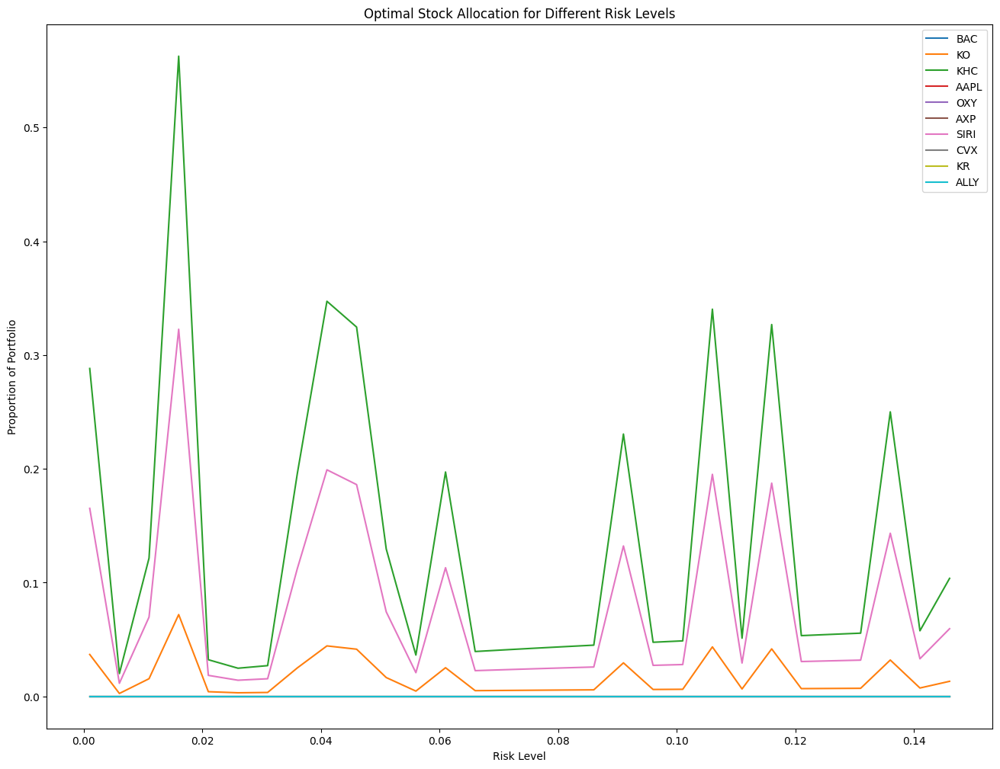

In [145]:
# generating the dataframe for proportions of the portfolio for each risk limit
param_analysis = pd.DataFrame.from_dict(param_analysis, orient='index')
param_analysis.columns = ['BAC', 'KO', 'KHC', 'AAPL', 'OXY', 'AXP', 'SIRI', 'CVX', 'KR', 'ALLY']
param_analysis.plot()
plt.title('Optimal Stock Allocation for Different Risk Levels')
plt.xlabel('Risk Level')
plt.ylabel('Proportion of Portfolio')
plt.show()

In [146]:
param_analysis.head(10)

,BAC,KO,KHC,AAPL,OXY,AXP,SIRI,CVX,KR,ALLY
0.001,0.0,0.036831,0.288207,0.0,0.0,0.0,0.165272,0.0,0.0,0.0
0.006,0.0,0.002563,0.020053,0.0,0.0,0.0,0.011500,0.0,0.0,0.0
0.011,0.0,0.015531,0.121536,0.0,0.0,0.0,0.069695,0.0,0.0,0.0
0.016,0.0,0.071910,0.562712,0.0,0.0,0.0,0.322686,0.0,0.0,0.0
0.021,0.0,0.004117,0.032219,0.0,0.0,0.0,0.018476,0.0,0.0,0.0
0.026,0.0,0.003164,0.024758,0.0,0.0,0.0,0.014197,0.0,0.0,0.0
0.031,0.0,0.003455,0.027034,0.0,0.0,0.0,0.015502,0.0,0.0,0.0
0.036,0.0,0.025006,0.195674,0.0,0.0,0.0,0.112209,0.0,0.0,0.0
0.041,0.0,0.044382,0.347295,0.0,0.0,0.0,0.199156,0.0,0.0,0.0
0.046,0.0,0.041484,0.324625,0.0,0.0,0.0,0.186155,0.0,0.0,0.0


In [147]:
# subset
risk = list(returns.keys()) # coerce dict_keys to a list
print(risk)
reward = list(returns.values()) # coerce dict_values to a list
print(reward)

[0.001, 0.006, 0.011, 0.016, 0.021, 0.026000000000000002, 0.031, 0.036000000000000004, 0.041, 0.046, 0.051000000000000004, 0.056, 0.061, 0.066, 0.07100000000000001, 0.076, 0.081, 0.08600000000000001, 0.091, 0.096, 0.101, 0.106, 0.111, 0.116, 0.121, 0.126, 0.131, 0.136, 0.14100000000000001, 0.146]
[19.584293118590935, 1.362672672041204, 8.258660826585613, 38.23747548859546, 2.1893645511446373, 1.6823522567670475, 1.8370074471500126, 13.296447115782854, 23.599433761967514, 22.058916989446654, 8.80387842538636, 2.4690140052982175, 13.401642820703497, 2.680410993655366, 2.780088022657655, 2.876312873554741, 2.9694211498038943, 3.059697404511277, 15.668470894842779, 3.232695531480877, 3.3158115915248803, 23.12602962120483, 3.476086670960762, 22.208906166805576, 3.629290626834531, 3.7035167462429786, 3.7762841734504518, 16.994075726740185, 3.9177664562397645, 7.049704195969799]


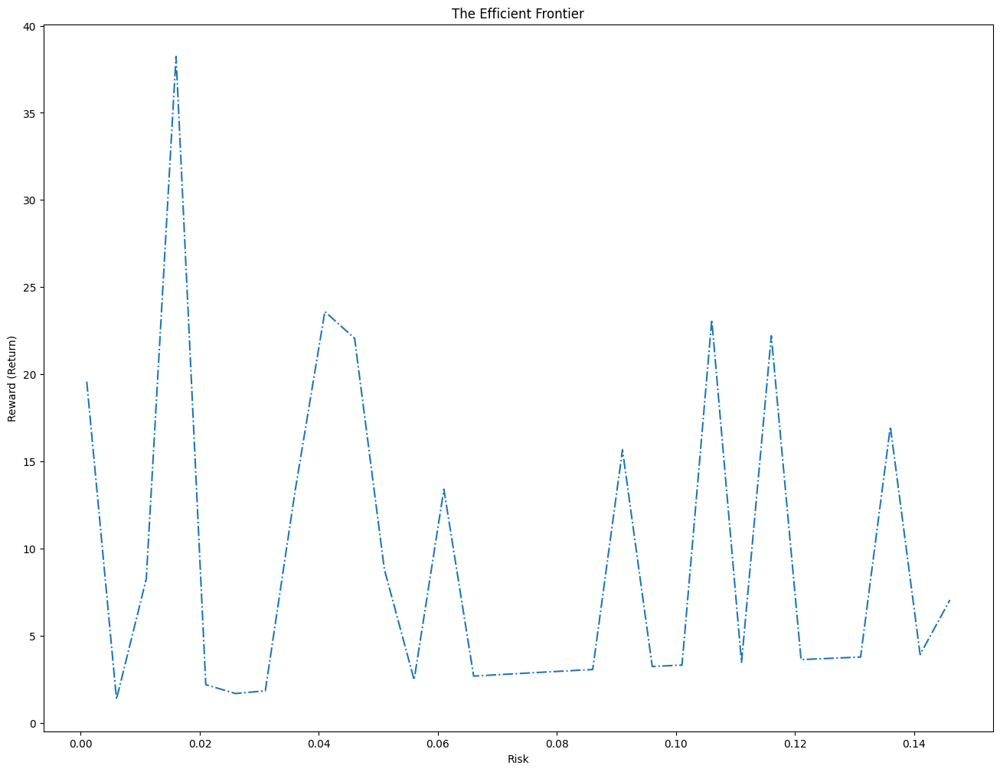

In [148]:
from pylab import *
plot(risk, reward, '-.')
title('The Efficient Frontier')
xlabel('Risk')
ylabel('Reward (Return)')
plt.show()

**Model Results**


**1. Optimal Stock Allocation**

- Certain Stocks like AAPL (Apple) and AXP (American Express), tend to have higher propotions in the portfolio, suggesting they offer favorable return-to-risk characteristics.

- Stocks like KO (Coca Cola) and KR (Kroger) have relatively stable lower allocations, indicating that they are low-volatility stocks that might be less favorable in a return-maximixing portfolio.

- On the other hand, OXY (Occidental Petroleum) and SIRI (Sirius XM) show spiky allocation, meaning they are highly sensitive to risk tolerance inside the portfolio.

**2. Efficient Frontier**

- The highest return observed (35%) comes at a higher risk level (0.14) meaning that an investor willing to take on higher risk might benefit from greater rewards, but with volatily too.

##MODEL 2

For the second model, we  adjusted the risk constraint to allow for higher exposure, allowing the portfolio to take on more risk. This gave the optimizer more flexibility, leading to a more diversified allocation across multiple stocks rather than just a few dominating the portfolio. The allocation curve was much smoother, showing that as risk tolerance increased, each stock received a more proportionate share of the portfolio. This model aligns with the idea that higher risk can lead to higher potential returns while still maintaining a structured investment strategy.

###Multiple Risks

In [149]:
# Define a new Pyomo model for Model 2
m2 = ConcreteModel()

# Define decision variables for Model 2
m2.BAC = Var(domain=NonNegativeReals, bounds=(0,1))
m2.KO = Var(domain=NonNegativeReals, bounds=(0,1))
m2.KHC = Var(domain=NonNegativeReals, bounds=(0,1))
m2.AAPL = Var(domain=NonNegativeReals, bounds=(0,1))
m2.OXY = Var(domain=NonNegativeReals, bounds=(0,1))
m2.AXP = Var(domain=NonNegativeReals, bounds=(0,1))
m2.SIRI = Var(domain=NonNegativeReals, bounds=(0,1))
m2.CVX = Var(domain=NonNegativeReals, bounds=(0,1))
m2.KR = Var(domain=NonNegativeReals, bounds=(0,1))
m2.ALLY = Var(domain=NonNegativeReals, bounds=(0,1))

In [150]:
def calc_risk_model2(m2):
  variables = [m2.BAC, m2.KO, m2.KHC, m2.AAPL, m2.OXY, m2.AXP, m2.SIRI, m2.CVX, m2.KR, m2.ALLY]
  tickers = ['BAC', 'KO', 'KHC', 'AAPL', 'OXY', 'AXP', 'SIRI', 'CVX', 'KR', 'ALLY']
  risk_exp = 0
  for i in range(len(variables)):
    for j in range(len(variables)):
      risk_exp += variables[i] * df_cov.at[tickers[i], tickers[j]] * variables[j]
  return risk_exp

In [151]:
expr_risk_model2 = calc_risk_model2(m2)

In [152]:
max_risk_model2 = 0.25

In [153]:
import numpy as np
risk_limits_model2 = np.arange(0.001, max_risk_model2, 0.005)  # Small increments
risk_limits_model2

array([0.001, 0.006, 0.011, 0.016, 0.021, 0.026, 0.031, 0.036, 0.041,
       0.046, 0.051, 0.056, 0.061, 0.066, 0.071, 0.076, 0.081, 0.086,
       0.091, 0.096, 0.101, 0.106, 0.111, 0.116, 0.121, 0.126, 0.131,
       0.136, 0.141, 0.146, 0.151, 0.156, 0.161, 0.166, 0.171, 0.176,
       0.181, 0.186, 0.191, 0.196, 0.201, 0.206, 0.211, 0.216, 0.221,
       0.226, 0.231, 0.236, 0.241, 0.246])

In [154]:
%matplotlib inline
from pylab import *

import shutil
import sys
import os.path

if not shutil.which("pyomo"):
    !pip install -q pyomo
    assert(shutil.which("pyomo"))

if not shutil.which("ipopt"):
    # Download IPOPT solver
    !gdown 10XRvLZqrpSNiXVAN-pipU52BVRwoGcNQ
    !unzip -o -q ipopt-linux64_dw
    assert(shutil.which("ipopt") or os.path.isfile("ipopt"))

from pyomo.environ import *

SOLVER = 'ipopt'
EXECUTABLE = '/content/ipopt'
ipopt_executable = '/content/ipopt'

Downloading...
From: https://drive.google.com/uc?id=10XRvLZqrpSNiXVAN-pipU52BVRwoGcNQ
To: /content/ipopt-linux64_dw.zip
100% 1.82M/1.82M [00:00<00:00, 19.3MB/s]


In [155]:
# Define total risk constraint initially
m2.total_risk = Constraint(expr = expr_risk_model2 <= risk_limits_model2[0])

# Create a dictionary to store the returns
returns_model2 = {}  # Initialize an empty dictionary

# Create lists to store the results temporarily
results_list = []

# Iterate over risk limits in Model 2
for r in risk_limits_model2:
    # Remove the previous risk constraint if it exists
    if hasattr(m2, 'total_risk'):
        m2.del_component(m2.total_risk)

    # Add the new risk constraint
    m2.total_risk = Constraint(expr = expr_risk_model2 <= r)

    # Solve Model 2
    result = SolverFactory('ipopt', executable=ipopt_executable).solve(m2).write()

    # Append the results to the list
    results_list.append([r, m2.BAC(), m2.KO(), m2.KHC(), m2.AAPL(),
                                m2.OXY(), m2.AXP(), m2.SIRI(), m2.CVX(),
                                m2.KR(), m2.ALLY()])

    # Store the returns in the dictionary
    returns_model2[r] = (m2.BAC()*df_return[0] + m2.KO()*df_return[1] + m2.KHC()*df_return[2] +
                         m2.AAPL()*df_return[3] + m2.OXY()*df_return[4] + m2.AXP()*df_return[5] +
                         m2.SIRI()*df_return[6] + m2.CVX()*df_return[7] + m2.KR()*df_return[8] +
                         m2.ALLY()*df_return[9])

# Create the DataFrame after the loop
param_analysis_model2 = pd.DataFrame(results_list, columns=['Risk Limit', 'BAC', 'KO', 'KHC', 'AAPL', 'OXY', 'AXP', 'SIRI', 'CVX', 'KR', 'ALLY'])
param_analysis_model2.set_index('Risk Limit', inplace=True)

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Message: Ipopt 3.12.13\x3a Optimal Solution Found
  Termination condition: optimal
  Id: 0
  Error rc: 0
  Time: 0.011885643005371094
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0
# ===

<ipython-input-155-cfaeebd43e23>:28: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

<ipython-input-155-cfaeebd43e23>:29: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

<ipython-input-155-cfaeebd43e23>:30: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

<ipython-input-155-cfaeebd43e23>:31: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consi

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1
  Number of variables: 10
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Message: Ipopt 3.12.13\x3a Optimal Solution Found
  Termination condition: optimal
  Id: 0
  Error rc: 0
  Time: 0.019167661666870117
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0
# ===

<Figure size 1000x500 with 0 Axes>

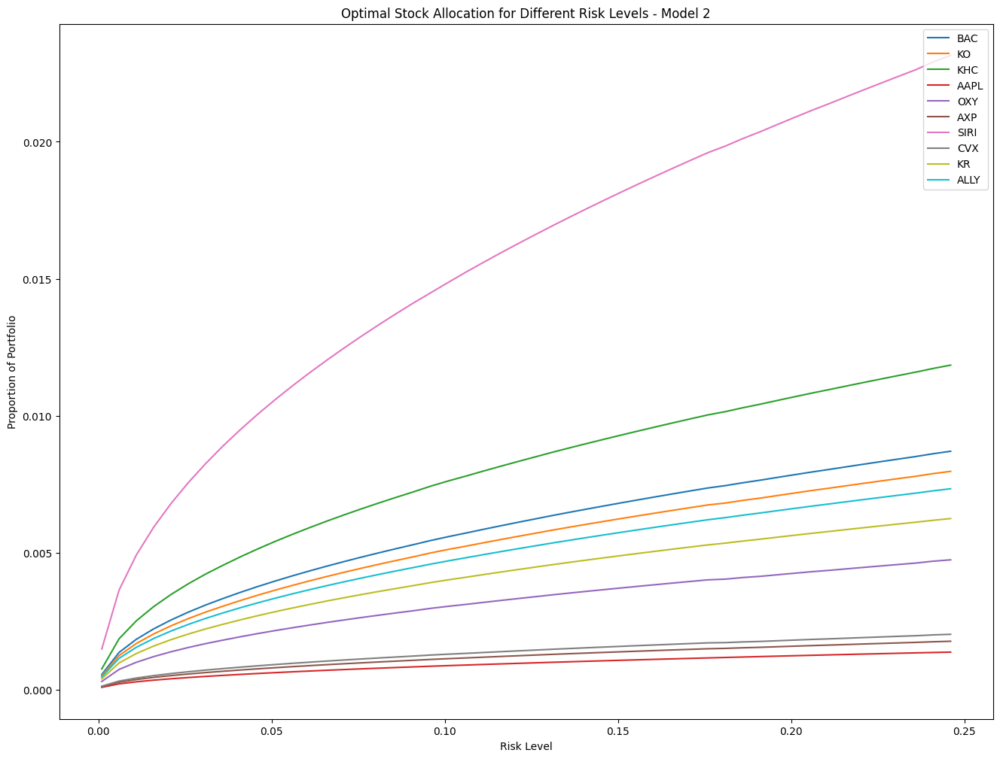

In [156]:
# Plot Model 2
plt.figure(figsize=(10,5))
param_analysis_model2.plot()
plt.title('Optimal Stock Allocation for Different Risk Levels - Model 2')
plt.xlabel('Risk Level')
plt.ylabel('Proportion of Portfolio')
plt.legend(loc='upper right')
plt.show()

In [157]:
param_analysis_model2.head(10)

,BAC,KO,KHC,AAPL,OXY,AXP,SIRI,CVX,KR,ALLY
Risk Limit,,,,,,,,,,
0.001,0.000556,0.000509,0.000760,0.000087,0.000302,0.000112,0.001486,0.000129,0.000399,0.000468
0.006,0.001361,0.001247,0.001860,0.000214,0.000740,0.000275,0.003637,0.000315,0.000977,0.001145
0.011,0.001842,0.001688,0.002517,0.000289,0.001002,0.000373,0.004922,0.000427,0.001322,0.001550
0.016,0.002222,0.002037,0.003035,0.000349,0.001209,0.000450,0.005935,0.000515,0.001595,0.001870
0.021,0.002546,0.002333,0.003477,0.000400,0.001385,0.000515,0.006798,0.000590,0.001827,0.002143
0.026,0.002833,0.002596,0.003868,0.000445,0.001542,0.000574,0.007562,0.000656,0.002033,0.002384
0.031,0.003093,0.002834,0.004223,0.000486,0.001683,0.000626,0.008255,0.000717,0.002220,0.002603
0.036,0.003329,0.003049,0.004543,0.000523,0.001810,0.000674,0.008897,0.000771,0.002389,0.002804
0.041,0.003554,0.003255,0.004849,0.000559,0.001933,0.000720,0.009493,0.000823,0.002550,0.002993


In [158]:
# Subset
risk_model2 = list(returns_model2.keys())  # Coerce dict_keys to a list
print(risk_model2)
reward_model2 = list(returns_model2.values())  # Coerce dict_values to a list
print(reward_model2)

[0.001, 0.006, 0.011, 0.016, 0.021, 0.026000000000000002, 0.031, 0.036000000000000004, 0.041, 0.046, 0.051000000000000004, 0.056, 0.061, 0.066, 0.07100000000000001, 0.076, 0.081, 0.08600000000000001, 0.091, 0.096, 0.101, 0.106, 0.111, 0.116, 0.121, 0.126, 0.131, 0.136, 0.14100000000000001, 0.146, 0.151, 0.156, 0.161, 0.166, 0.171, 0.17600000000000002, 0.181, 0.186, 0.191, 0.196, 0.201, 0.20600000000000002, 0.211, 0.216, 0.221, 0.226, 0.231, 0.23600000000000002, 0.241, 0.246]
[0.22650967917097048, 0.5546906691460177, 0.7508113174362797, 0.9055549286485555, 1.0373361236355483, 1.1542474390691833, 1.2601523757143644, 1.3567858043648944, 1.4481384758983689, 1.5341655949771678, 1.6155207626892825, 1.6928727353822397, 1.7667981513235027, 1.8379286880384986, 1.9061335682468499, 1.972057399796018, 2.0357467786562085, 2.0975026006861497, 2.15749075090498, 2.218145571760443, 2.2746505612042807, 2.328269698982192, 2.3824087089748684, 2.435347197664081, 2.4871590652997098, 2.5379114595479817, 2.58

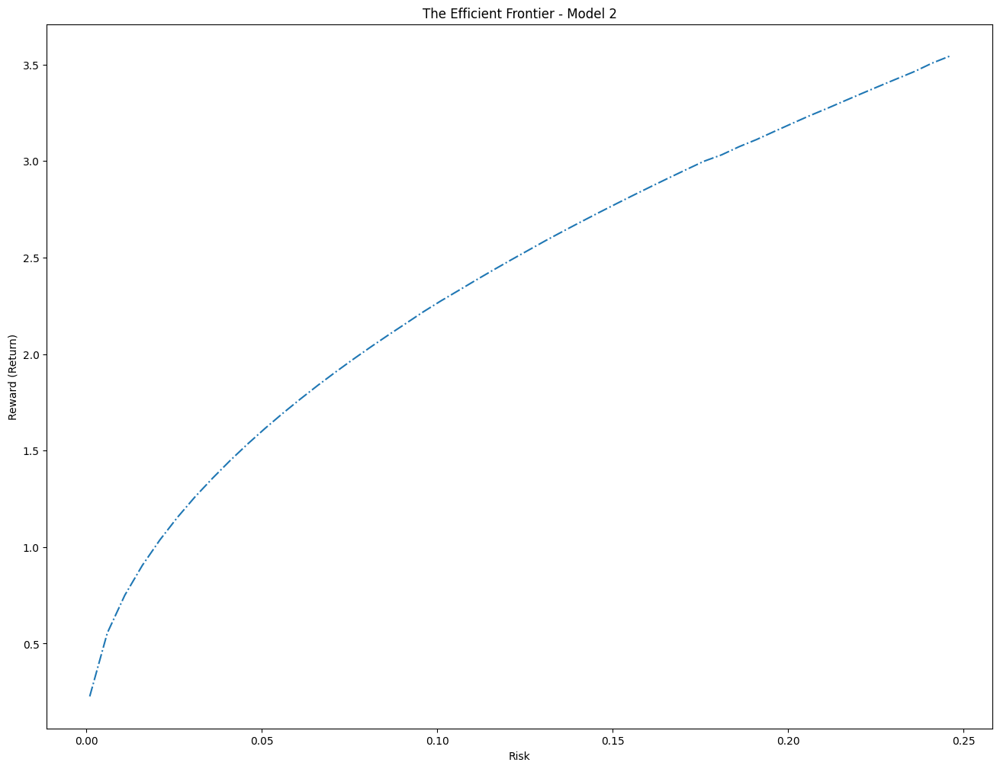

In [159]:
from pylab import *
plot(risk_model2, reward_model2, '-.')
title('The Efficient Frontier - Model 2')
xlabel('Risk')
ylabel('Reward (Return)')
plt.show()

**Model 2 results**

- Unlike Model 1, where allocations fluctuated erratically, Model 2 displays a clear upward trend, with stocks gradually increasing their share of the portfolio.

- This indicates that the optimizer found a more stable and balanced allocation strategy as risk tolerance increased

Improved Diversification

- A wider range of stocks received allocations, includign AAPL, OXY and CVX, which were excluded in Model 1

- This suggests that these higher-volatility stocks became viable options under the relaxed risk contraint, enhancing portfoio diversification

- Unlike Model 1, where certain stocks dominated the portfolio, here allocations are more eevnly distributed across assets, reducing concentration risk.

Relationship Between Risk and Return

- The graphs shows an upward-sloping curve, meaning that as risk increases, return increases consistently, which aligns with standard financial theory.

- Compairing it with Model 1, at highest risk levels
return values are significantly higher than in Model 1, demonstraiting that allowing more risk unlocks better return opportunities

- In Model 1, we observed points where taking on more risk didn't yield better returns. But in Model 2, this inefficiecy is largely resolved, making the model practical for real-world escenarios.

**Conclusion**

Comparing both models, MODEL 2 performs significantly better in taking into consideration aspects such as: diversification, allocation stability, and risk-return efficiency. By increasing risk tolerance, the optimizer had more flexibility to create a well-balanced portfolio, leading to higher returns and better feasibility.

Some point to take. into consideration for future testing:

- While higher risk leads to better returns, it also increases exposure to market volatility.

- Further analysis could explore an intermediate risk level to balance the trade-offs even more effectively.

#References
# 13F Forms:


**2019**

Q1 - https://www.sec.gov/Archives/edgar/data/1067983/000095012319002221/xslForm13F_X01/form13fInfoTable.xml

Q2 - https://www.sec.gov/Archives/edgar/data/1067983/000095012319008356/xslForm13F_X01/form13fInfoTable.xml

Q4 - https://www.sec.gov/Archives/edgar/data/1067983/000095012319011362/xslForm13F_X01/form13fInfoTable.xml

**2020**

Q1 -https://www.sec.gov/Archives/edgar/data/1067983/000095012320005345/xslForm13F_X01/form13fInfoTable.xml

Q2 - https://www.sec.gov/Archives/edgar/data/1067983/000095012320009058/xslForm13F_X01/960.xml

Q3 - https://www.sec.gov/Archives/edgar/data/1067983/000095012321002781/xslForm13F_X01/0000950123-21-002781-3281.xml
https://www.sec.gov/Archives/edgar/data/1067983/000095012320012127/xslForm13F_X01/0000950123-20-012127-1653.xml

Q4 - https://www.sec.gov/Archives/edgar/data/1067983/000095012321002786/xslForm13F_X01/0000950123-21-002786-3286.xml

**2021**

Q1- https://www.sec.gov/Archives/edgar/data/1067983/000095012321007024/xslForm13F_X01/0000950123-21-007024-4471.xml
Q2-https://www.sec.gov/Archives/edgar/data/1067983/000095012321011396/xslForm13F_X01/0000950123-21-011396-5309.xml
Q3-https://www.sec.gov/Archives/edgar/data/1067983/000095012321015518/xslForm13F_X01/0000950123-21-015518-6820.xml
Q4- https://www.sec.gov/Archives/edgar/data/1067983/000095012322002973/xslForm13F_X01/0000950123-22-002973-9815.xml

**2022**
Q1- https://www.sec.gov/Archives/edgar/data/1067983/000095012322006442/xslForm13F_X01/13095.xml
Q2 - https://www.sec.gov/Archives/edgar/data/1067983/000095012322009450/xslForm13F_X01/15796.xml
Q3 - https://www.sec.gov/Archives/edgar/data/1067983/000095012322012275/xslForm13F_X01/18337.xml
Q4 - https://www.sec.gov/Archives/edgar/data/1067983/000095012323002585/xslForm13F_X02/20651.xml

**2023**
Q1- https://www.sec.gov/Archives/edgar/data/1067983/000095012323005270/xslForm13F_X02/22815.xml
Q2- https://www.sec.gov/Archives/edgar/data/1067983/000095012323008074/xslForm13F_X02/25376.xml
Q3 - https://www.sec.gov/Archives/edgar/data/1067983/000095012323011029/xslForm13F_X02/28498.xml
Q4 - https://www.sec.gov/Archives/edgar/data/1067983/000095012324002518/xslForm13F_X02/30197.xml


**Information about Companies / Stocks:**

- Britannica money. (2025, March 3). https://www.britannica.com/money/American-Express-Company

- Company information. (n.d.). Sirius XM Holdings Inc. https://investor.siriusxm.com/company-information

- Cfa, N. M. (2023, July 21). Sirius XM stock swings wildly on short squeeze; no change to underlying business or valuation. Morningstar, Inc. https://www.morningstar.com/stocks/sirius-xm-shares-jump-short-squeeze-no-change-underlying-business-or-valuation

- Team, T. (2024, April 29). Down 45% year to date, What’s happening with Sirius Stock? Forbes. https://www.forbes.com/sites/greatspeculations/2024/04/29/down-45-year-to-date-whats-happening-with-sirius-stock/?utm_source=chatgpt.com

- Britannica money. (2025b, March 5). https://www.britannica.com/money/Chevron-Corporation

- Williams, S. (2025, March 7). The Nasdaq is falling: 4 of the safest stocks to buy right now. The Motley Fool. https://www.fool.com/investing/2025/03/07/nasdaq-falling-4-safe-stocks-to-buy-now/#:~:text=A%20fourth%20safe%20stock%20that,that%20it's%20a%20legal%20monopoly.

- The Kroger Co. (n.d.). History & leadership. Kroger. Retrieved March 7, 2025, from https://www.kroger.com/health/about/history-leadership

- The Kroger Co. (2021, December 2). Kroger reports third quarter 2021 results and raises full-year guidance. Kroger. Retrieved March 7, 2025, from https://ir.kroger.com/news/news-details/2021/Kroger-Reports-Third-Quarter-2021-Results-and-Raises-Full-Year-Guidance/default.aspx

- Kroger (KR) stock price, news & Analysis $KR. (2025, March 7). Kroger. https://www.marketbeat.com/stocks/NYSE/KR/

- Ally Financial. (n.d.). History of Ally | Ally. https://www.ally.com/about/history/

- Ally Financial. (n.d.-b). SEC filings, earnings, contacts & more | Ally. https://www.ally.com/about/investor/

- Ally Financial Inc (ALLY). (2025, March 6). Morningstar, Inc. https://www.morningstar.com/stocks/xnys/ally/quote

- Team, I. (2024, July 11). Warren Buffett’s investment strategy. Investopedia. https://www.investopedia.com/articles/01/071801.asp
